In [4]:
import pandas as pd
import numpy as np
from scipy.spatial import distance
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from kneed import KneeLocator


Species: UAM502, 745 spectra eliminated out of 11060


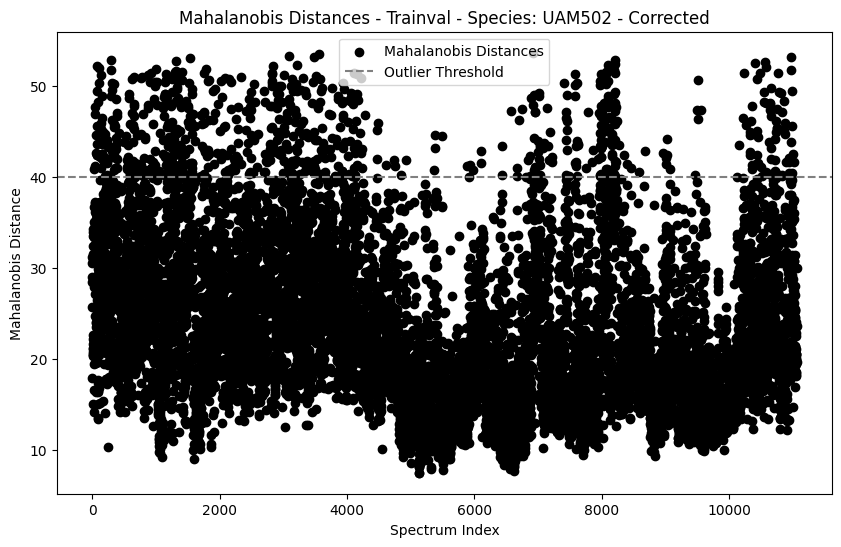

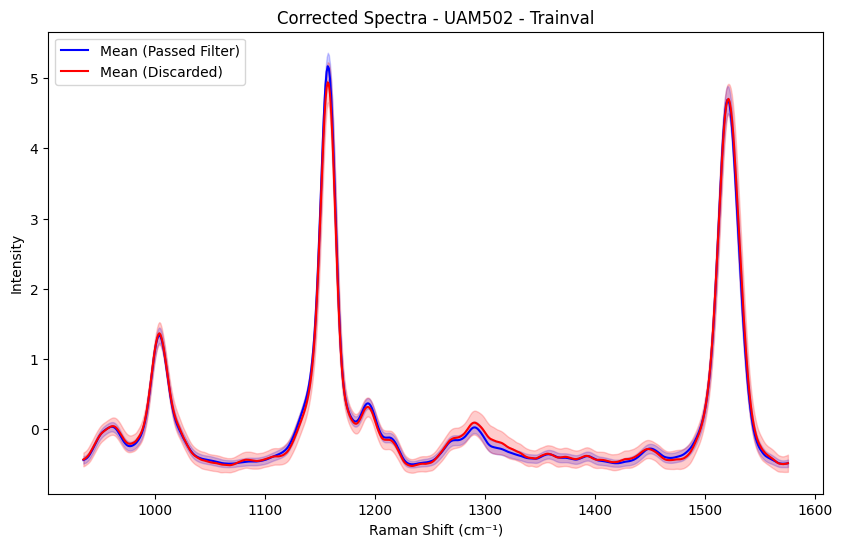

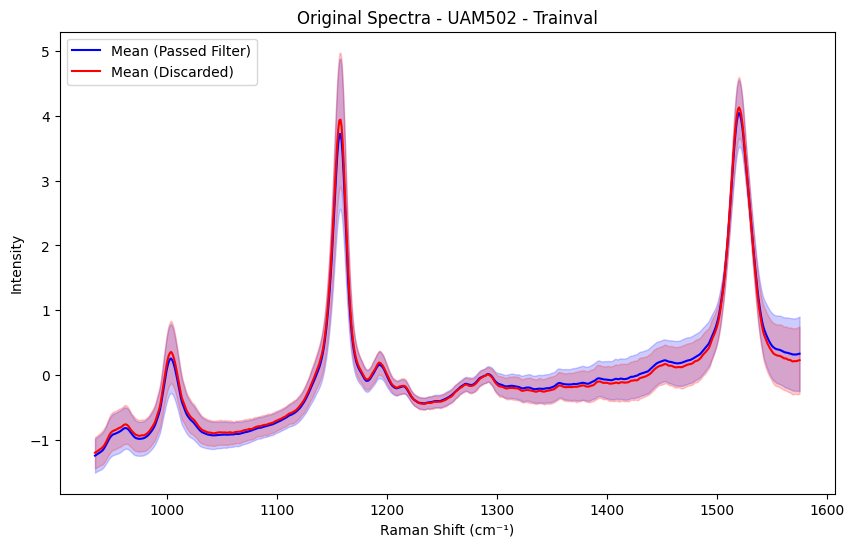

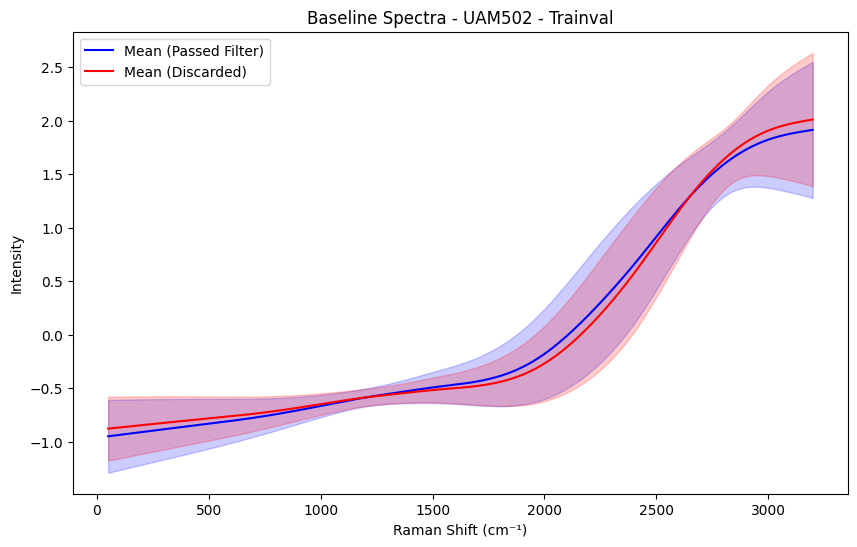

Species: UAM588, 716 spectra eliminated out of 10695


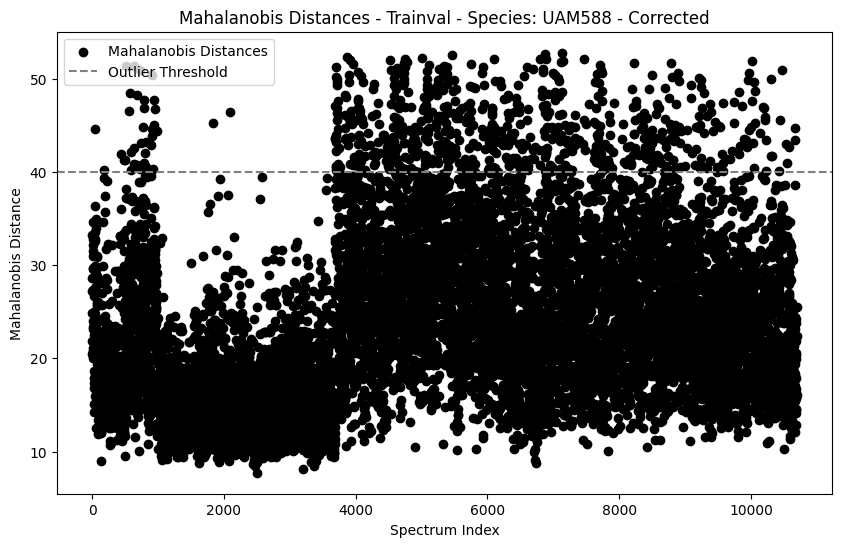

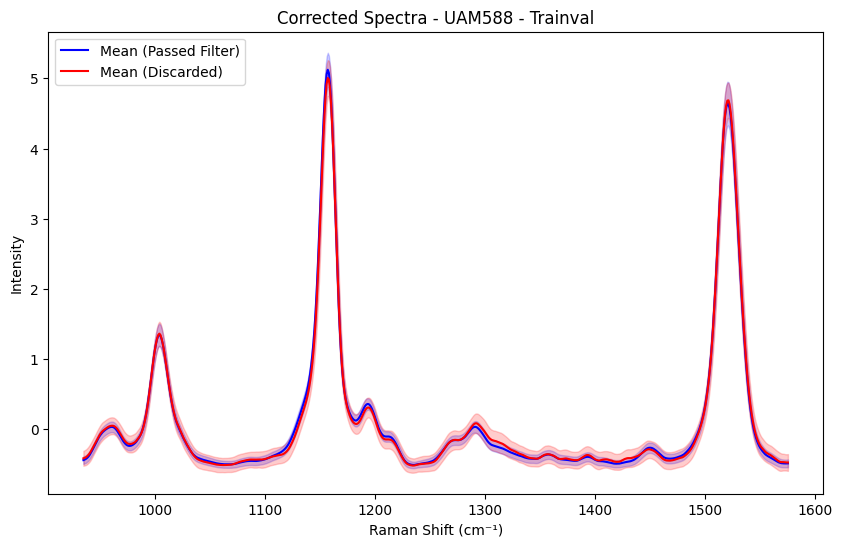

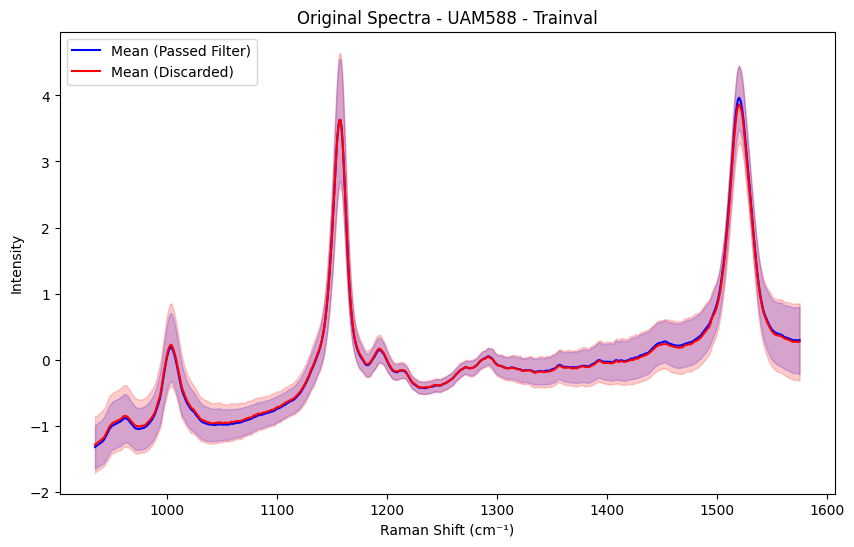

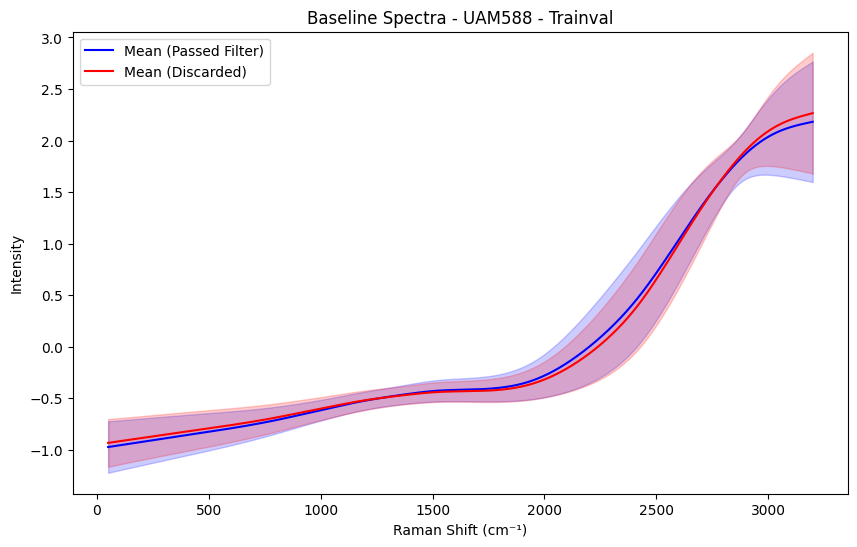

Species: UAM565, 642 spectra eliminated out of 8690


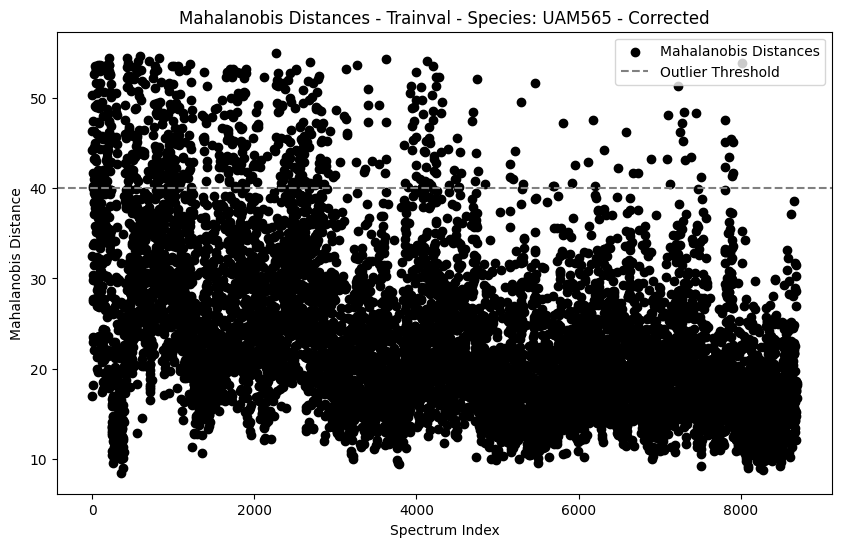

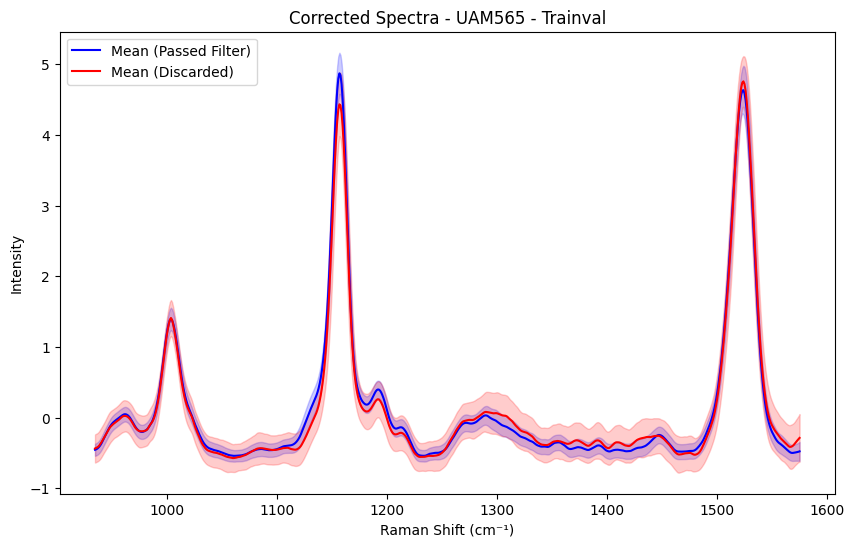

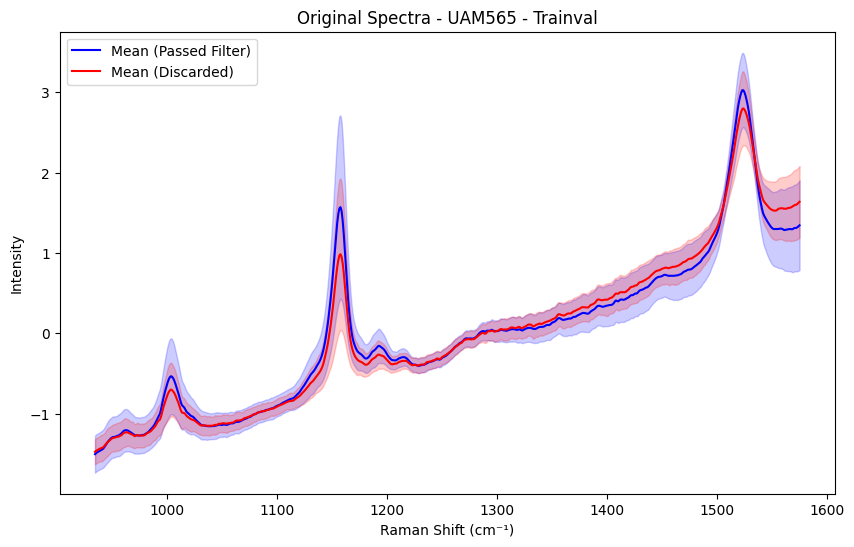

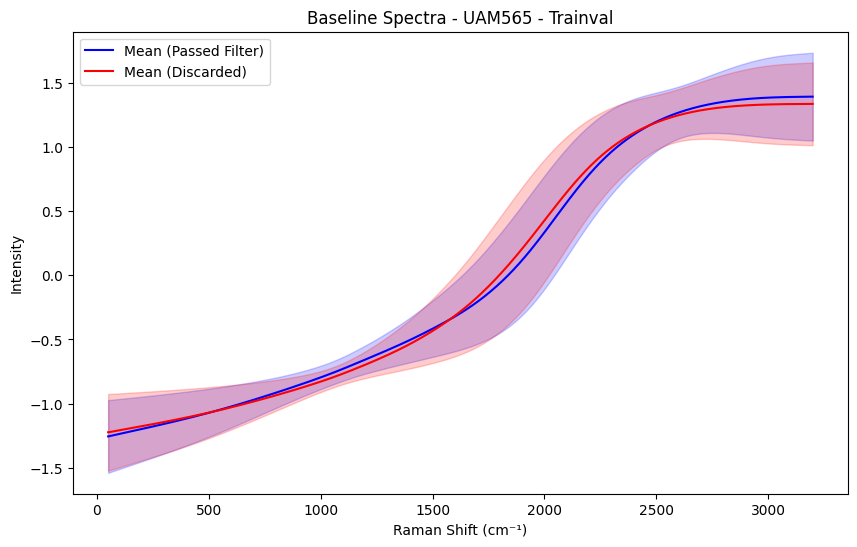

Species: UAM253, 269 spectra eliminated out of 8306


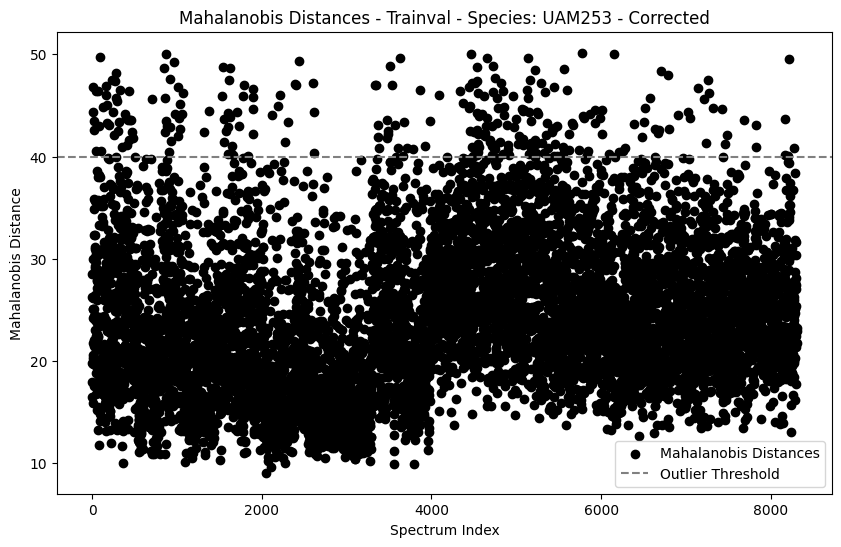

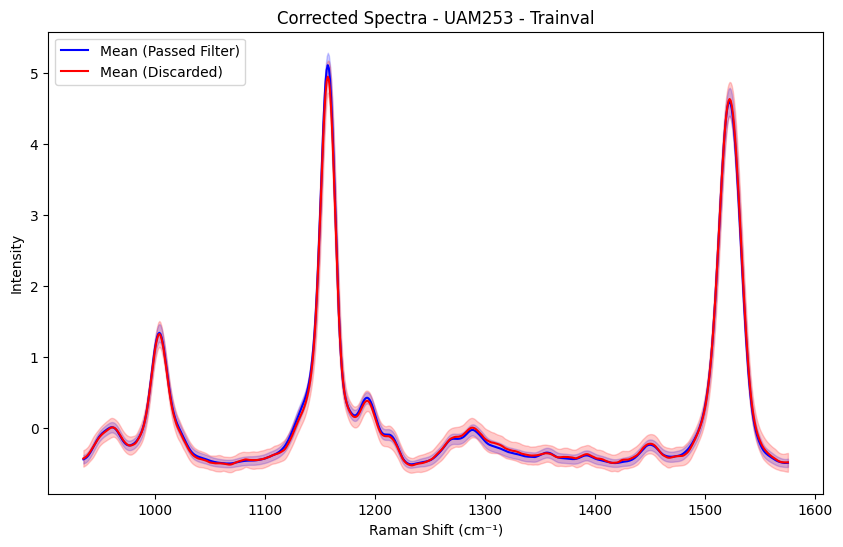

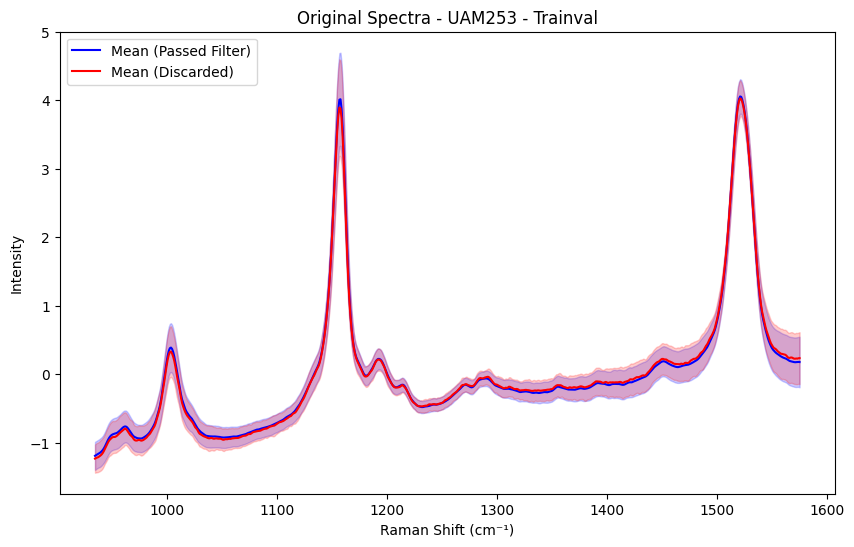

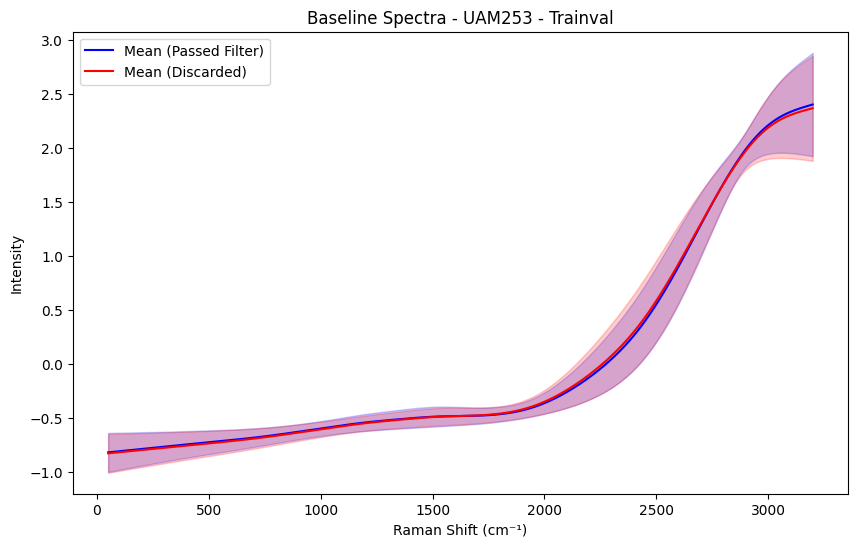

Filtering completed for trainval and test, and files saved.


In [2]:
# Function to plot the mean spectrum and standard deviation
def plot_mean_and_std(df_passed, df_outliers, title, raman_shifts):
    plt.figure(figsize=(10, 6))
    
    # Calculate the mean and standard deviation of spectra that pass the filter
    if not df_passed.empty:
        mean_passed = df_passed.mean(axis=0)
        std_passed = df_passed.std(axis=0)
        plt.plot(raman_shifts, mean_passed, color='blue', label='Mean (Passed Filter)')
        plt.fill_between(raman_shifts, mean_passed - std_passed, mean_passed + std_passed, color='blue', alpha=0.2)
    
    # Calculate the mean and standard deviation of discarded spectra
    if not df_outliers.empty:
        mean_outliers = df_outliers.mean(axis=0)
        std_outliers = df_outliers.std(axis=0)
        plt.plot(raman_shifts, mean_outliers, color='red', label='Mean (Discarded)')
        plt.fill_between(raman_shifts, mean_outliers - std_outliers, mean_outliers + std_outliers, color='red', alpha=0.2)

    plt.title(title)
    plt.xlabel("Raman Shift (cm⁻¹)")
    plt.ylabel("Intensity")
    plt.legend()
    plt.show()

# Function to compute the inverse covariance matrix and mean vector for a given species
def compute_mahalanobis_params(df, y, species):
    species_mask = (y == species)
    df_species = df[species_mask]
    
    # Exclude categorical columns to calculate Mahalanobis distance
    df_numeric = df_species.drop(columns=categorical_columns + coordinates_columns + names_column)
    
    # Calculate the covariance matrix and its inverse
    cov_matrix = np.cov(df_numeric.T)
    inv_cov_matrix = np.linalg.inv(cov_matrix)
    
    # Calculate the mean vector
    mean_vector = df_numeric.mean(axis=0)
    
    return inv_cov_matrix, mean_vector

# Function to apply the Mahalanobis filter to a DataFrame
def apply_mahalanobis_filter(df_test, inv_cov_matrix, mean_vector, threshold=40):
    df_test_numeric = df_test.drop(columns=categorical_columns + coordinates_columns + names_column)
    
    # Calculate the Mahalanobis distance for each spectrum in the test set
    mahalanobis_distances = df_test_numeric.apply(lambda row: distance.mahalanobis(row, mean_vector, inv_cov_matrix), axis=1)
    
    # Define the outlier threshold
    outliers_mask = mahalanobis_distances > threshold
    
    return outliers_mask, mahalanobis_distances

# Function to filter and plot the results (means and standard deviations)
def filter_and_plot(df, outliers_mask, raman_shifts, title):
    df_passed = df[~outliers_mask].drop(columns=categorical_columns + coordinates_columns + names_column)
    df_outliers = df[outliers_mask].drop(columns=categorical_columns + coordinates_columns + names_column)
    
    plot_mean_and_std(df_passed, df_outliers, title, raman_shifts)
    
    return df_passed, df_outliers

# Define categorical and coordinate columns
categorical_columns = ['date', 't_exp', 'especie', 'medium']
coordinates_columns = ['X', 'Y']
names_column = ['name']

# 1. Load trainval data
paths = [
       r'C:\Users\fmantecam\OneDrive - UNICAN\RamanNanoBase\FITOPLANCTON_ESPECIES_UAM\TFMjorge\df_filtrados\species_CORRECTED_normSPECTRUM_SNR30_V271124_FILTRADOPLASTICO2percent_withCOORDINATES_WITHOUTOUTLIERS_kmeans_percentile_281124.csv',
       r'C:\Users\fmantecam\OneDrive - UNICAN\RamanNanoBase\FITOPLANCTON_ESPECIES_UAM\TFMjorge\df_filtrados\RAW_CyanobacteriaSpecies_RamanSpectra.csv',
       r'C:\Users\fmantecam\OneDrive - UNICAN\RamanNanoBase\FITOPLANCTON_ESPECIES_UAM\TFMjorge\df_filtrados\species_BASELINES_normSPECTRUM_SNR30_V271124_FILTRADOPLASTICO2percent_withCOORDINATES_WITHOUTOUTLIERS_percentile_281124.csv'
]

df = pd.read_csv(paths[0])
df_originals = pd.read_csv(paths[1])
df_baselines = pd.read_csv(paths[2])

# Define the Raman shift ranges
raman_shifts_corrected = np.arange(935, 1576, 1)  # For corrected and originals
raman_shifts_baselines = np.arange(50, 3200, 1)  # For baselines

# 2. Apply the Mahalanobis filter for each species in trainval
outliers_indices_trainval = []
params_by_species = {}

y_trainval = df['especie']  # Class labels (species)

for species in y_trainval.unique():
    inv_cov_matrix, mean_vector = compute_mahalanobis_params(df, y_trainval, species)
    params_by_species[species] = (inv_cov_matrix, mean_vector)
    
    # Filter only the data for the current species
    species_mask = (y_trainval == species)
    df_species = df[species_mask]
    df_species_originals = df_originals[species_mask]
    df_species_baselines = df_baselines[species_mask]
    
    # Apply Mahalanobis to this species for corrected
    outliers_mask_corrected, mahalanobis_distances_corrected = apply_mahalanobis_filter(df_species, inv_cov_matrix, mean_vector)

    # Count the discarded spectra for this species
    eliminated = outliers_mask_corrected.sum()
    total = len(outliers_mask_corrected)
    print(f"Species: {species}, {eliminated} spectra eliminated out of {total}")
    
    # Plot the Mahalanobis distances for this species in corrected
    plt.figure(figsize=(10, 6))
    plt.scatter(range(len(mahalanobis_distances_corrected)), mahalanobis_distances_corrected, c='black', label='Mahalanobis Distances')
    plt.axhline(y=40, color='grey', linestyle='--', label="Outlier Threshold")
    plt.title(f"Mahalanobis Distances - Trainval - Species: {species} - Corrected")
    plt.xlabel("Spectrum Index")
    plt.ylabel("Mahalanobis Distance")
    plt.legend()
    plt.show()

    # Filter and plot the means and standard deviations for corrected
    filter_and_plot(df_species, outliers_mask_corrected, raman_shifts_corrected, f"Corrected Spectra - {species} - Trainval")

    # Filter and plot the means and standard deviations for originals and baselines by species
    filter_and_plot(df_species_originals, df_species_originals.index.isin(df_species.index[outliers_mask_corrected]), raman_shifts_corrected, f"Original Spectra - {species} - Trainval")
    filter_and_plot(df_species_baselines, df_species_baselines.index.isin(df_species.index[outliers_mask_corrected]), raman_shifts_baselines, f"Baseline Spectra - {species} - Trainval")

    # Store the indices of outliers
    outliers_indices_trainval.extend(df_species.index[outliers_mask_corrected])

# Remove outliers from all three trainval DataFrames using corrected indices
df_filtered = df.drop(outliers_indices_trainval)
df_originals_filtered = df_originals.drop(outliers_indices_trainval)
df_baselines_filtered = df_baselines.drop(outliers_indices_trainval)

# Save the filtered trainval DataFrames
'''df_filtered.to_csv(paths[0].replace('.csv', '_WITHOUTOUTLIERS.csv'), index=False)
df_originals_filtered.to_csv(paths[1].replace('.csv', '_WITHOUTOUTLIERS.csv'), index=False)
df_baselines_filtered.to_csv(paths[2].replace('.csv', '_WITHOUTOUTLIERS.csv'), index=False)'''

print("Filtering completed for trainval and test, and files saved.")




Species: UAM502, 558 spectra eliminated out of 11060


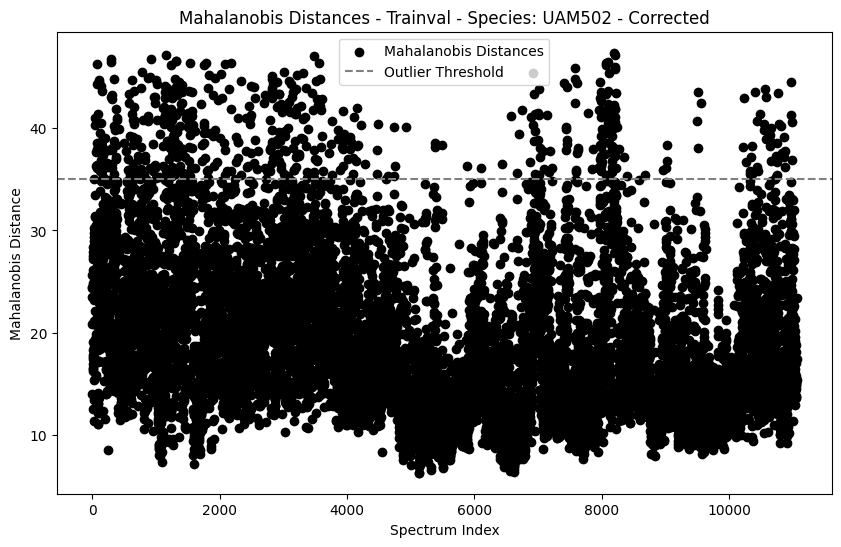

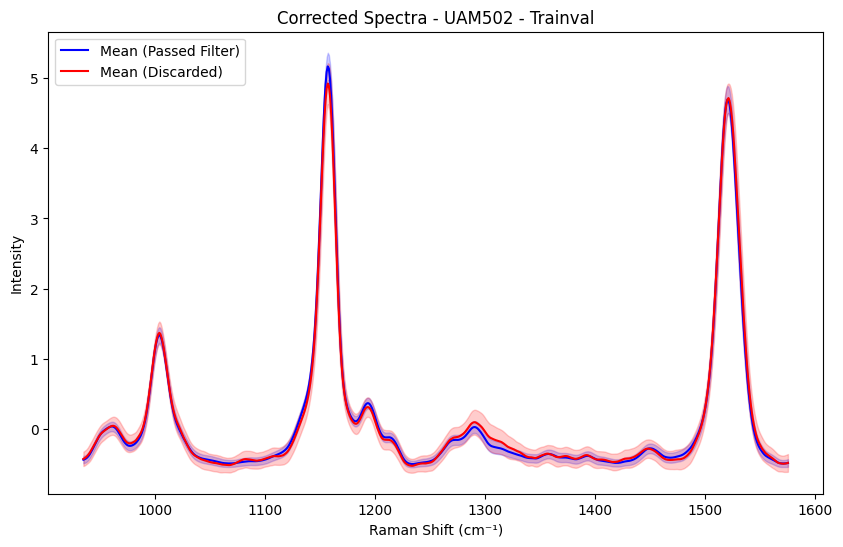

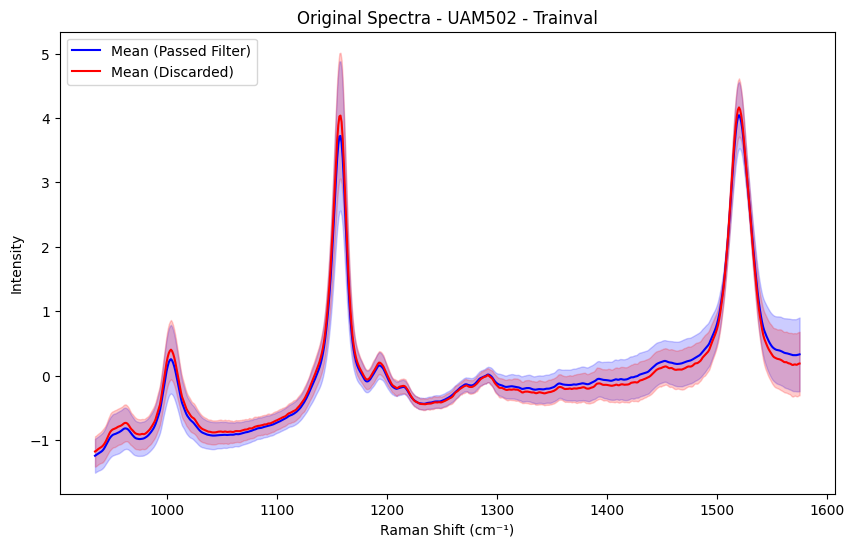

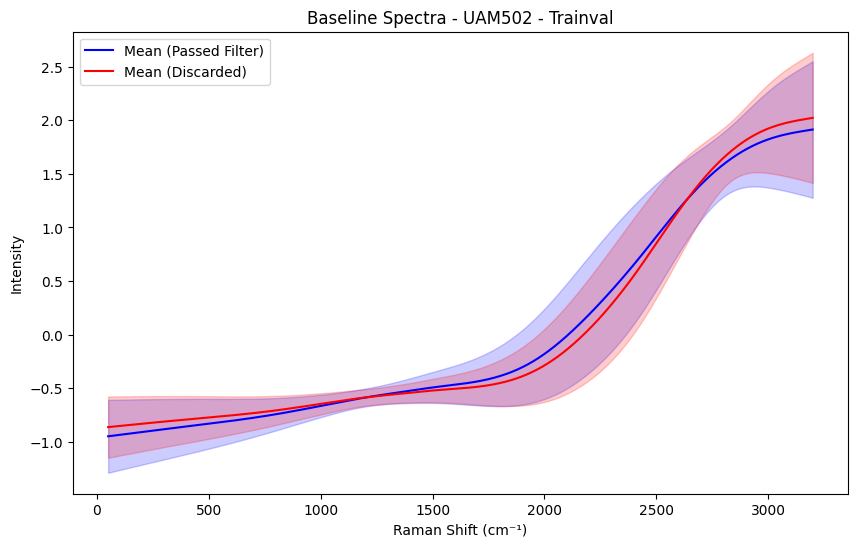

Species: UAM588, 603 spectra eliminated out of 10695


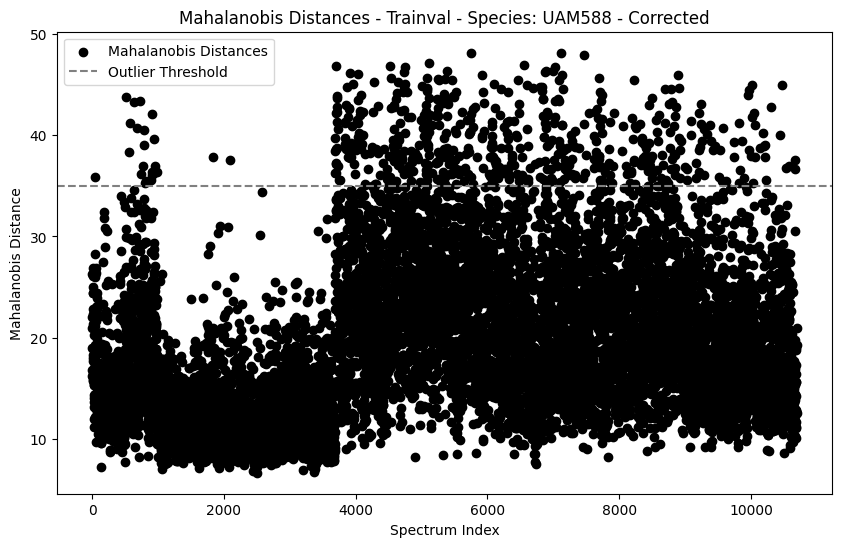

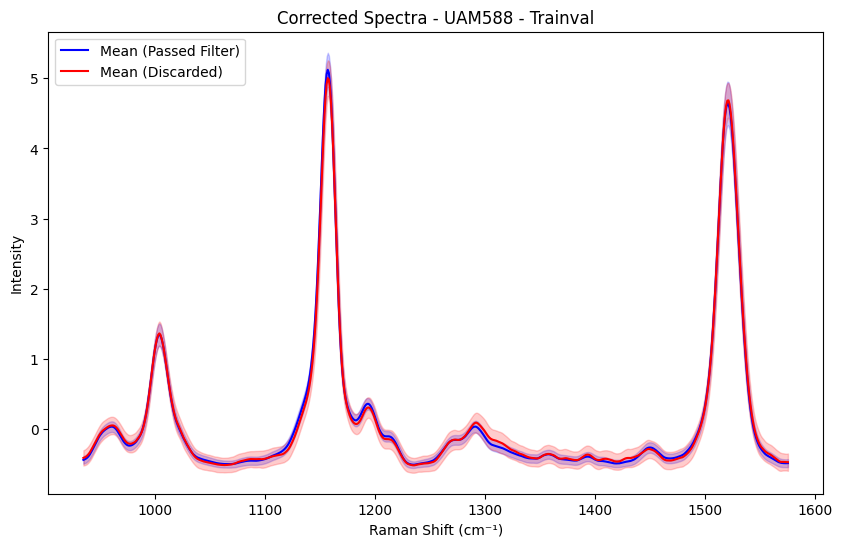

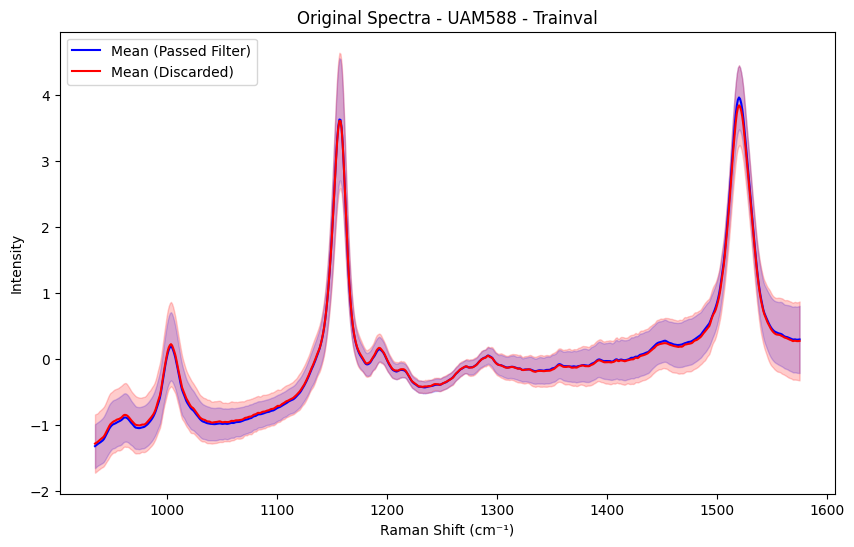

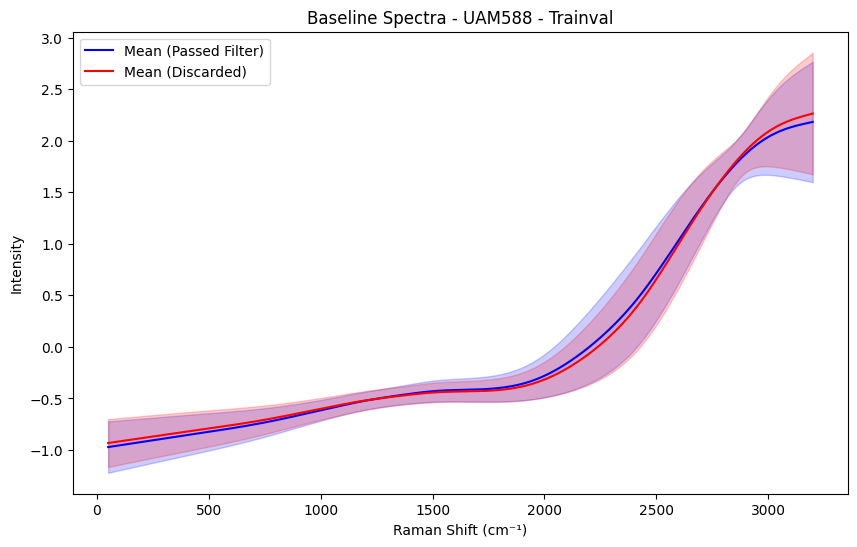

Species: UAM565, 2884 spectra eliminated out of 8690


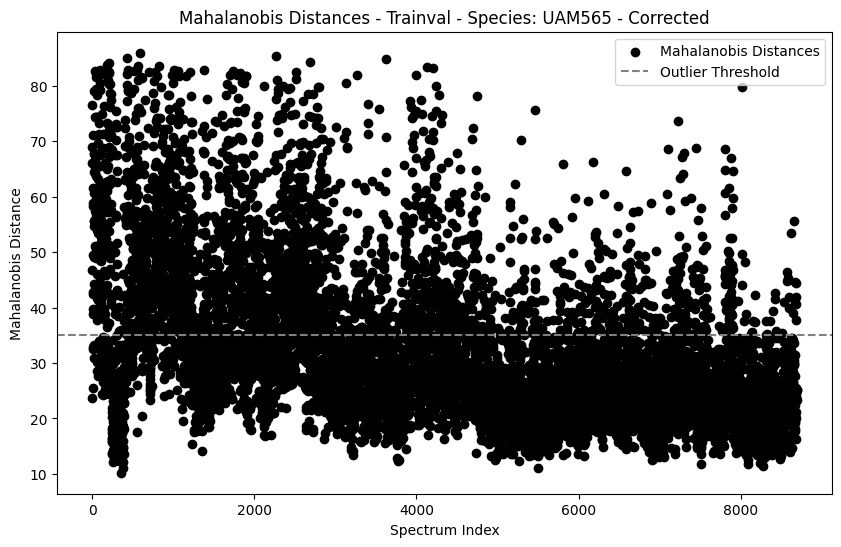

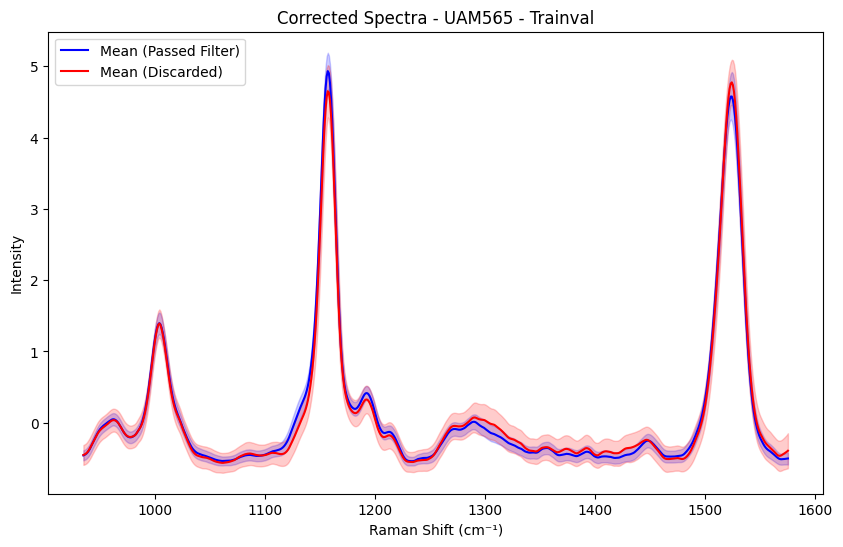

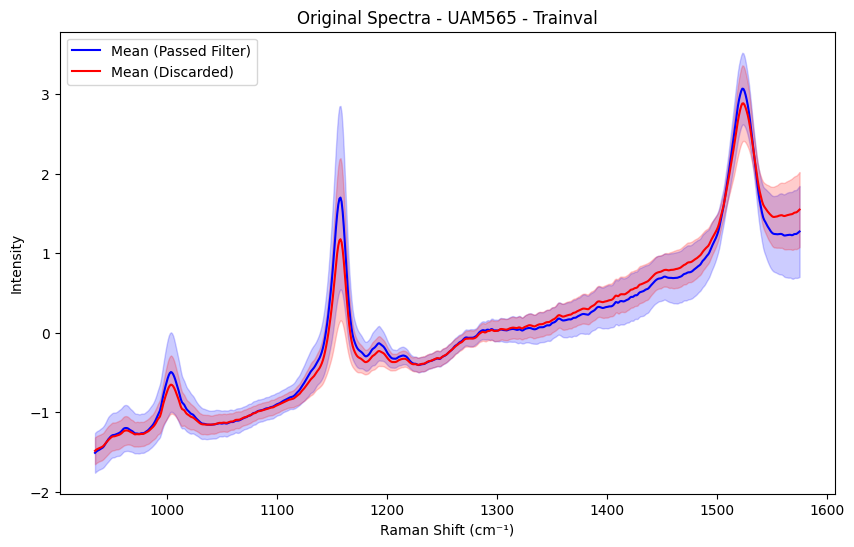

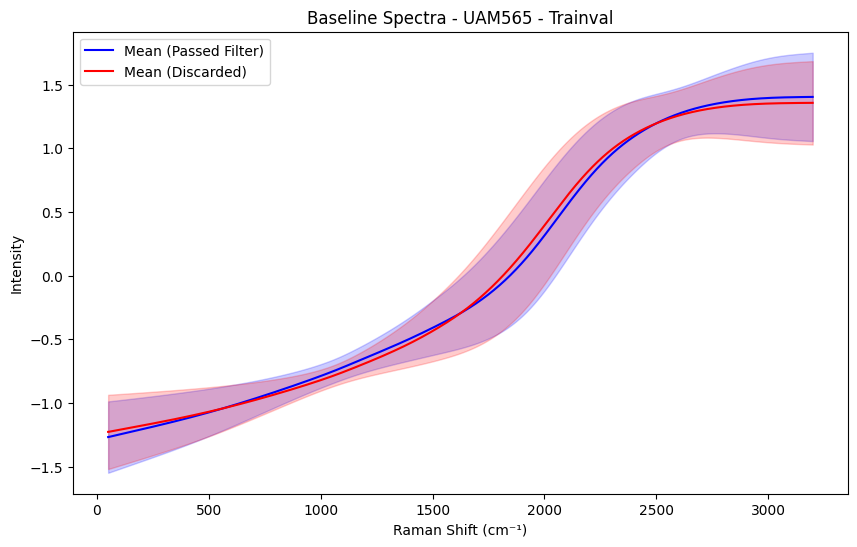

Species: UAM253, 387 spectra eliminated out of 8306


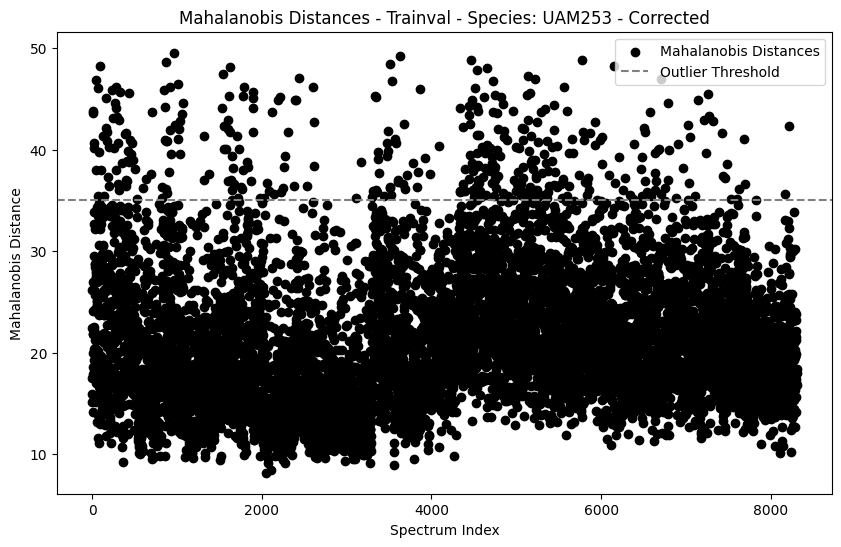

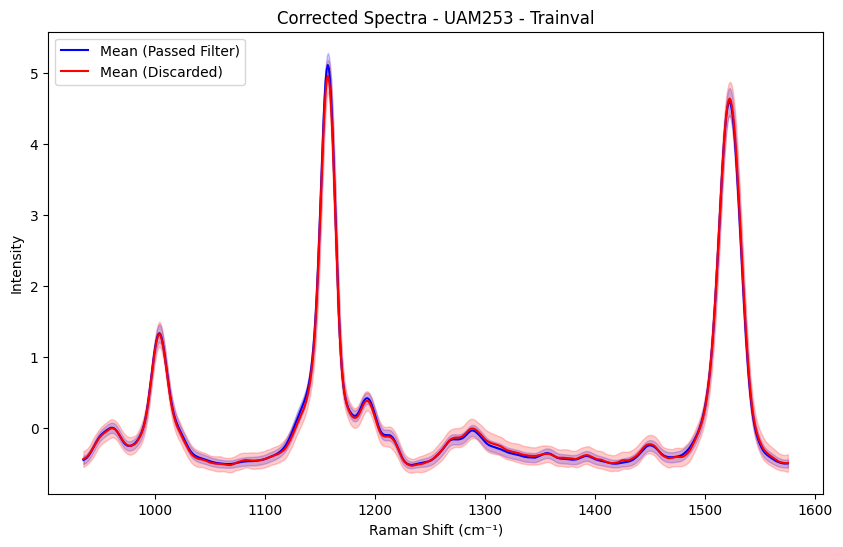

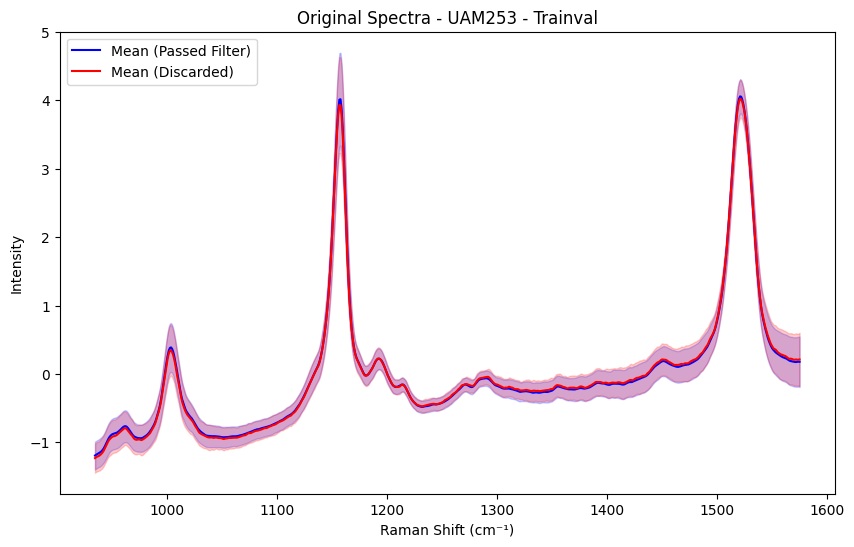

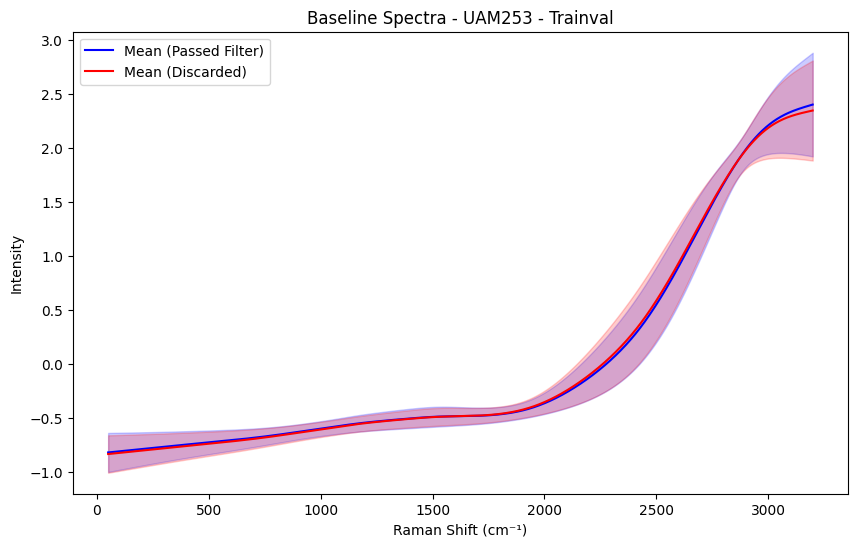

Species: UAM502, 0 spectra eliminated out of 842


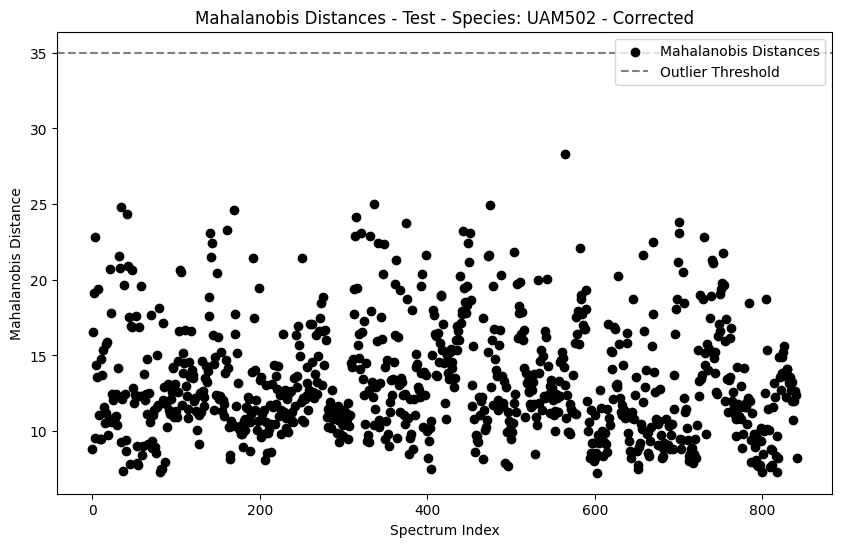

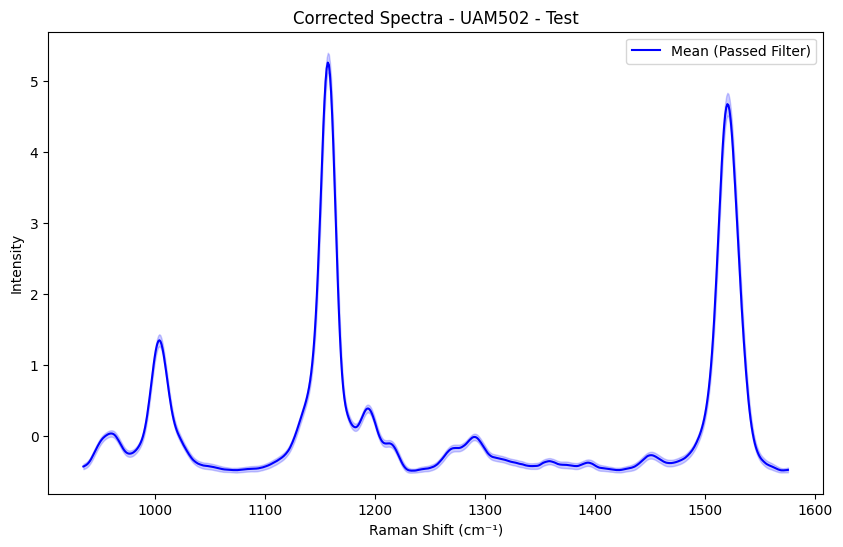

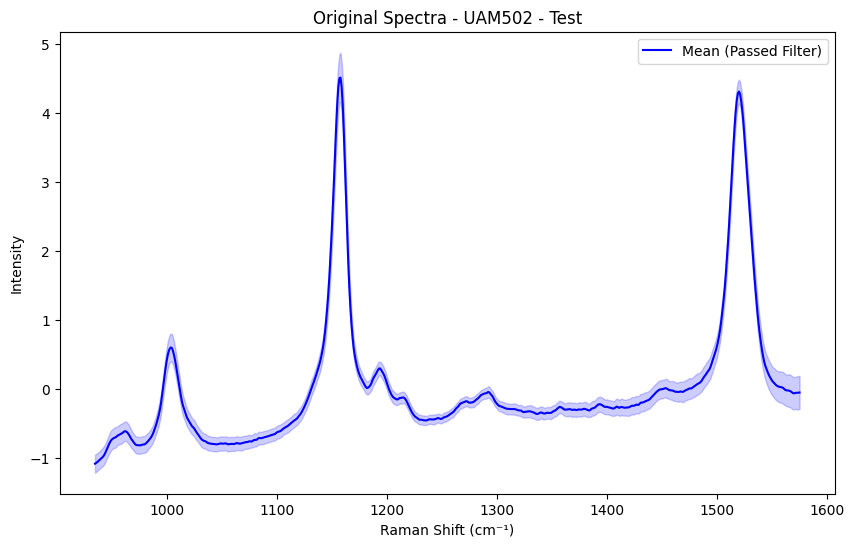

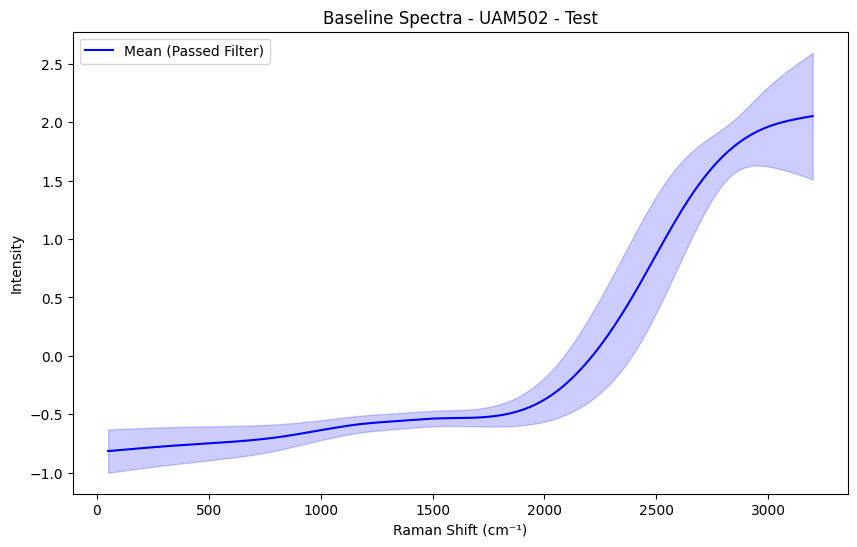

Species: UAM588, 0 spectra eliminated out of 3760


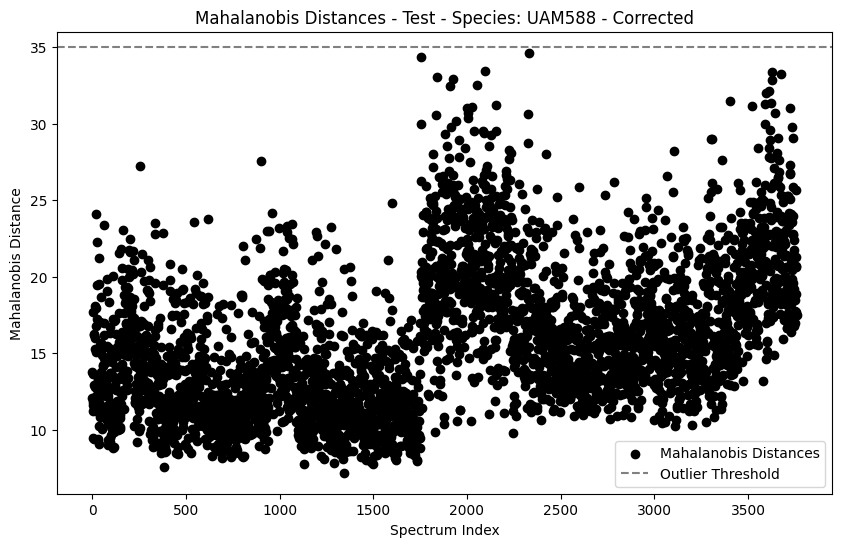

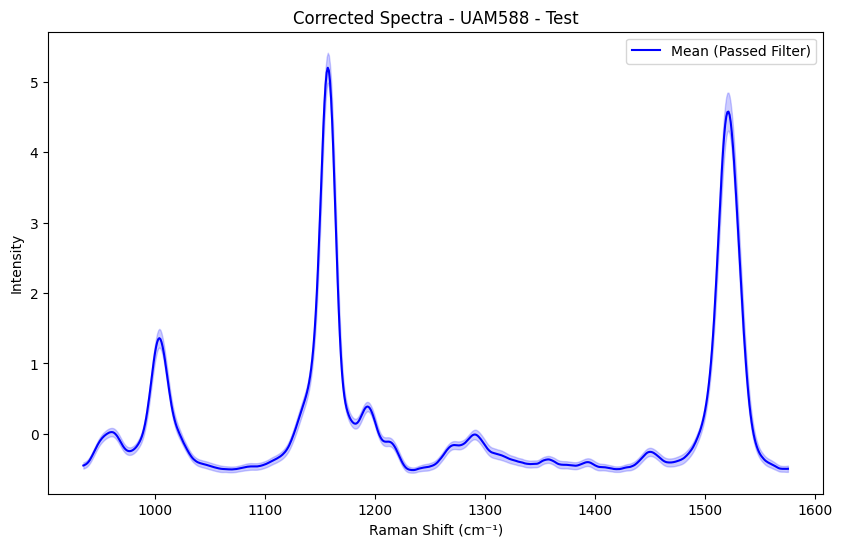

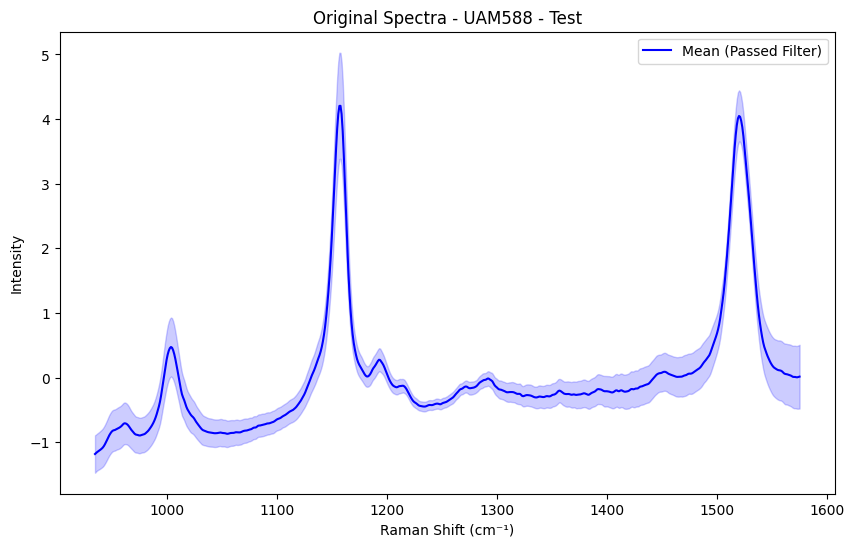

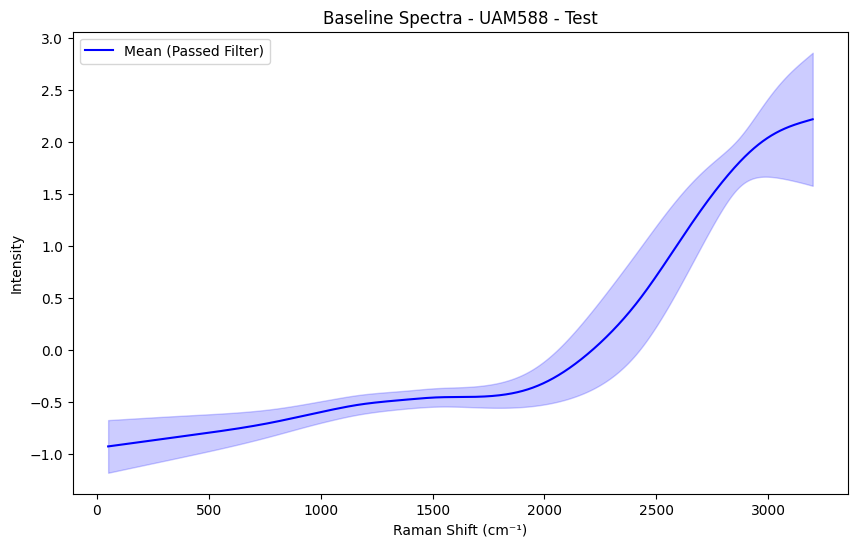

Species: UAM565, 0 spectra eliminated out of 1270


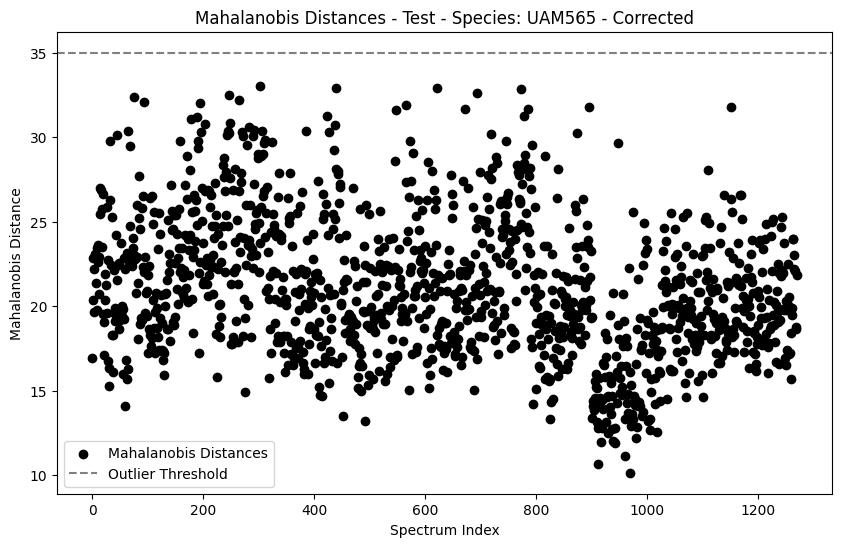

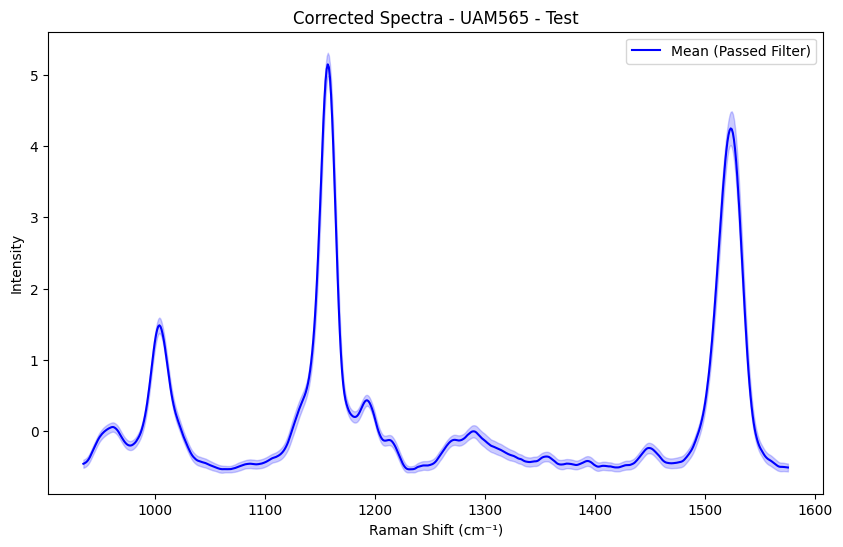

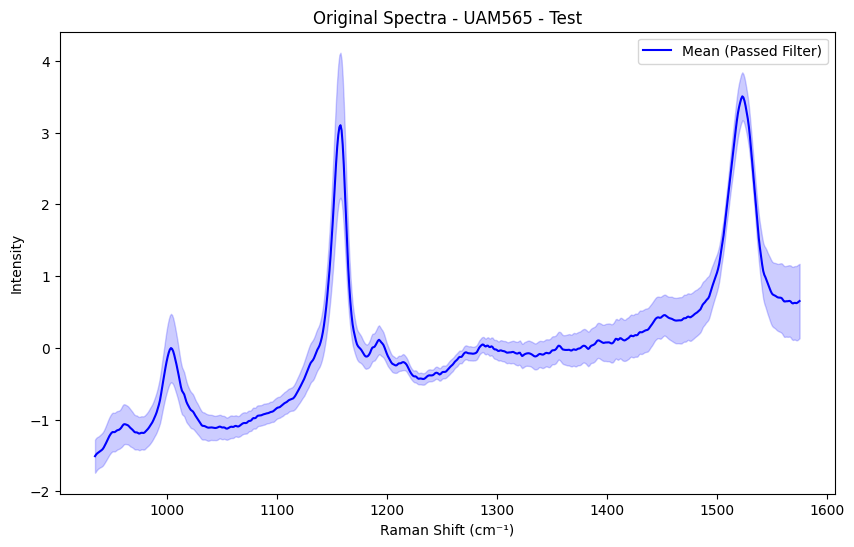

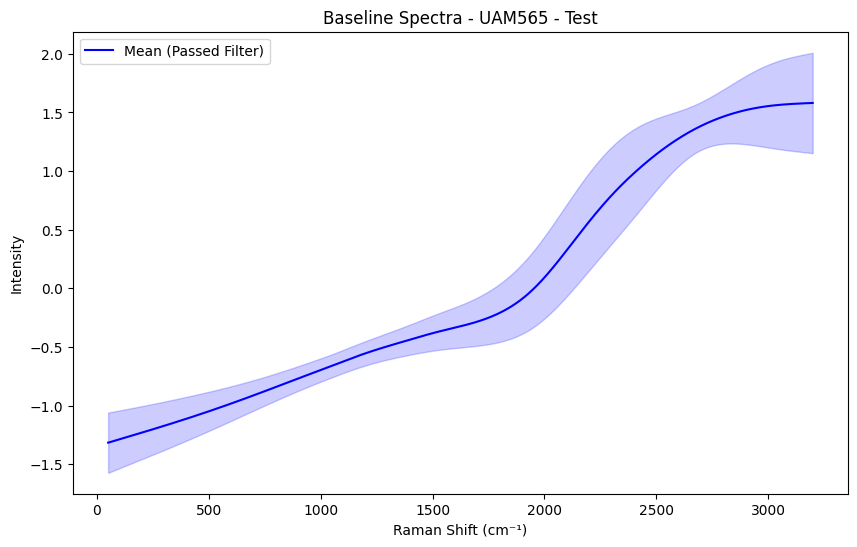

Species: UAM253, 0 spectra eliminated out of 1306


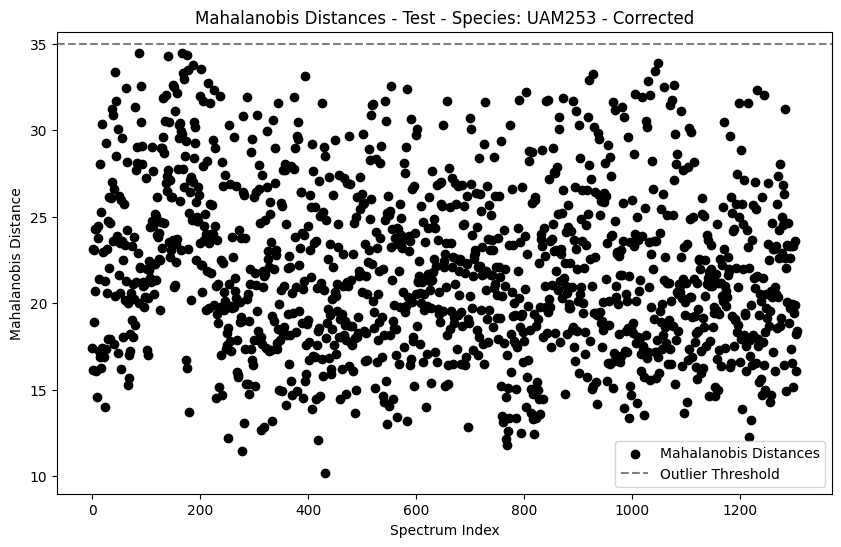

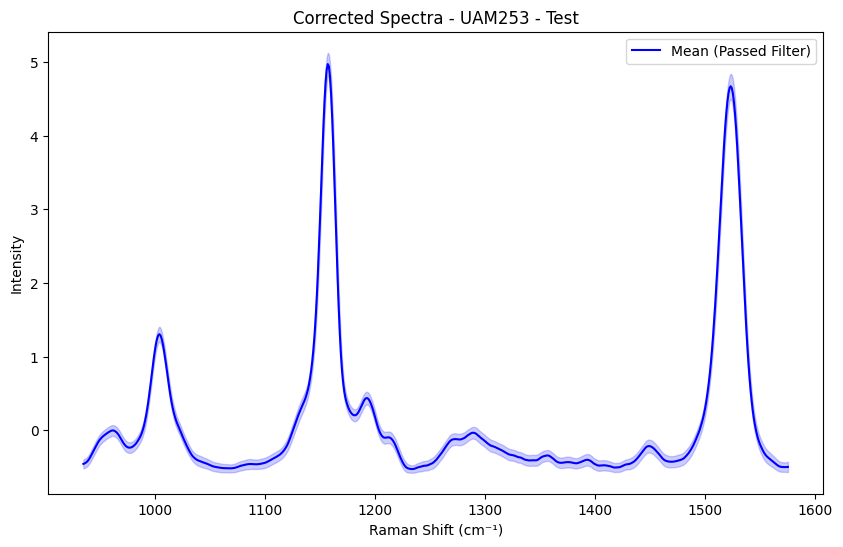

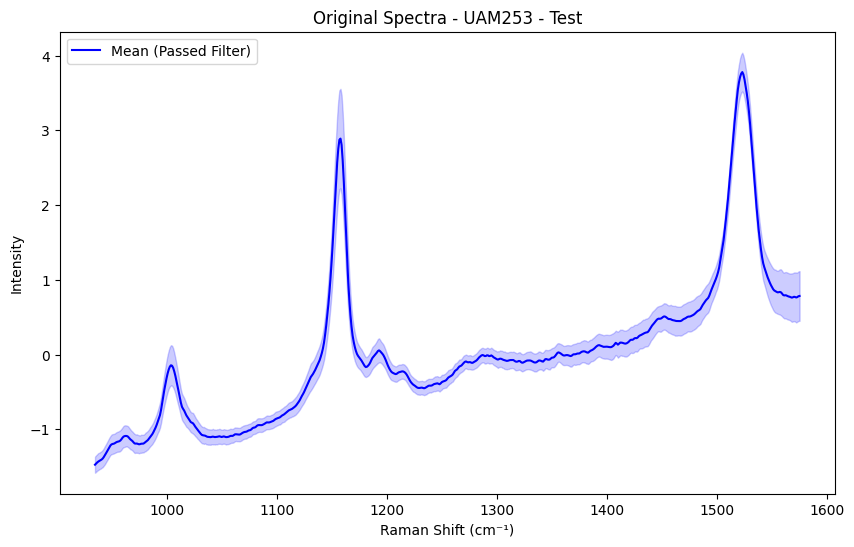

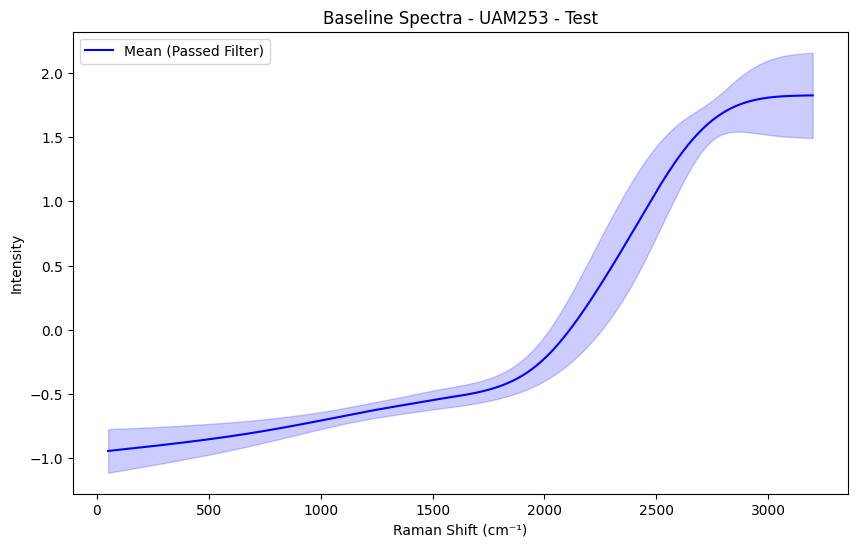

Filtering completed for trainval and test, and files saved.


In [3]:

# Function to plot the mean spectrum and standard deviation
def plot_mean_and_std(df_passed, df_outliers, title, raman_shifts):
    plt.figure(figsize=(10, 6))
    
    # Calculate the mean and standard deviation of spectra that pass the filter
    if not df_passed.empty:
        mean_passed = df_passed.mean(axis=0)
        std_passed = df_passed.std(axis=0)
        plt.plot(raman_shifts, mean_passed, color='blue', label='Mean (Passed Filter)')
        plt.fill_between(raman_shifts, mean_passed - std_passed, mean_passed + std_passed, color='blue', alpha=0.2)
    
    # Calculate the mean and standard deviation of discarded spectra
    if not df_outliers.empty:
        mean_outliers = df_outliers.mean(axis=0)
        std_outliers = df_outliers.std(axis=0)
        plt.plot(raman_shifts, mean_outliers, color='red', label='Mean (Discarded)')
        plt.fill_between(raman_shifts, mean_outliers - std_outliers, mean_outliers + std_outliers, color='red', alpha=0.2)

    plt.title(title)
    plt.xlabel("Raman Shift (cm⁻¹)")
    plt.ylabel("Intensity")
    plt.legend()
    plt.show()

# Function to compute the global covariance matrix and inverse, and the mean vector
def compute_global_mahalanobis_params(df):
    # Exclude categorical columns to calculate Mahalanobis distance
    df_numeric = df.drop(columns=categorical_columns + coordinates_columns + names_column)
    
    # Calculate the covariance matrix and its inverse
    cov_matrix = np.cov(df_numeric.T)
    inv_cov_matrix = np.linalg.inv(cov_matrix)
    
    # Calculate the mean vector
    mean_vector = df_numeric.mean(axis=0)
    
    return inv_cov_matrix, mean_vector

# Function to apply the Mahalanobis filter to a DataFrame
def apply_mahalanobis_filter(df_test, inv_cov_matrix, mean_vector, threshold=35):
    df_test_numeric = df_test.drop(columns=categorical_columns + coordinates_columns + names_column)
    
    # Calculate the Mahalanobis distance for each spectrum in the test set
    mahalanobis_distances = df_test_numeric.apply(lambda row: distance.mahalanobis(row, mean_vector, inv_cov_matrix), axis=1)
    
    # Define the outlier threshold
    outliers_mask = mahalanobis_distances > threshold
    
    return outliers_mask, mahalanobis_distances

# Function to filter and plot the results (means and standard deviations)
def filter_and_plot(df, outliers_mask, raman_shifts, title):
    df_passed = df[~outliers_mask].drop(columns=categorical_columns + coordinates_columns + names_column)
    df_outliers = df[outliers_mask].drop(columns=categorical_columns + coordinates_columns + names_column)
    
    plot_mean_and_std(df_passed, df_outliers, title, raman_shifts)
    
    return df_passed, df_outliers

# Define categorical and coordinate columns
categorical_columns = ['date', 't_exp', 'especie', 'medium']
coordinates_columns = ['X', 'Y']
names_column = ['name']

# 1. Load trainval data
paths = [
       r'C:\Users\fmantecam\OneDrive - UNICAN\RamanNanoBase\FITOPLANCTON_ESPECIES_UAM\TFMjorge\df_filtrados\species_CORRECTED_normSPECTRUM_SNR30_V271124_FILTRADOPLASTICO2percent_withCOORDINATES_WITHOUTOUTLIERS_kmeans_percentile_281124.csv',
       r'C:\Users\fmantecam\OneDrive - UNICAN\RamanNanoBase\FITOPLANCTON_ESPECIES_UAM\TFMjorge\df_filtrados\RAW_CyanobacteriaSpecies_RamanSpectra.csv',
       r'C:\Users\fmantecam\OneDrive - UNICAN\RamanNanoBase\FITOPLANCTON_ESPECIES_UAM\TFMjorge\df_filtrados\species_BASELINES_normSPECTRUM_SNR30_V271124_FILTRADOPLASTICO2percent_withCOORDINATES_WITHOUTOUTLIERS_percentile_281124.csv'
]

df = pd.read_csv(paths[0])
df_originals = pd.read_csv(paths[1])
df_baselines = pd.read_csv(paths[2])

# Define the Raman shift ranges
raman_shifts_corrected = np.arange(935, 1576, 1)  # For corrected and originals
raman_shifts_baselines = np.arange(50, 3200, 1)  # For baselines

# 2. Compute the global covariance matrix, its inverse, and the mean vector for the entire trainval set
inv_cov_matrix_global, mean_vector_global = compute_global_mahalanobis_params(df)

# 3. Apply the Mahalanobis filter to trainval data (separated by species)
outliers_indices_trainval = []

y_trainval = df['especie']  # Class labels (species)

for species in y_trainval.unique():
    # Filter only the data for the current species
    species_mask = (y_trainval == species)
    df_species = df[species_mask]
    df_species_originals = df_originals[species_mask]
    df_species_baselines = df_baselines[species_mask]
    
    # Apply Mahalanobis to this species using the global covariance matrix
    outliers_mask_corrected, mahalanobis_distances_corrected = apply_mahalanobis_filter(df_species, inv_cov_matrix_global, mean_vector_global)

    # Count the discarded spectra for this species
    eliminated = outliers_mask_corrected.sum()
    total = len(outliers_mask_corrected)
    print(f"Species: {species}, {eliminated} spectra eliminated out of {total}")
    
    # Plot the Mahalanobis distances for this species in corrected
    plt.figure(figsize=(10, 6))
    plt.scatter(range(len(mahalanobis_distances_corrected)), mahalanobis_distances_corrected, c='black', label='Mahalanobis Distances')
    plt.axhline(y=35, color='grey', linestyle='--', label="Outlier Threshold")
    plt.title(f"Mahalanobis Distances - Trainval - Species: {species} - Corrected")
    plt.xlabel("Spectrum Index")
    plt.ylabel("Mahalanobis Distance")
    plt.legend()
    plt.show()

    # Filter and plot the means and standard deviations for corrected
    filter_and_plot(df_species, outliers_mask_corrected, raman_shifts_corrected, f"Corrected Spectra - {species} - Trainval")
    # Filter and plot the means and standard deviations for originals and baselines by species
    filter_and_plot(df_species_originals, df_species_originals.index.isin(df_species.index[outliers_mask_corrected]), raman_shifts_corrected, f"Original Spectra - {species} - Trainval")
    filter_and_plot(df_species_baselines, df_species_baselines.index.isin(df_species.index[outliers_mask_corrected]), raman_shifts_baselines, f"Baseline Spectra - {species} - Trainval")

    # Store the indices of outliers
    outliers_indices_trainval.extend(df_species.index[outliers_mask_corrected])

# Remove outliers from all three trainval DataFrames using corrected indices
df_filtered = df.drop(outliers_indices_trainval)
df_originals_filtered = df_originals.drop(outliers_indices_trainval)
df_baselines_filtered = df_baselines.drop(outliers_indices_trainval)

# Save the filtered trainval DataFrames
df_filtered.to_csv(paths[0].replace('.csv', '_WITHOUTOUTLIERS2.csv'), index=False)
df_originals_filtered.to_csv(paths[1].replace('.csv', '_WITHOUTOUTLIERS2.csv'), index=False)
df_baselines_filtered.to_csv(paths[2].replace('.csv', '_WITHOUTOUTLIERS2.csv'), index=False)

# 4. Apply the global Mahalanobis filter to test data
test_paths = [
    r'C:\Users\fmantecam\OneDrive - UNICAN\RamanNanoBase\FITOPLANCTON_ESPECIES_UAM\TFMjorge\df_filtrados\especiesUAM_UNSEENS_CORRECTED_normSPECTRUM_SNR30_V171124_FILTRADOPLASTICO2percent_withCOORDINATES_WITHOUTOUTLIERS_percentile_281124.csv',
    r'C:\Users\fmantecam\OneDrive - UNICAN\RamanNanoBase\FITOPLANCTON_ESPECIES_UAM\TFMjorge\df_filtrados\RAW_CyanobacteriaSpecies_RamanSpectra_UNSEENS.csv',
    r'C:\Users\fmantecam\OneDrive - UNICAN\RamanNanoBase\FITOPLANCTON_ESPECIES_UAM\TFMjorge\df_filtrados\especiesUAM_UNSEENS_BASELINES_normSPECTRUM_SNR30_V171124_FILTRADOPLASTICO2percent_withCOORDINATES_WITHOUTOUTLIERS_percentile_281124.csv'
]

df_test_corrected = pd.read_csv(test_paths[0])
df_test_originals = pd.read_csv(test_paths[1])
df_test_baselines = pd.read_csv(test_paths[2])

y_test = df_test_corrected['especie']

# Apply the Mahalanobis filter to test
outliers_indices_test = []

for species in y_test.unique():
    # Filter only the data for the current species in test
    species_mask_test = (y_test == species)
    df_species_test_corrected = df_test_corrected[species_mask_test]
    df_species_test_originals = df_test_originals[species_mask_test]
    df_species_test_baselines = df_test_baselines[species_mask_test]
    
    # Apply Mahalanobis to this species in test using the global matrix
    outliers_mask_test_corrected, mahalanobis_distances_test_corrected = apply_mahalanobis_filter(df_species_test_corrected, inv_cov_matrix_global, mean_vector_global)
    
    outliers_indices_test.extend(df_species_test_corrected.index[outliers_mask_test_corrected])

    # Count the discarded spectra for this species
    eliminated = outliers_mask_test_corrected.sum()
    total = len(outliers_mask_test_corrected)
    print(f"Species: {species}, {eliminated} spectra eliminated out of {total}")

    # Plot the Mahalanobis distances for test (corrected)
    plt.figure(figsize=(10, 6))
    plt.scatter(range(len(mahalanobis_distances_test_corrected)), mahalanobis_distances_test_corrected, c='black', label='Mahalanobis Distances')
    plt.axhline(y=35, color='grey', linestyle='--', label="Outlier Threshold")
    plt.title(f"Mahalanobis Distances - Test - Species: {species} - Corrected")
    plt.xlabel("Spectrum Index")
    plt.ylabel("Mahalanobis Distance")
    plt.legend()
    plt.show()

    # Filter and plot the means and standard deviations for corrected by species in test
    filter_and_plot(df_species_test_corrected, outliers_mask_test_corrected, raman_shifts_corrected, f"Corrected Spectra - {species} - Test")
    # Filter and plot the means and standard deviations for originals and baselines by species in test
    filter_and_plot(df_species_test_originals, df_species_test_originals.index.isin(df_species_test_corrected.index[outliers_mask_test_corrected]), raman_shifts_corrected, f"Original Spectra - {species} - Test")
    filter_and_plot(df_species_test_baselines, df_species_test_baselines.index.isin(df_species_test_corrected.index[outliers_mask_test_corrected]), raman_shifts_baselines, f"Baseline Spectra - {species} - Test")

# Remove outliers from all three test DataFrames using corrected indices
df_test_corrected_filtered = df_test_corrected.drop(outliers_indices_test)
df_test_originals_filtered = df_test_originals.drop(outliers_indices_test)
df_test_baselines_filtered = df_test_baselines.drop(outliers_indices_test)

# Save the filtered test DataFrames
'''df_test_corrected_filtered.to_csv(test_paths[0].replace('.csv', '_WITHOUTOUTLIERS2.csv'), index=False)
df_test_originals_filtered.to_csv(test_paths[1].replace('.csv', '_WITHOUTOUTLIERS2.csv'), index=False)
df_test_baselines_filtered.to_csv(test_paths[2].replace('.csv', '_WITHOUTOUTLIERS2.csv'), index=False)
'''
print("Filtering completed for trainval and test, and files saved.")



Species distribution before applying K-Means (trainval):
especie
UAM502    11060
UAM588    10695
UAM565     8690
UAM253     8306
Name: count, dtype: int64


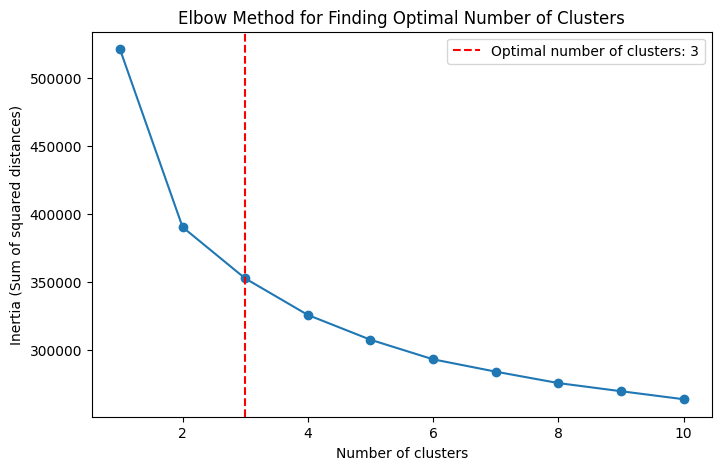

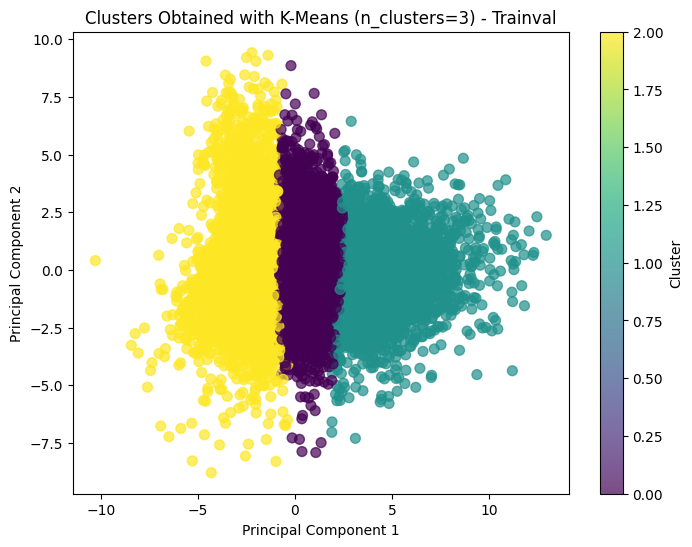

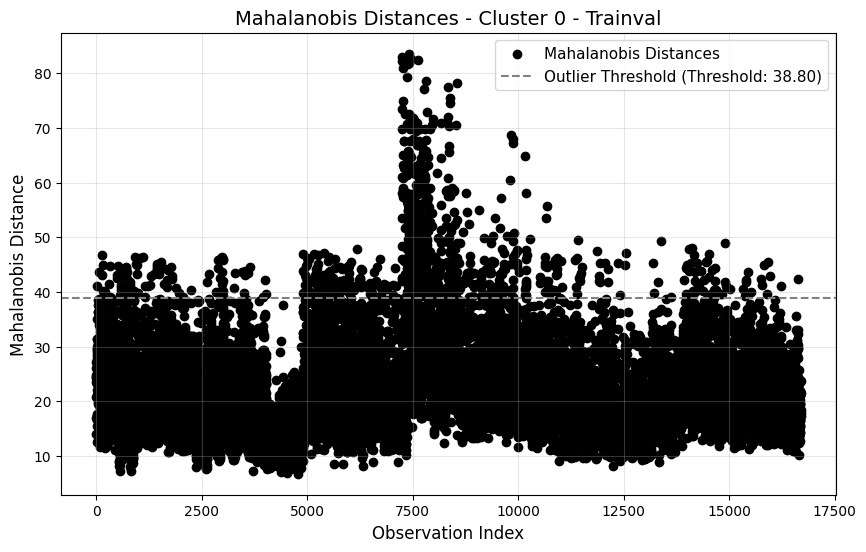

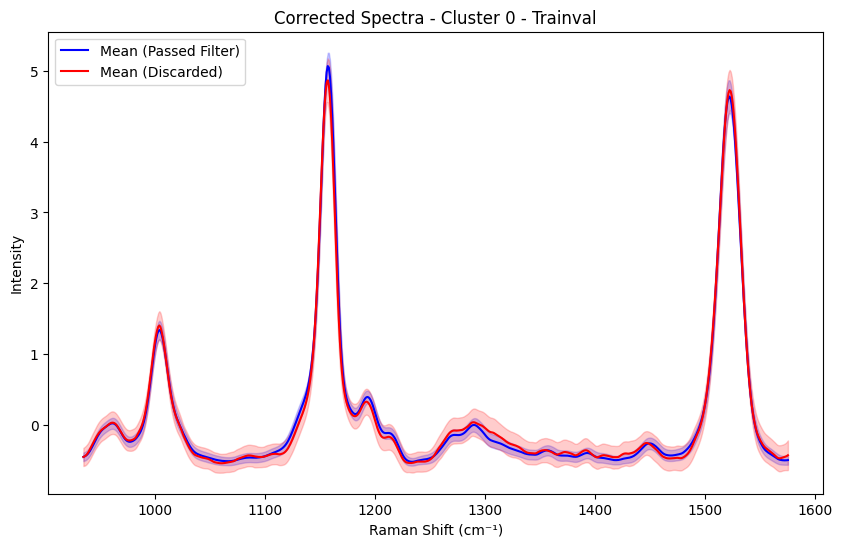

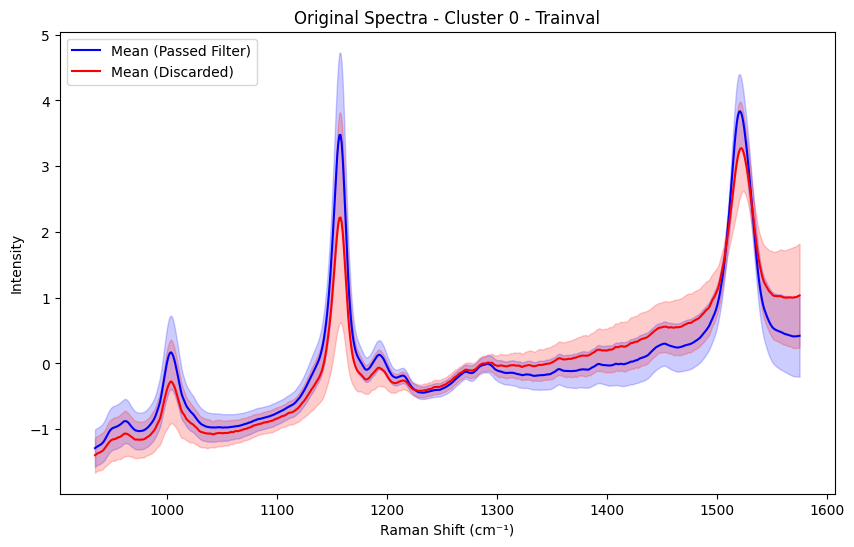

...

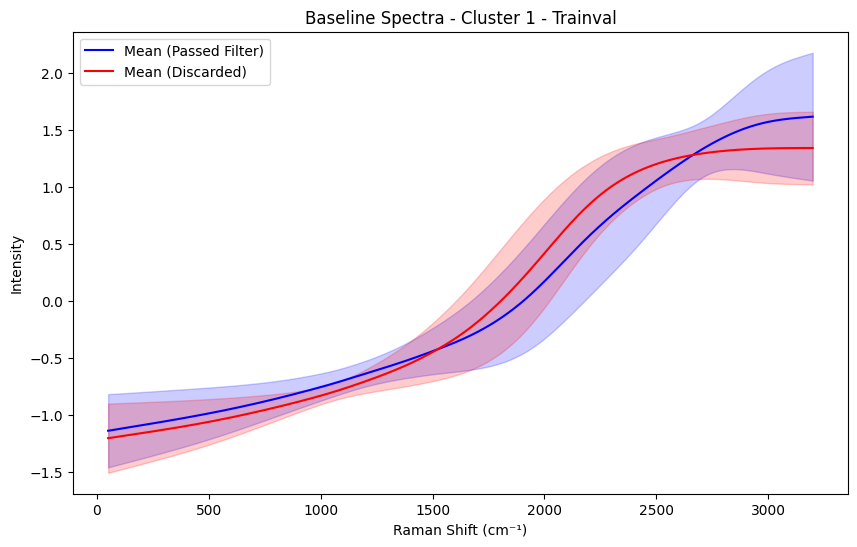

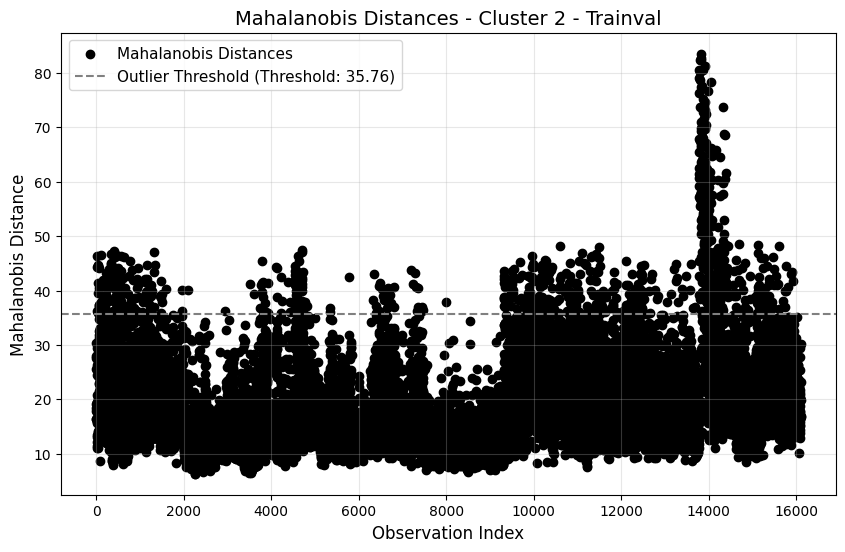

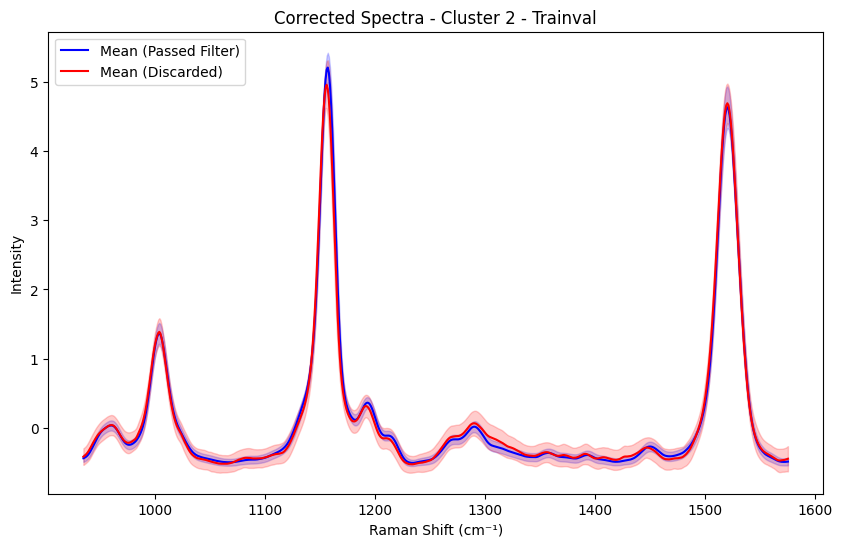

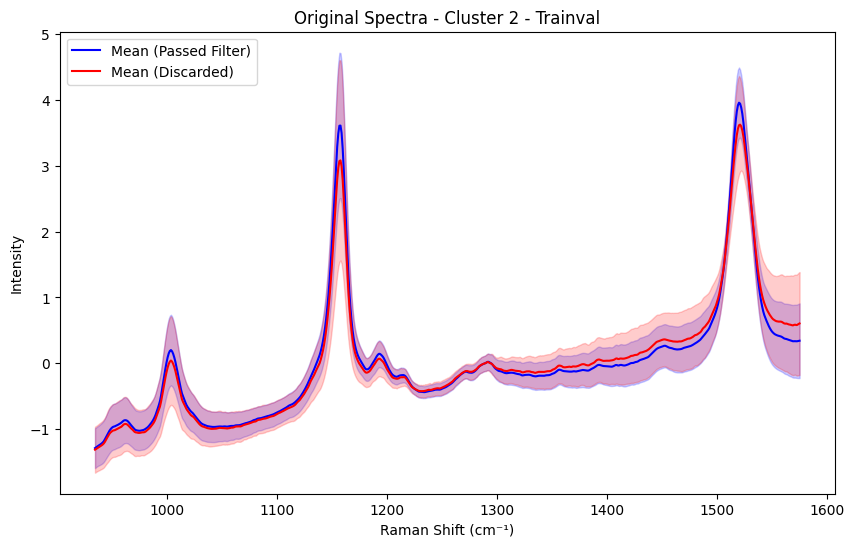

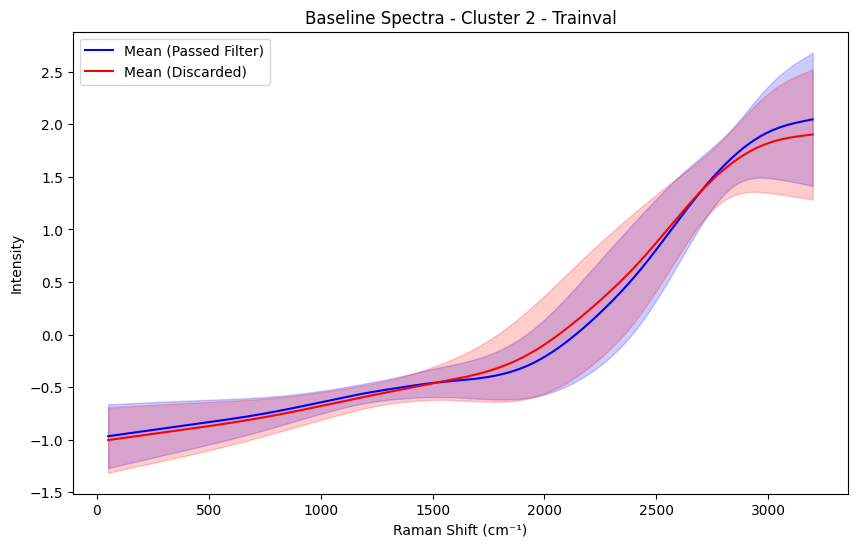

Trainval filtering completed and files saved.


In [5]:


# Function to apply Mahalanobis and get outliers for each cluster
def apply_mahalanobis_filter_by_cluster(df, cluster_labels, inv_cov_matrix, mean_vector, cluster_num, percentile=90):
    cluster_mask = (cluster_labels == cluster_num)
    df_cluster = df[cluster_mask].drop(columns=categorical_columns + coordinates_columns + names_column)
    mahalanobis_distances = df_cluster.apply(lambda row: distance.mahalanobis(row, mean_vector, inv_cov_matrix), axis=1)
    threshold = np.percentile(mahalanobis_distances, percentile)
    outliers_mask = mahalanobis_distances > threshold
    return outliers_mask, mahalanobis_distances, threshold


def plot_mahalanobis_distances(mahalanobis_distances, threshold, title):
    """
    Plots Mahalanobis distances for a given dataset and highlights the threshold for outliers.
    
    Args:
        mahalanobis_distances (array-like): Array of Mahalanobis distances for each observation.
        threshold (float): The distance threshold to consider an observation as an outlier.
        title (str): The title of the plot.

    Returns:
        None
    """
    plt.figure(figsize=(10, 6))
    plt.scatter(range(len(mahalanobis_distances)), mahalanobis_distances, color='black', label='Mahalanobis Distances')
    plt.axhline(y=threshold, color='grey', linestyle='--', label=f"Outlier Threshold (Threshold: {threshold:.2f})")
    plt.title(title, fontsize=14)
    plt.xlabel("Observation Index", fontsize=12)
    plt.ylabel("Mahalanobis Distance", fontsize=12)
    plt.legend(fontsize=11)
    plt.grid(alpha=0.3)
    plt.show()


# Function to find optimal number of clusters using the elbow method
def find_optimal_clusters(data, max_k=10):
    inertia = []
    for k in range(1, max_k + 1):
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(data)
        inertia.append(kmeans.inertia_)
    
    # Use kneed to automatically find the elbow point
    kneedle = KneeLocator(range(1, max_k + 1), inertia, curve="convex", direction="decreasing")
    optimal_k = kneedle.elbow

    # Plot the elbow method
    plt.figure(figsize=(8, 5))
    plt.plot(range(1, max_k + 1), inertia, marker='o')
    plt.axvline(optimal_k, color='red', linestyle='--', label=f'Optimal number of clusters: {optimal_k}')
    plt.xlabel('Number of clusters')
    plt.ylabel('Inertia (Sum of squared distances)')
    plt.title('Elbow Method for Finding Optimal Number of Clusters')
    plt.legend()
    plt.show()
    
    return optimal_k

# Function to apply K-Means and get clusters
def apply_kmeans(data, n_clusters):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    clusters = kmeans.fit_predict(data)
    return clusters

# Function to reduce dimensionality with PCA (for visualization)
def reduce_dimensionality_with_pca(data, n_components=2):
    pca = PCA(n_components=n_components)
    reduced_data = pca.fit_transform(data)
    return reduced_data

# Define categorical and coordinate columns
categorical_columns = ['date', 't_exp', 'especie', 'medium']
coordinates_columns = ['X', 'Y']
names_column = ['name']

# 1. Load trainval data
paths = [
    r'C:\Users\fmantecam\OneDrive - UNICAN\RamanNanoBase\FITOPLANCTON_ESPECIES_UAM\TFMjorge\df_filtrados\species_CORRECTED_normSPECTRUM_SNR30_V271124_FILTRADOPLASTICO2percent_withCOORDINATES_WITHOUTOUTLIERS_kmeans_percentile_281124.csv',
    r'C:\Users\fmantecam\OneDrive - UNICAN\RamanNanoBase\FITOPLANCTON_ESPECIES_UAM\TFMjorge\df_filtrados\RAW_CyanobacteriaSpecies_RamanSpectra.csv',
    r'C:\Users\fmantecam\OneDrive - UNICAN\RamanNanoBase\FITOPLANCTON_ESPECIES_UAM\TFMjorge\df_filtrados\species_BASELINES_normSPECTRUM_SNR30_V271124_FILTRADOPLASTICO2percent_withCOORDINATES_WITHOUTOUTLIERS_percentile_281124.csv'
]

# Load datasets and exclude unwanted class
trainval_corrected = pd.read_csv(paths[0])
trainval_corrected = trainval_corrected[trainval_corrected['especie'] != 'charco']
trainval_originals = pd.read_csv(paths[1])
trainval_originals = trainval_originals[trainval_originals['especie'] != 'charco']
trainval_baselines = pd.read_csv(paths[2])
trainval_baselines = trainval_baselines[trainval_baselines['especie'] != 'charco']

# Print species distribution before filtering
print("Species distribution before applying K-Means (trainval):")
print(trainval_corrected['especie'].value_counts())

# Define Raman shift ranges
raman_shifts_corrected = np.arange(935, 1576, 1)  # For corrected and originals
raman_shifts_baselines = np.arange(50, 3200, 1)  # For baselines

# 2. Apply K-Means to trainval data
trainval_numeric = trainval_corrected.drop(columns=categorical_columns + coordinates_columns + names_column)
n_clusters = find_optimal_clusters(trainval_numeric, max_k=10)
clusters_trainval = apply_kmeans(trainval_numeric, n_clusters=n_clusters)

# Visualize clusters in 2D (trainval)
reduced_data_trainval = reduce_dimensionality_with_pca(trainval_numeric, n_components=2)
plt.figure(figsize=(8, 6))
plt.scatter(reduced_data_trainval[:, 0], reduced_data_trainval[:, 1], c=clusters_trainval, cmap='viridis', s=50, alpha=0.7)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title(f'Clusters Obtained with K-Means (n_clusters={n_clusters}) - Trainval')
plt.colorbar(label='Cluster')
plt.show()

# 3. Apply Mahalanobis filtering by cluster in trainval data
outliers_indices_trainval = []
inv_cov_matrix_global, mean_vector_global = compute_global_mahalanobis_params(trainval_corrected)

for cluster_num in range(n_clusters):
    outliers_mask, mahalanobis_distances, threshold = apply_mahalanobis_filter_by_cluster(
        trainval_corrected, clusters_trainval, inv_cov_matrix_global, mean_vector_global, cluster_num, percentile=95)

    # Plot Mahalanobis distances
    plot_mahalanobis_distances(mahalanobis_distances, threshold, f"Mahalanobis Distances - Cluster {cluster_num} - Trainval")

    # Filter and plot spectra averages and standard deviations
    cluster_data_corrected = trainval_corrected[clusters_trainval == cluster_num]
    filter_and_plot(cluster_data_corrected, outliers_mask, raman_shifts_corrected, f"Corrected Spectra - Cluster {cluster_num} - Trainval")

    cluster_data_originals = trainval_originals[clusters_trainval == cluster_num]
    cluster_data_baselines = trainval_baselines[clusters_trainval == cluster_num]

    filter_and_plot(cluster_data_originals, outliers_mask, raman_shifts_corrected, f"Original Spectra - Cluster {cluster_num} - Trainval")
    filter_and_plot(cluster_data_baselines, outliers_mask, raman_shifts_baselines, f"Baseline Spectra - Cluster {cluster_num} - Trainval")

    # Store outlier indices
    outliers_indices_trainval.extend(cluster_data_corrected.index[outliers_mask])

# Remove outliers from trainval data
trainval_corrected_filtered = trainval_corrected.drop(outliers_indices_trainval)
trainval_originals_filtered = trainval_originals.drop(outliers_indices_trainval)
trainval_baselines_filtered = trainval_baselines.drop(outliers_indices_trainval)

# Save filtered trainval datasets
'''trainval_corrected_filtered.to_csv(paths[0].replace('.csv', '_WITHOUTOUTLIERS_kmeans.csv'), index=False)
trainval_originals_filtered.to_csv(paths[1].replace('.csv', '_WITHOUTOUTLIERS_kmeans.csv'), index=False)
trainval_baselines_filtered.to_csv(paths[2].replace('.csv', '_WITHOUTOUTLIERS_kmeans.csv'), index=False)'''

print("Trainval filtering completed and files saved.")




Processing file: 031024_UAM253_500ms_1acc_pwcas1_5um_1
Valid: 39, Outliers: 1


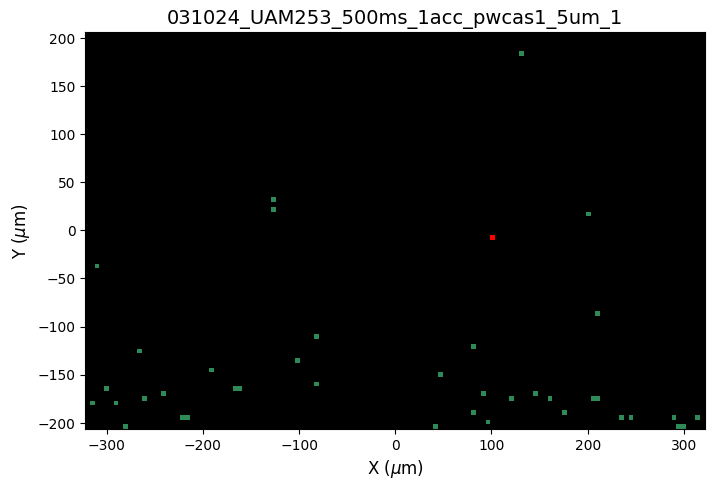


Processing file: 041024_UAM253_500ms_1acc_pwcas1_5um_2
Valid: 49, Outliers: 0


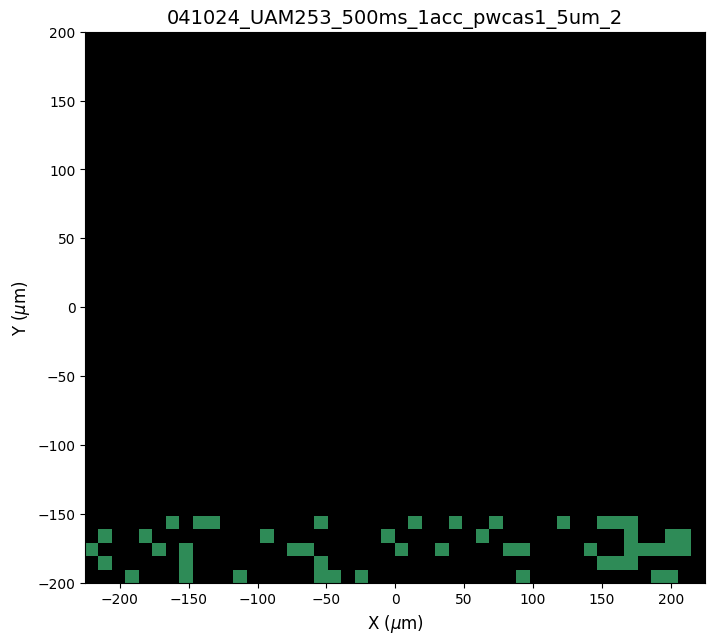


Processing file: 041024_UAM253_500ms_1acc_pwras_5um_1
Valid: 400, Outliers: 5


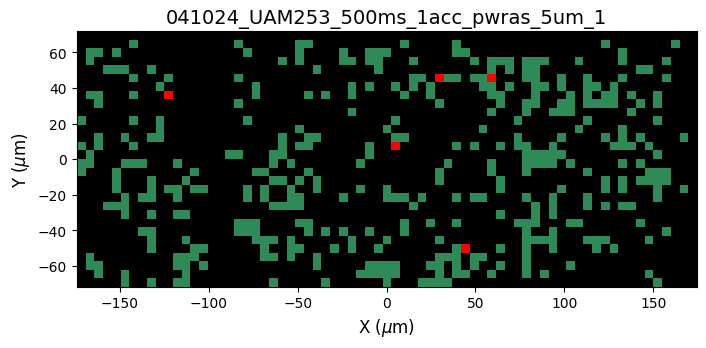


Processing file: 041024_UAM253_500ms_1acc_pwras_5um_3
Valid: 1968, Outliers: 40


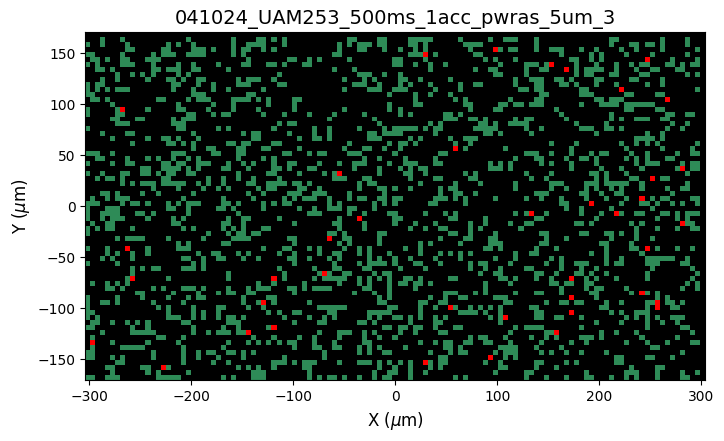


Processing file: 060624_UAM502_300ms_1acc_pwras_5um
Valid: 151, Outliers: 1


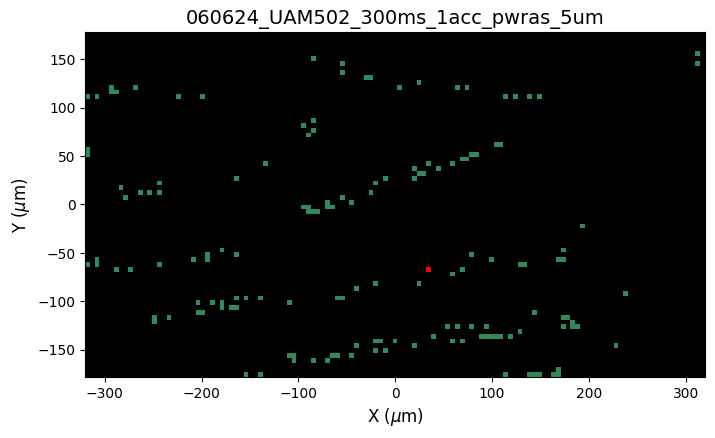


Processing file: 080724_UAM588_1s_1acc_5um_pwcasiras
Valid: 191, Outliers: 0


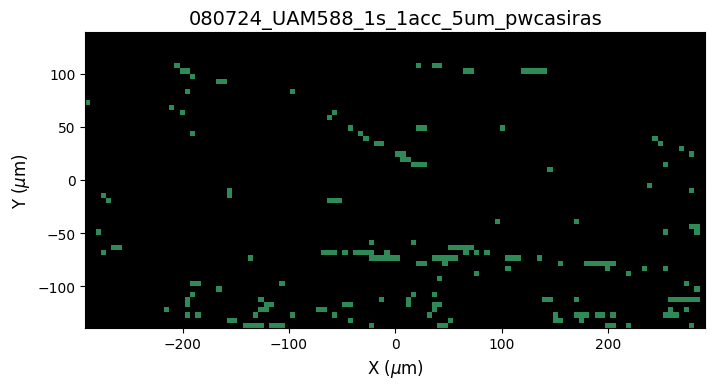


Processing file: 080824_UAM565_500ms_1acc_pwmuesca1_2um_2_largo
Valid: 680, Outliers: 285


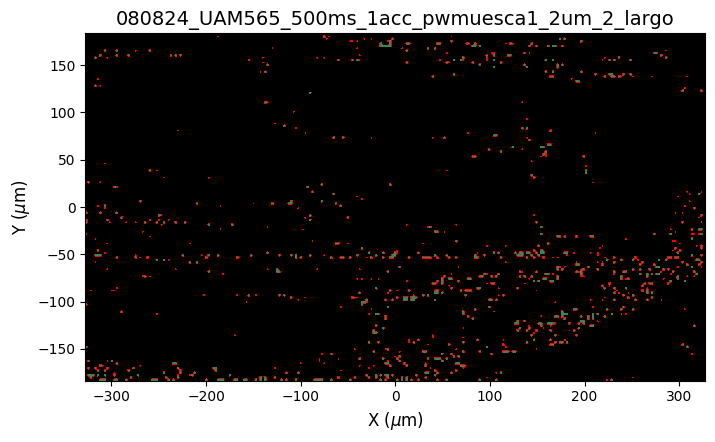


Processing file: 080824_UAM565_700ms_1acc_pwmuesca1_6um_1
Valid: 47, Outliers: 1


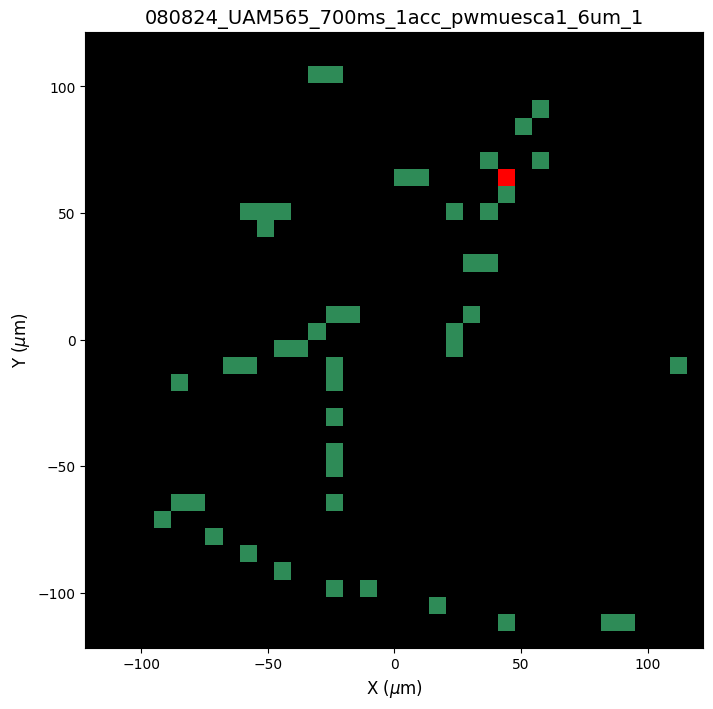


Processing file: 080824_UAM565_700ms_1acc_pwmuesca1_6um_2
Valid: 4, Outliers: 0


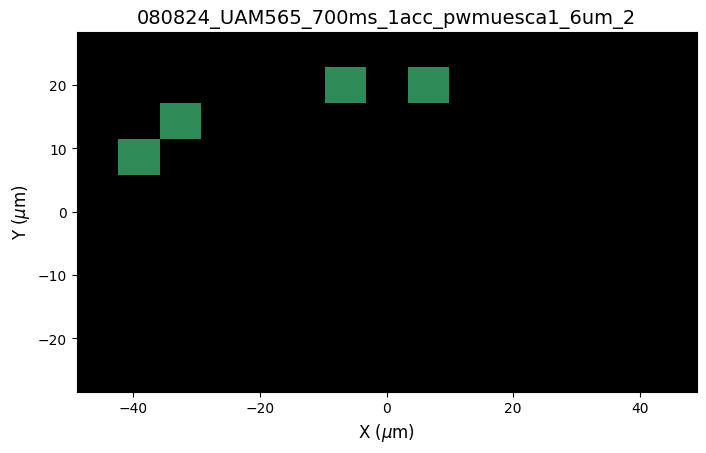


Processing file: 080824_UAM565_700ms_1acc_pwmuesca1_6um_3
Valid: 40, Outliers: 1


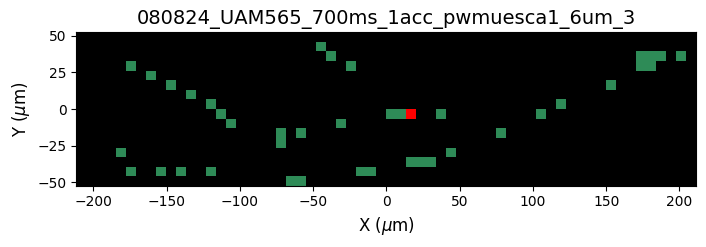


Processing file: 080824_UAM565_700ms_1acc_pwmuesca1_6um_4
Valid: 28, Outliers: 0


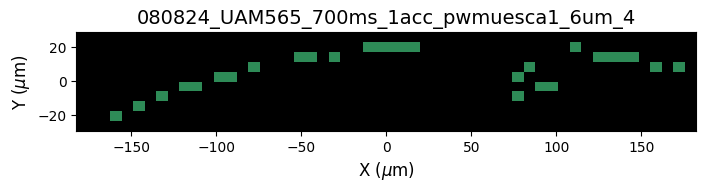


Processing file: 090723_UAM588_500ms_1acc_pwcasi1_5um
Valid: 1170, Outliers: 1


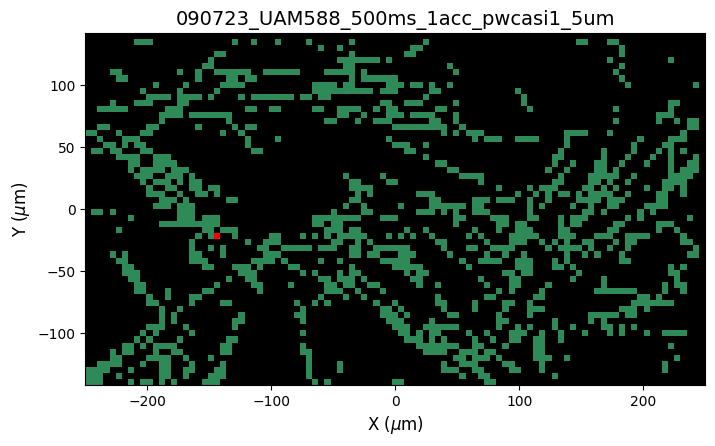


Processing file: 090724_UAM588_1s_2acc_3um_pwcasiras
Valid: 229, Outliers: 0


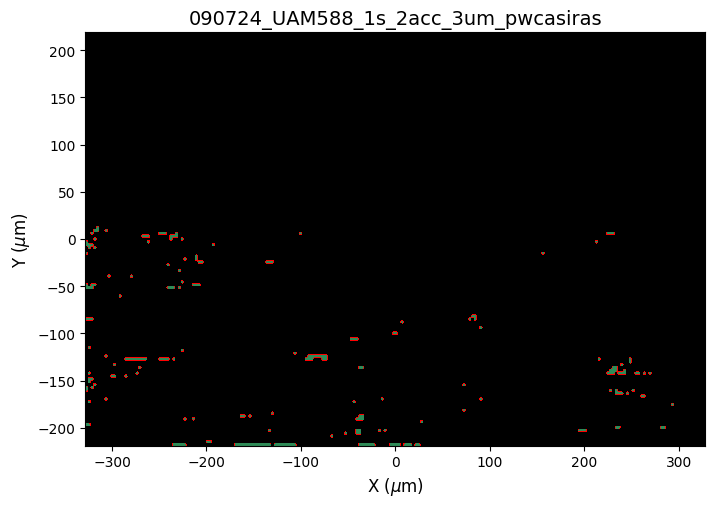


Processing file: 090724_UAM588_500ms_1acc_5um_pwcasi1
Valid: 357, Outliers: 0


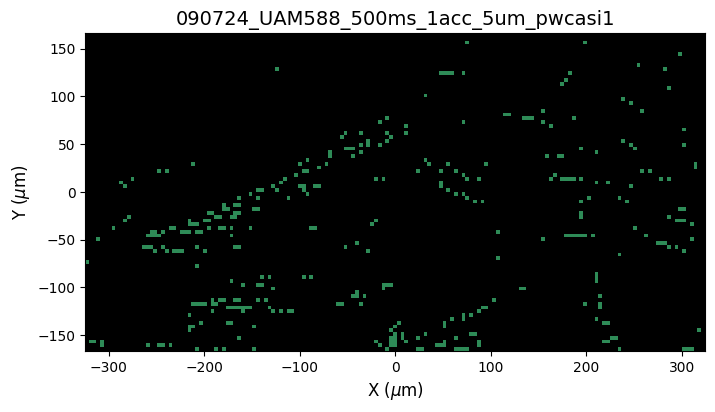


Processing file: 090824_UAM565_300ms_1acc_pwmuescacasi1_5um_1
Valid: 202, Outliers: 34


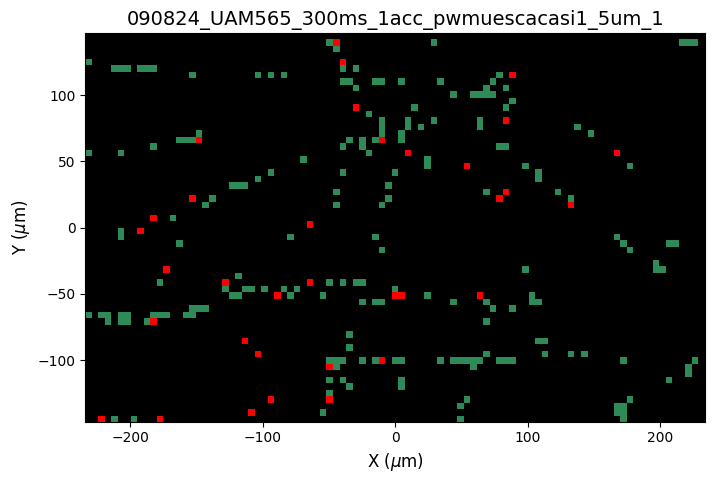


Processing file: 090824_UAM565_500ms_1acc_pwcasiras_5um_1
Valid: 48, Outliers: 16


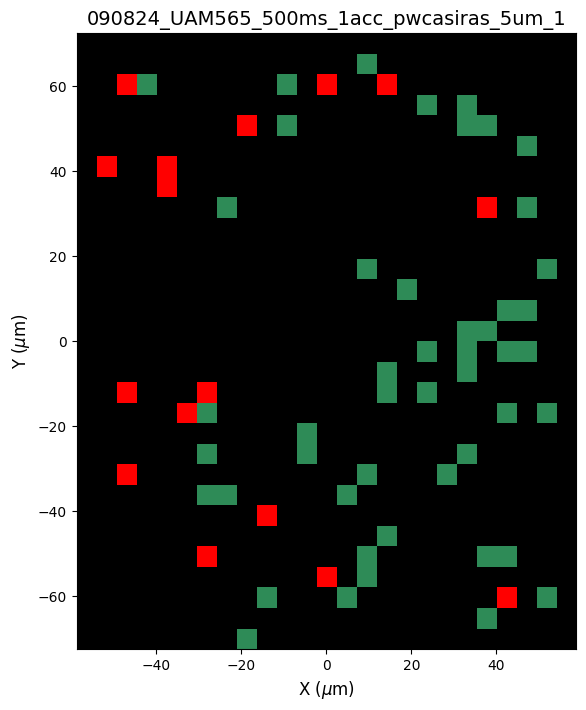


Processing file: 090824_UAM565_500ms_1acc_pwcasiras_5um_2
Valid: 167, Outliers: 56


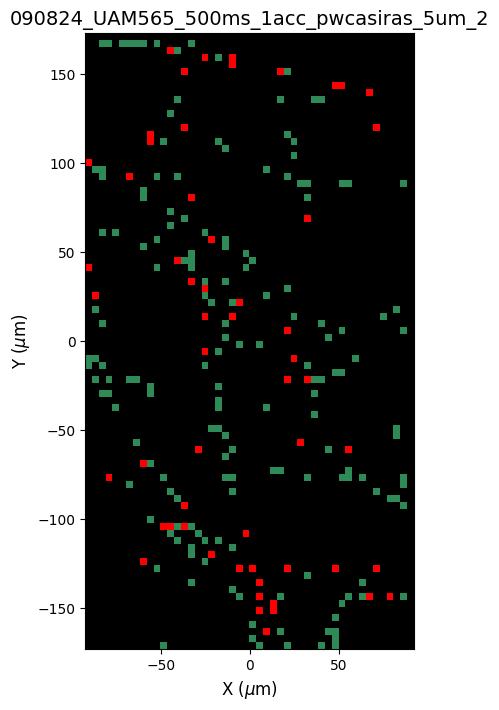


Processing file: 090824_UAM565_500ms_1acc_pwcasiras_5um_3
Valid: 184, Outliers: 62


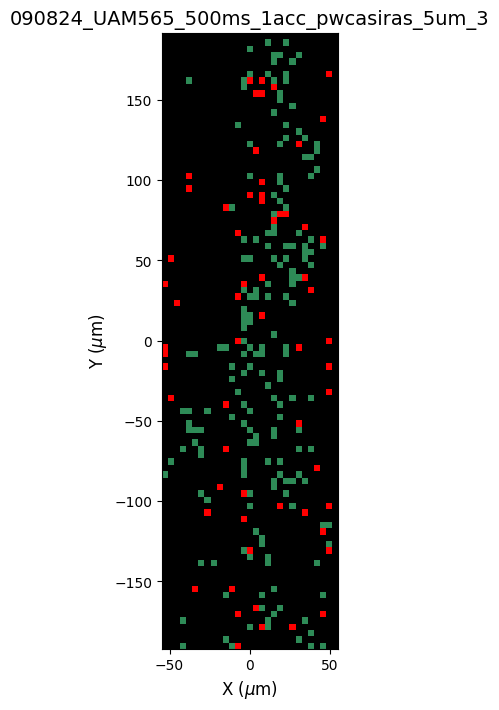


Processing file: 090824_UAM565_500ms_1acc_pwmuescacasi1_5um_1
Valid: 161, Outliers: 11


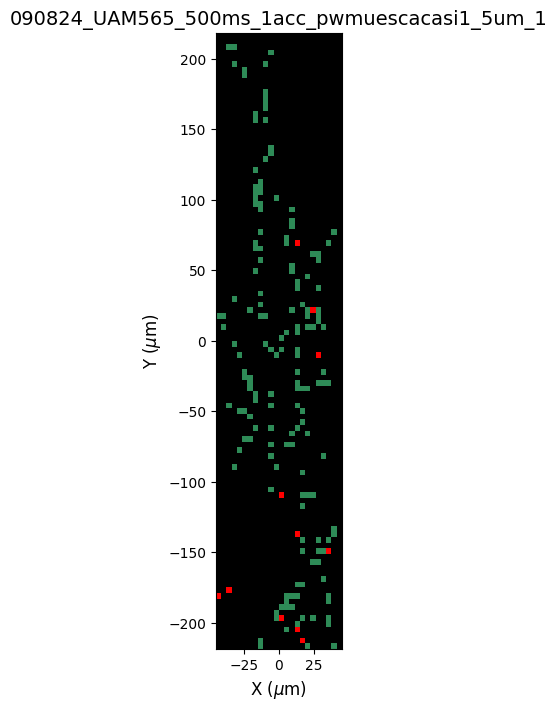


Processing file: 090824_UAM565_500ms_1acc_pwmuescacasi1_5um_2
Valid: 106, Outliers: 32


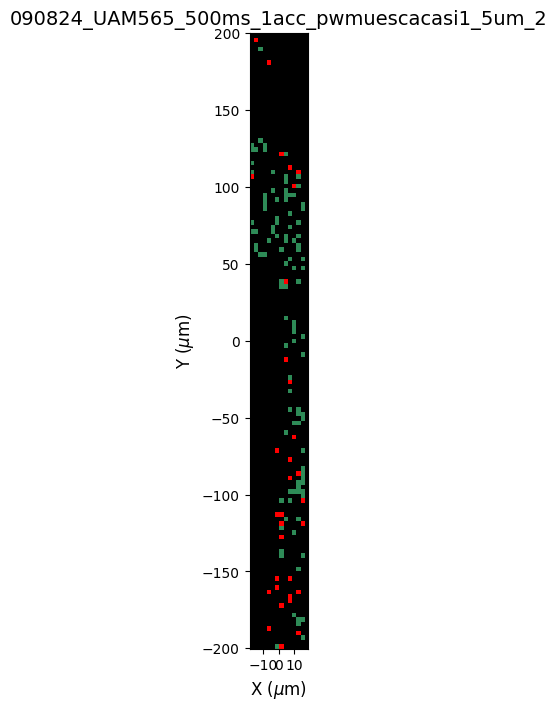


Processing file: 090824_UAM565_700ms_1acc_pwmuescacasi1_5um_1
Valid: 169, Outliers: 60


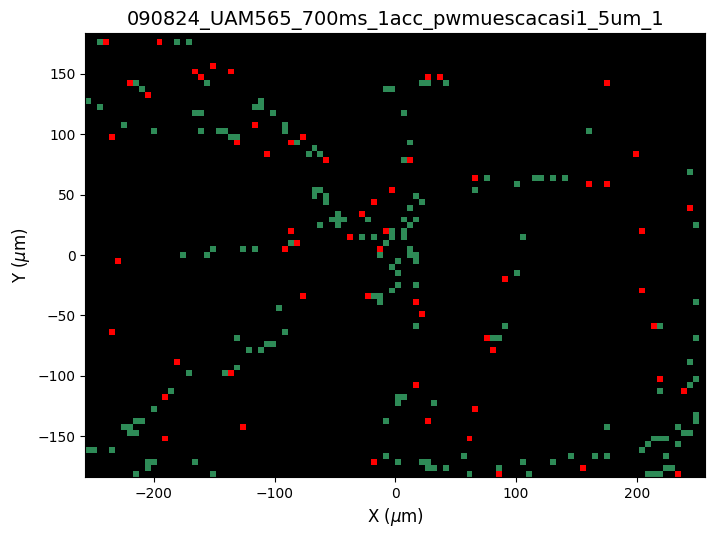


Processing file: 090824_UAM565_700ms_1acc_pwmuescacasi1_5um_2
Valid: 207, Outliers: 42


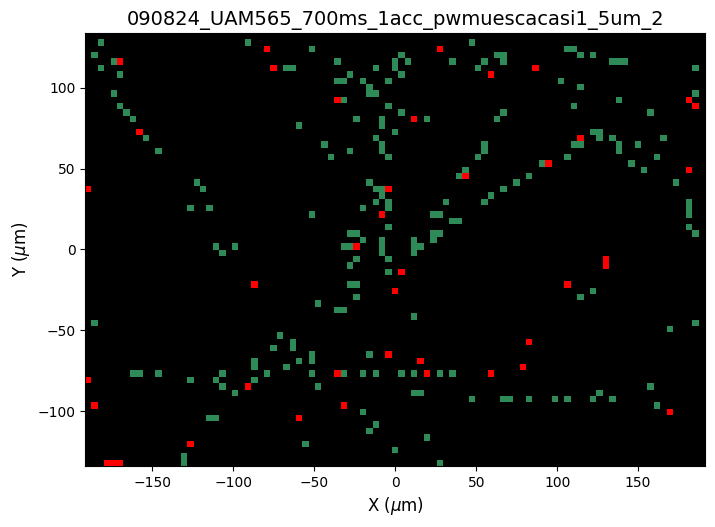


Processing file: 091024_UAM253_500ms_1acc_pwras_1
Valid: 173, Outliers: 0


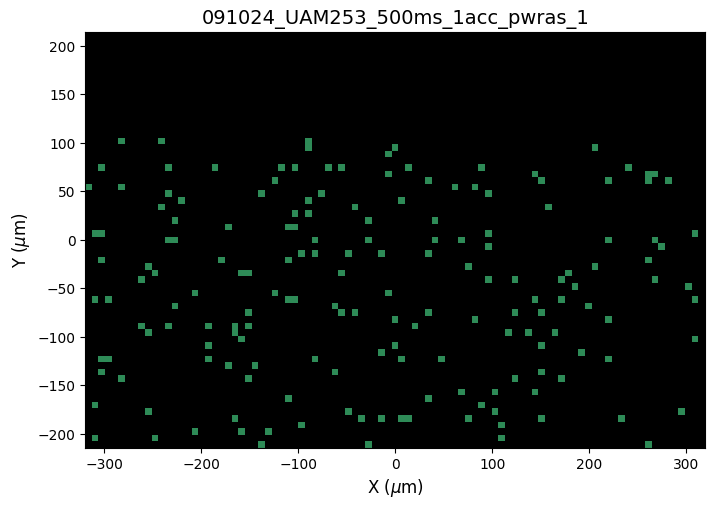


Processing file: 091024_UAM253_500ms_1acc_pwras_2
Valid: 54, Outliers: 0


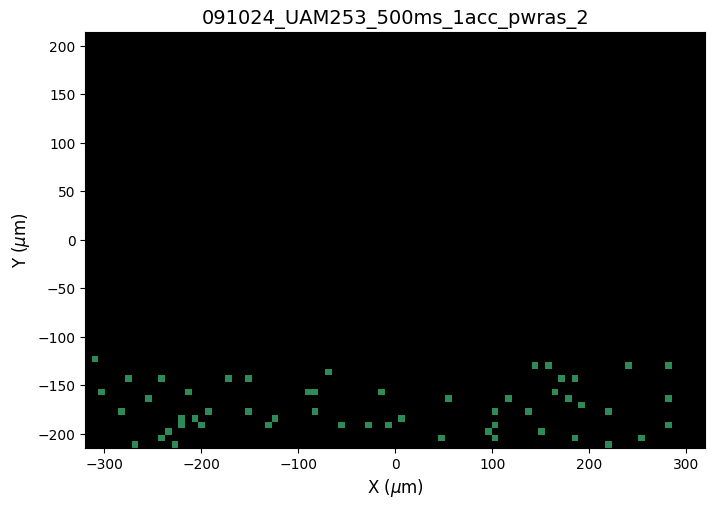


Processing file: 091024_UAM253_500ms_1acc_pwras_3
Valid: 105, Outliers: 1


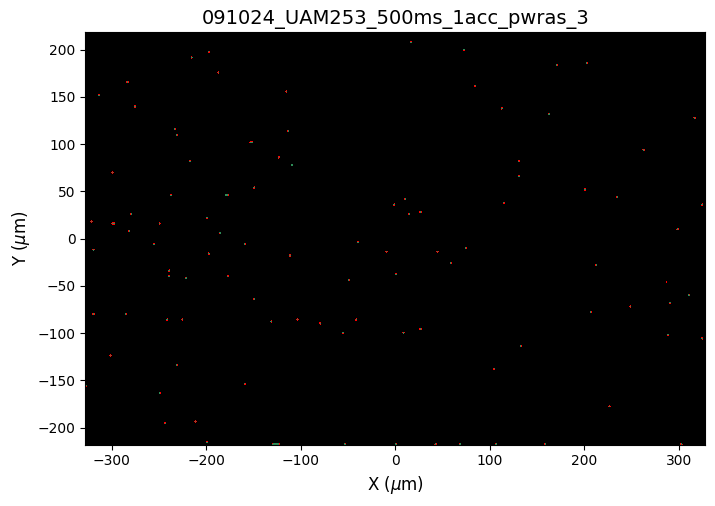


Processing file: 091024_UAM253_500ms_1acc_pwras_4
Valid: 83, Outliers: 0


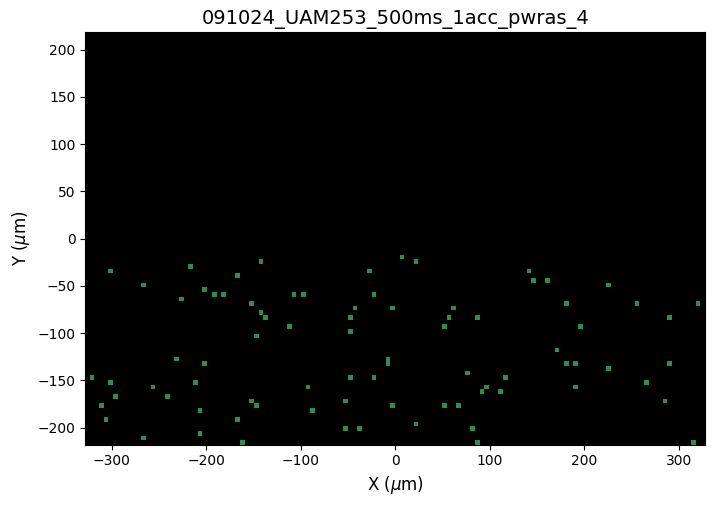


Processing file: 091024_UAM253_500ms_1acc_pwras_5
Valid: 158, Outliers: 0


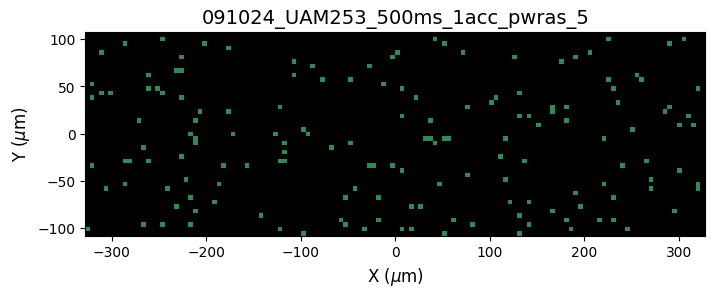


Processing file: 091024_UAM502_500ms_1acc_pwras_1
Valid: 23, Outliers: 0


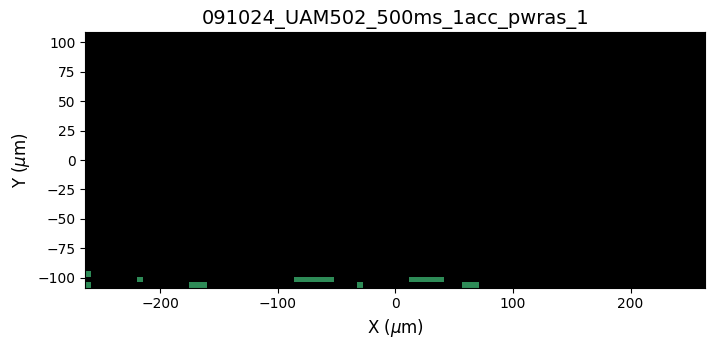


Processing file: 091024_UAM502_500ms_1acc_pwras_10
Valid: 56, Outliers: 1


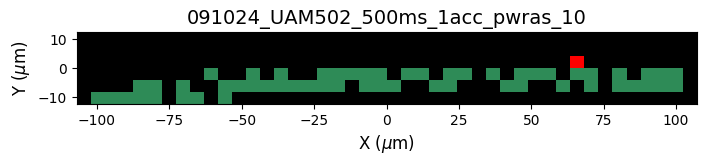


Processing file: 091024_UAM502_500ms_1acc_pwras_11
Valid: 48, Outliers: 2


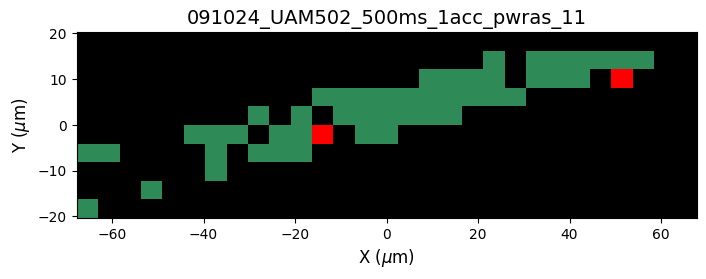


Processing file: 091024_UAM502_500ms_1acc_pwras_12
Valid: 44, Outliers: 2


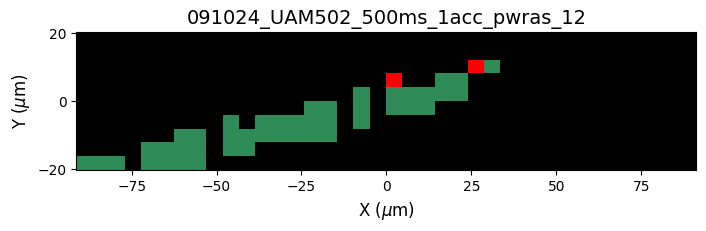


Processing file: 091024_UAM502_500ms_1acc_pwras_13
Valid: 21, Outliers: 2


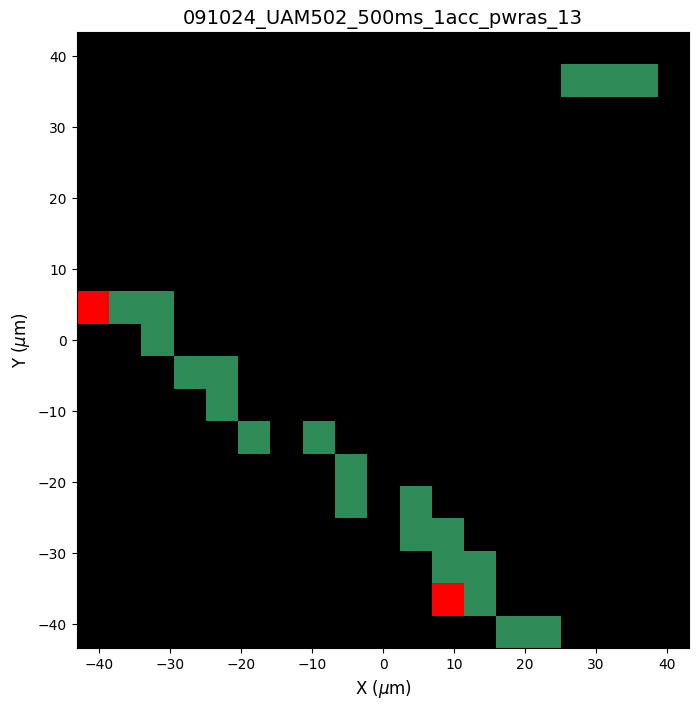


Processing file: 091024_UAM502_500ms_1acc_pwras_14
Valid: 19, Outliers: 0


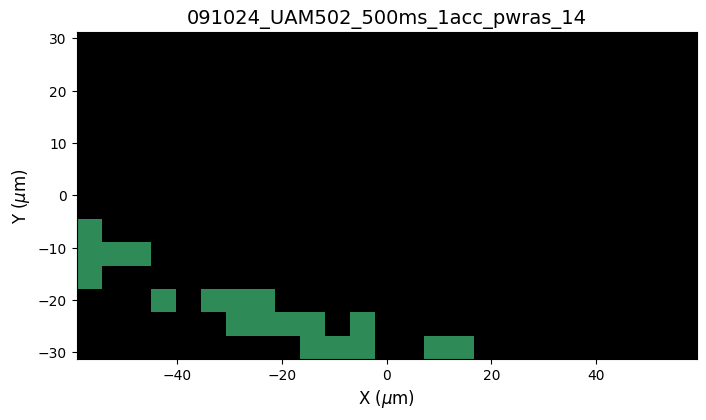


Processing file: 091024_UAM502_500ms_1acc_pwras_15
Valid: 16, Outliers: 0


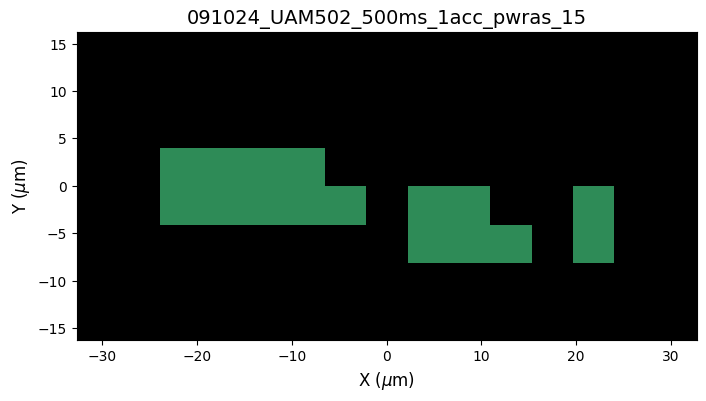


Processing file: 091024_UAM502_500ms_1acc_pwras_16
Valid: 19, Outliers: 0


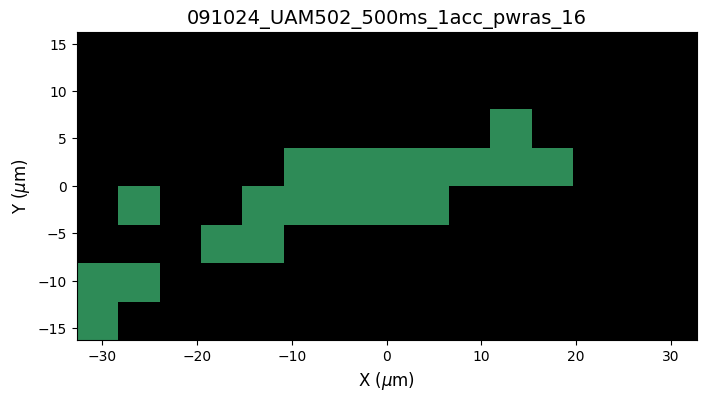


Processing file: 091024_UAM502_500ms_1acc_pwras_17
Valid: 58, Outliers: 0


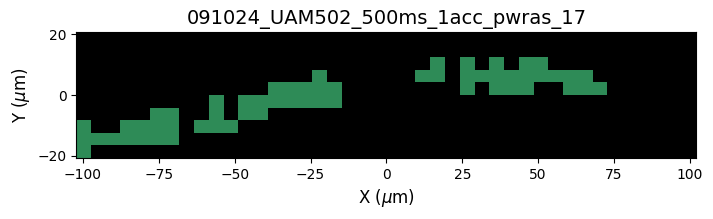


Processing file: 091024_UAM502_500ms_1acc_pwras_18
Valid: 96, Outliers: 2


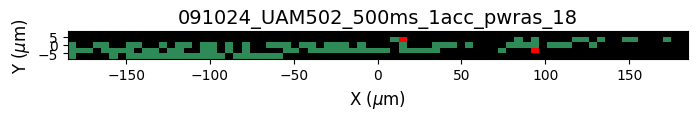


Processing file: 091024_UAM502_500ms_1acc_pwras_19
Valid: 60, Outliers: 3


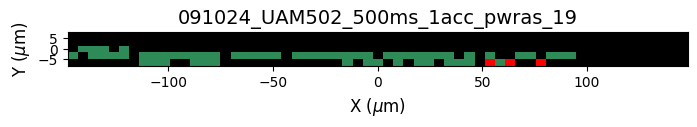


Processing file: 091024_UAM502_500ms_1acc_pwras_2
Valid: 107, Outliers: 2


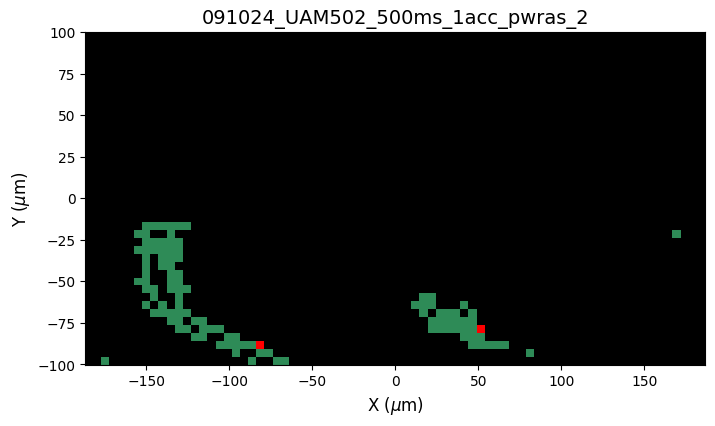


Processing file: 091024_UAM502_500ms_1acc_pwras_20
Valid: 67, Outliers: 0


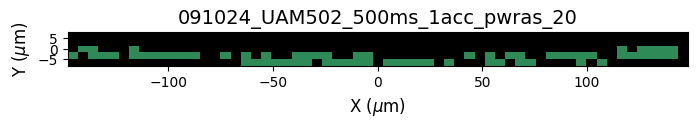


Processing file: 091024_UAM502_500ms_1acc_pwras_3
Valid: 11, Outliers: 0


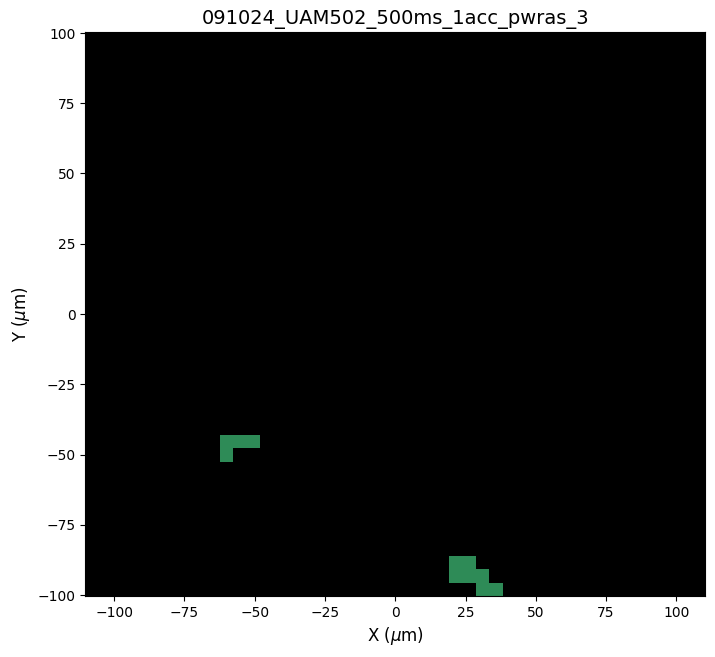


Processing file: 091024_UAM502_500ms_1acc_pwras_4
Valid: 24, Outliers: 3


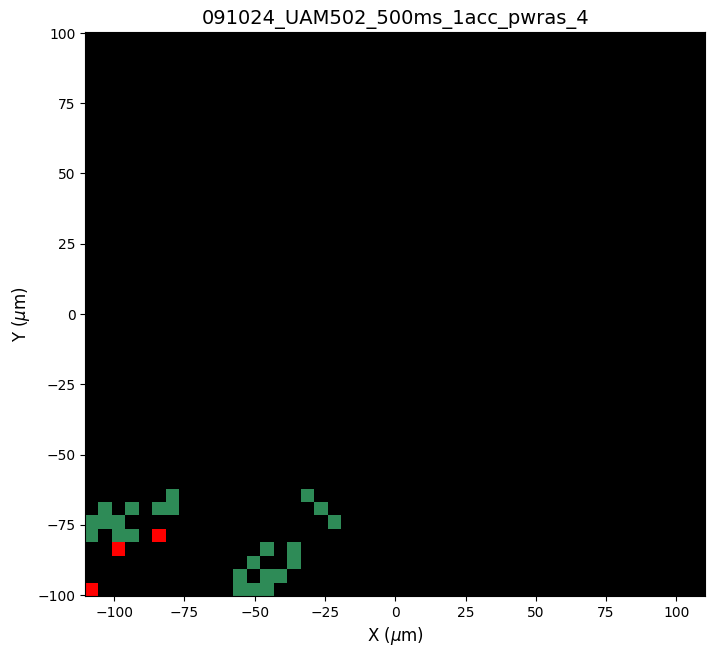


Processing file: 091024_UAM502_500ms_1acc_pwras_5
Valid: 15, Outliers: 0


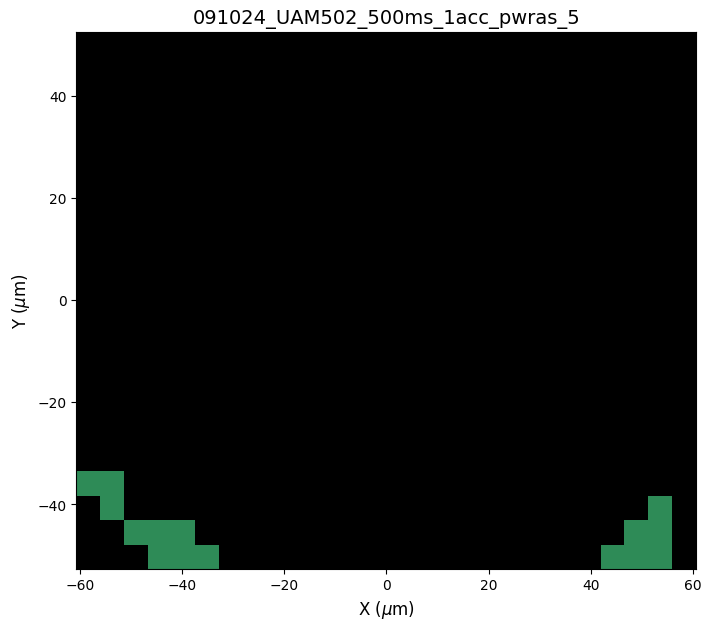


Processing file: 091024_UAM502_500ms_1acc_pwras_6
Valid: 4, Outliers: 0


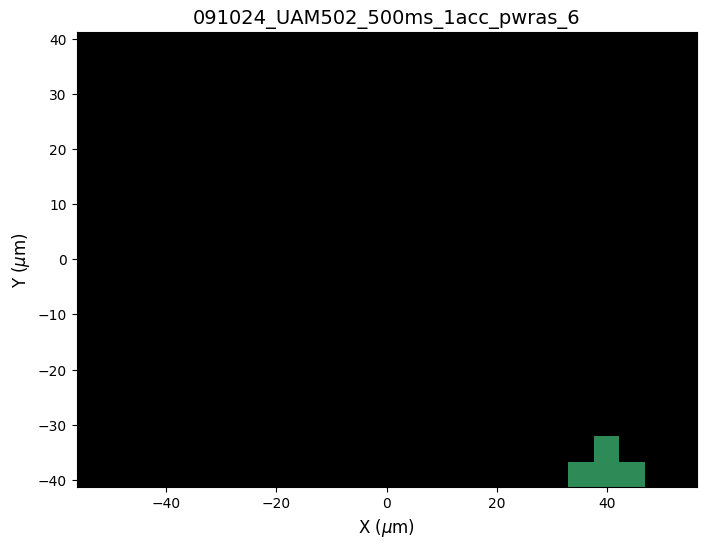


Processing file: 091024_UAM502_500ms_1acc_pwras_7
Valid: 29, Outliers: 3


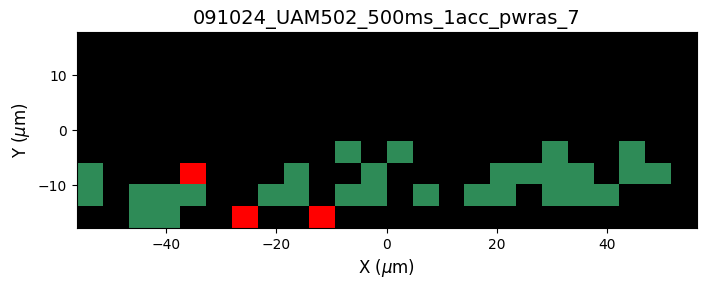


Processing file: 091024_UAM502_500ms_1acc_pwras_8
Valid: 95, Outliers: 3


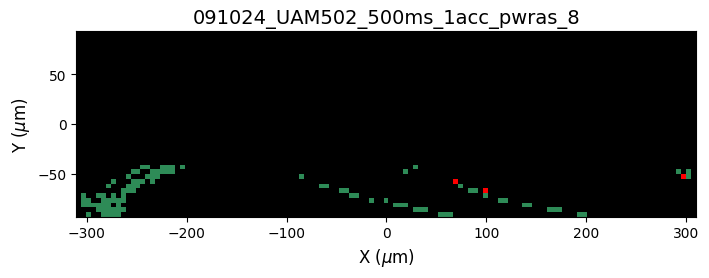


Processing file: 091024_UAM502_500ms_1acc_pwras_9
Valid: 122, Outliers: 3


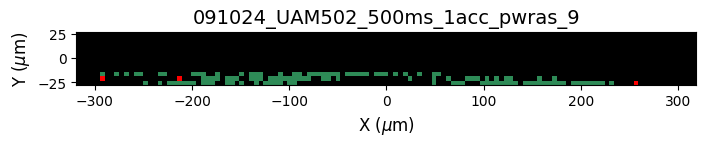


Processing file: 091024_UAM565_500ms_1acc_pwras_1
Valid: 2, Outliers: 0


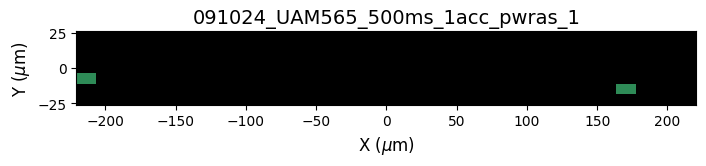


Processing file: 091024_UAM565_500ms_1acc_pwras_10
Valid: 4, Outliers: 0


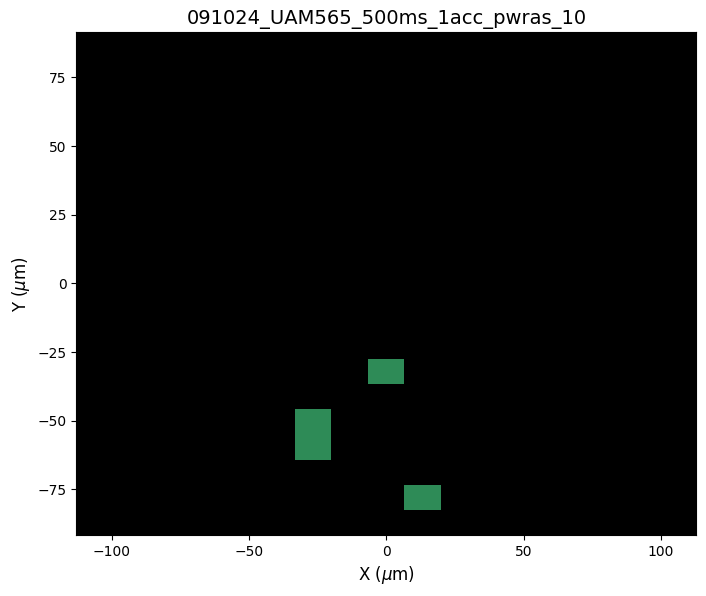


Processing file: 091024_UAM565_500ms_1acc_pwras_11
Valid: 119, Outliers: 9


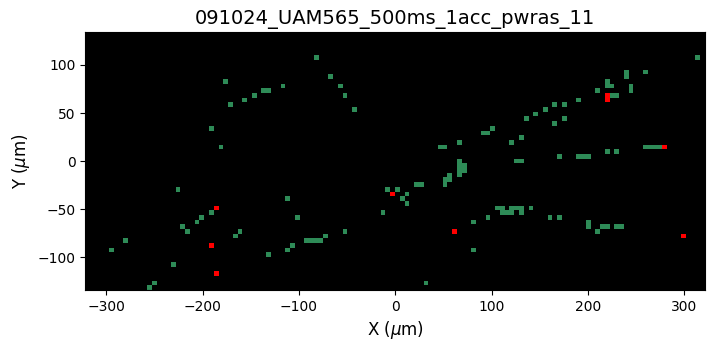


Processing file: 091024_UAM565_500ms_1acc_pwras_16
Valid: 137, Outliers: 0


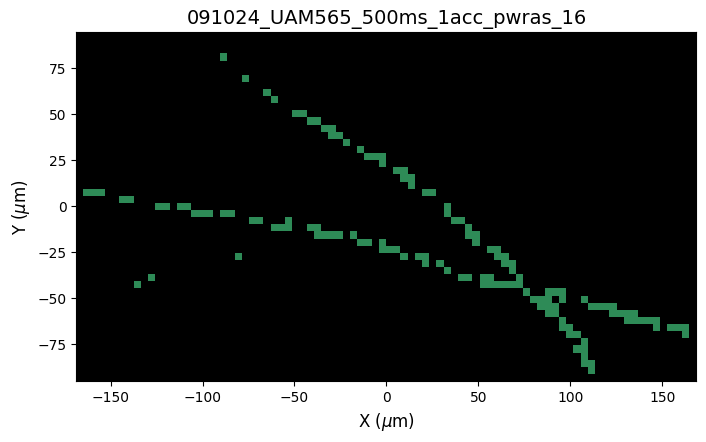


Processing file: 091024_UAM565_500ms_1acc_pwras_2
Valid: 9, Outliers: 0


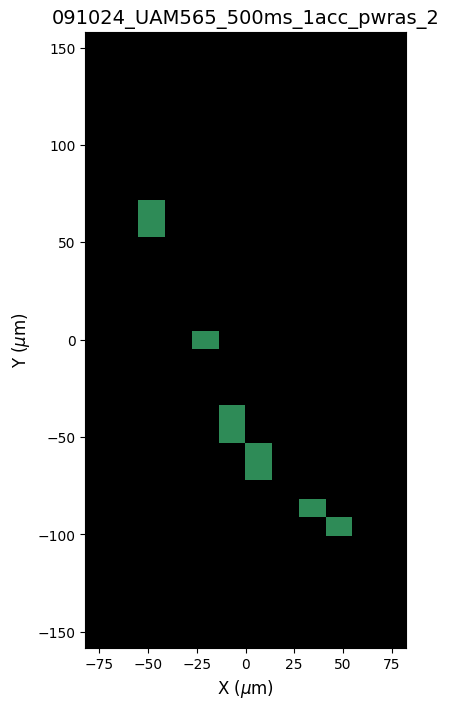


Processing file: 091024_UAM565_500ms_1acc_pwras_3
Valid: 7, Outliers: 1


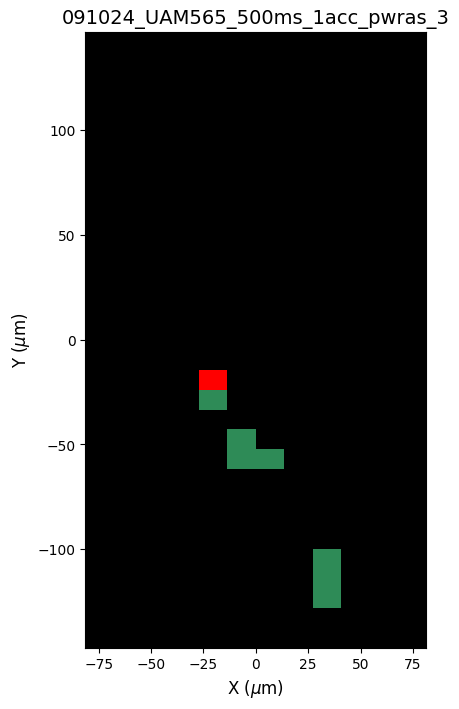


Processing file: 091024_UAM565_500ms_1acc_pwras_4
Valid: 1, Outliers: 0


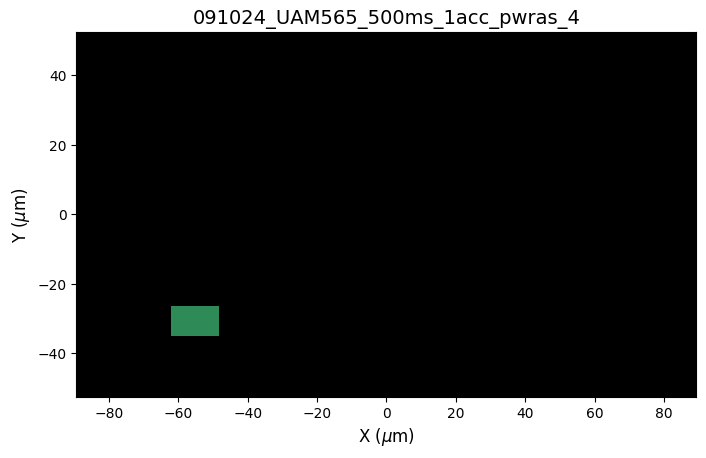


Processing file: 091024_UAM565_500ms_1acc_pwras_5
Valid: 8, Outliers: 0


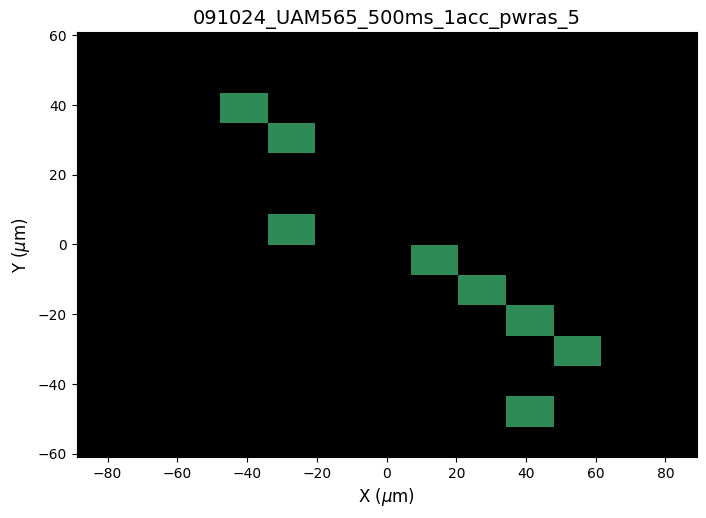


Processing file: 091024_UAM565_500ms_1acc_pwras_6
Valid: 4, Outliers: 0


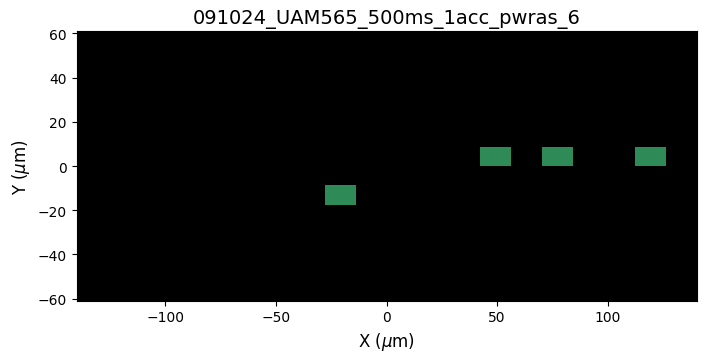


Processing file: 091024_UAM565_500ms_1acc_pwras_7
Valid: 12, Outliers: 3


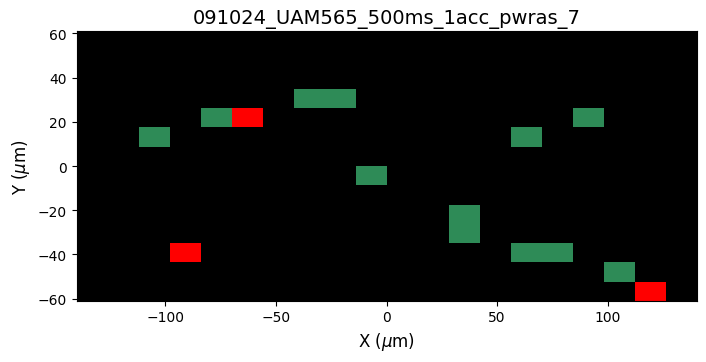


Processing file: 091024_UAM565_500ms_1acc_pwras_8
Valid: 5, Outliers: 0


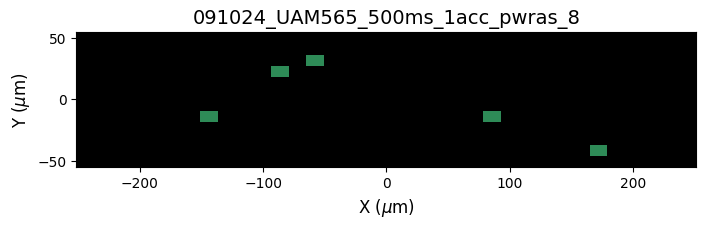


Processing file: 091024_UAM565_500ms_1acc_pwras_9
Valid: 27, Outliers: 2


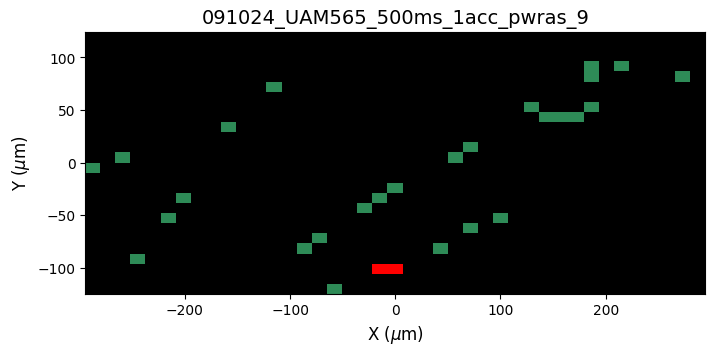


Processing file: 091024_UAM565_controzos_500ms_1acc_pwras_12
Valid: 16, Outliers: 0


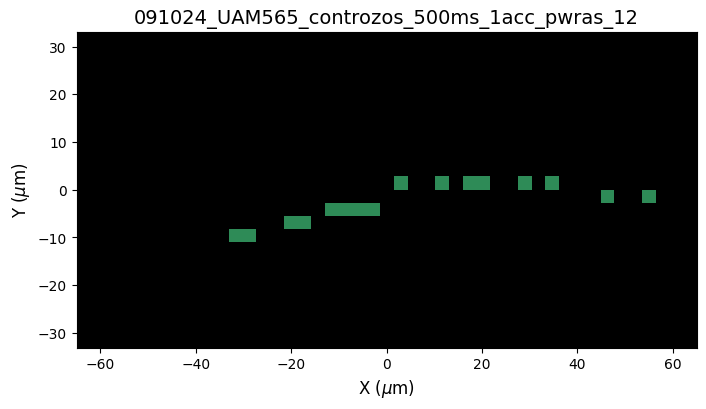


Processing file: 091024_UAM565_controzos_500ms_1acc_pwras_13
Valid: 100, Outliers: 2


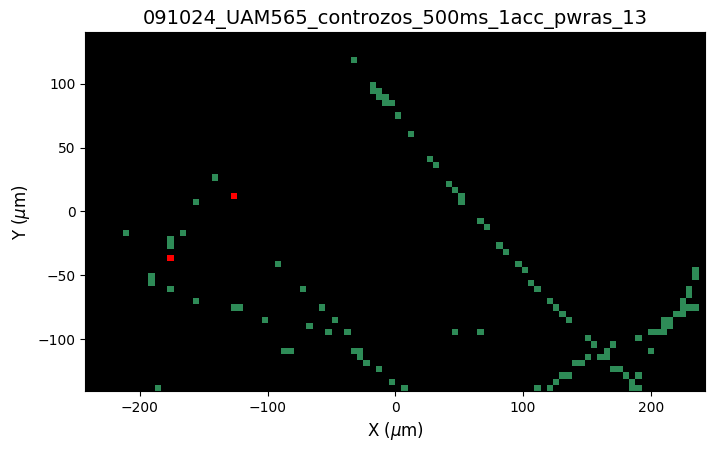


Processing file: 091024_UAM565_controzos_500ms_1acc_pwras_14
Valid: 103, Outliers: 1


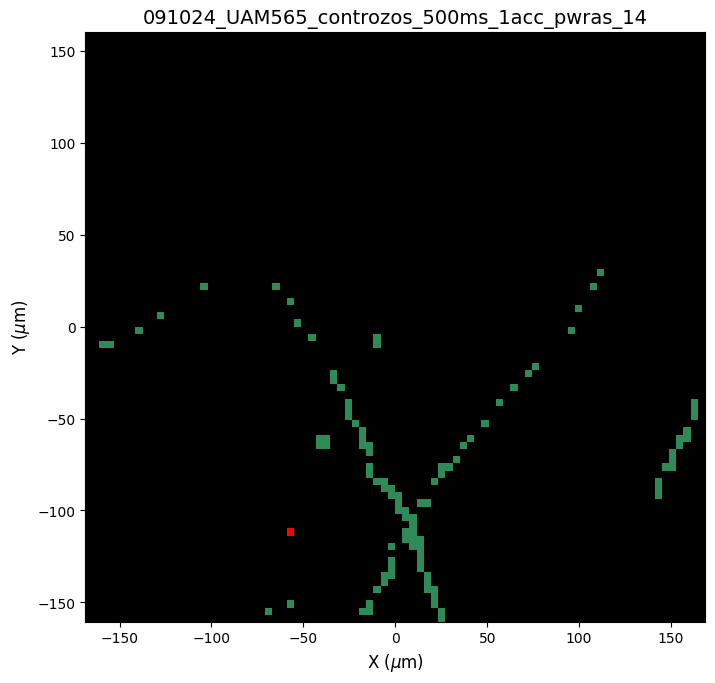


Processing file: 091024_UAM565_controzos_500ms_1acc_pwras_15
Valid: 41, Outliers: 0


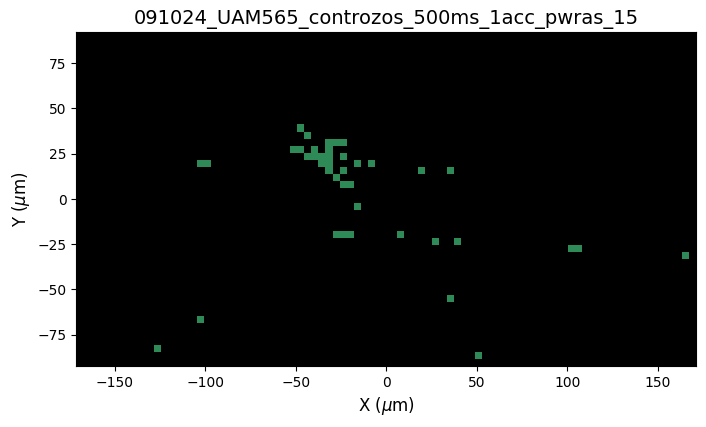


Processing file: 091024_UAM565_controzos_500ms_1acc_pwras_17
Valid: 62, Outliers: 0


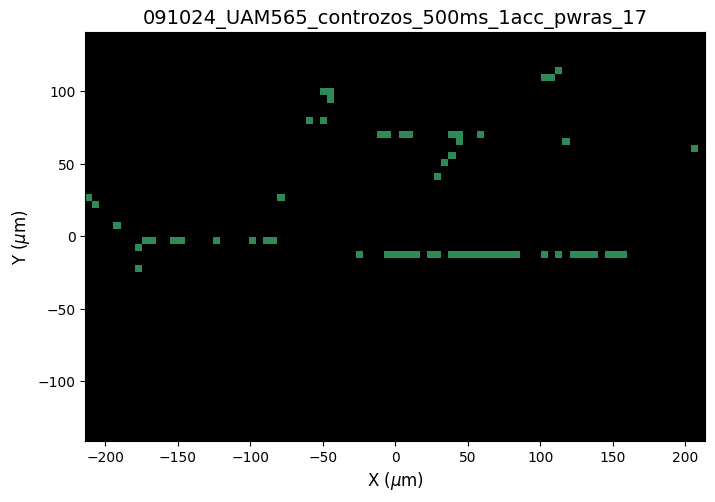


Processing file: 091024_UAM588_2_500ms_1acc_pwras_1
Valid: 39, Outliers: 0


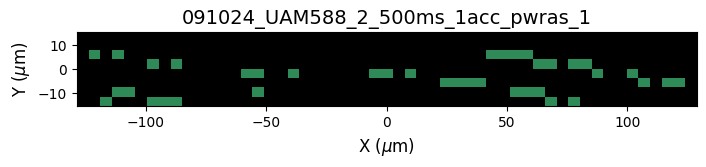


Processing file: 091024_UAM588_2_500ms_1acc_pwras_2
Valid: 10, Outliers: 0


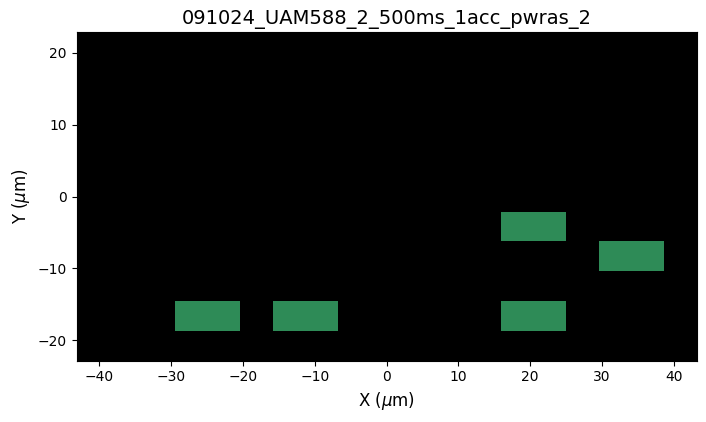


Processing file: 091024_UAM588_2_500ms_1acc_pwras_3
Valid: 52, Outliers: 0


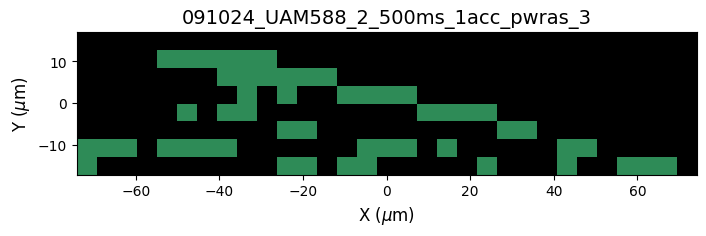


Processing file: 091024_UAM588_2_500ms_1acc_pwras_4
Valid: 54, Outliers: 0


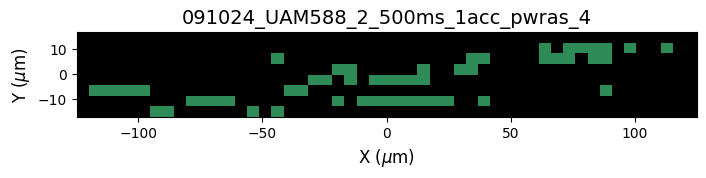


Processing file: 091024_UAM588_2_500ms_1acc_pwras_5
Valid: 111, Outliers: 0


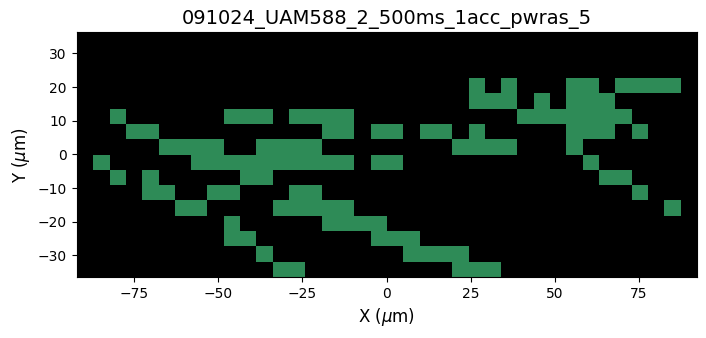


Processing file: 091024_UAM588_2_500ms_1acc_pwras_6
Valid: 44, Outliers: 2


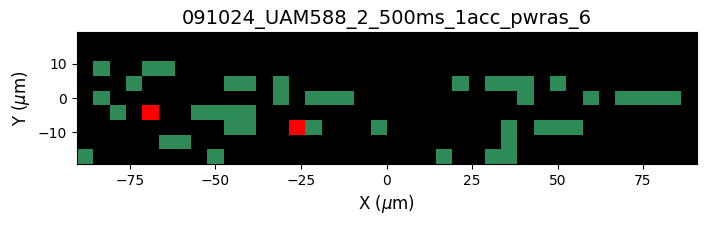


Processing file: 091024_UAM588_2_500ms_1acc_pwras_7
Valid: 46, Outliers: 0


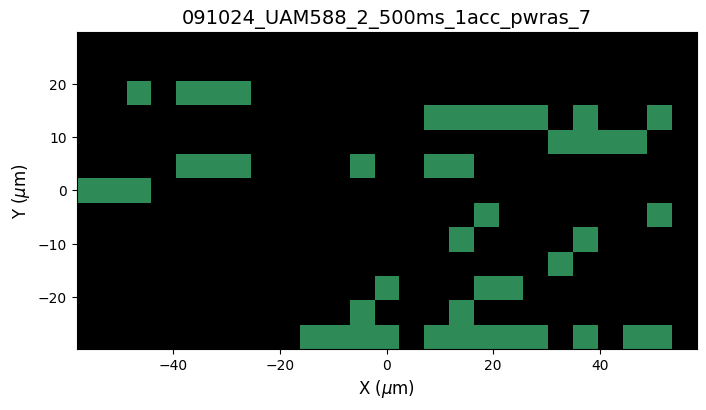


Processing file: 091024_UAM588_2_500ms_1acc_pwras_8
Valid: 159, Outliers: 9


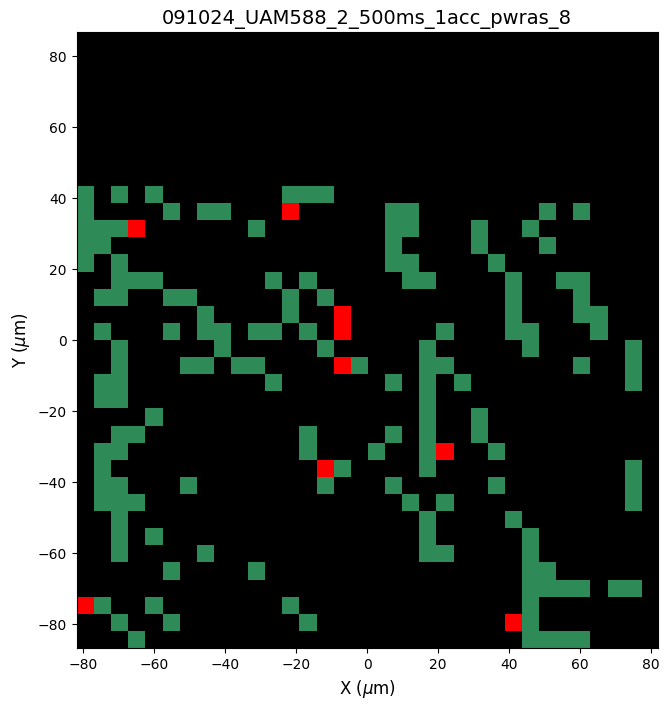


Processing file: 091024_UAM588_500ms_1acc_pwras_1
Valid: 410, Outliers: 6


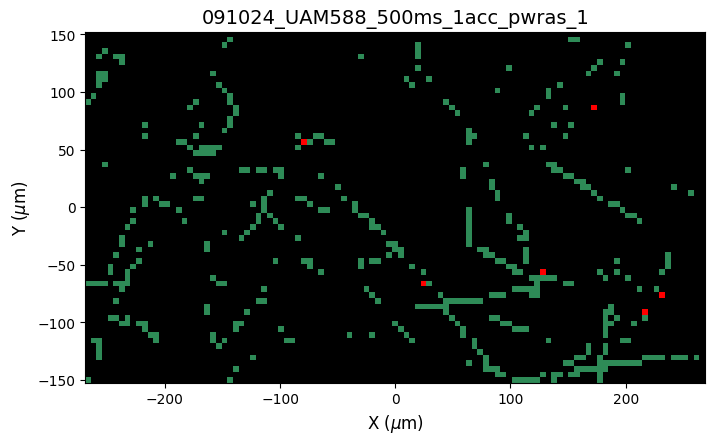


Processing file: 091024_UAM588_500ms_1acc_pwras_2
Valid: 180, Outliers: 1


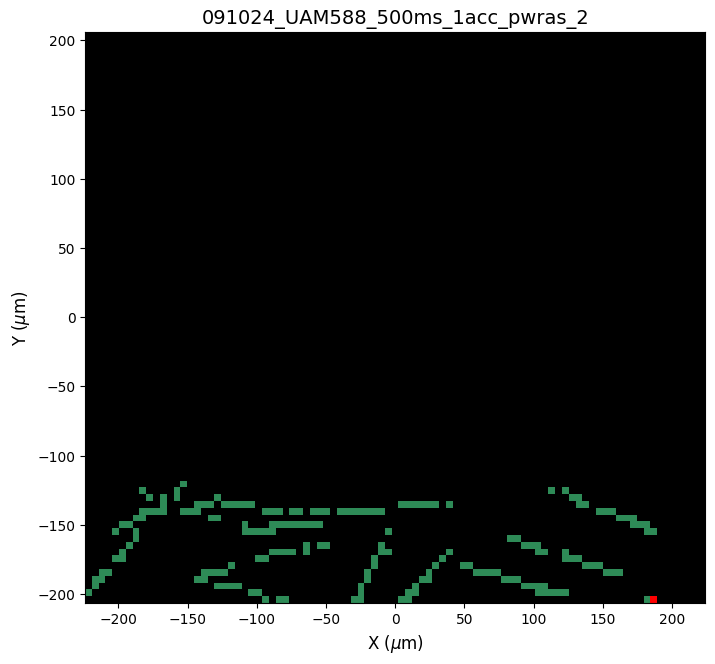


Processing file: 091024_UAM588_500ms_1acc_pwras_3
Valid: 338, Outliers: 11


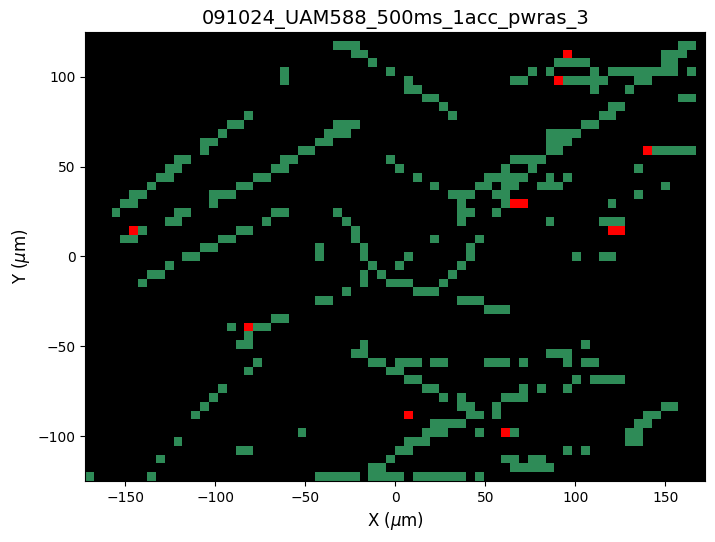


Processing file: 091024_UAM588_500ms_1acc_pwras_4
Valid: 4, Outliers: 1


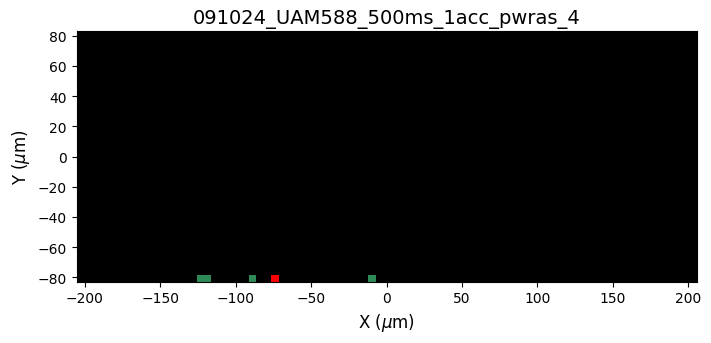


Processing file: 091024_UAM588_500ms_1acc_pwras_5
Valid: 157, Outliers: 0


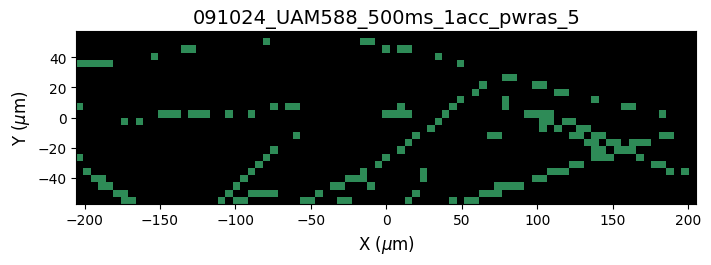


Processing file: 100724_UAM502_500ms_1acc_pwmuesca1
Valid: 354, Outliers: 5


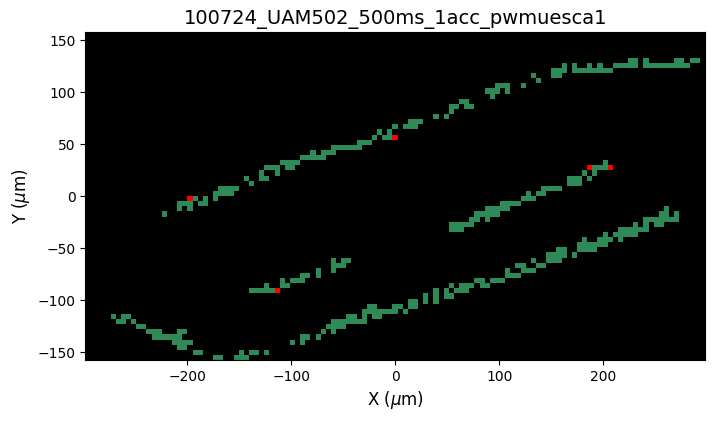


Processing file: 100724_UAM502_500ms_1acc_pwmuesca1_2
Valid: 90, Outliers: 4


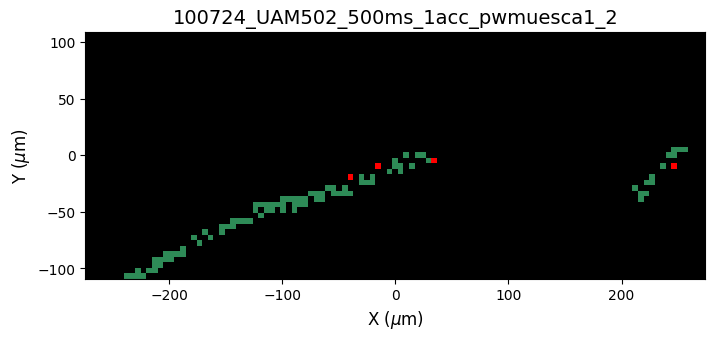


Processing file: 100724_UAM502_500ms_1acc_pwmuesca1_3
Valid: 36, Outliers: 0


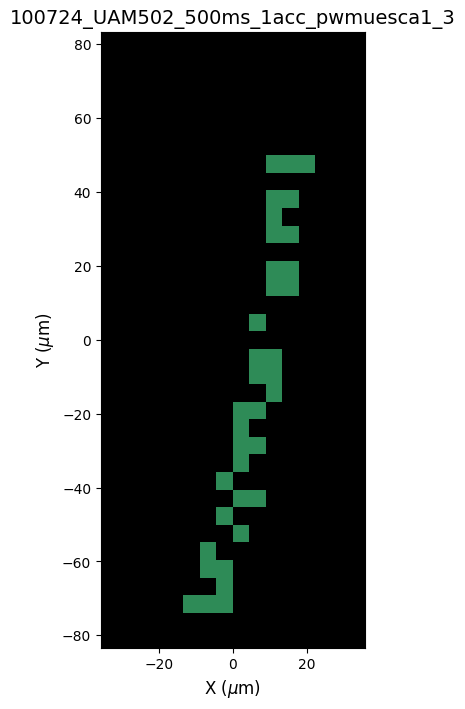


Processing file: 100724_UAM588_1s_2acc_2um
Valid: 756, Outliers: 0


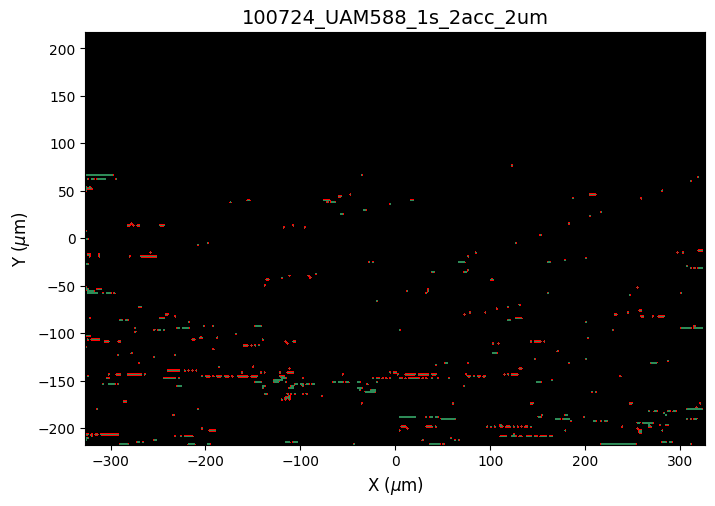


Processing file: 100824_UAM565_1s_1acc_pwcasi1_2um_1
Valid: 192, Outliers: 75


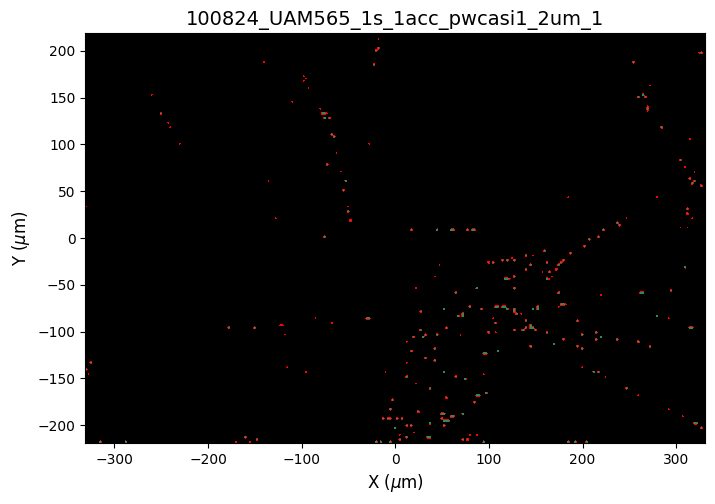


Processing file: 110624_UAM253_1s_1acc_pwmuesca1_10um_3
Valid: 200, Outliers: 1
No data found in `infomapas` for the file: 110624_UAM253_1s_1acc_pwmuesca1_10um_3

Processing file: 110624_UAM253_1s_1acc_pwmuesca1_5um_1
Valid: 821, Outliers: 34


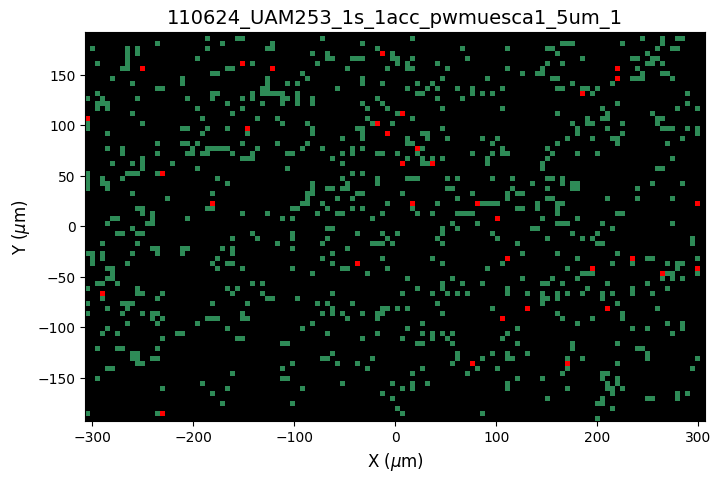


Processing file: 110624_UAM253_1s_1acc_pwmuesca1_7um_2
Valid: 389, Outliers: 1


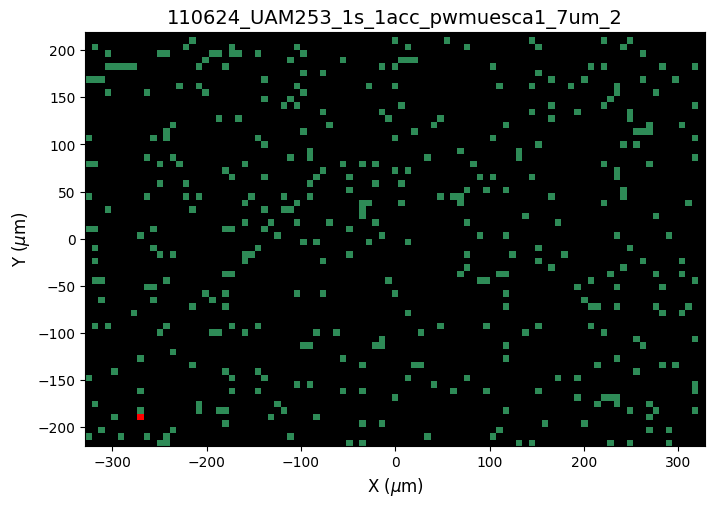


Processing file: 120624_UAM253_1s_1acc_pwmuesca1_10um_4
Valid: 269, Outliers: 3


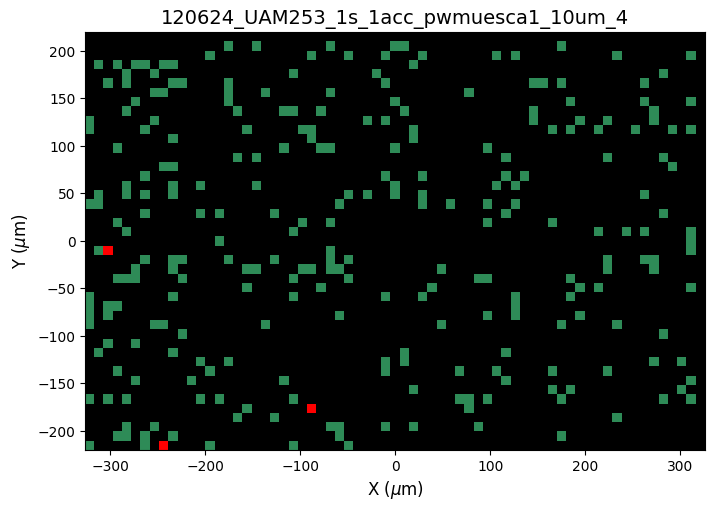


Processing file: 120624_UAM253_1s_1acc_pwmuesca1_10um_6
Valid: 233, Outliers: 0


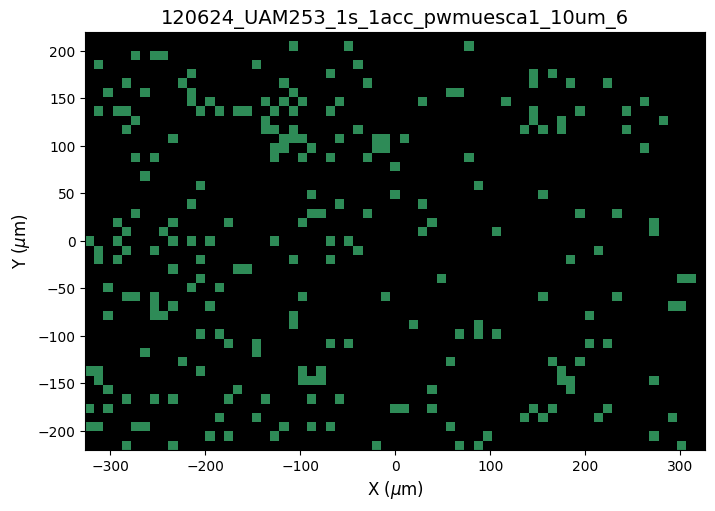


Processing file: 120624_UAM253_1s_1acc_pwmuesca1_5um_5
Valid: 616, Outliers: 16


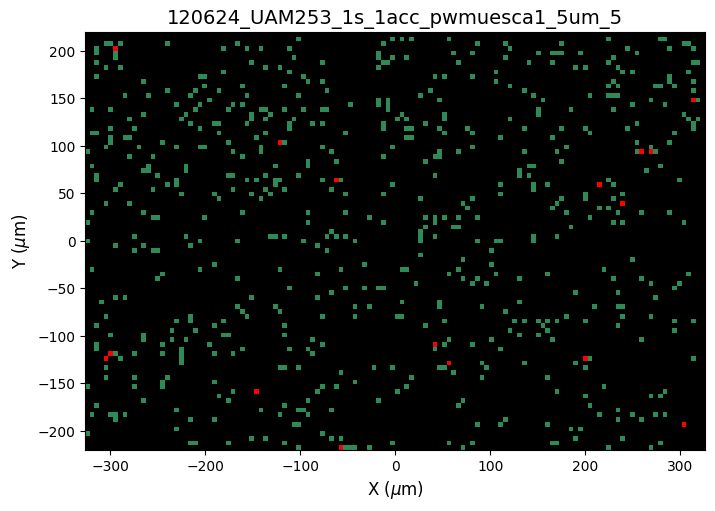


Processing file: 120624_UAM253_1s_1acc_pwras_5um_10
Valid: 149, Outliers: 9


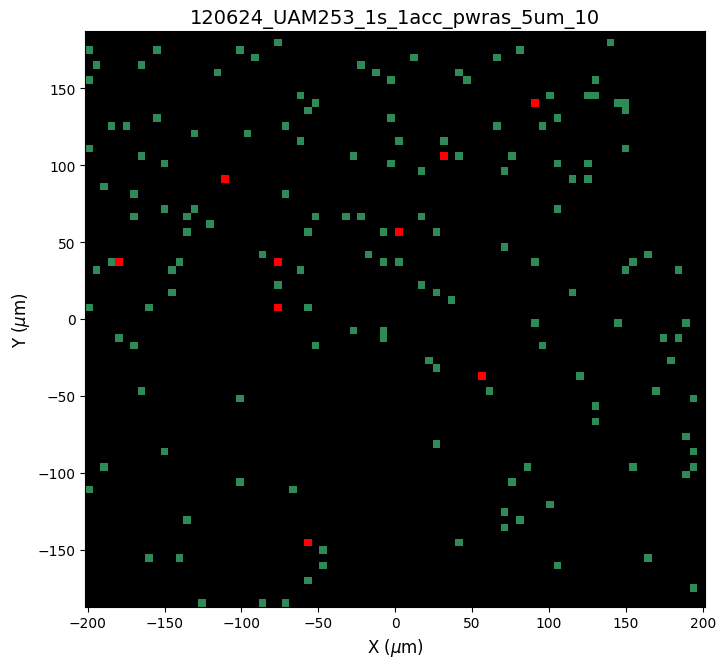


Processing file: 120624_UAM253_1s_1acc_pwras_5um_9
Valid: 480, Outliers: 11


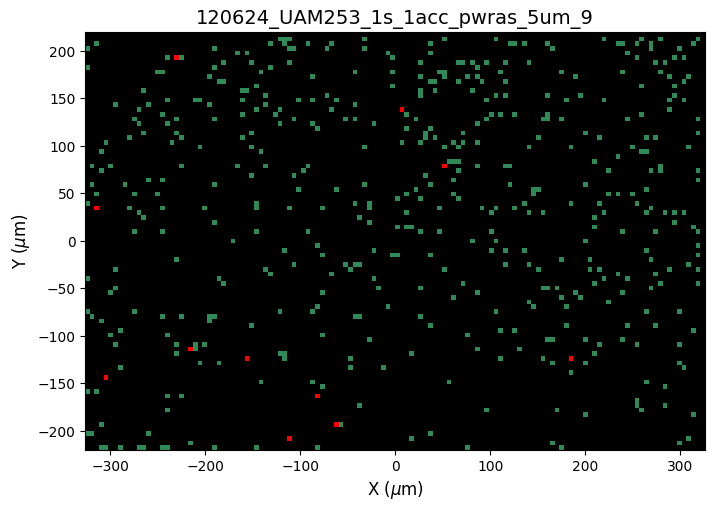


Processing file: 120624_UAM253_2s_1acc_pwmuesca1_10um_7
Valid: 338, Outliers: 2


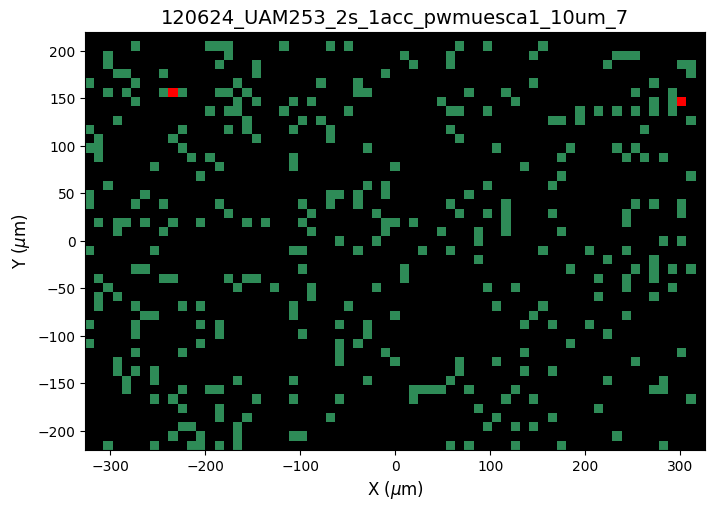


Processing file: 120624_UAM253_2s_1acc_pwmuesca1_10um_8
Valid: 405, Outliers: 1


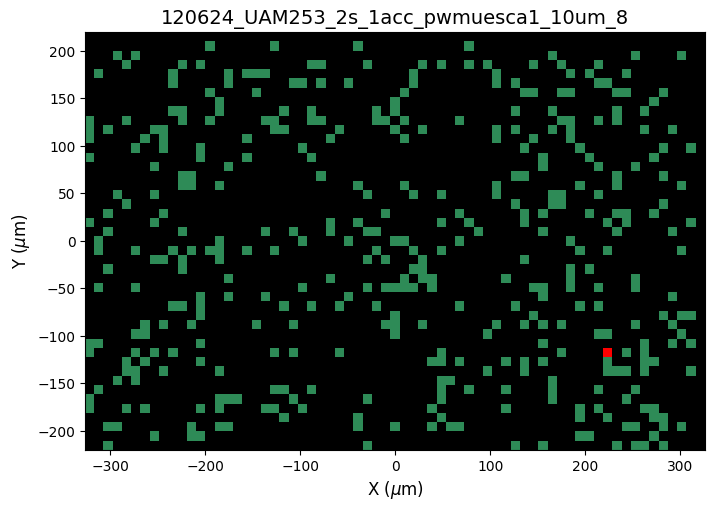


Processing file: 120824_UAM565_300ms_1acc_pwcasiras_6um_1
Valid: 315, Outliers: 43


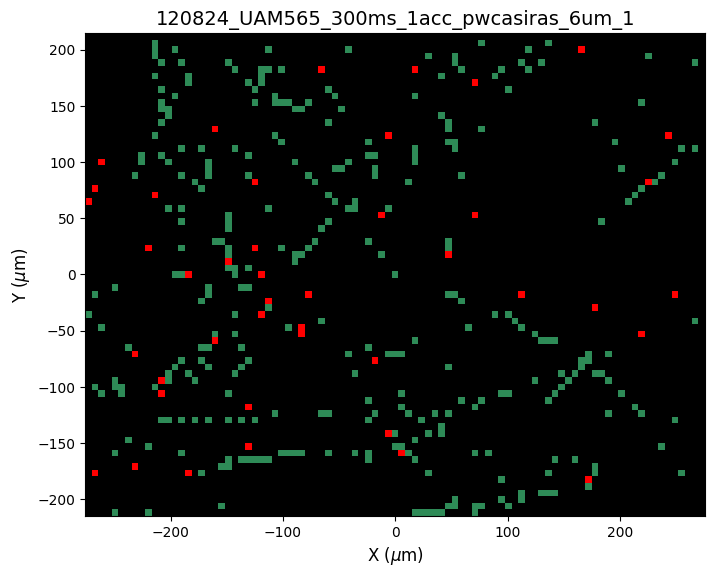


Processing file: 120824_UAM565_300ms_1acc_pwcasiras_6um_2
Valid: 226, Outliers: 11


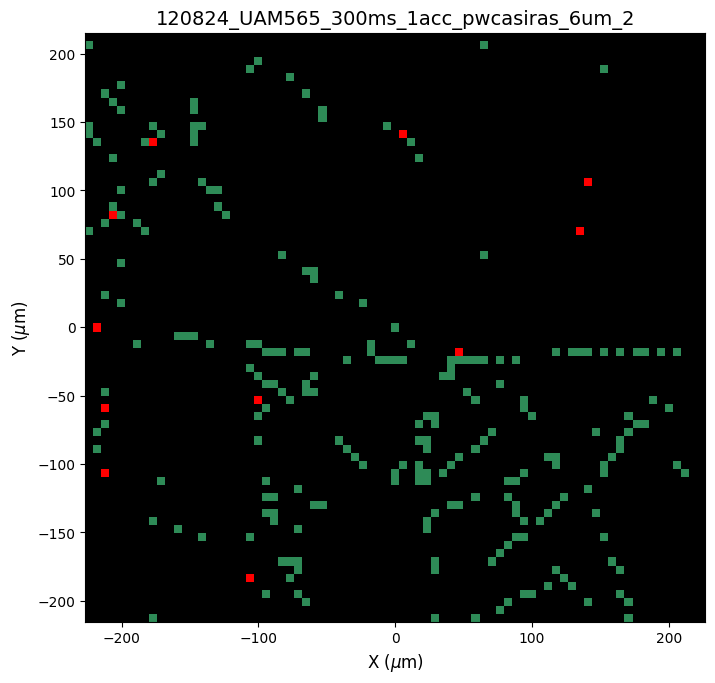


Processing file: 120824_UAM565_300ms_1acc_pwcasiras_6um_3
Valid: 172, Outliers: 34


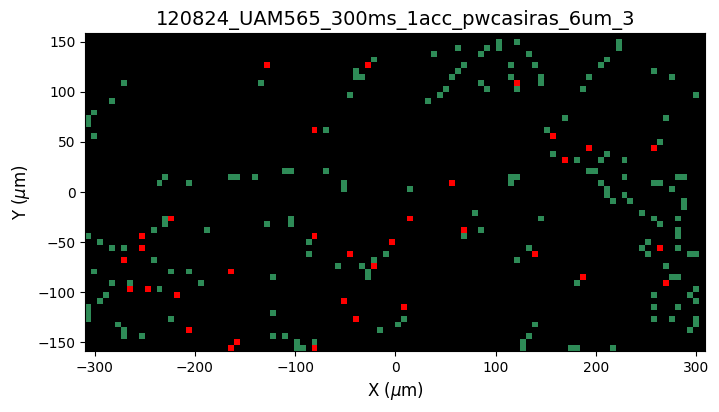


Processing file: 120824_UAM565_300ms_1acc_pwcasiras_6um_4
Valid: 24, Outliers: 5


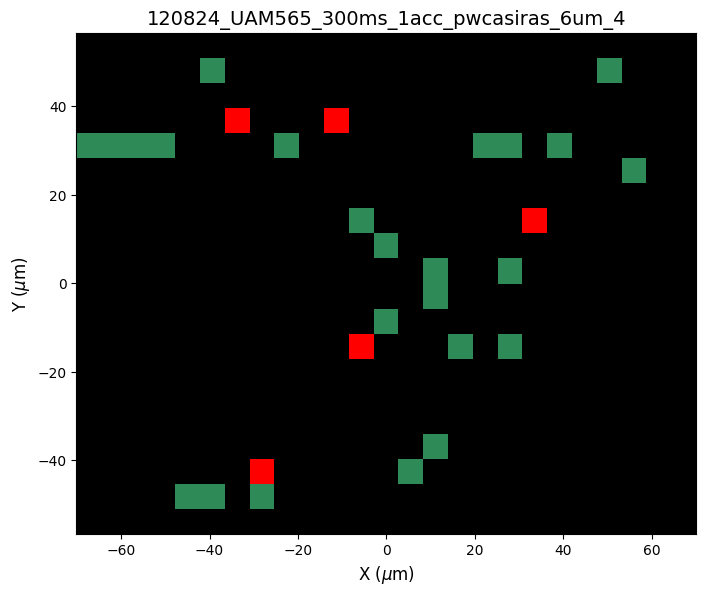


Processing file: 120824_UAM565_300ms_1acc_pwcasiras_6um_5
Valid: 133, Outliers: 2


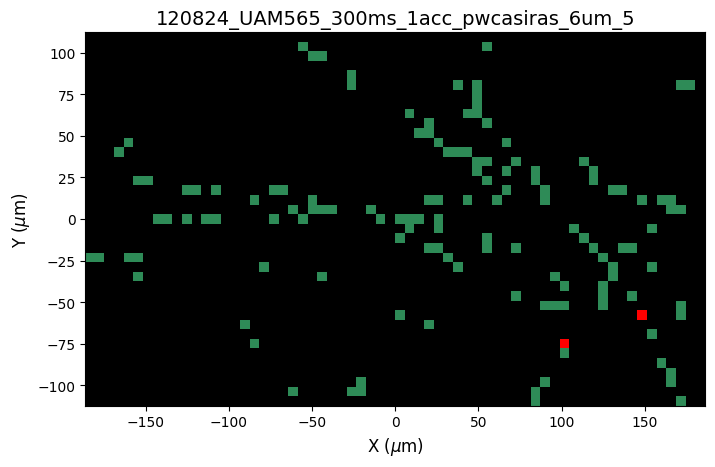


Processing file: 120824_UAM565_300ms_1acc_pwmedio1_5um_3
Valid: 148, Outliers: 23


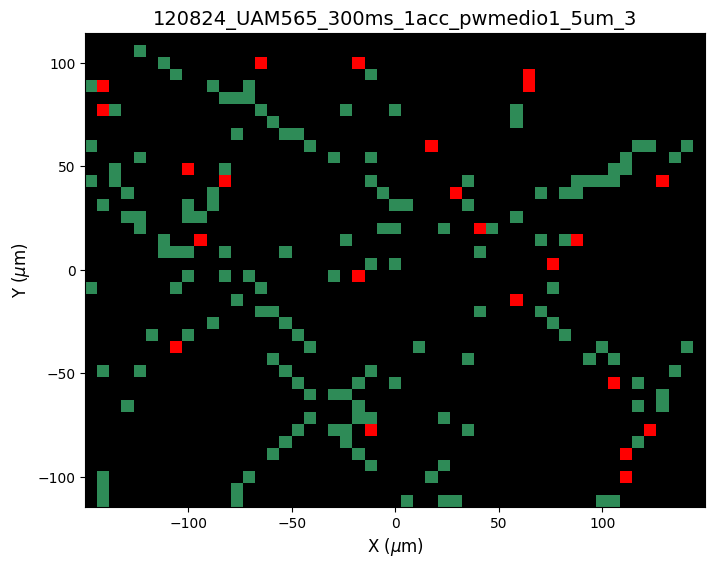


Processing file: 120824_UAM565_500ms_1acc_pwmedio1_5um_1
Valid: 228, Outliers: 23


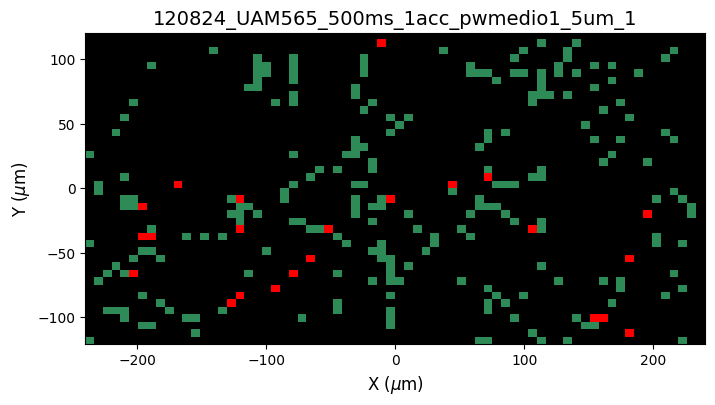


Processing file: 120824_UAM565_500ms_1acc_pwmedio1_5um_2
Valid: 215, Outliers: 56


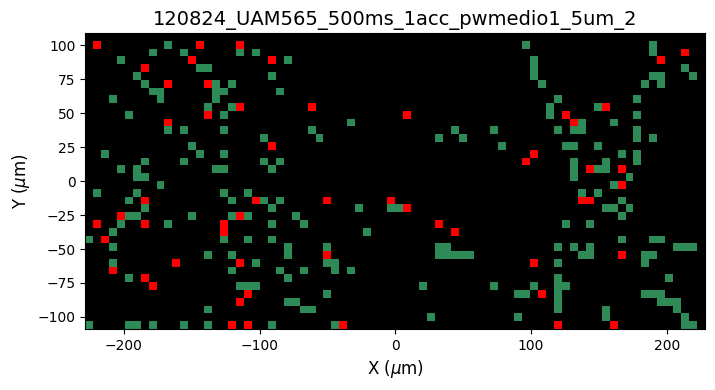


Processing file: 120824_UAM565_500ms_1acc_pwmedio1_5um_3
Valid: 114, Outliers: 2


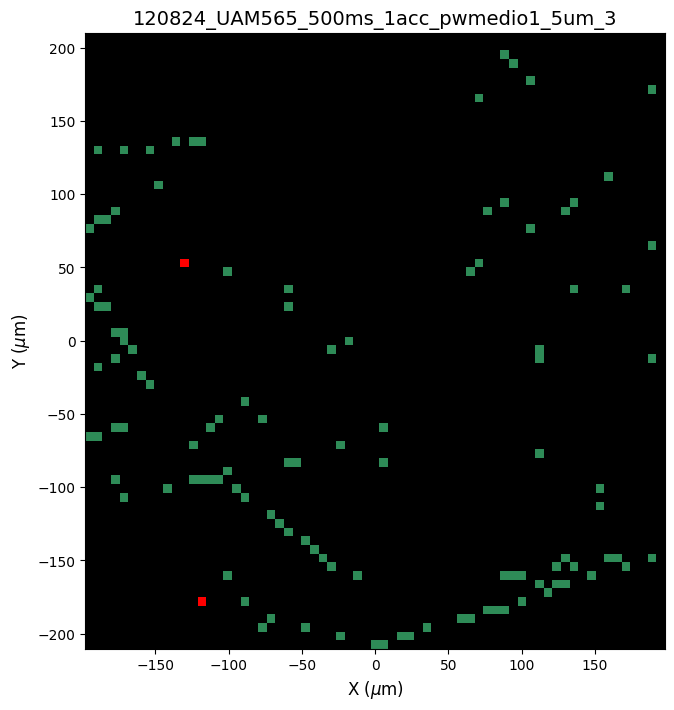


Processing file: 120824_UAM565_500ms_1acc_pwmedio1_5um_4
Valid: 58, Outliers: 12


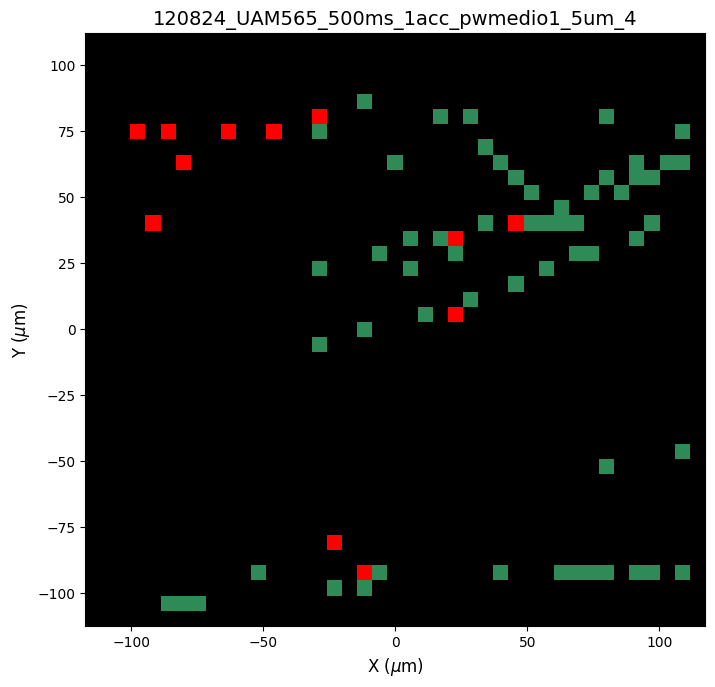


Processing file: 120824_UAM565_500ms_1acc_pwmedio1_5um_5
Valid: 99, Outliers: 10


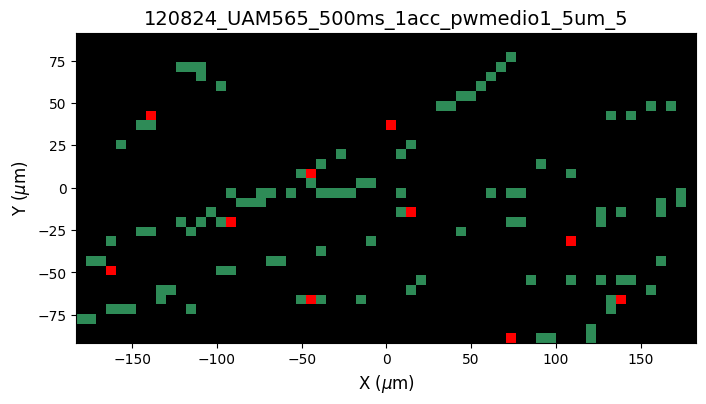


Processing file: 120824_UAM565_500ms_1acc_pwmedio1_5um_6
Valid: 66, Outliers: 0


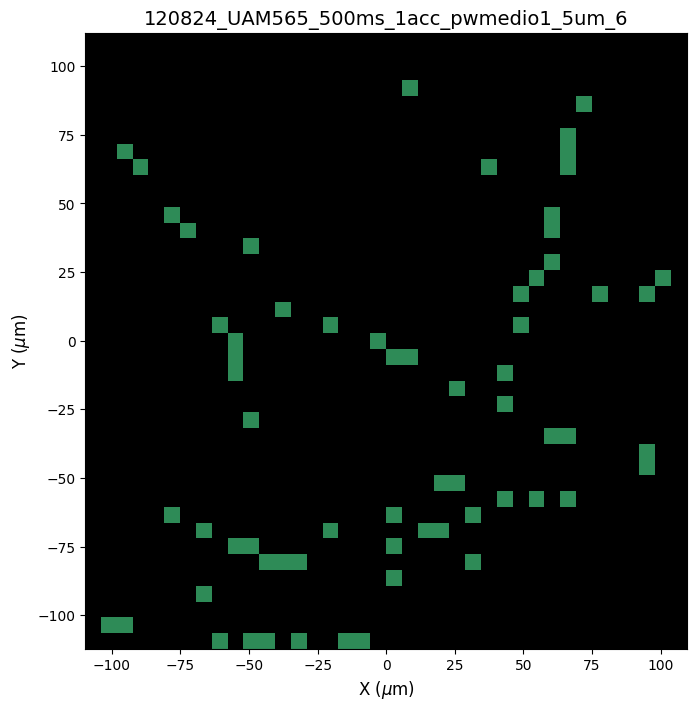


Processing file: 130824_UAM253_500ms_1acc_pwcasi1_6um_1
Valid: 208, Outliers: 0


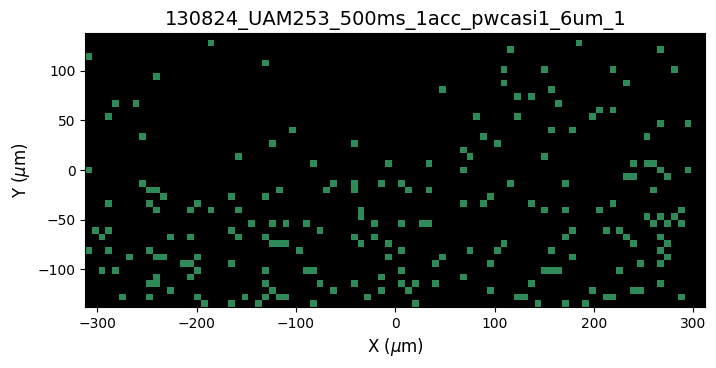


Processing file: 130824_UAM253_500ms_1acc_pwcasi1_6um_2
Valid: 130, Outliers: 0


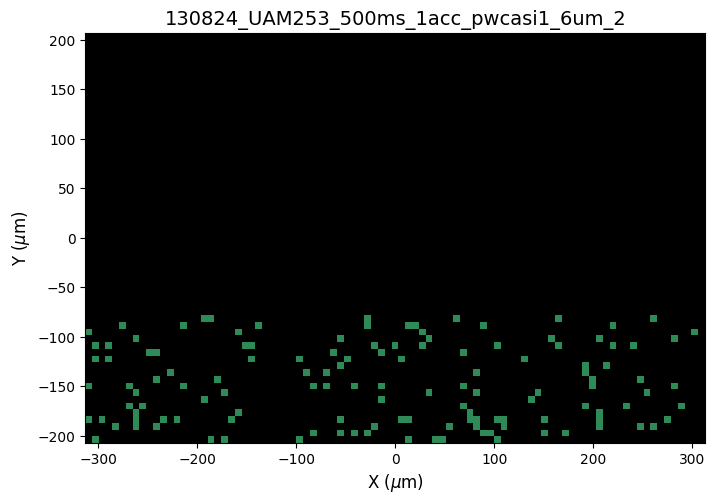


Processing file: 130824_UAM565_1s_1acc_pwmuesca1_6um_1
Valid: 28, Outliers: 4


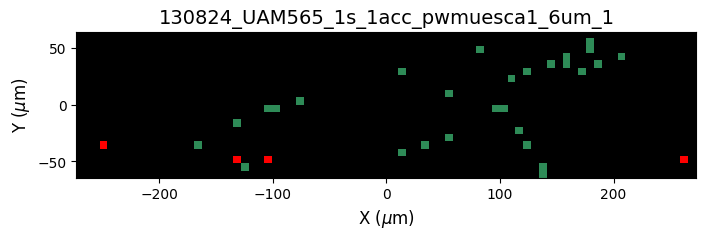


Processing file: 130824_UAM565_1s_1acc_pwmuesca1_6um_2
Valid: 31, Outliers: 3


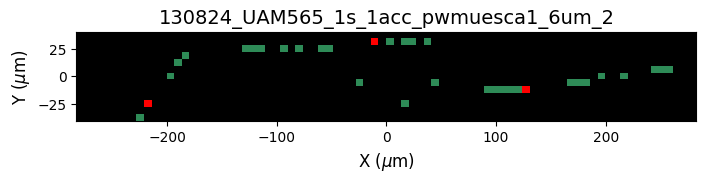


Processing file: 130824_UAM565_1s_1acc_pwmuesca1_6um_3
Valid: 52, Outliers: 2


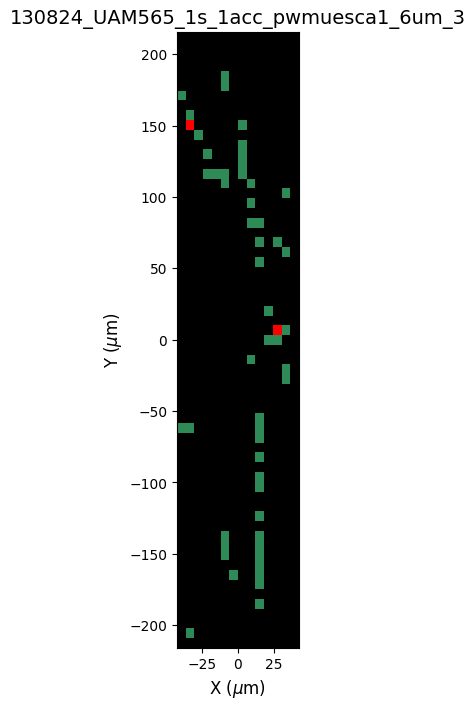


Processing file: 130824_UAM565_1s_1acc_pwmuesca1_6um_4
Valid: 13, Outliers: 1


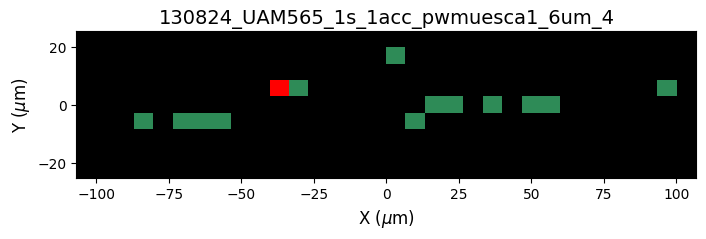


Processing file: 130824_UAM565_300ms_1acc_pwmedio_6um_1
Valid: 122, Outliers: 12


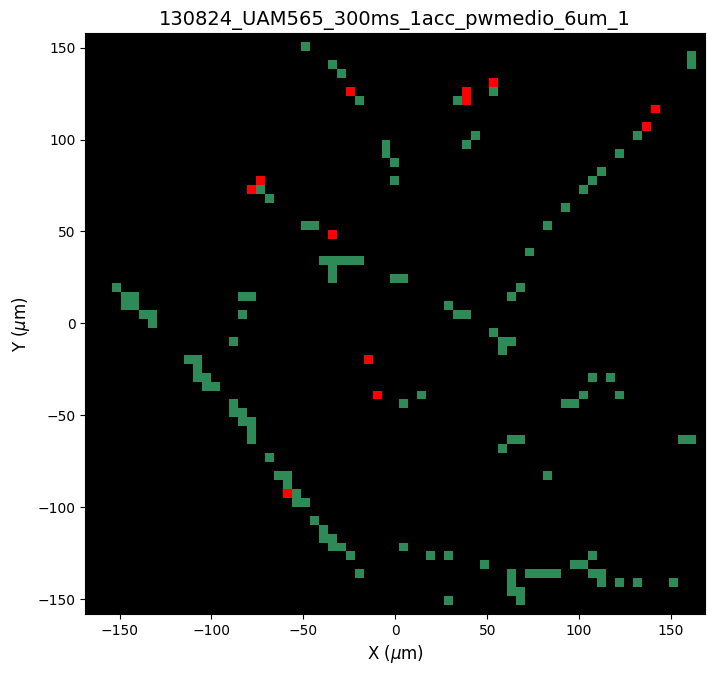


Processing file: 130824_UAM565_300ms_1acc_pwmedio_6um_2
Valid: 156, Outliers: 2


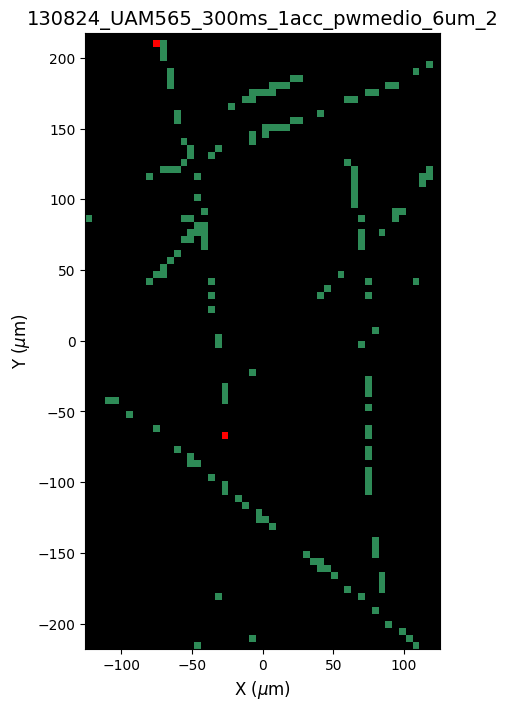


Processing file: 130824_UAM565_300ms_1acc_pwmedio_6um_3
Valid: 140, Outliers: 2


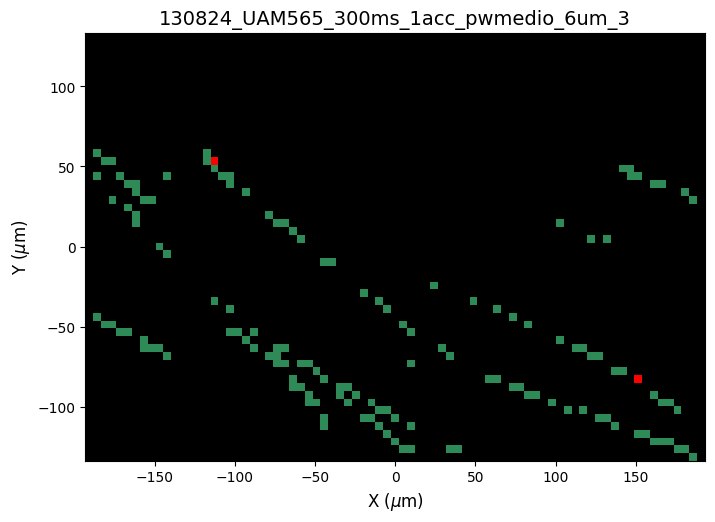


Processing file: 130824_UAM565_300ms_1acc_pwmedio_6um_4
Valid: 81, Outliers: 4


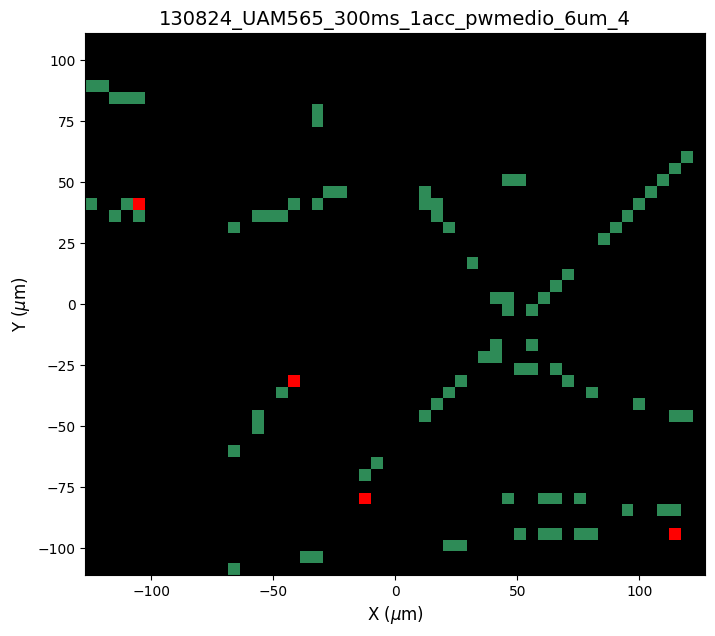


Processing file: 130824_UAM565_500ms_1acc_pwmuescacasi1_5um_1
Valid: 67, Outliers: 0


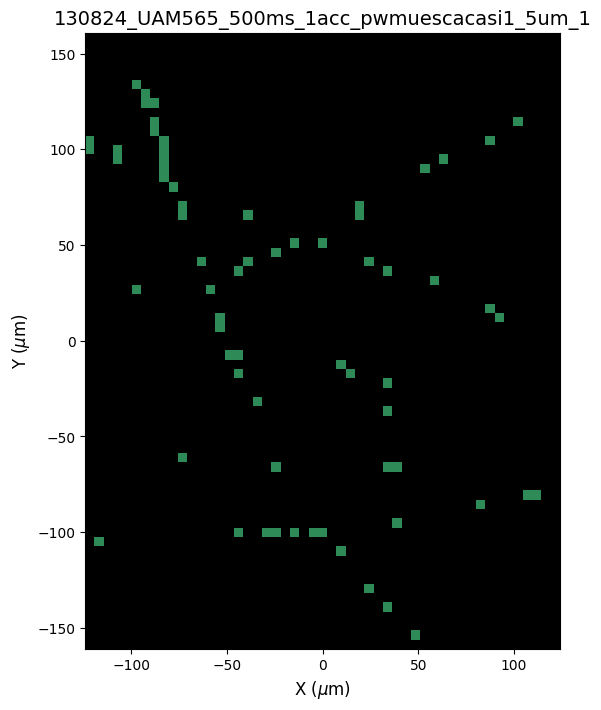


Processing file: 130824_UAM565_500ms_1acc_pwmuescacasi1_5um_2
Valid: 196, Outliers: 9


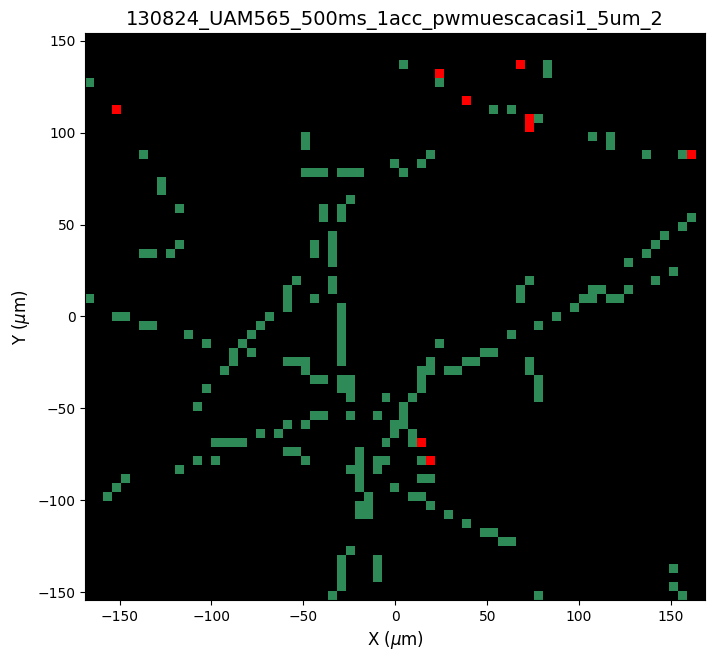


Processing file: 140323_UAM588_2s_1acc_pwmuesca2_3um
Valid: 45, Outliers: 0
No data found in `infomapas` for the file: 140323_UAM588_2s_1acc_pwmuesca2_3um

Processing file: 140323_UAM588_2s_1acc_pwmuesca2_4um
Valid: 32, Outliers: 0
No data found in `infomapas` for the file: 140323_UAM588_2s_1acc_pwmuesca2_4um

Processing file: 140824_UAM253_500ms_1acc_pwcas1_5um_1
Valid: 62, Outliers: 0


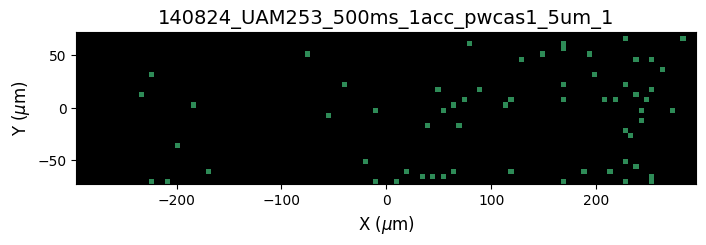


Processing file: 140824_UAM253_500ms_1acc_pwcas1_5um_2
Valid: 807, Outliers: 45


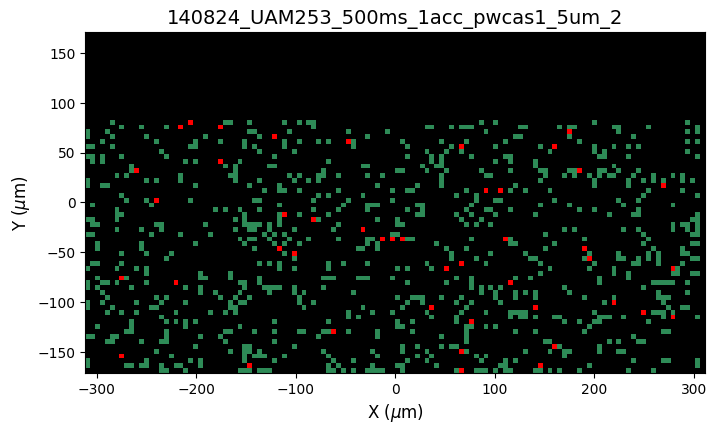


Processing file: 140824_UAM565_500ms_1acc_pwmuesca1_2um_1_largo
Valid: 1411, Outliers: 89


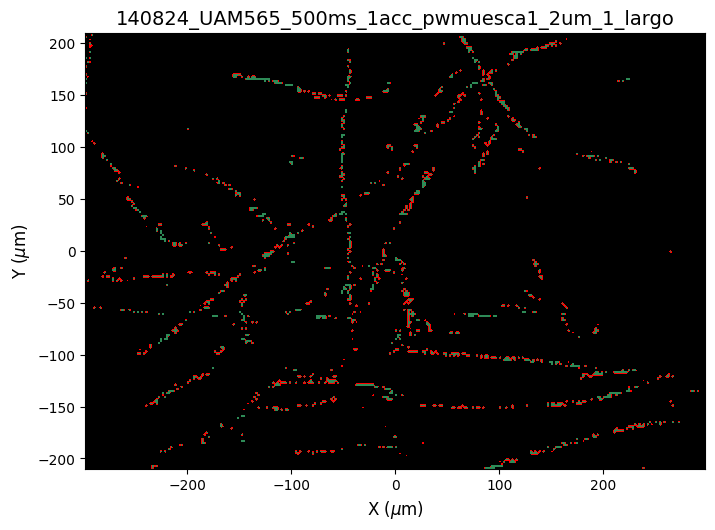


Processing file: 140824_UAM565_500ms_1acc_pwmuesca1_5um_1
Valid: 111, Outliers: 2


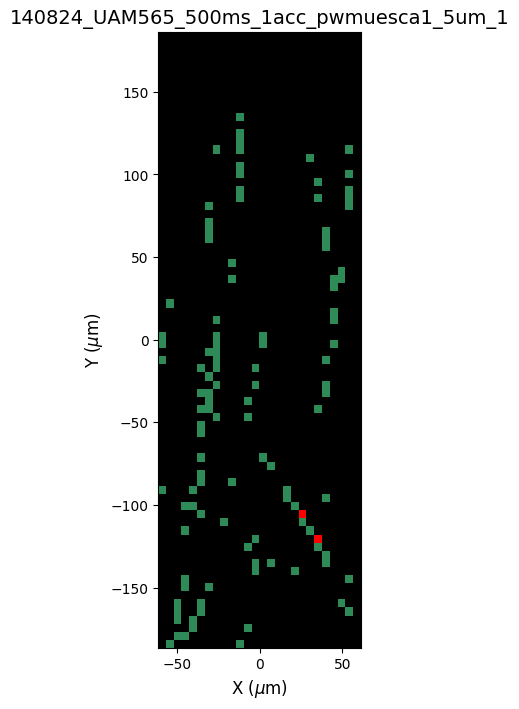


Processing file: 140824_UAM565_500ms_1acc_pwmuesca1_5um_10
Valid: 10, Outliers: 0


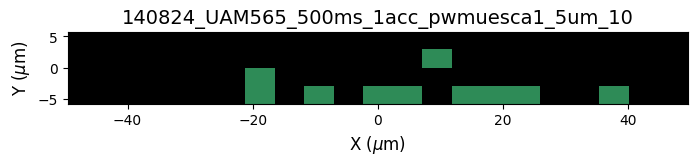


Processing file: 140824_UAM565_500ms_1acc_pwmuesca1_5um_2
Valid: 28, Outliers: 3


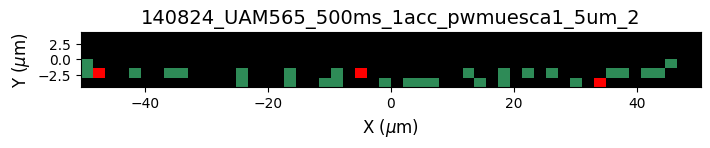


Processing file: 140824_UAM565_500ms_1acc_pwmuesca1_5um_3
Valid: 8, Outliers: 3


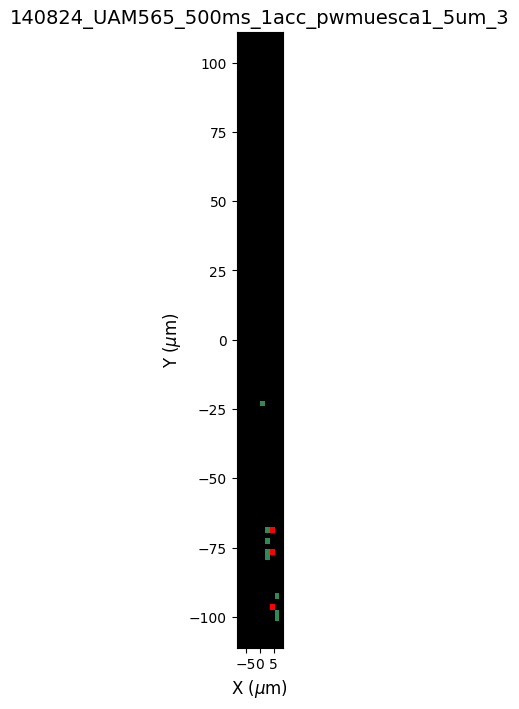


Processing file: 140824_UAM565_500ms_1acc_pwmuesca1_5um_4
Valid: 2, Outliers: 1


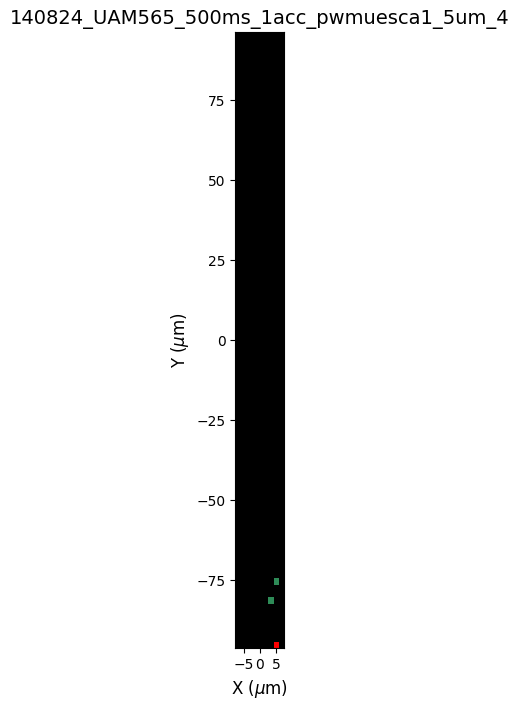


Processing file: 140824_UAM565_500ms_1acc_pwmuesca1_5um_5
Valid: 13, Outliers: 4


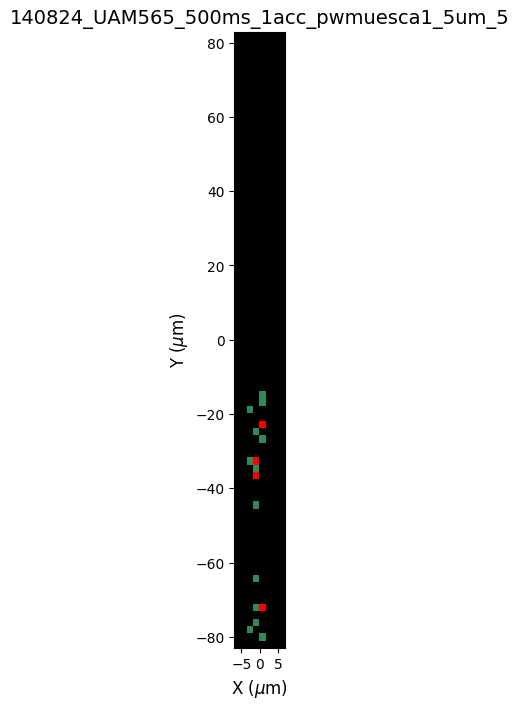


Processing file: 140824_UAM565_500ms_1acc_pwmuesca1_5um_6
Valid: 8, Outliers: 0


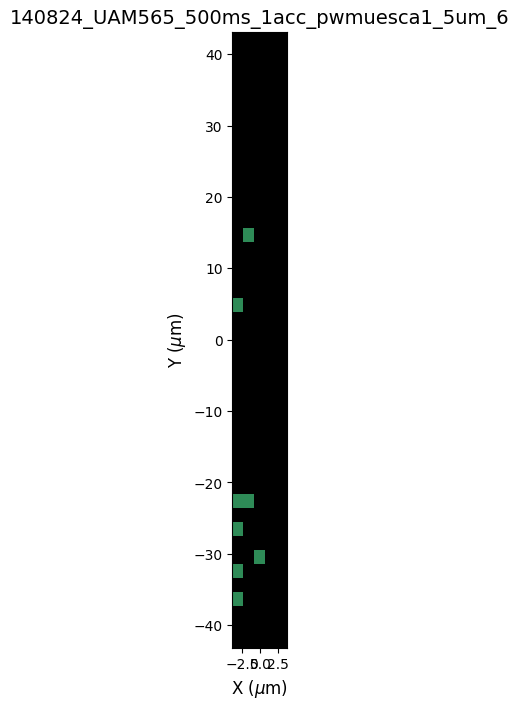


Processing file: 140824_UAM565_500ms_1acc_pwmuesca1_5um_7
Valid: 29, Outliers: 2


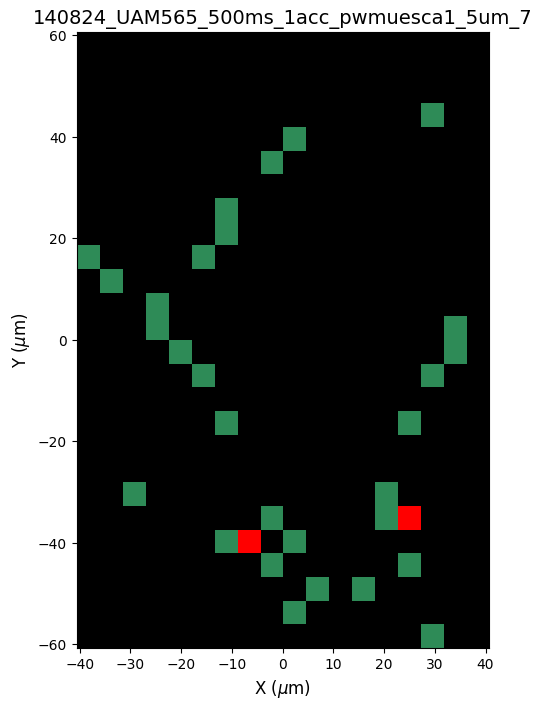


Processing file: 140824_UAM565_500ms_1acc_pwmuesca1_5um_8
Valid: 8, Outliers: 0


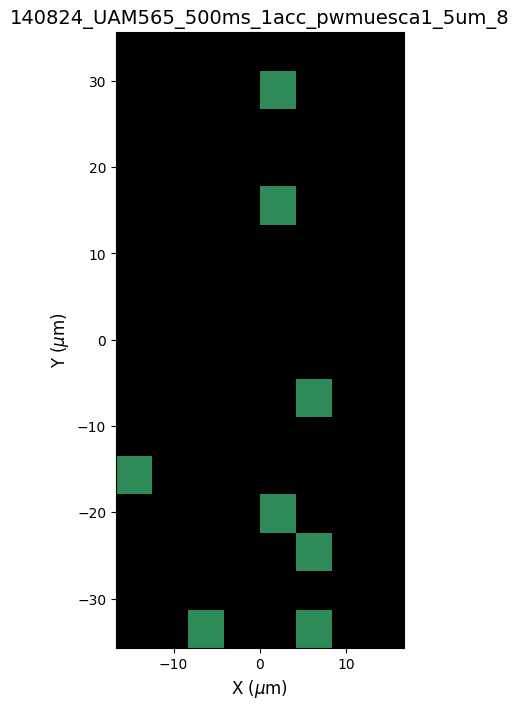


Processing file: 140824_UAM565_500ms_1acc_pwmuesca1_5um_9
Valid: 2, Outliers: 0


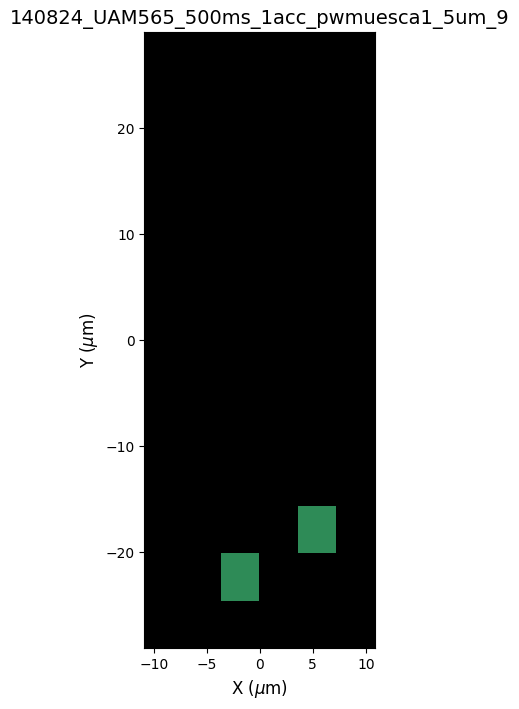


Processing file: 150324_UAM588_2s_1acc_pwmuesca2_4um
Valid: 47, Outliers: 0


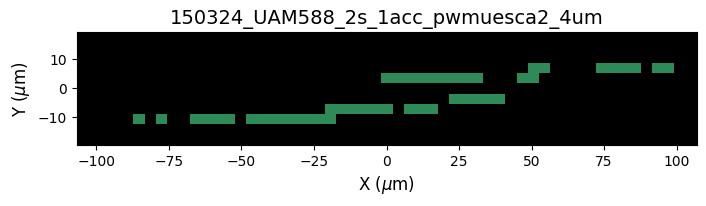


Processing file: 150324_UAM588_300ms_1acc_pwras_5um_2
Valid: 95, Outliers: 0


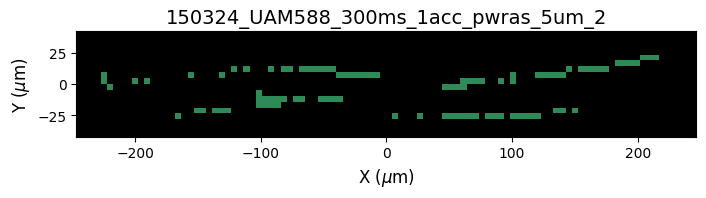


Processing file: 150324_UAM588_300ms_1acc_pwras_5um_3
Valid: 188, Outliers: 0


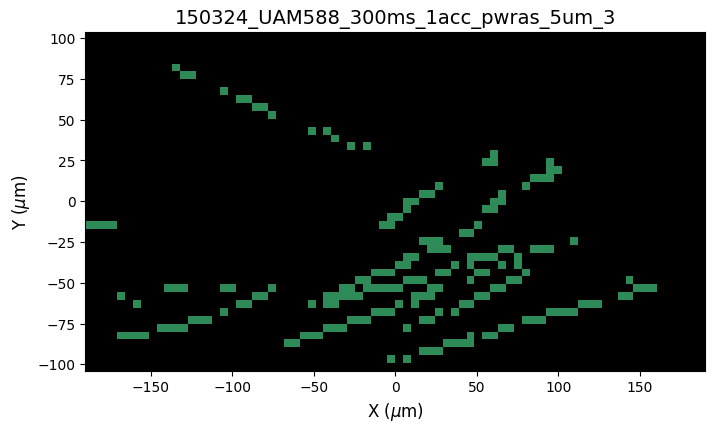


Processing file: 150324_UAM588_500ms_1acc_pwmuesca1_4um
Valid: 7, Outliers: 0


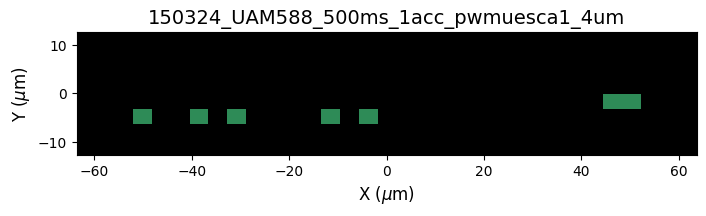


Processing file: 150324_UAM588_500ms_1acc_pwmuesca1_4um_2
Valid: 19, Outliers: 0


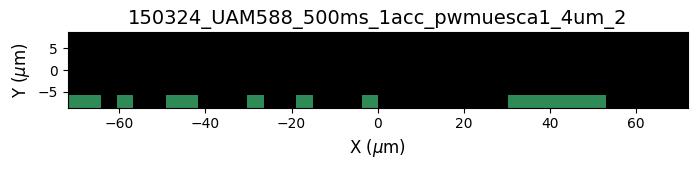


Processing file: 150324_UAM588_500ms_1acc_pwmuesca1_4um_3
Valid: 40, Outliers: 0


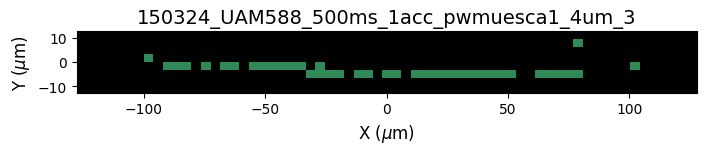


Processing file: 180324_UAM588_300ms_1acc_pwras_20um
Valid: 14, Outliers: 0


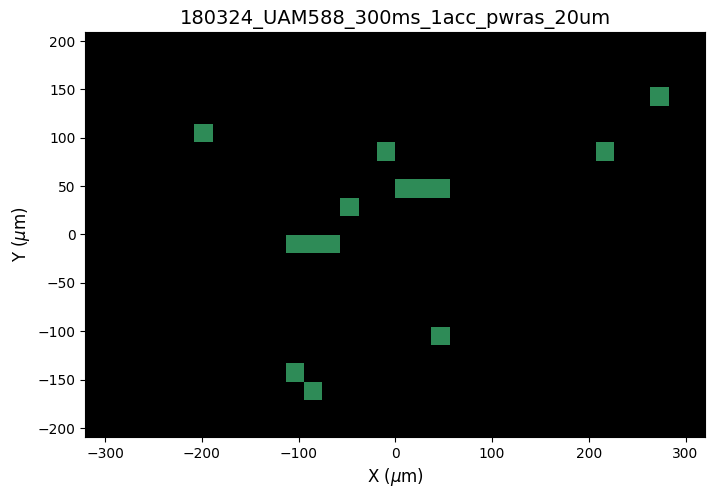


Processing file: 180324_UAM588_300ms_1acc_pwras_5um
Valid: 47, Outliers: 0


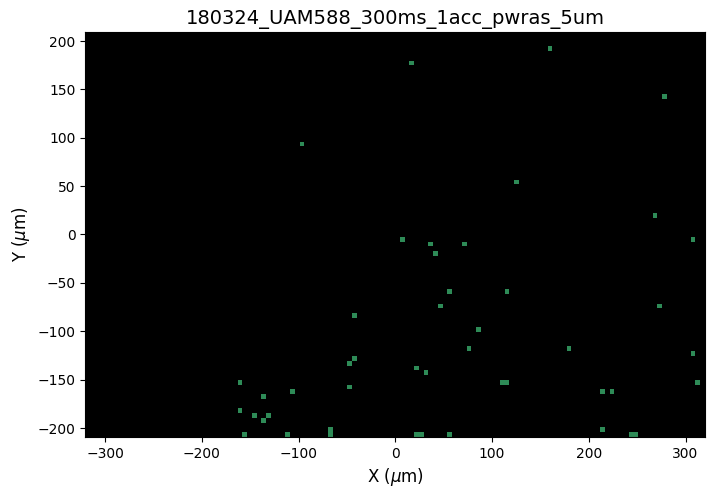


Processing file: 180324_UAM588_300ms_1acc_pwras_7um
Valid: 222, Outliers: 3


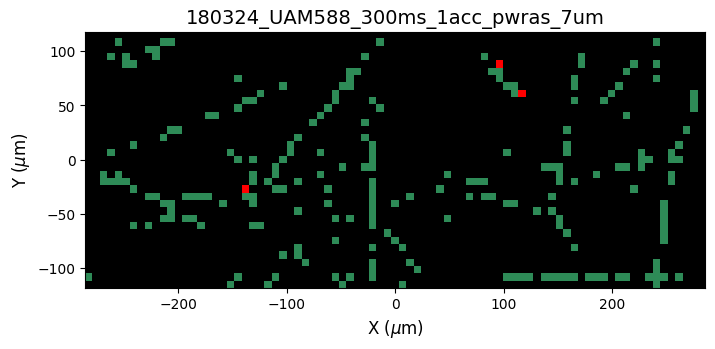


Processing file: 180324_UAM588_300ms_1acc_pwras_7um_1
Valid: 13, Outliers: 0


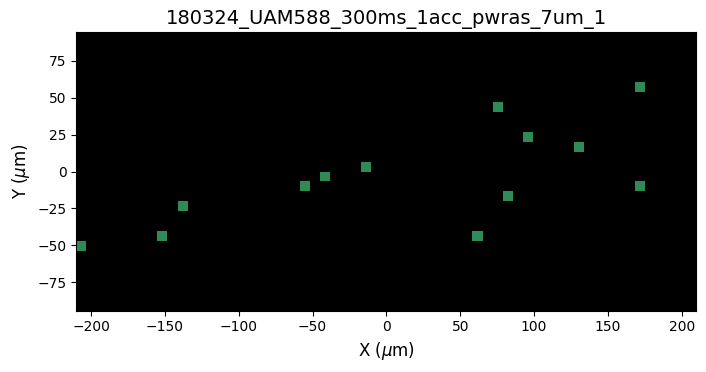


Processing file: 180324_UAM588_500ms_1acc_pwmuesca1_7um_1
Valid: 156, Outliers: 8


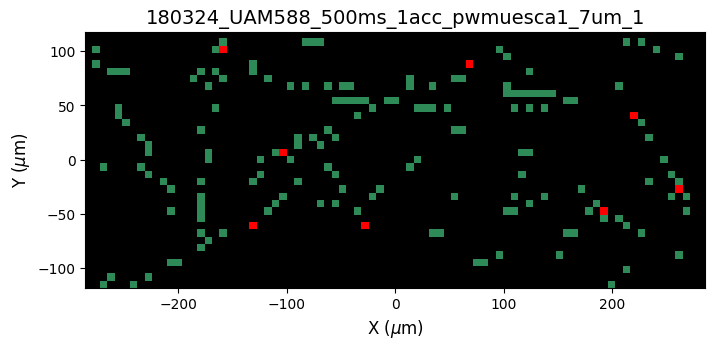


Processing file: 190324_UAM588_300ms_1acc_pwras_6um
Valid: 41, Outliers: 3


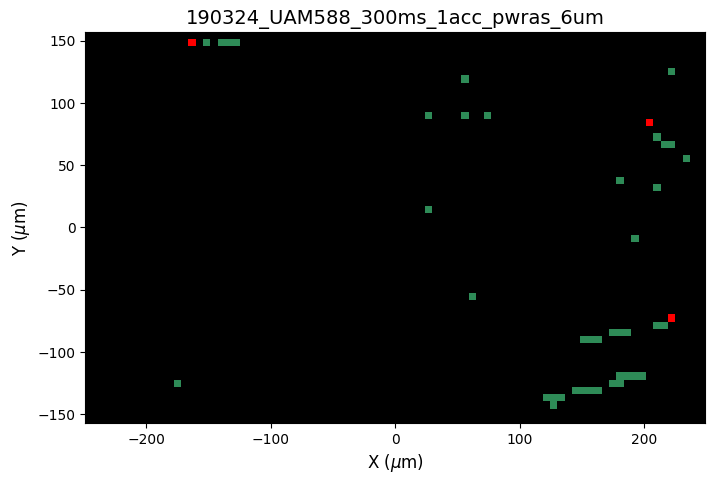


Processing file: 190824_UAM565_500ms_1acc_pwcasiras1_5um_1
Valid: 165, Outliers: 0


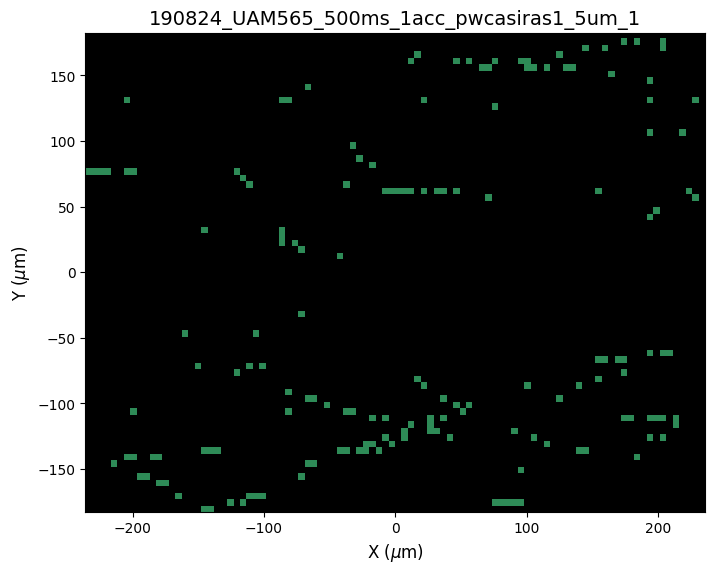


Processing file: 190824_UAM565_500ms_1acc_pwcasiras1_5um_2
Valid: 44, Outliers: 0


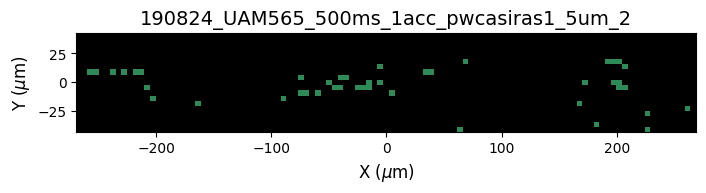


Processing file: 190824_UAM565_500ms_1acc_pwcasiras1_5um_3
Valid: 27, Outliers: 0


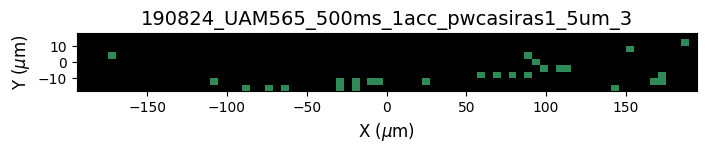


Processing file: 190824_UAM565_500ms_1acc_pwcasiras1_5um_4
Valid: 28, Outliers: 0


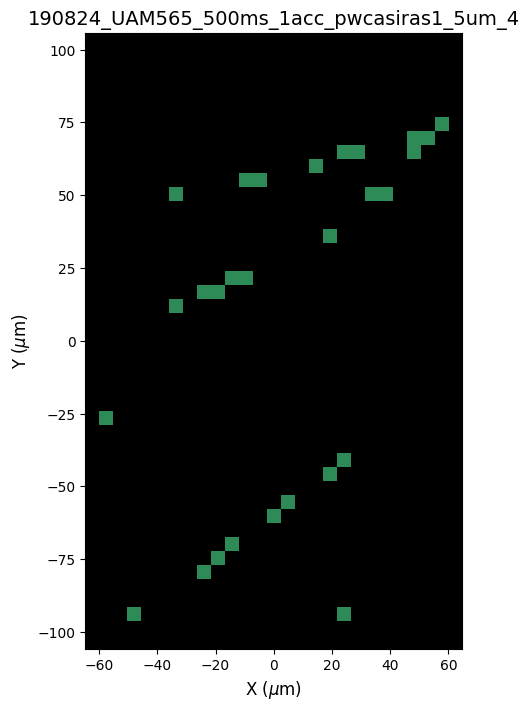


Processing file: 190824_UAM565_500ms_1acc_pwcasiras1_5um_5
Valid: 56, Outliers: 0


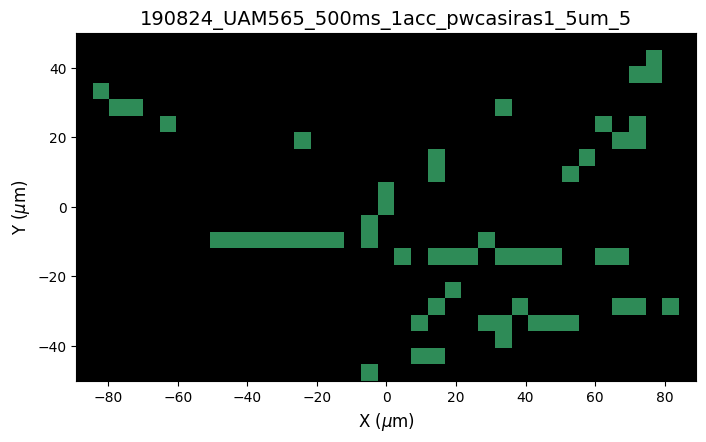


Processing file: 190824_UAM565_500ms_1acc_pwcasiras1_5um_6_largo
Valid: 81, Outliers: 26


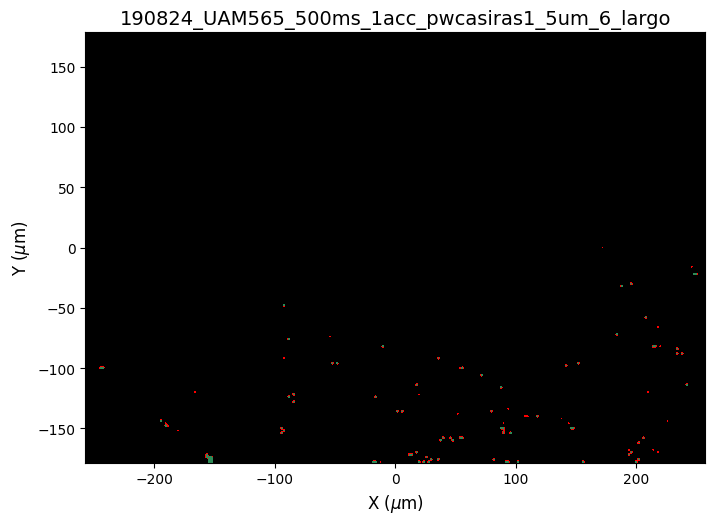


Processing file: 220724_UAM588_500ms_pwcasiras_2um_7
Valid: 797, Outliers: 32


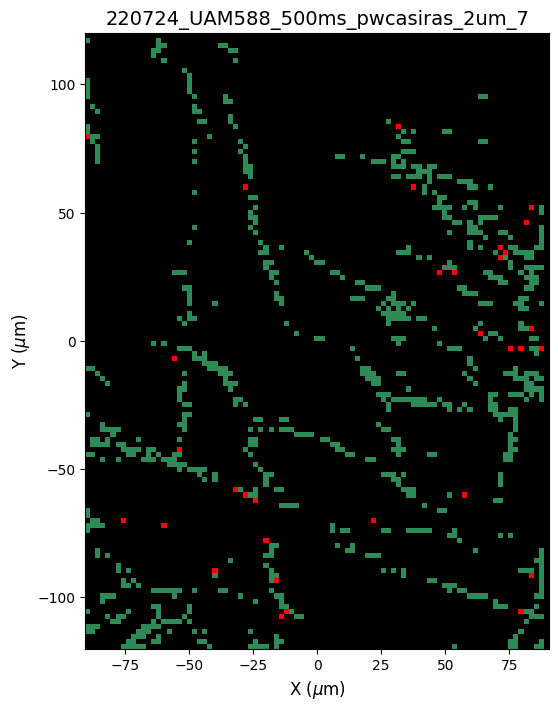


Processing file: 220724_UAM588_500ms_pwcasiras_2um_8
Valid: 2097, Outliers: 174


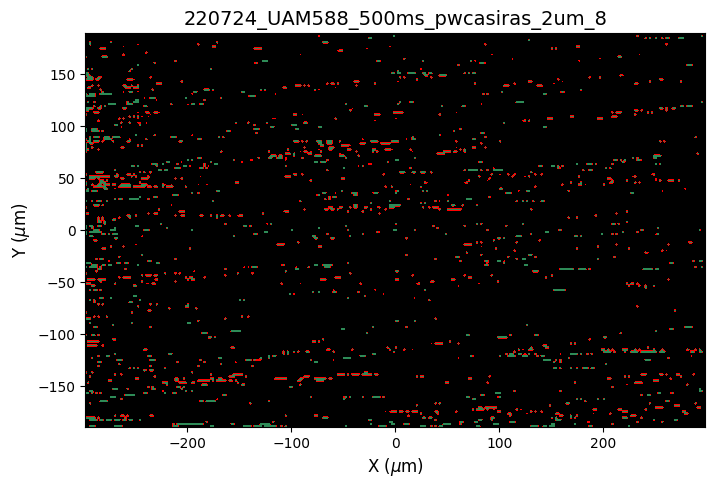


Processing file: 220724_UAM588_500ms_pwras_2um_2
Valid: 275, Outliers: 6


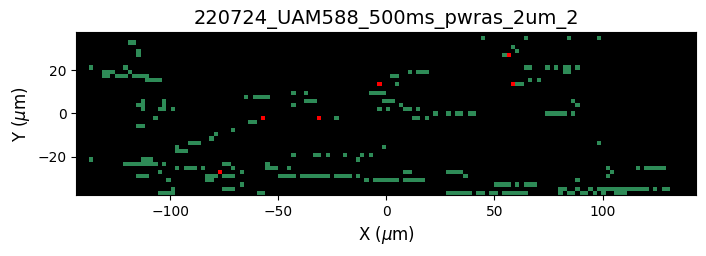


Processing file: 220724_UAM588_500ms_pwras_2um_3
Valid: 340, Outliers: 11


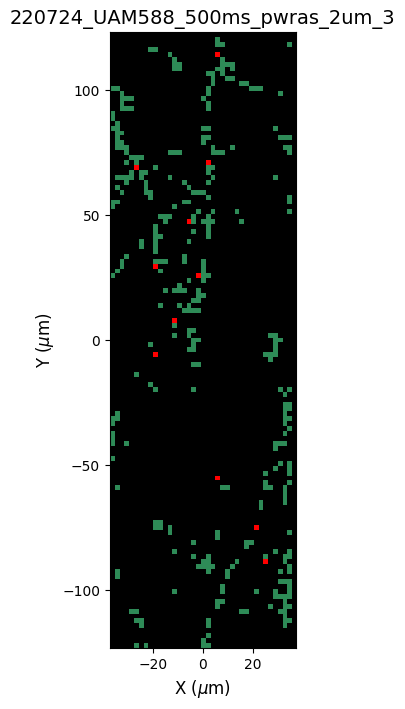


Processing file: 220724_UAM588_500ms_pwras_2um_4
Valid: 433, Outliers: 23


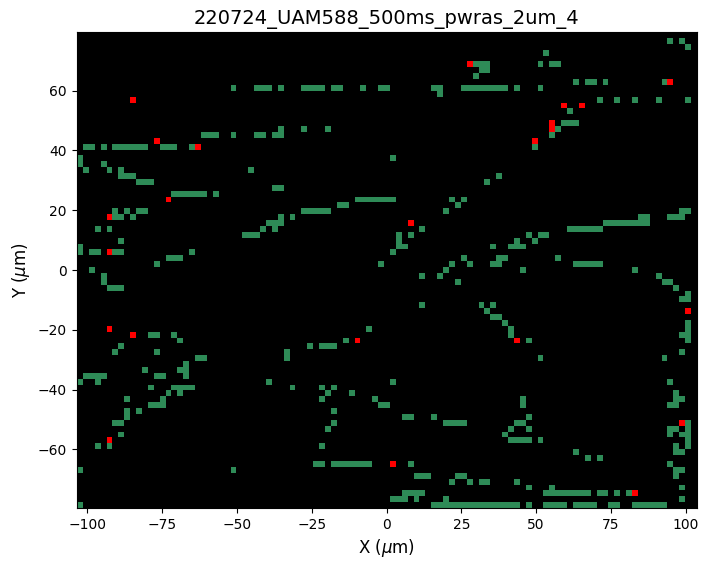


Processing file: 220724_UAM588_500ms_pwras_2um_5
Valid: 271, Outliers: 21


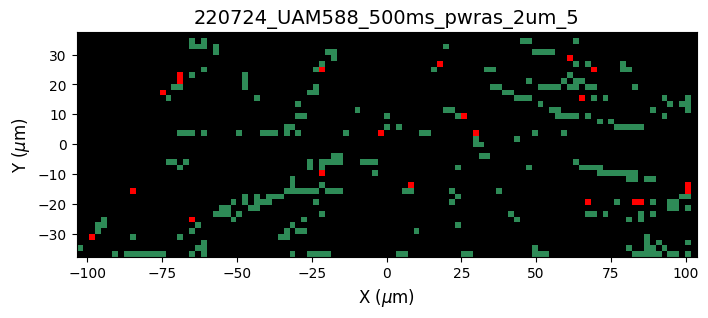


Processing file: 220724_UAM588_500ms_pwras_2um_6
Valid: 239, Outliers: 21


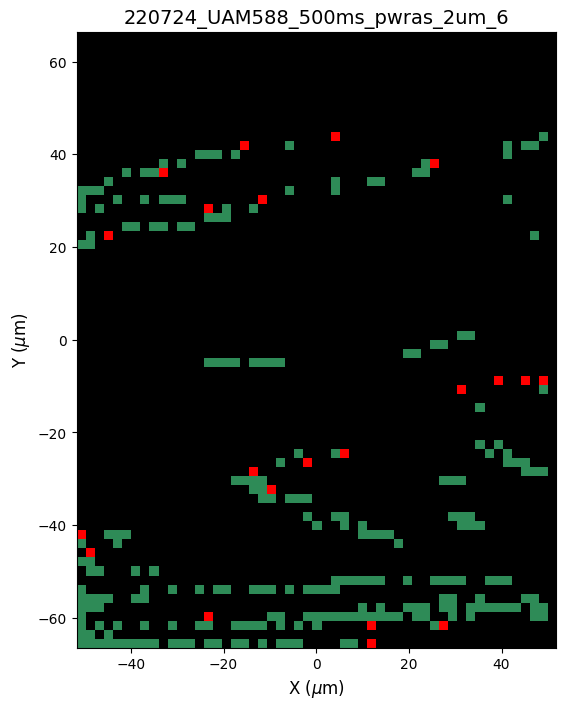


Processing file: 220724_UAM588_700ms_pwras_2um
Valid: 594, Outliers: 43


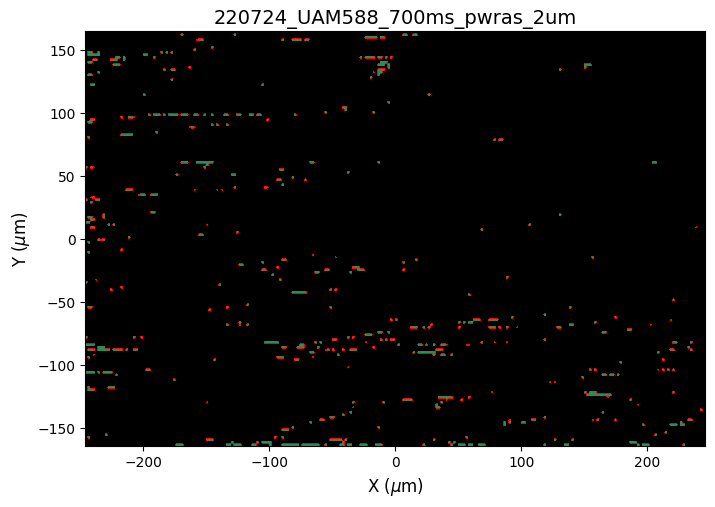


Processing file: 230724_UAM502_500ms_1acc_pwmuesca2
Valid: 79, Outliers: 0


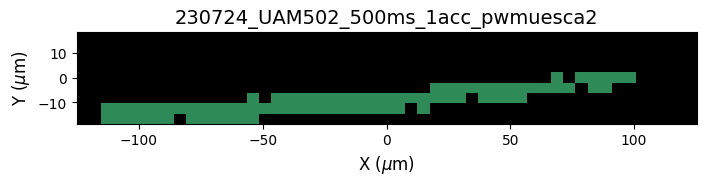


Processing file: 230724_UAM502_500ms_1acc_pwmuesca2_10
Valid: 70, Outliers: 0


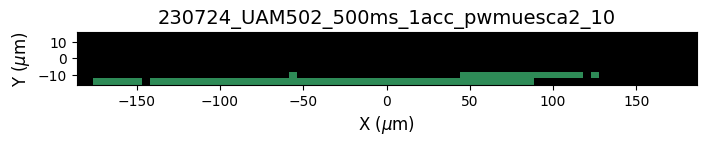


Processing file: 230724_UAM502_500ms_1acc_pwmuesca2_11
Valid: 131, Outliers: 0


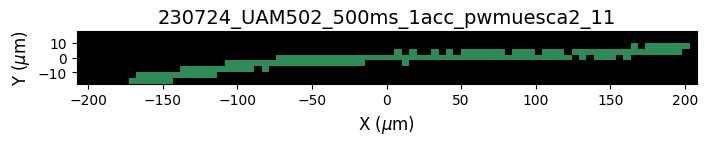


Processing file: 230724_UAM502_500ms_1acc_pwmuesca2_12
Valid: 64, Outliers: 0


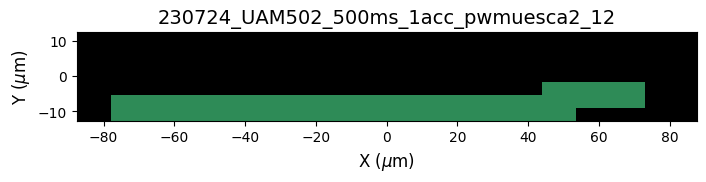


Processing file: 230724_UAM502_500ms_1acc_pwmuesca2_13
Valid: 13, Outliers: 0


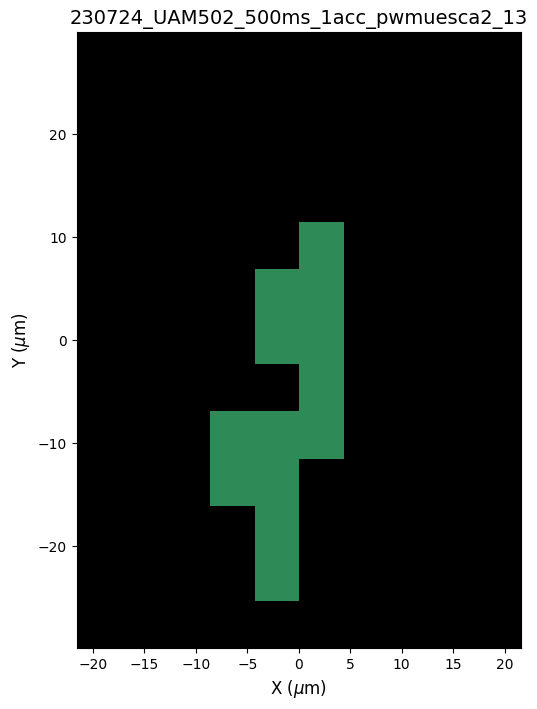


Processing file: 230724_UAM502_500ms_1acc_pwmuesca2_14
Valid: 28, Outliers: 0


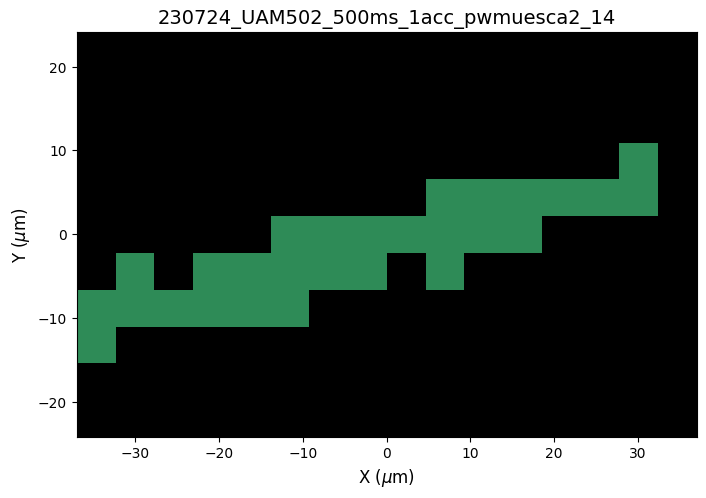


Processing file: 230724_UAM502_500ms_1acc_pwmuesca2_15
Valid: 10, Outliers: 0


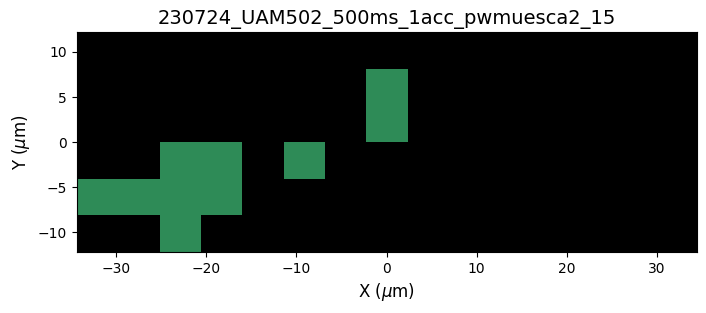


Processing file: 230724_UAM502_500ms_1acc_pwmuesca2_16
Valid: 7, Outliers: 0


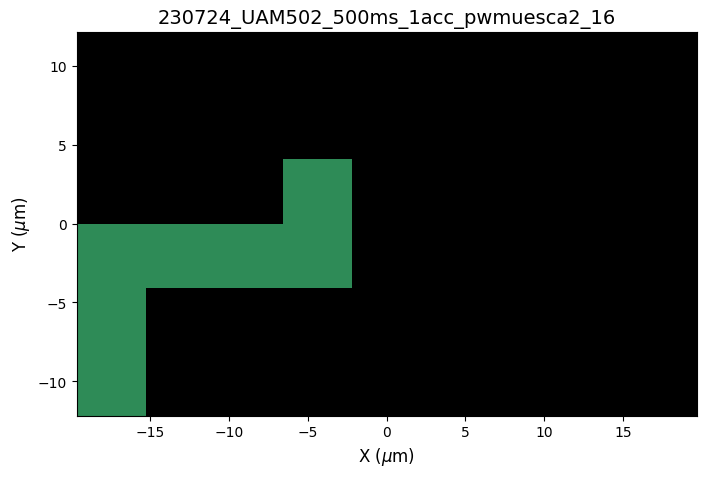


Processing file: 230724_UAM502_500ms_1acc_pwmuesca2_17
Valid: 41, Outliers: 0


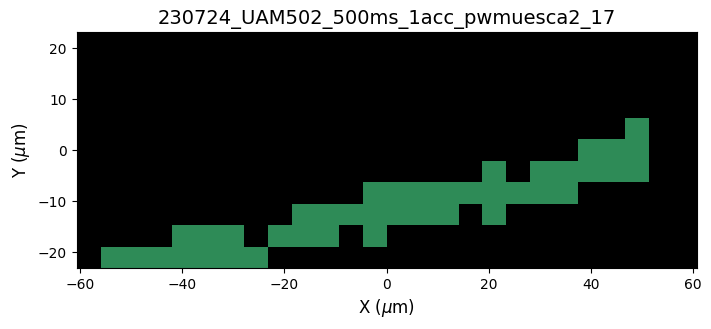


Processing file: 230724_UAM502_500ms_1acc_pwmuesca2_18
Valid: 58, Outliers: 0


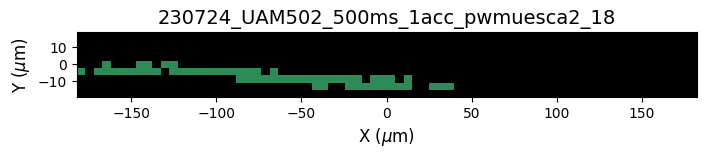


Processing file: 230724_UAM502_500ms_1acc_pwmuesca2_19
Valid: 52, Outliers: 0


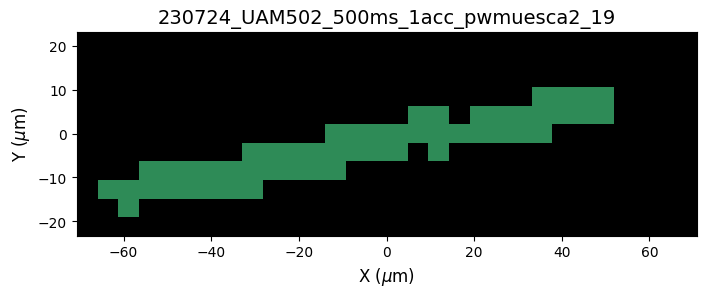


Processing file: 230724_UAM502_500ms_1acc_pwmuesca2_2
Valid: 78, Outliers: 0


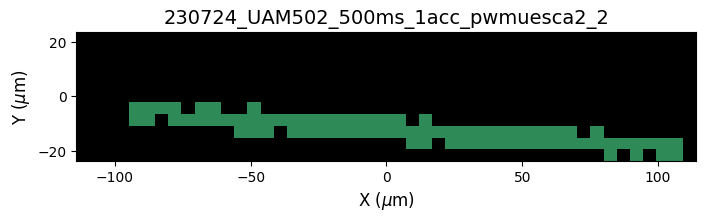


Processing file: 230724_UAM502_500ms_1acc_pwmuesca2_20
Valid: 17, Outliers: 0


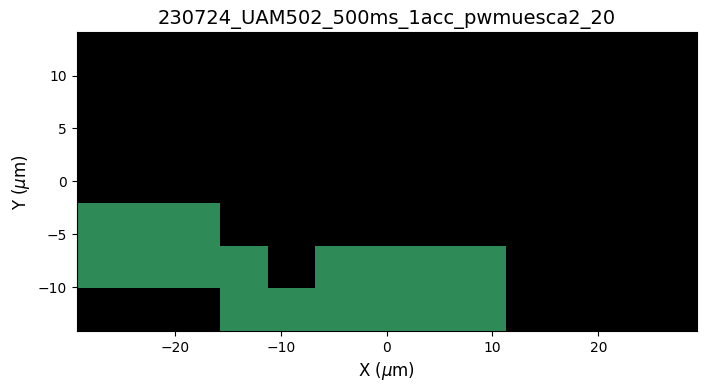


Processing file: 230724_UAM502_500ms_1acc_pwmuesca2_21
Valid: 23, Outliers: 0


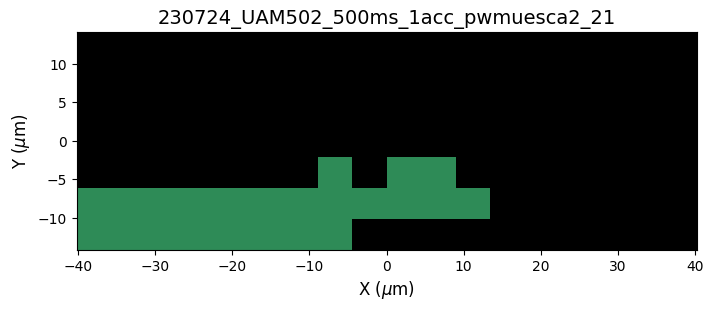


Processing file: 230724_UAM502_500ms_1acc_pwmuesca2_22
Valid: 32, Outliers: 0


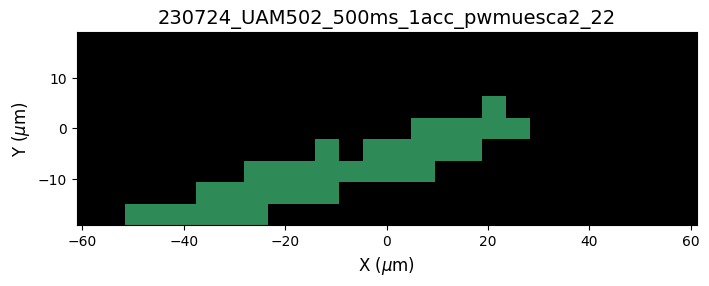


Processing file: 230724_UAM502_500ms_1acc_pwmuesca2_23
Valid: 19, Outliers: 0


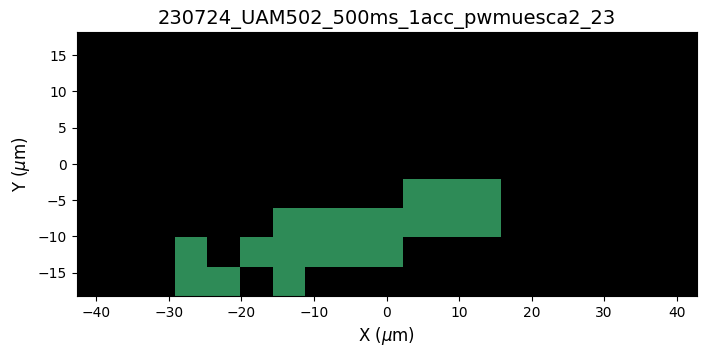


Processing file: 230724_UAM502_500ms_1acc_pwmuesca2_24
Valid: 242, Outliers: 0


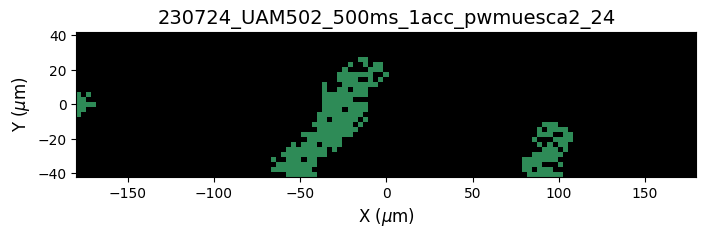


Processing file: 230724_UAM502_500ms_1acc_pwmuesca2_25
Valid: 202, Outliers: 2


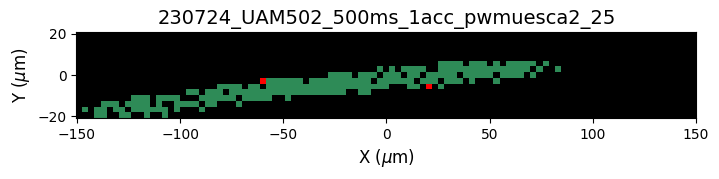


Processing file: 230724_UAM502_500ms_1acc_pwmuesca2_26
Valid: 33, Outliers: 0


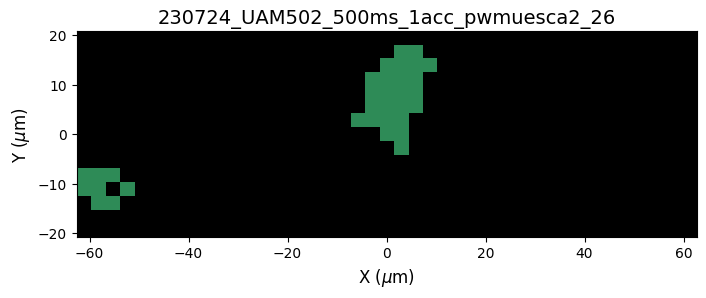


Processing file: 230724_UAM502_500ms_1acc_pwmuesca2_27
Valid: 202, Outliers: 2


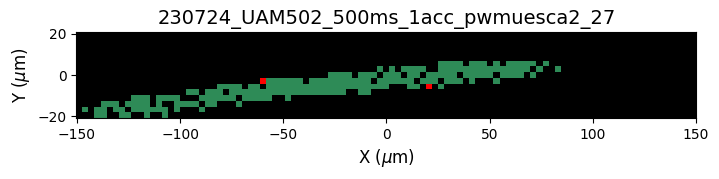


Processing file: 230724_UAM502_500ms_1acc_pwmuesca2_28
Valid: 197, Outliers: 1


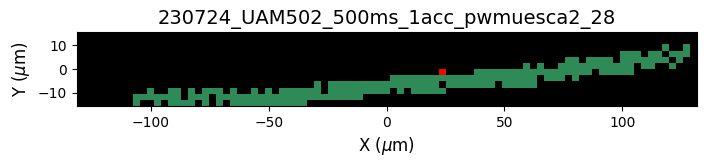


Processing file: 230724_UAM502_500ms_1acc_pwmuesca2_29
Valid: 114, Outliers: 0


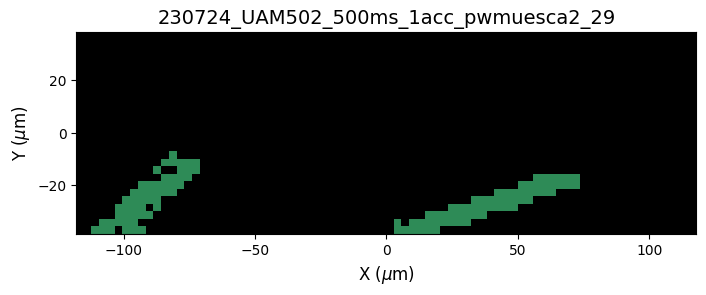


Processing file: 230724_UAM502_500ms_1acc_pwmuesca2_3
Valid: 41, Outliers: 0


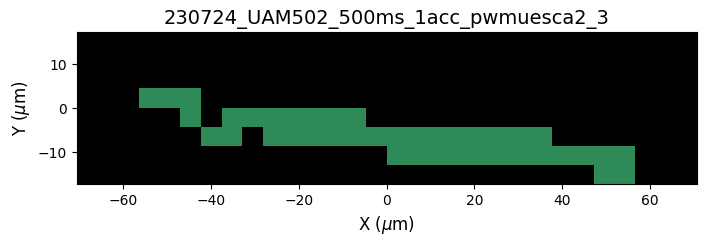


Processing file: 230724_UAM502_500ms_1acc_pwmuesca2_4
Valid: 56, Outliers: 0


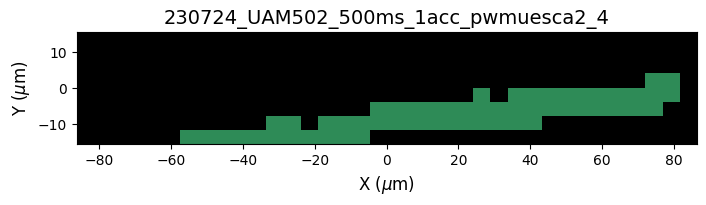


Processing file: 230724_UAM502_500ms_1acc_pwmuesca2_5
Valid: 14, Outliers: 0


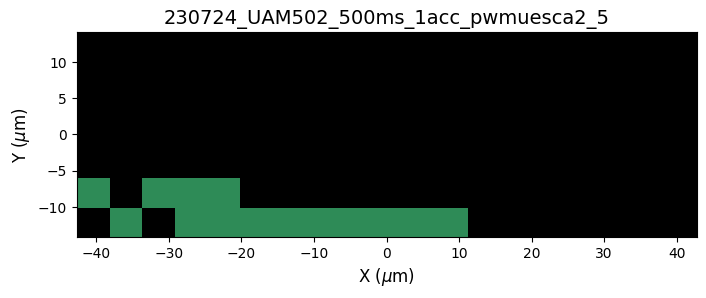


Processing file: 230724_UAM502_500ms_1acc_pwmuesca2_6
Valid: 8, Outliers: 0


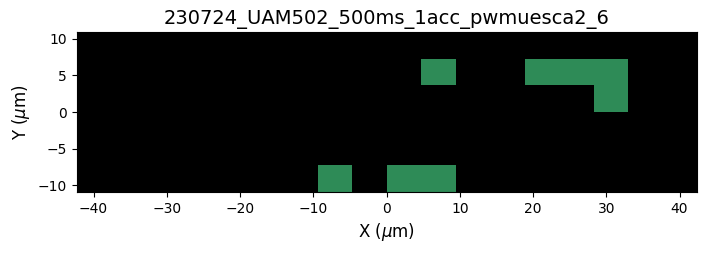


Processing file: 230724_UAM502_500ms_1acc_pwmuesca2_7
Valid: 9, Outliers: 0


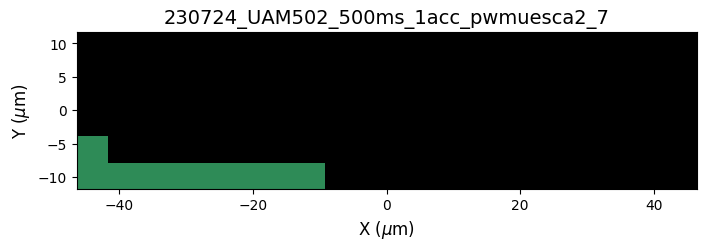


Processing file: 230724_UAM502_500ms_1acc_pwmuesca2_8
Valid: 573, Outliers: 3


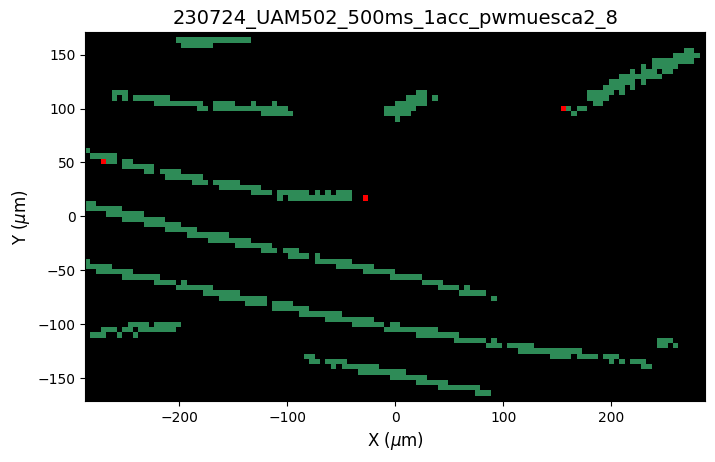


Processing file: 230724_UAM502_500ms_1acc_pwmuesca2_9
Valid: 182, Outliers: 1


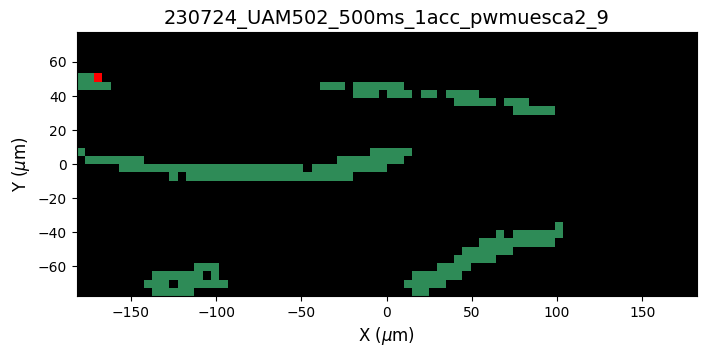


Processing file: 240724_UAM502_500ms_1acc_pwmuesca2_30
Valid: 967, Outliers: 74


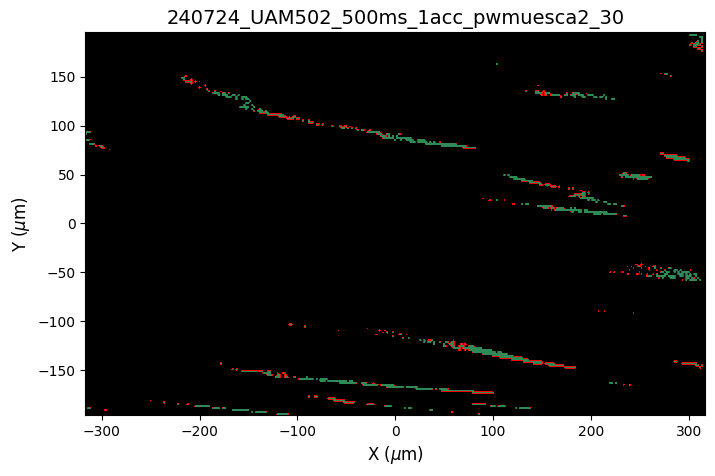


Processing file: 240724_UAM502_500ms_1acc_pwmuesca2_31
Valid: 35, Outliers: 1


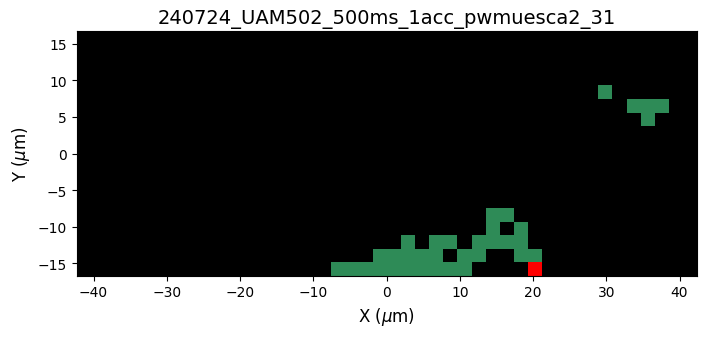


Processing file: 240724_UAM502_500ms_1acc_pwmuesca2_32
Valid: 1, Outliers: 0


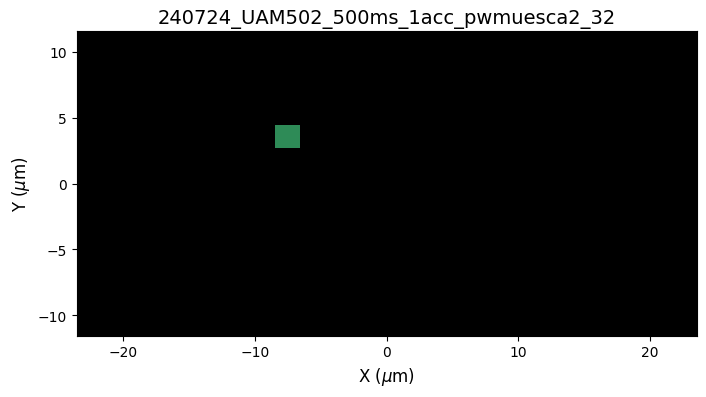


Processing file: 240724_UAM502_500ms_1acc_pwmuesca2_33
Valid: 365, Outliers: 2


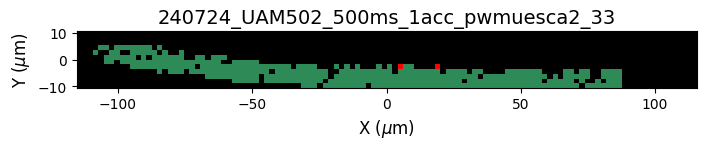


Processing file: 240724_UAM502_500ms_1acc_pwmuesca2_34
Valid: 14, Outliers: 0


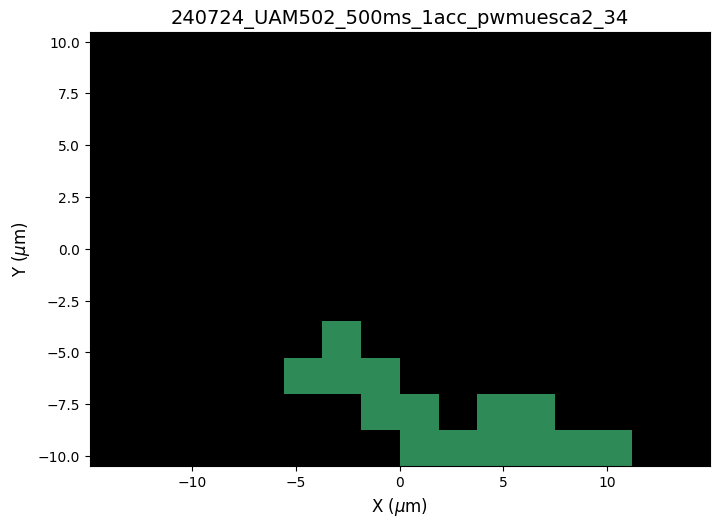


Processing file: 240724_UAM502_500ms_1acc_pwmuesca2_35
Valid: 2, Outliers: 0


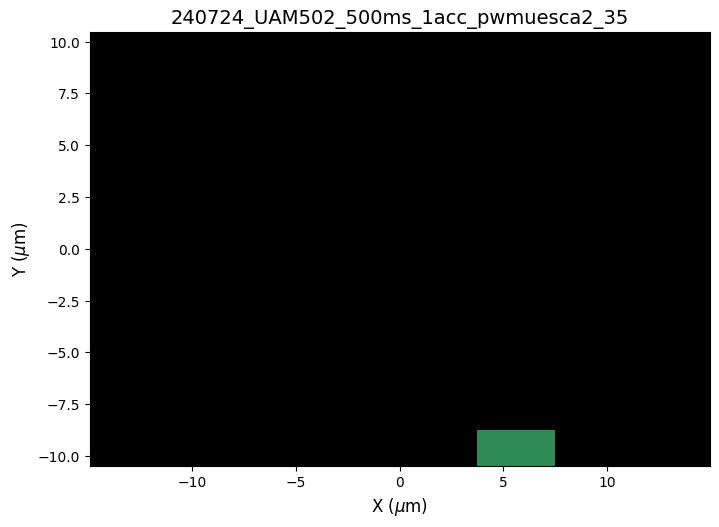


Processing file: 240724_UAM502_500ms_1acc_pwmuesca2_36
Valid: 117, Outliers: 1


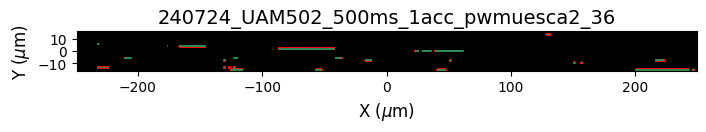


Processing file: 240724_UAM502_500ms_1acc_pwmuesca2_37
Valid: 228, Outliers: 0


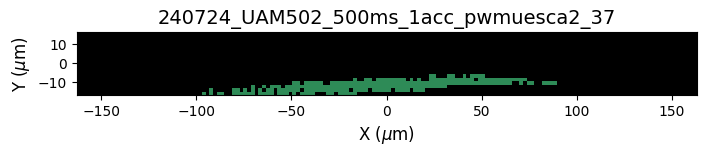


Processing file: 240724_UAM502_500ms_1acc_pwmuesca2_38
Valid: 967, Outliers: 2


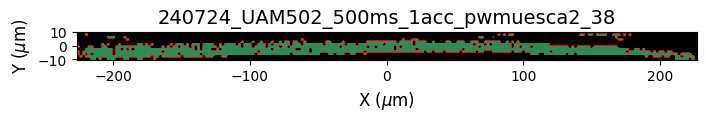


Processing file: 240724_UAM502_500ms_1acc_pwmuesca2_39
Valid: 192, Outliers: 2


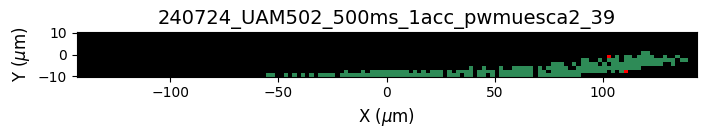


Processing file: 240724_UAM502_500ms_1acc_pwmuesca2_40
Valid: 243, Outliers: 0


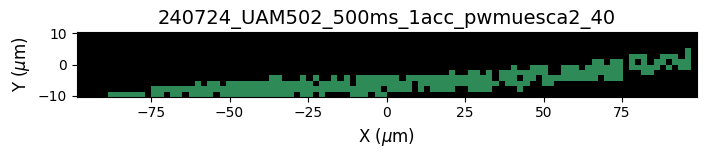


Processing file: 310524_UAM502_1s_1acc_pwmuescaentre1y2_5um_14
Valid: 245, Outliers: 31


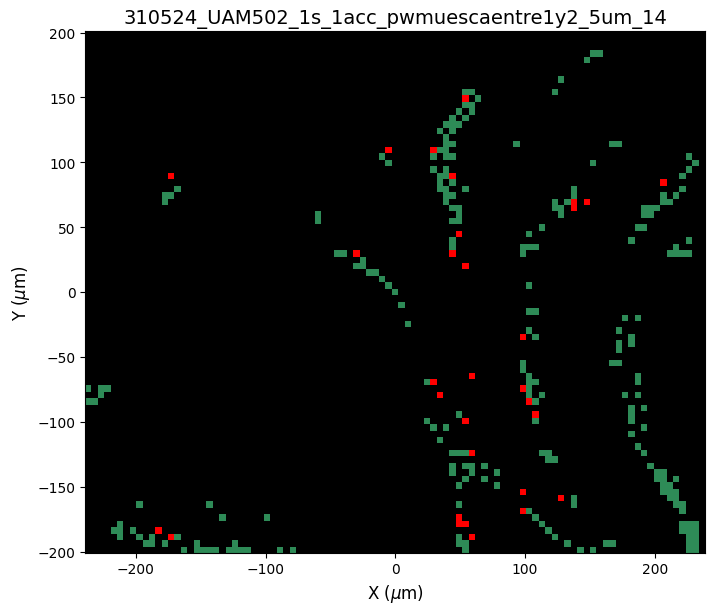


Processing file: 310524_UAM502_1s_1acc_pwmuescaentre1y2_5um_15
Valid: 97, Outliers: 8


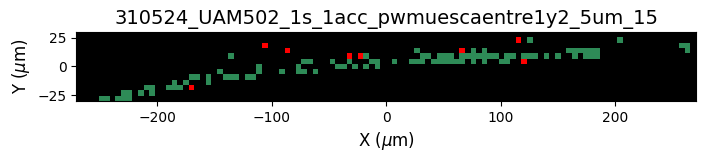


Processing file: 310524_UAM502_1s_1acc_pwmuescaentre1y2_5um_16
Valid: 170, Outliers: 1


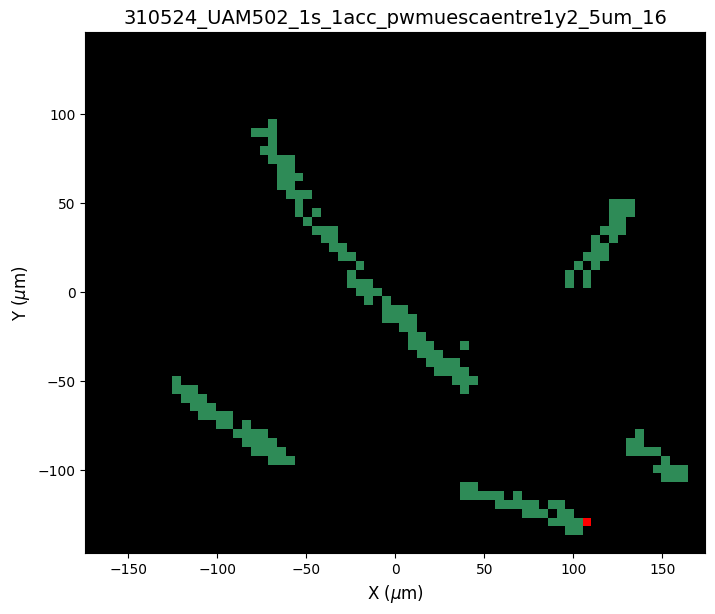


Processing file: 310524_UAM502_300ms_1acc_pwras_5um_1
Valid: 36, Outliers: 4


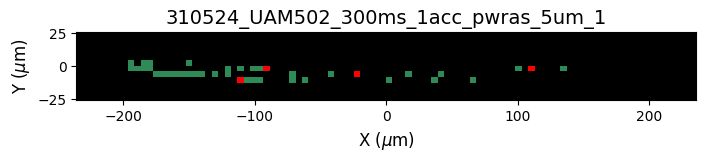


Processing file: 310524_UAM502_300ms_1acc_pwras_5um_2
Valid: 32, Outliers: 4


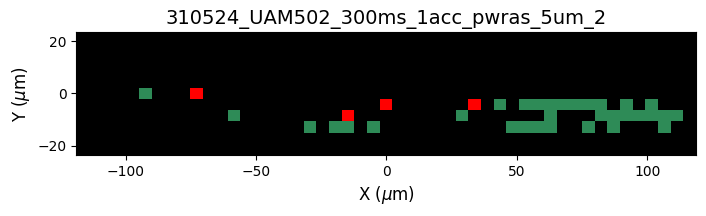


Processing file: 310524_UAM502_300ms_1acc_pwras_5um_3
Valid: 63, Outliers: 0


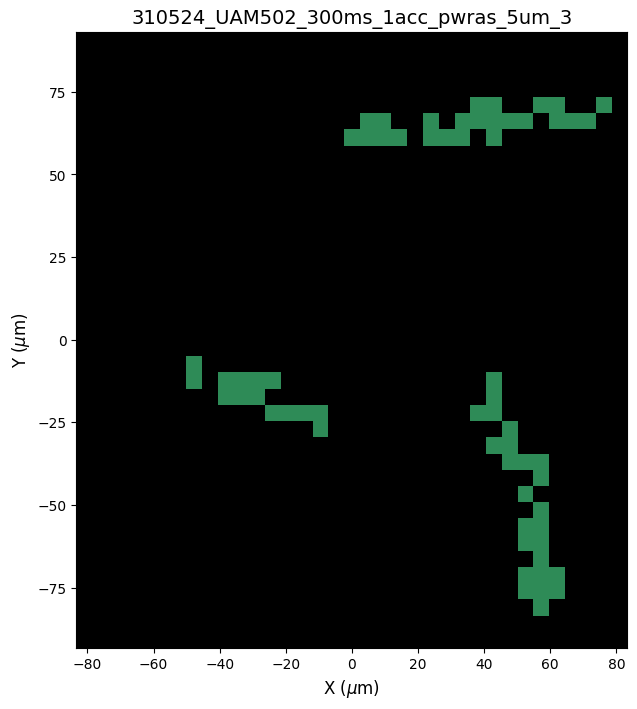


Processing file: 310524_UAM502_300ms_1acc_pwras_5um_4
Valid: 207, Outliers: 23


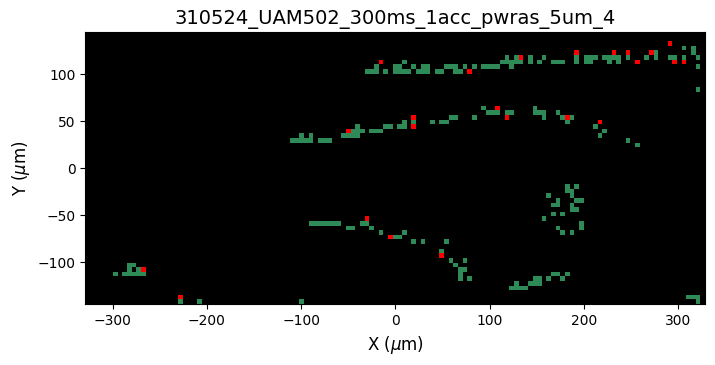


Processing file: 310524_UAM502_300ms_1acc_pwras_5um_5
Valid: 174, Outliers: 6


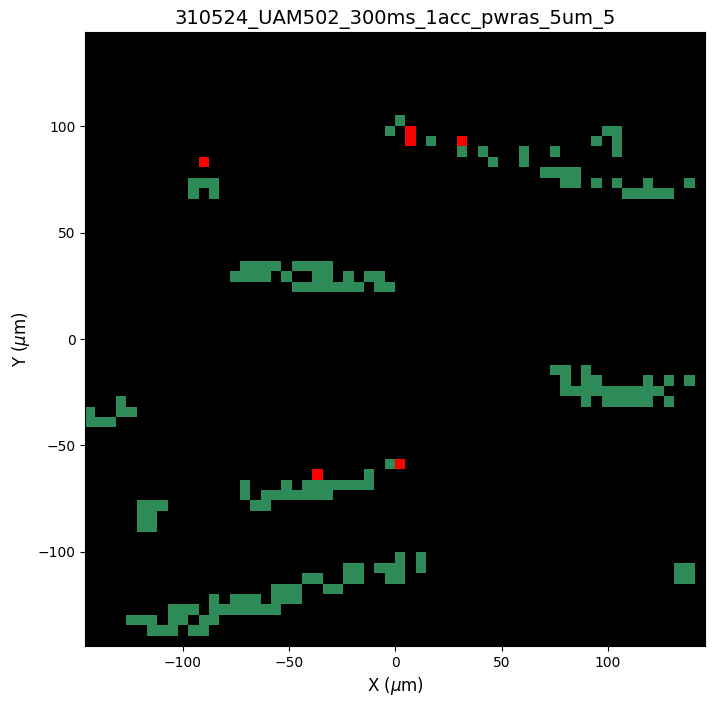


Processing file: 310524_UAM502_500ms_1acc_pwcasi1_5um_6
Valid: 71, Outliers: 8


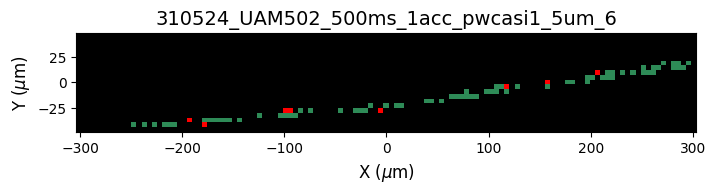


Processing file: 310524_UAM502_500ms_1acc_pwmuescacasi1_5um_10
Valid: 320, Outliers: 14


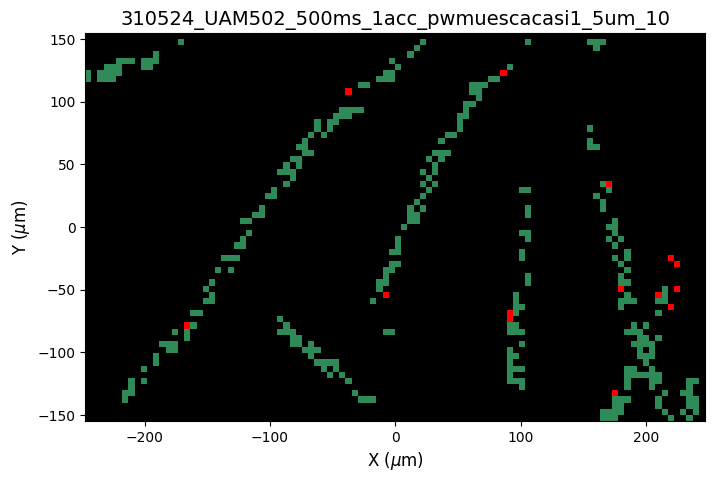


Processing file: 310524_UAM502_500ms_1acc_pwmuescacasi1_5um_11
Valid: 406, Outliers: 17


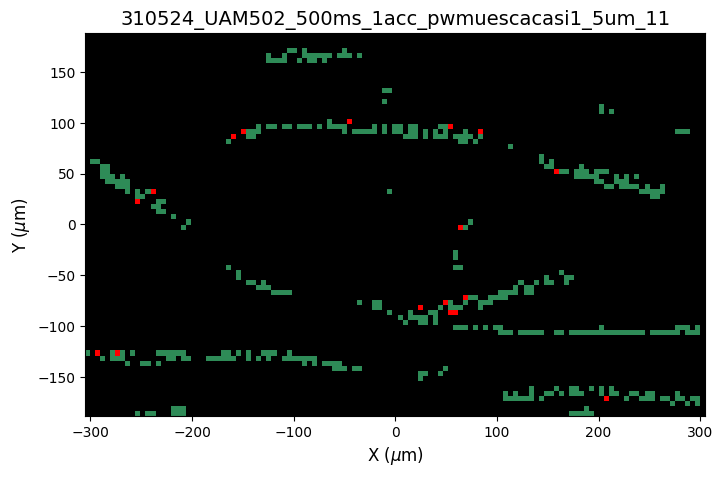


Processing file: 310524_UAM502_500ms_1acc_pwmuescacasi1_5um_12
Valid: 255, Outliers: 18


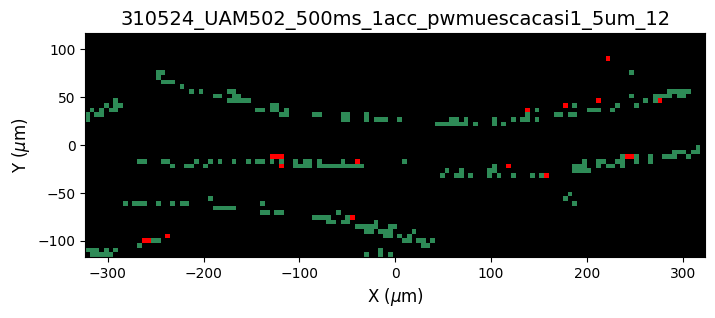


Processing file: 310524_UAM502_500ms_1acc_pwmuescacasi1_5um_13
Valid: 391, Outliers: 13


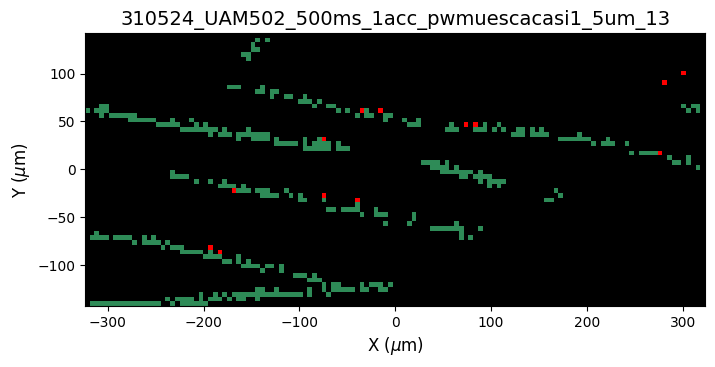


Processing file: 310524_UAM502_500ms_1acc_pwmuescacasi1_5um_7
Valid: 384, Outliers: 14


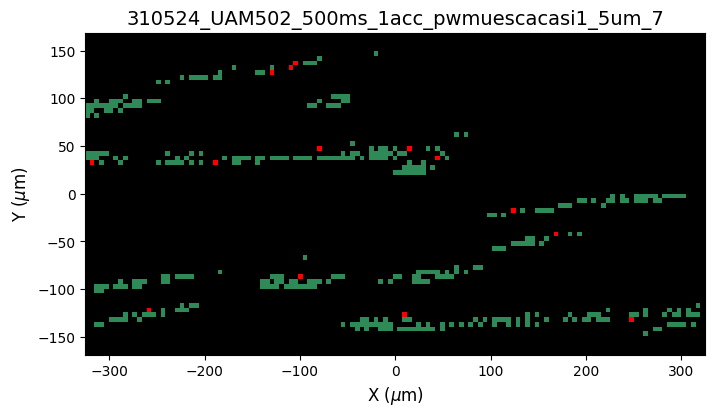


Processing file: 310524_UAM502_500ms_1acc_pwmuescacasi1_5um_8
Valid: 290, Outliers: 10


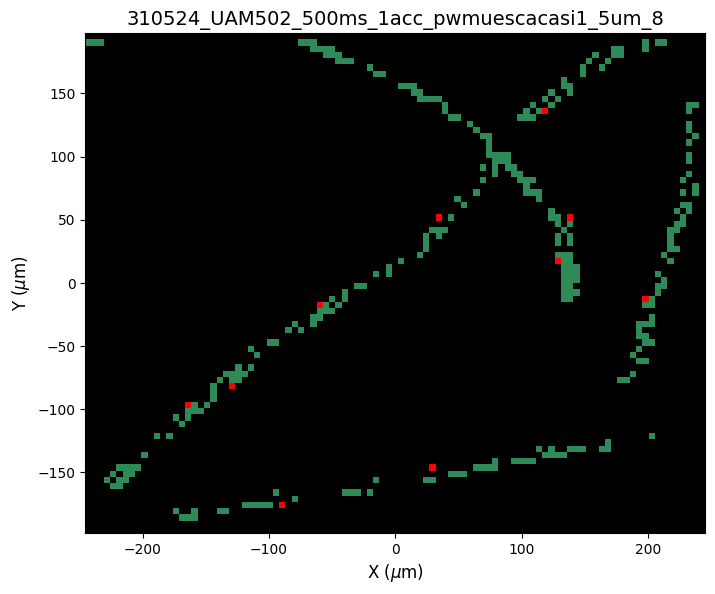


Processing file: 310524_UAM502_500ms_1acc_pwmuescacasi1_5um_9
Valid: 319, Outliers: 11


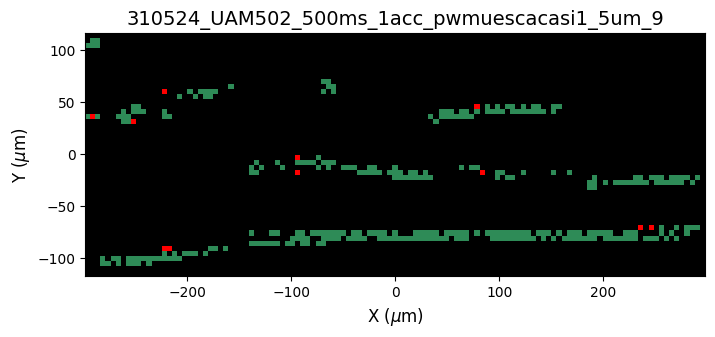


Processing file: 020924_UAM253_500ms_1acc_pwcasiras1_5um_1
Valid: 53, Outliers: 0


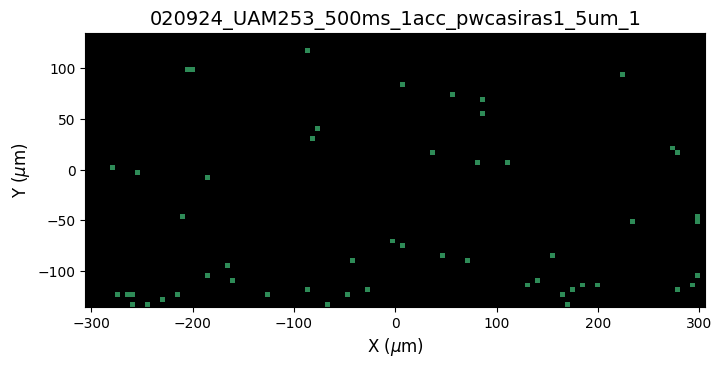


Processing file: 020924_UAM253_500ms_1acc_pwcasiras1_5um_2
Valid: 454, Outliers: 0


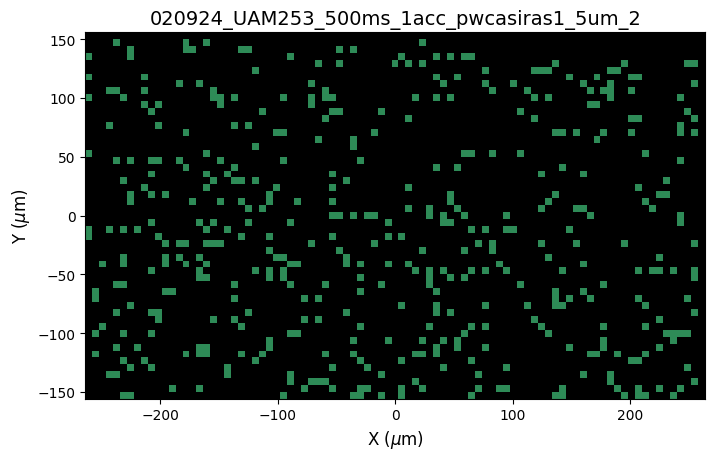


Processing file: 020924_UAM253_500ms_1acc_pwcasiras1_5um_3
Valid: 571, Outliers: 0


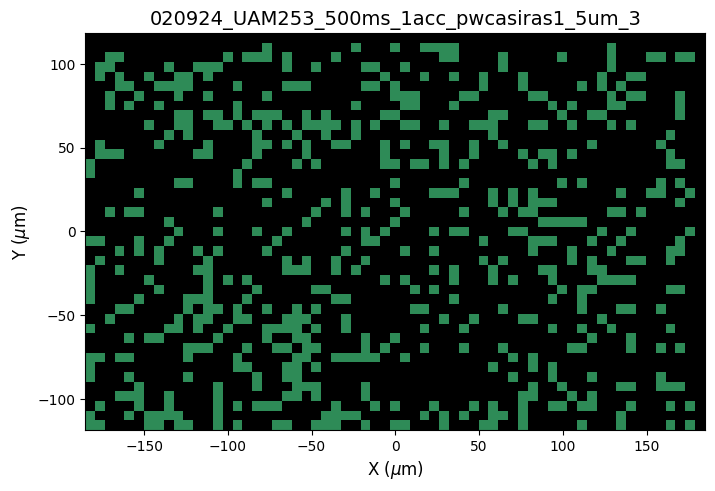


Processing file: 030924_UAM588_500ms_1acc_pwcasiras_5um_1
Valid: 274, Outliers: 0


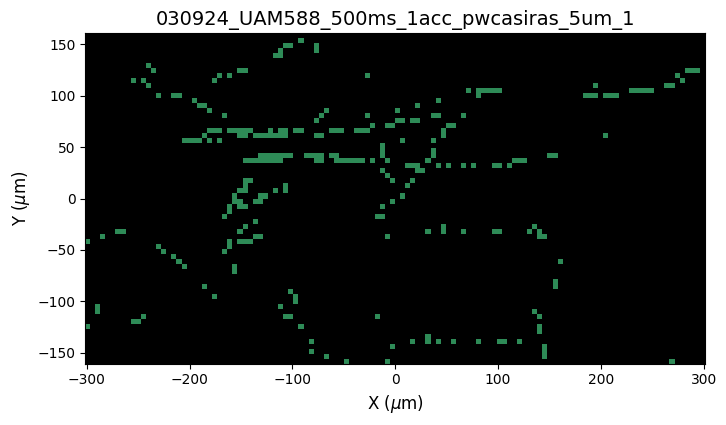


Processing file: 030924_UAM588_500ms_1acc_pwcasiras_5um_2
Valid: 59, Outliers: 0


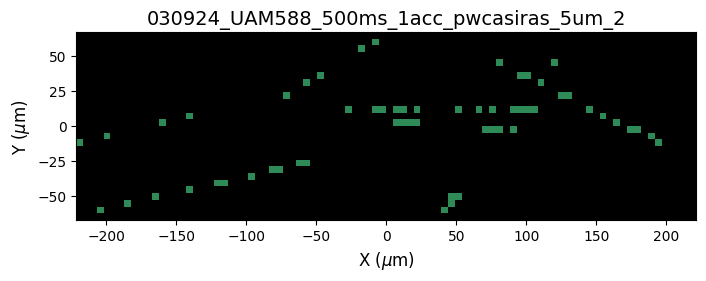


Processing file: 040924_UAM565_500ms_1acc_pwcasiras1_5um_1
Valid: 204, Outliers: 0


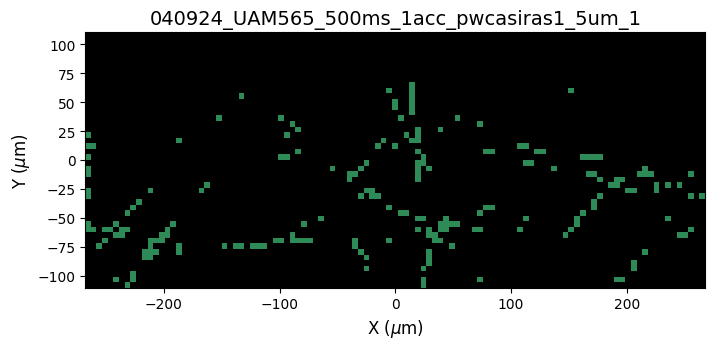


Processing file: 040924_UAM588_500ms_1acc_pwcasiras_5um_1
Valid: 16, Outliers: 0


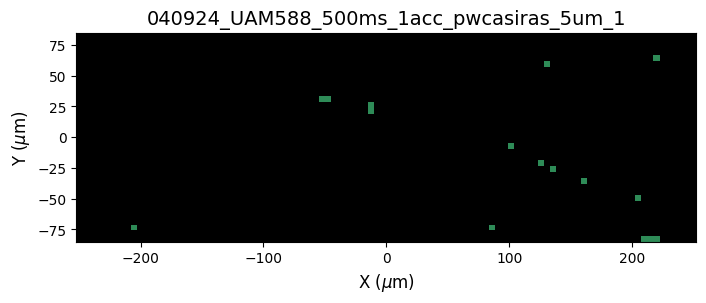


Processing file: 050924_UAM565_500ms_1acc_pwcasiras1_5um_1
Valid: 124, Outliers: 0


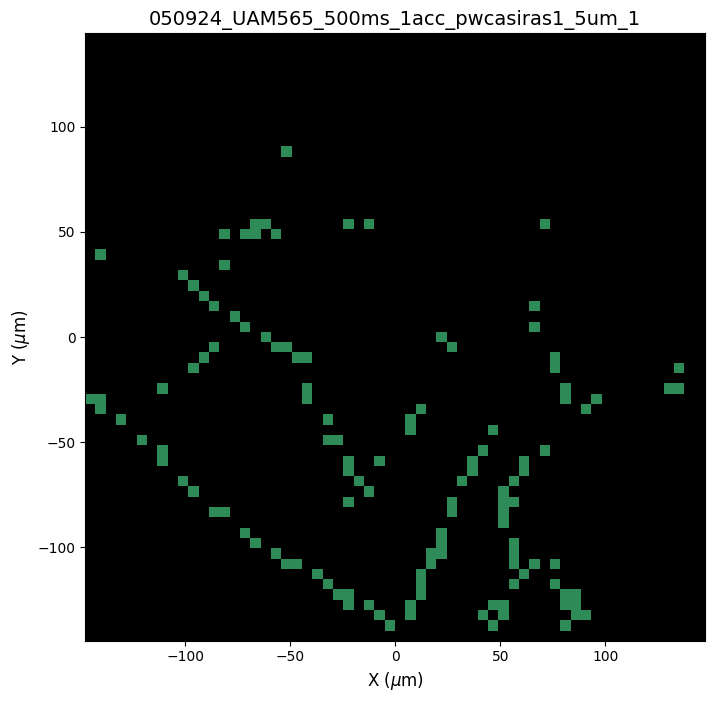


Processing file: 060924_UAM565_500ms_1acc_pwcasiras1_2um_2
Valid: 232, Outliers: 0


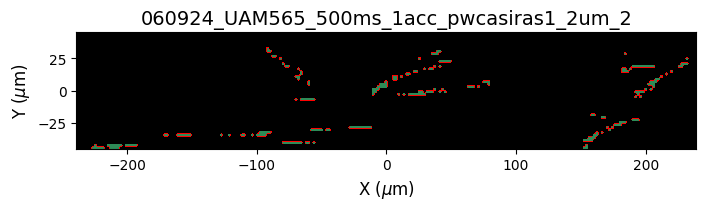


Processing file: 060924_UAM565_500ms_1acc_pwcasiras1_5um_1
Valid: 13, Outliers: 0
No data found in `infomapas` for the file: 060924_UAM565_500ms_1acc_pwcasiras1_5um_1

Processing file: 090924_UAM588_500ms_1acc_pwmuesca1_3um_10
Valid: 5, Outliers: 0


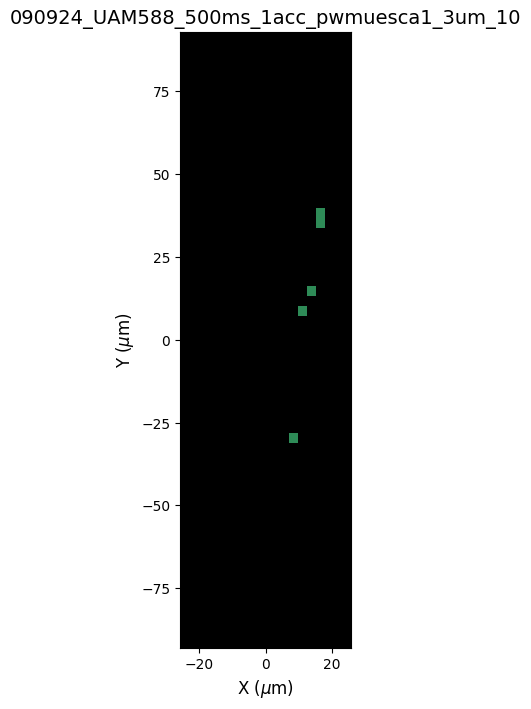


Processing file: 090924_UAM588_500ms_1acc_pwmuesca1_3um_12
Valid: 14, Outliers: 0


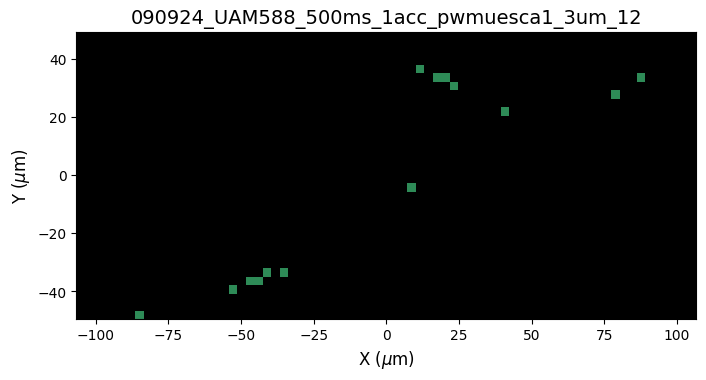


Processing file: 090924_UAM588_500ms_1acc_pwmuesca1_3um_13
Valid: 4, Outliers: 0


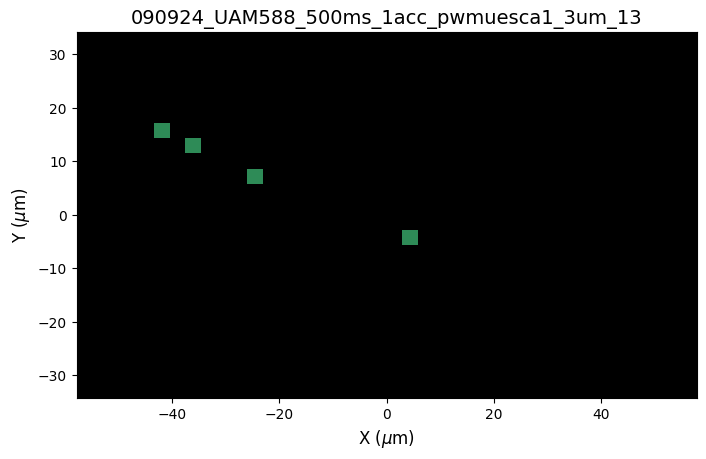


Processing file: 090924_UAM588_500ms_1acc_pwmuesca1_3um_5
Valid: 38, Outliers: 0


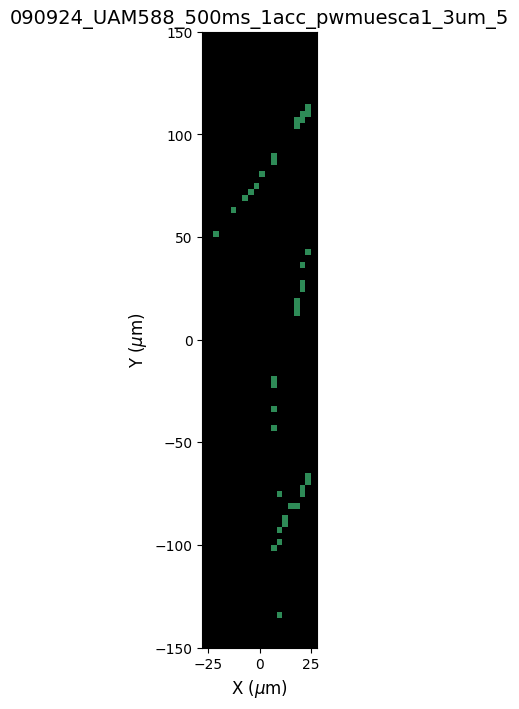


Processing file: 090924_UAM588_500ms_1acc_pwmuesca1_3um_6
Valid: 21, Outliers: 0


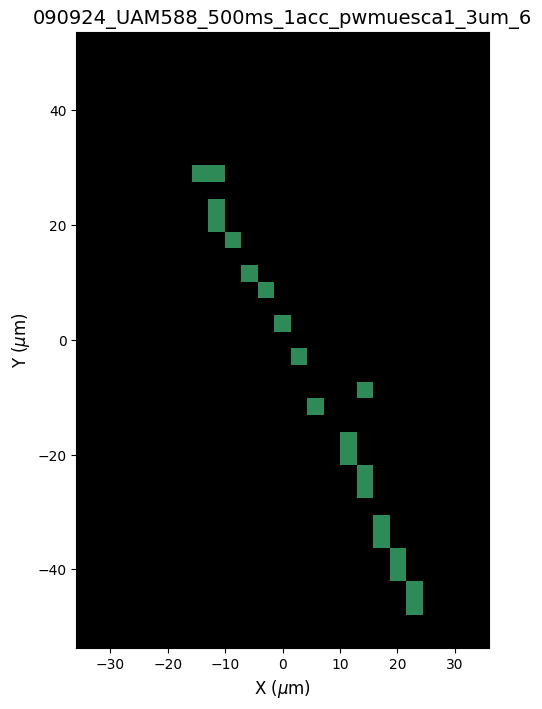


Processing file: 090924_UAM588_500ms_1acc_pwmuesca1_3um_9
Valid: 27, Outliers: 0


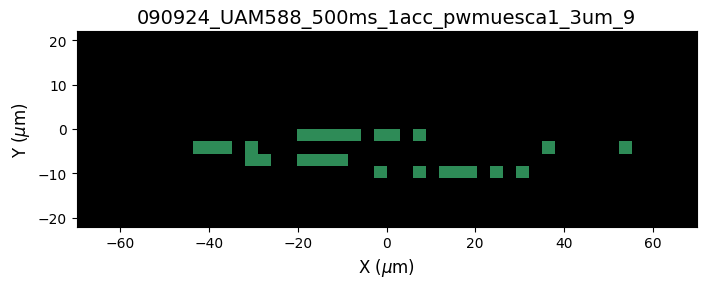


Processing file: 100924_UAM588_500ms_1acc_pwmuesca1_3um_1
Valid: 25, Outliers: 0


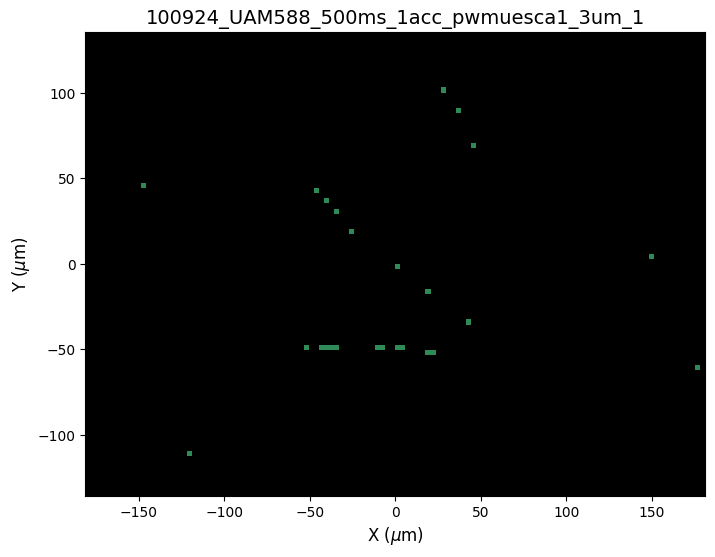


Processing file: 110924_UAM588_500ms_1acc_pwmuesca1_3um_1
Valid: 83, Outliers: 0


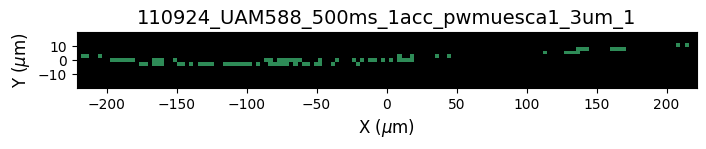


Processing file: 110924_UAM588_500ms_1acc_pwmuesca1_3um_3
Valid: 54, Outliers: 0


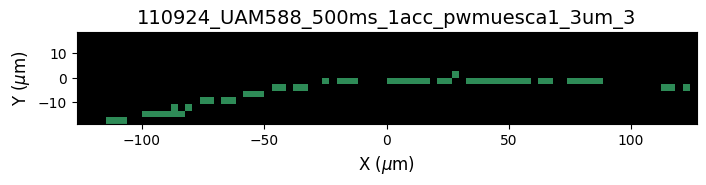


Processing file: 110924_UAM588_500ms_1acc_pwmuesca1_3um_4
Valid: 41, Outliers: 0


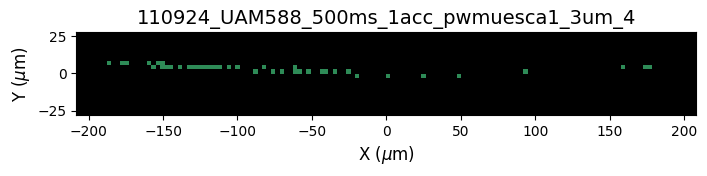


Processing file: 130824_UAM502_500ms_1acc_pwcasi1_6um_1
Valid: 5, Outliers: 0


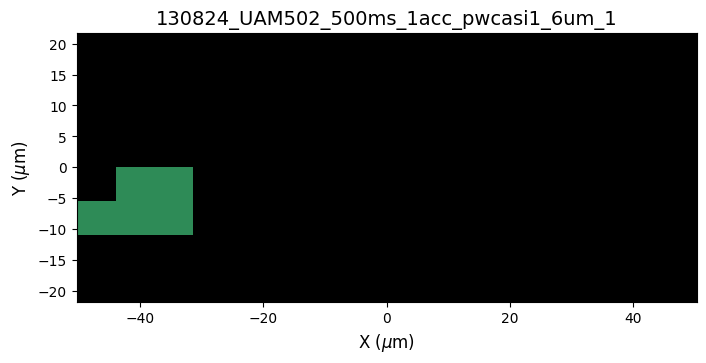


Processing file: 130824_UAM502_500ms_1acc_pwcasi1_6um_10
Valid: 42, Outliers: 0


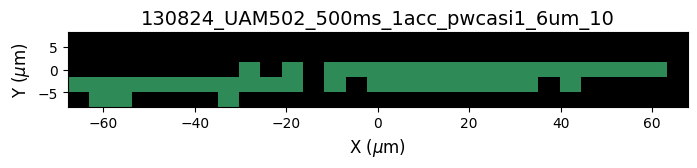


Processing file: 130824_UAM502_500ms_1acc_pwcasi1_6um_11
Valid: 49, Outliers: 0


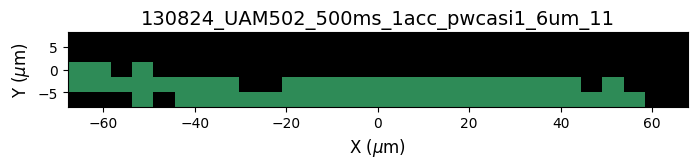


Processing file: 130824_UAM502_500ms_1acc_pwcasi1_6um_12
Valid: 71, Outliers: 0


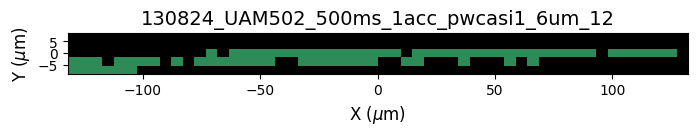


Processing file: 130824_UAM502_500ms_1acc_pwcasi1_6um_13
Valid: 44, Outliers: 0


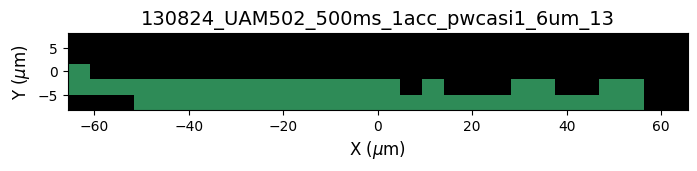


Processing file: 130824_UAM502_500ms_1acc_pwcasi1_6um_14
Valid: 53, Outliers: 0


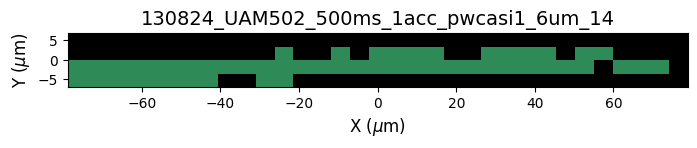


Processing file: 130824_UAM502_500ms_1acc_pwcasi1_6um_2
Valid: 93, Outliers: 0


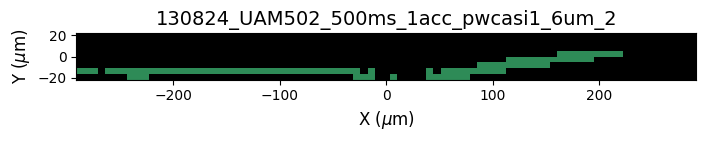


Processing file: 130824_UAM502_500ms_1acc_pwcasi1_6um_3
Valid: 16, Outliers: 0


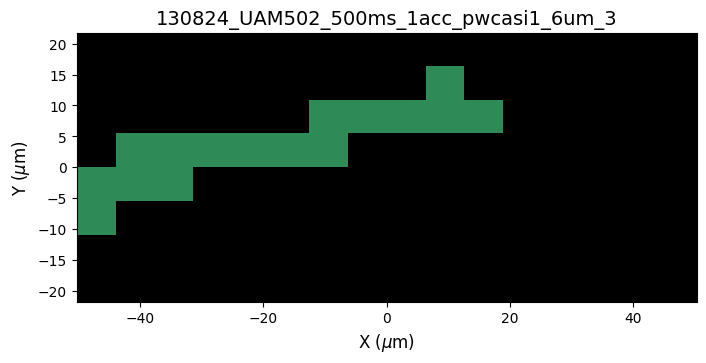


Processing file: 130824_UAM502_500ms_1acc_pwcasi1_6um_4
Valid: 36, Outliers: 0


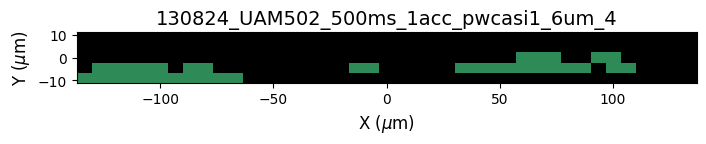


Processing file: 130824_UAM502_500ms_1acc_pwcasi1_6um_5
Valid: 58, Outliers: 0


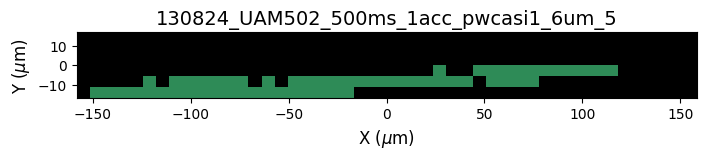


Processing file: 130824_UAM502_500ms_1acc_pwcasi1_6um_6
Valid: 8, Outliers: 0


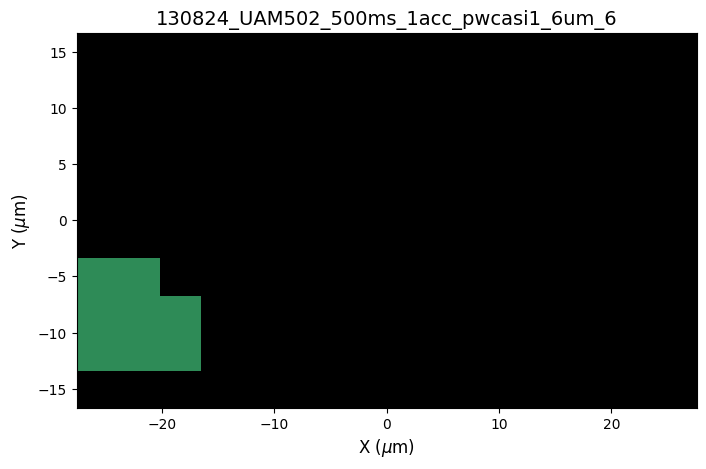


Processing file: 130824_UAM502_500ms_1acc_pwcasi1_6um_7
Valid: 225, Outliers: 0


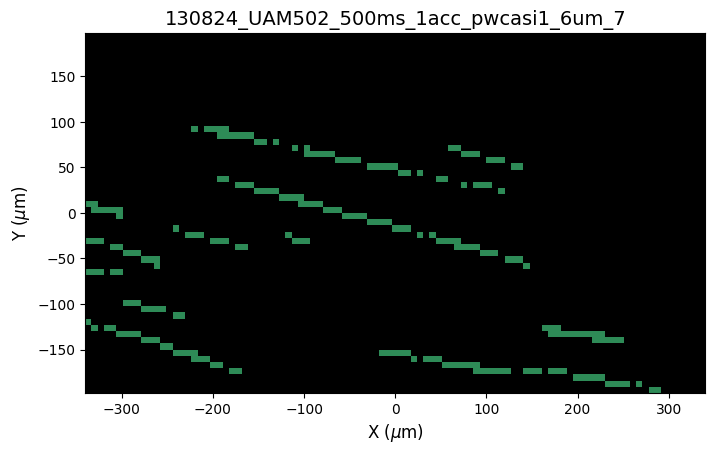


Processing file: 130824_UAM502_500ms_1acc_pwcasi1_6um_8
Valid: 58, Outliers: 0


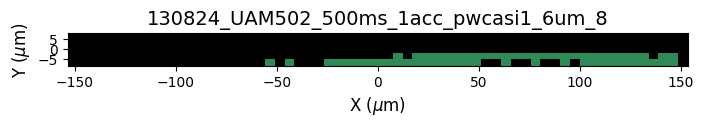


Processing file: 130824_UAM502_500ms_1acc_pwcasi1_6um_9
Valid: 84, Outliers: 0


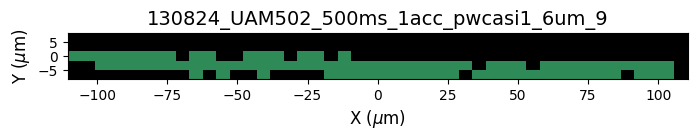


Processing file: 140824_UAM588_500ms_1acc_pwmuesca1_5um_1
Valid: 589, Outliers: 0


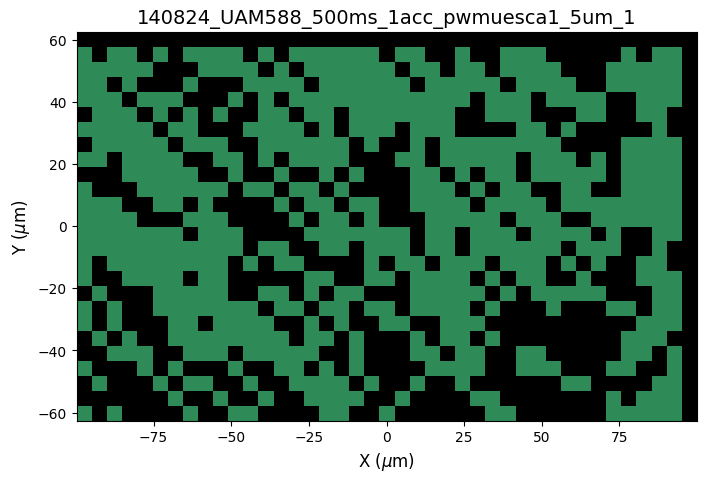


Processing file: 140824_UAM588_500ms_1acc_pwmuesca1_5um_10
Valid: 38, Outliers: 0


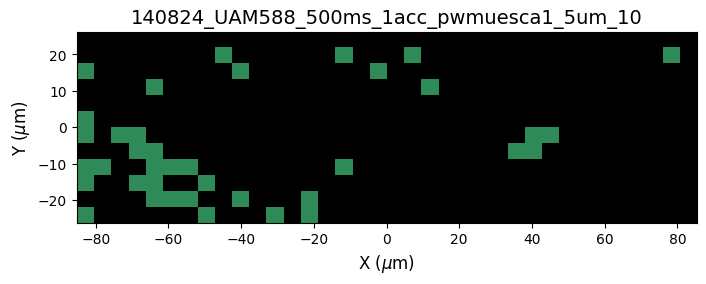


Processing file: 140824_UAM588_500ms_1acc_pwmuesca1_5um_2
Valid: 395, Outliers: 0


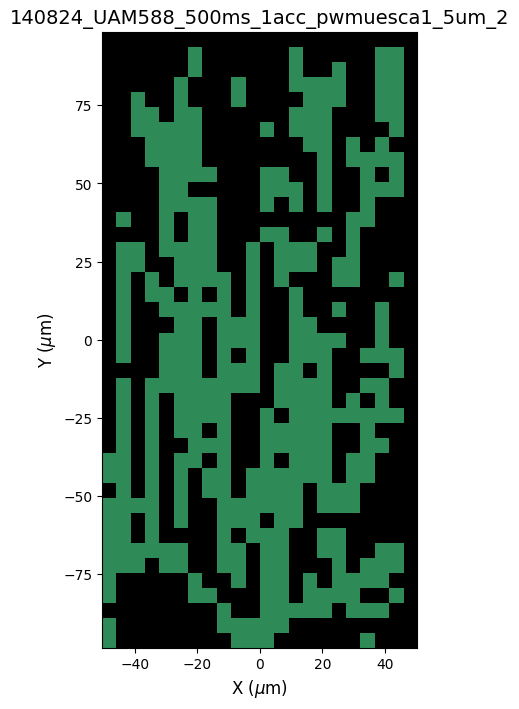


Processing file: 140824_UAM588_500ms_1acc_pwmuesca1_5um_4
Valid: 100, Outliers: 0


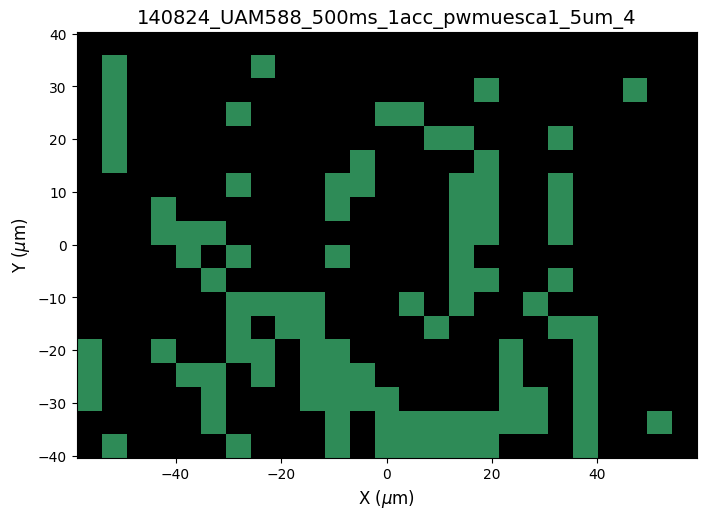


Processing file: 140824_UAM588_500ms_1acc_pwmuesca1_5um_5
Valid: 105, Outliers: 0


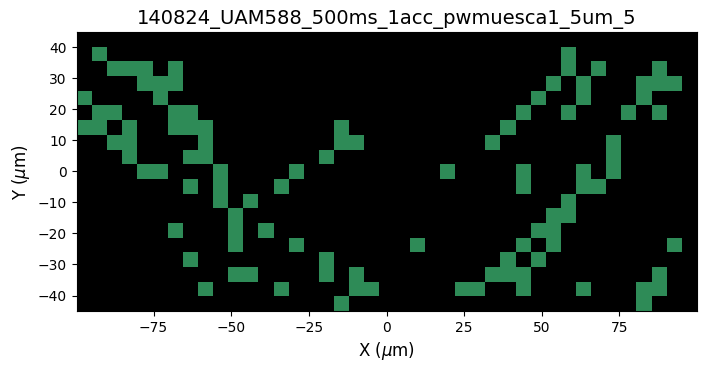


Processing file: 140824_UAM588_500ms_1acc_pwmuesca1_5um_6
Valid: 81, Outliers: 0


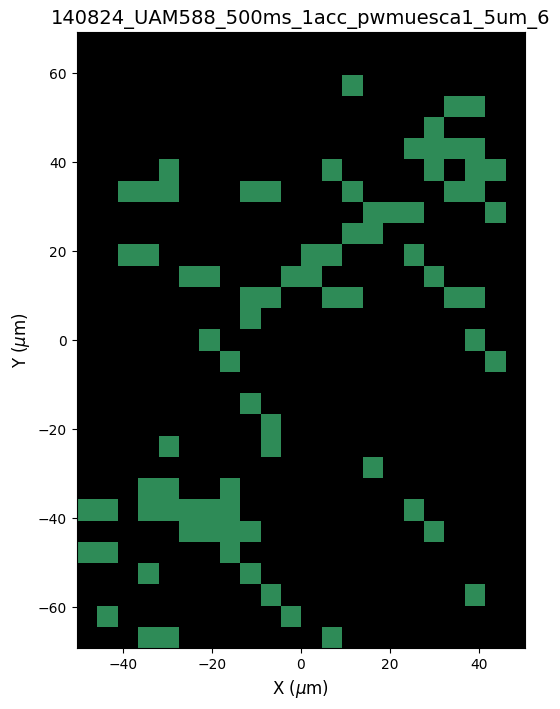


Processing file: 140824_UAM588_500ms_1acc_pwmuesca1_5um_7
Valid: 140, Outliers: 0


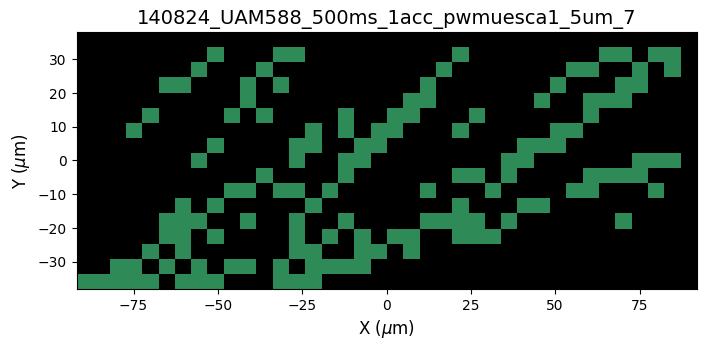


Processing file: 140824_UAM588_500ms_1acc_pwmuesca1_5um_8
Valid: 169, Outliers: 0


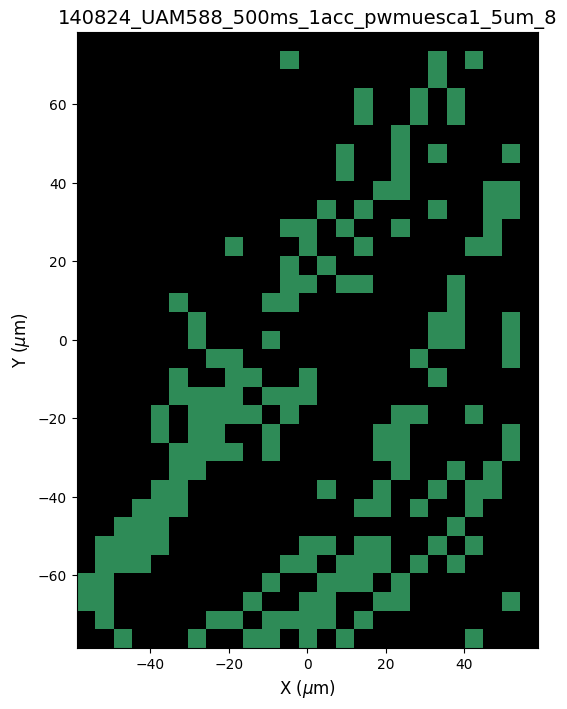


Processing file: 140824_UAM588_500ms_1acc_pwmuesca1_5um_9
Valid: 135, Outliers: 0


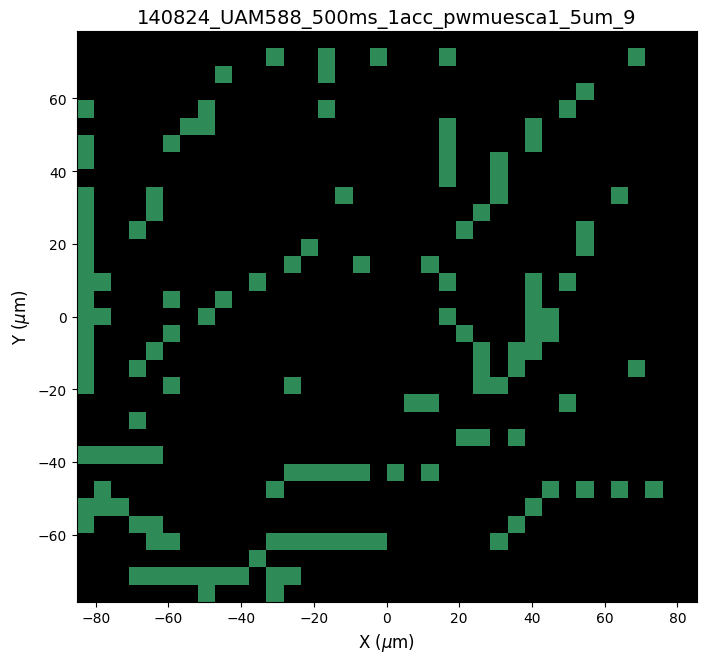


Processing file: 190824_UAM253_500ms_1acc_pwras_8um_1
Valid: 27, Outliers: 0


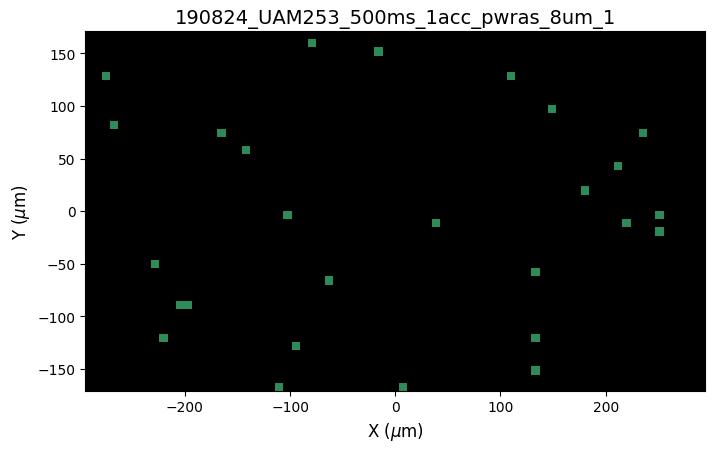


Processing file: 190824_UAM253_500ms_1acc_pwras_8um_2
Valid: 32, Outliers: 0


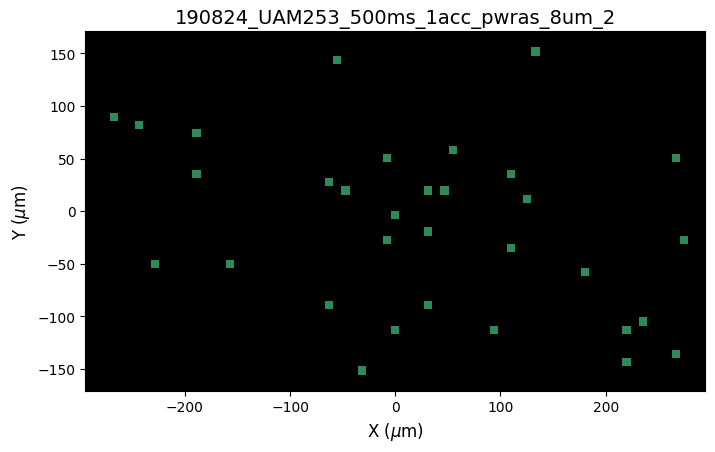


Processing file: 190824_UAM253_500ms_1acc_pwras_8um_3
Valid: 20, Outliers: 0


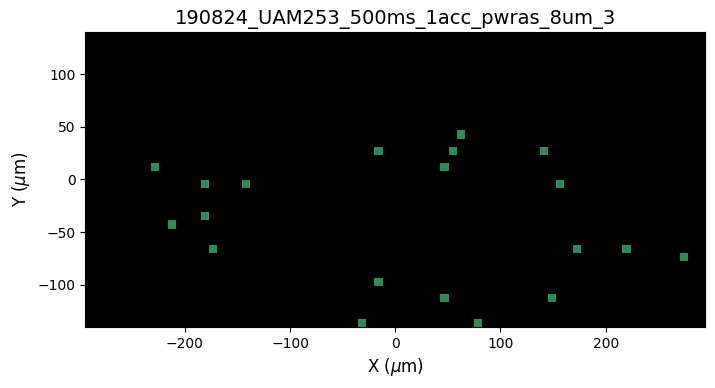


Processing file: 200824_UAM253_500ms_1acc_pwcasiras1_5um_2
Valid: 3, Outliers: 0


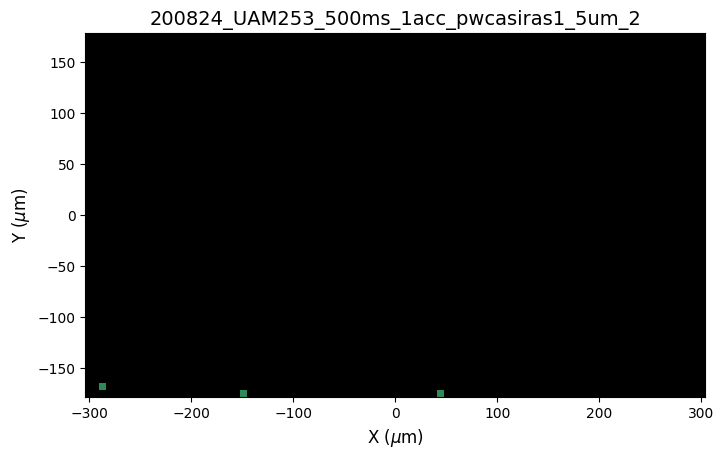


Processing file: 200824_UAM253_500ms_1acc_pwcasiras1_5um_3
Valid: 30, Outliers: 0


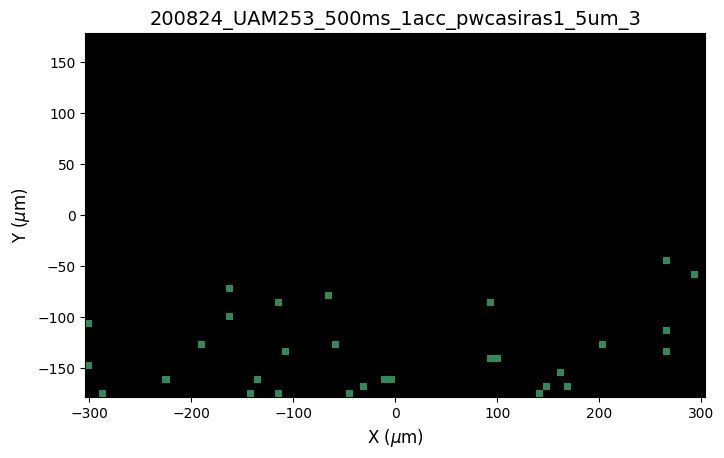


Processing file: 200824_UAM253_500ms_1acc_pwcasiras1_5um_4
Valid: 39, Outliers: 0


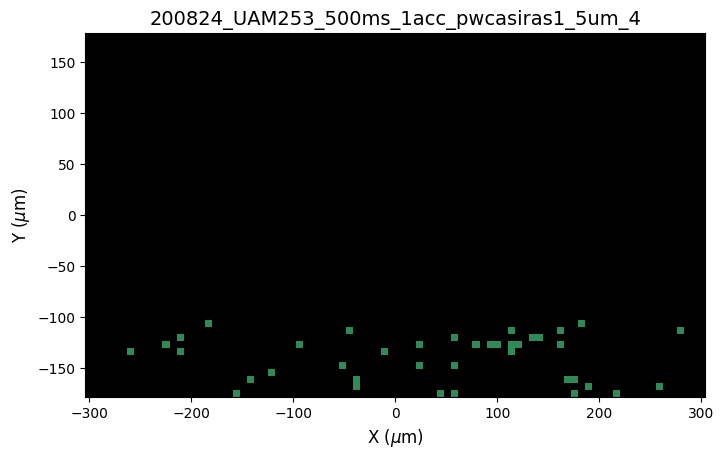


Processing file: 200824_UAM253_500ms_1acc_pwcasiras1_5um_5
Valid: 40, Outliers: 0


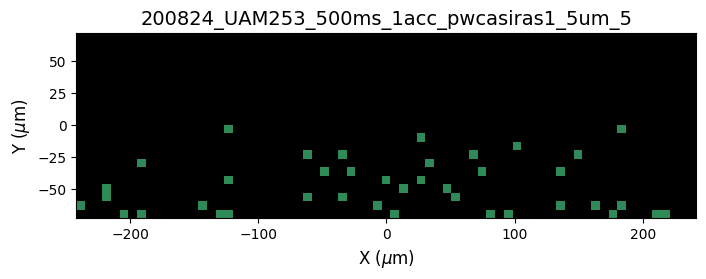


Processing file: 200824_UAM253_500ms_1acc_pwcasiras1_5um_7
Valid: 31, Outliers: 0


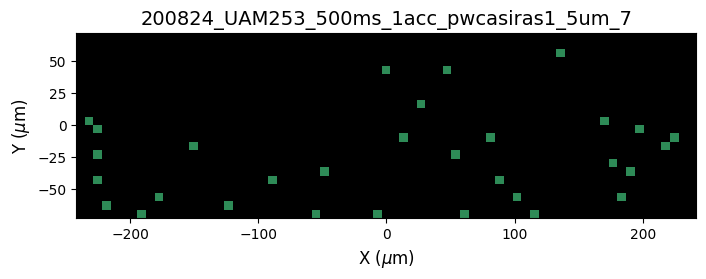


Processing file: 200824_UAM253_500ms_1acc_pwcasiras1_5um_8
Valid: 6, Outliers: 0


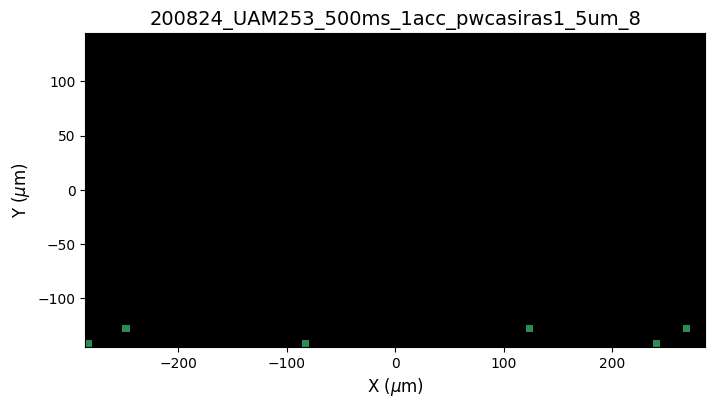


Processing file: 200824_UAM2565_500ms_1acc_pwcasiras1_5um_1
Valid: 14, Outliers: 0


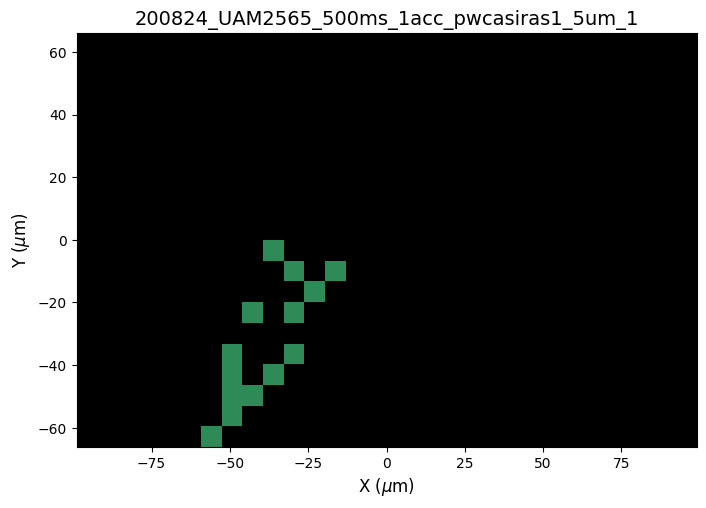


Processing file: 200824_UAM2565_500ms_1acc_pwcasiras1_5um_10
Valid: 23, Outliers: 0


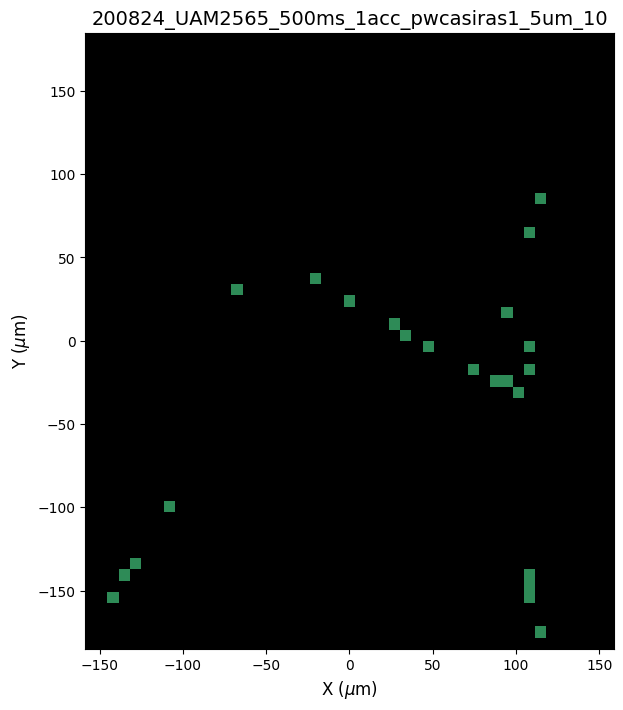


Processing file: 200824_UAM2565_500ms_1acc_pwcasiras1_5um_11
Valid: 17, Outliers: 0


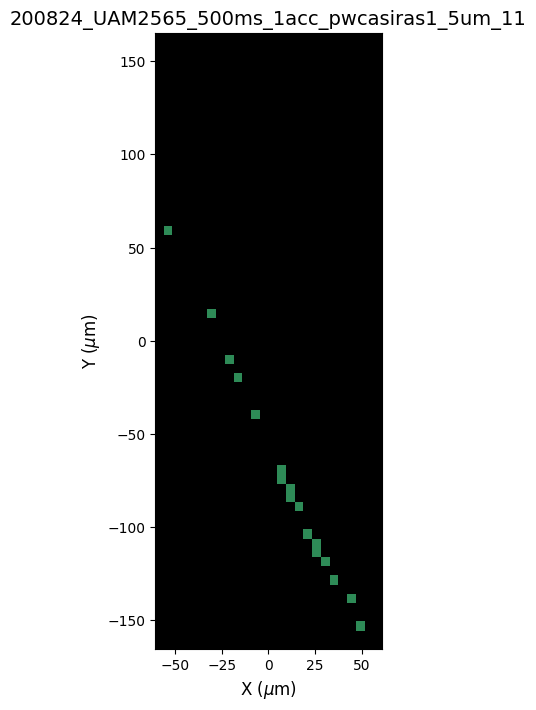


Processing file: 200824_UAM2565_500ms_1acc_pwcasiras1_5um_13
Valid: 13, Outliers: 0


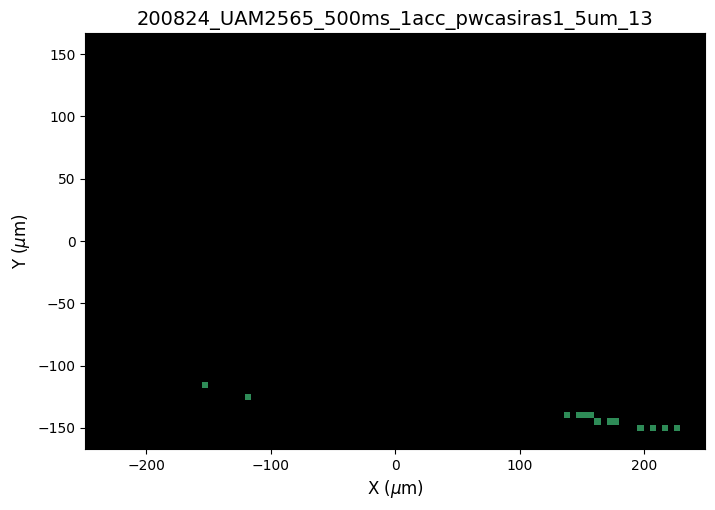


Processing file: 200824_UAM2565_500ms_1acc_pwcasiras1_5um_14
Valid: 3, Outliers: 0


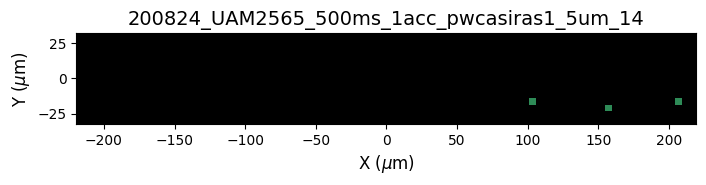


Processing file: 200824_UAM2565_500ms_1acc_pwcasiras1_5um_16
Valid: 4, Outliers: 0


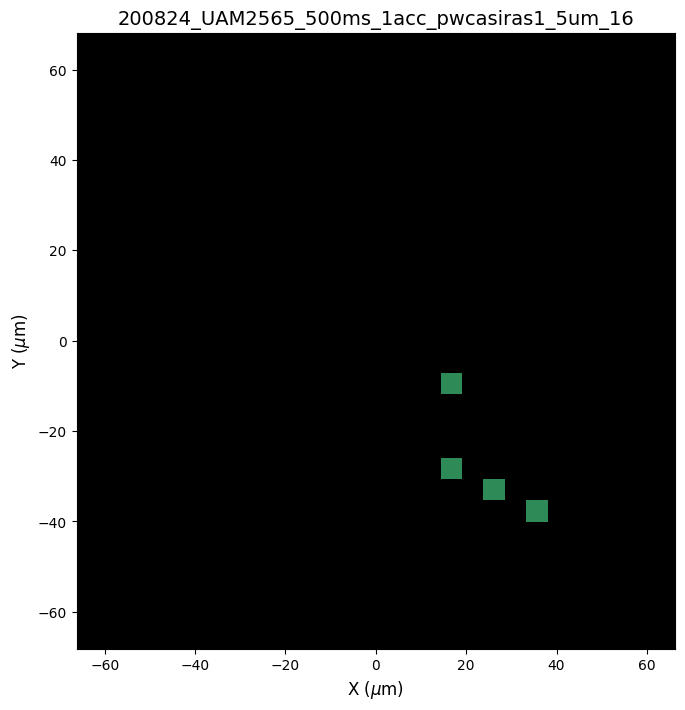


Processing file: 200824_UAM2565_500ms_1acc_pwcasiras1_5um_17
Valid: 1, Outliers: 0


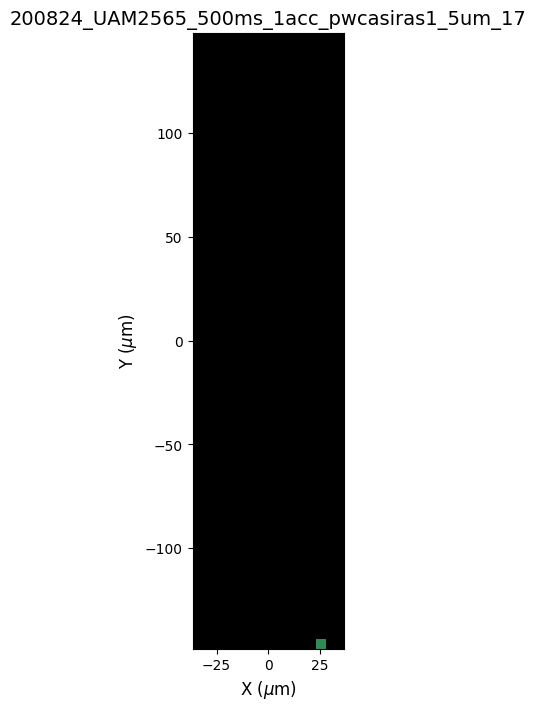


Processing file: 200824_UAM2565_500ms_1acc_pwcasiras1_5um_2
Valid: 6, Outliers: 0


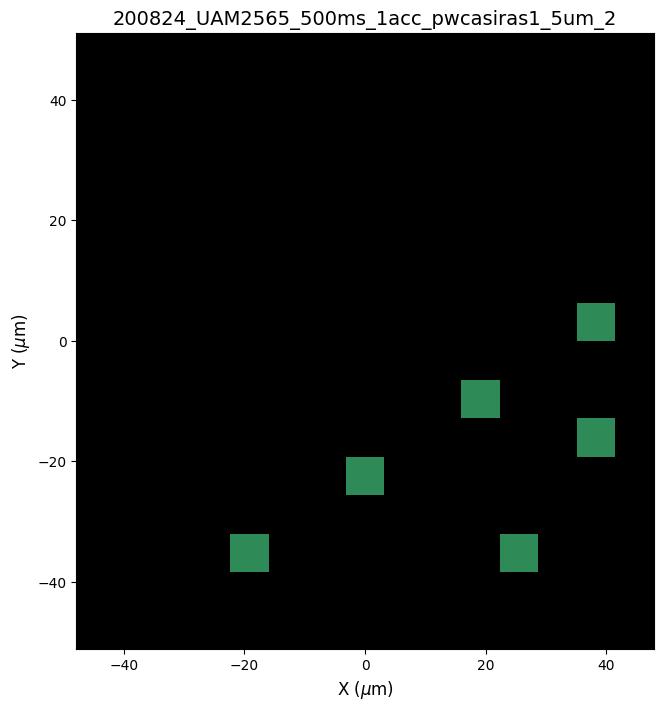


Processing file: 200824_UAM2565_500ms_1acc_pwcasiras1_5um_4
Valid: 45, Outliers: 0


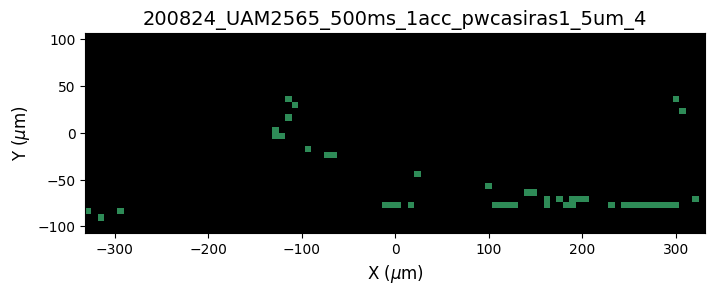


Processing file: 200824_UAM2565_500ms_1acc_pwcasiras1_5um_5
Valid: 8, Outliers: 0


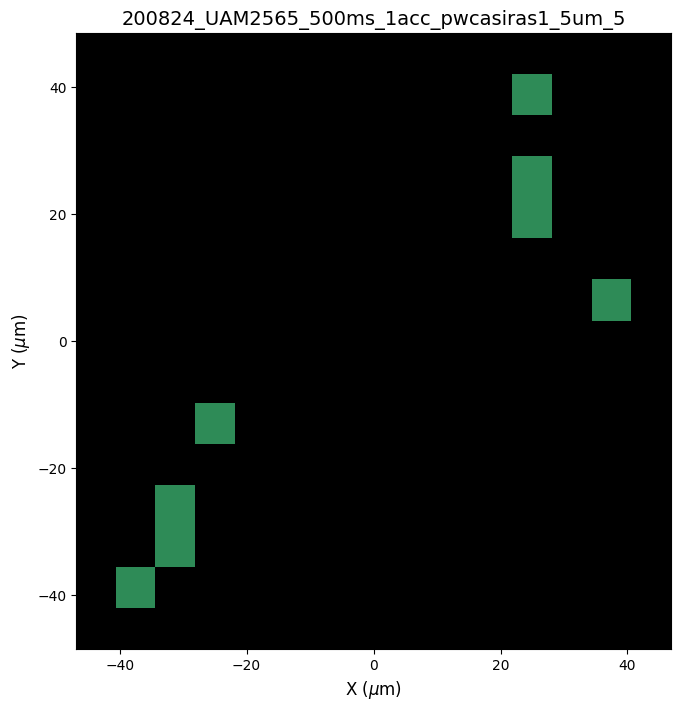


Processing file: 200824_UAM2565_500ms_1acc_pwcasiras1_5um_7
Valid: 3, Outliers: 0


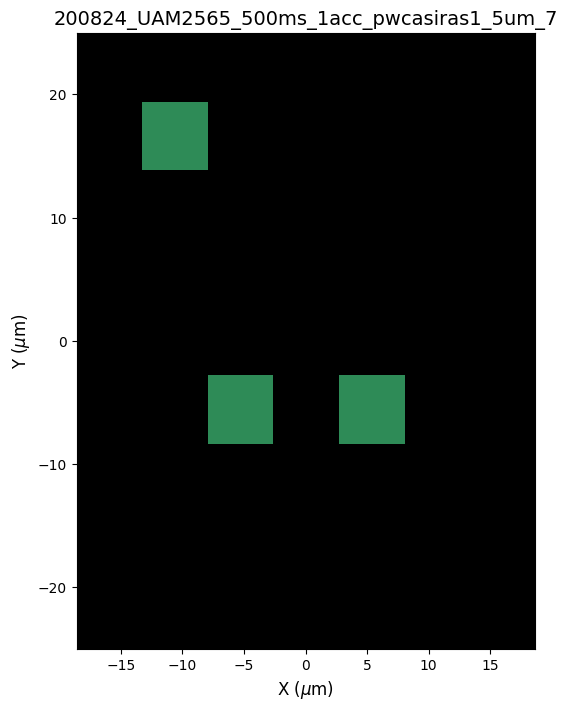


Processing file: 200824_UAM2565_500ms_1acc_pwcasiras1_5um_8
Valid: 10, Outliers: 0


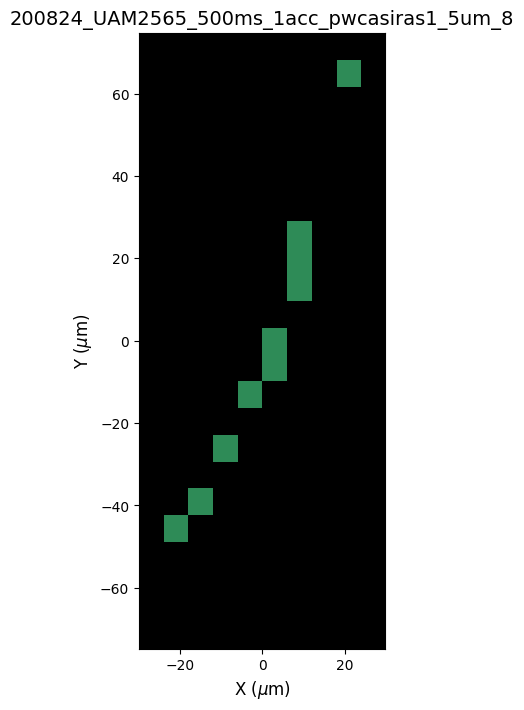


Processing file: 210824_UAM2565_500ms_1acc_pwcasiras1_5um_1
Valid: 17, Outliers: 0


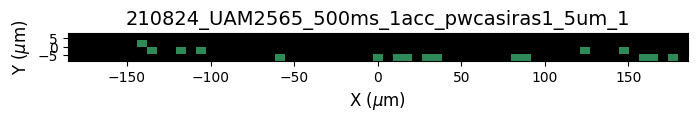


Processing file: 210824_UAM2565_500ms_1acc_pwcasiras1_5um_2
Valid: 10, Outliers: 0


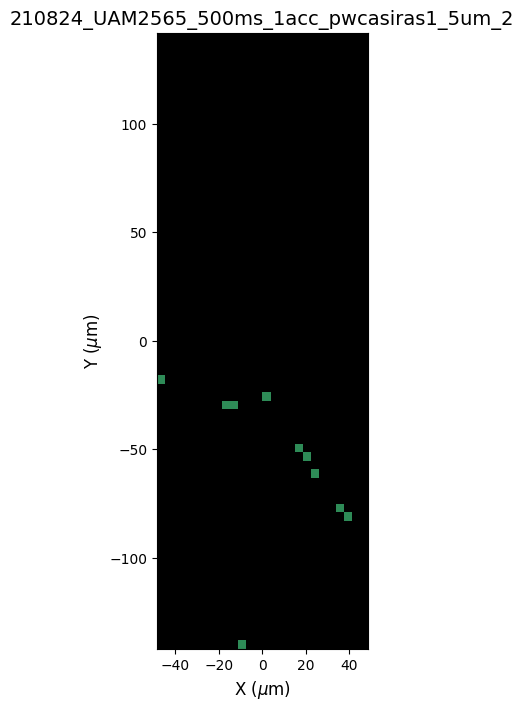


Processing file: 210824_UAM2565_500ms_1acc_pwcasiras1_5um_3
Valid: 9, Outliers: 0


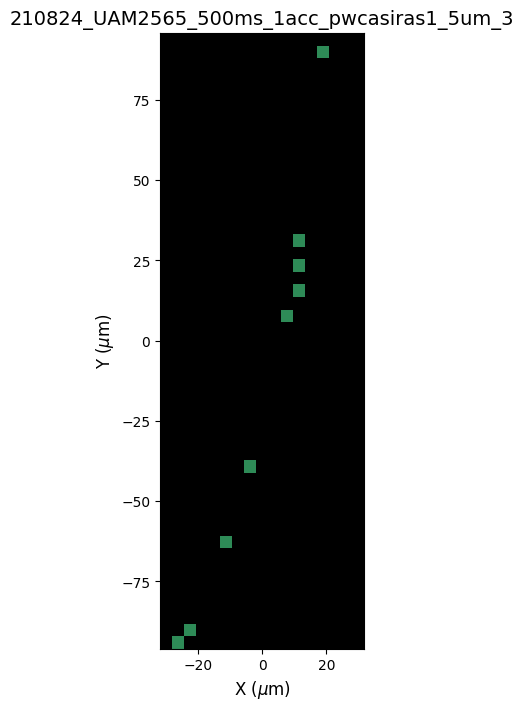


Processing file: 210824_UAM2565_500ms_1acc_pwcasiras1_5um_4
Valid: 18, Outliers: 0


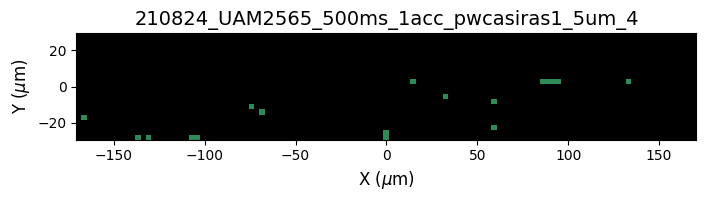


Processing file: 210824_UAM2565_500ms_1acc_pwcasiras1_5um_5
Valid: 25, Outliers: 0


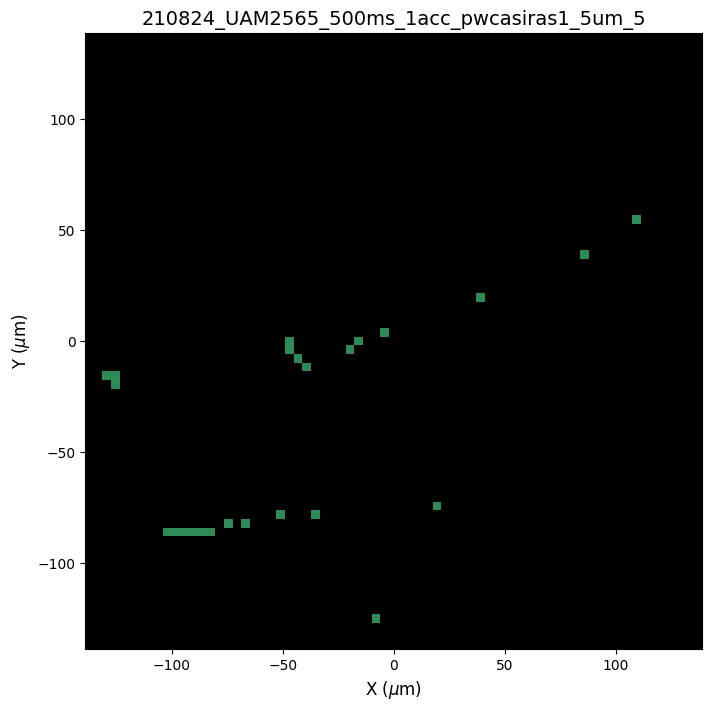


Processing file: 210824_UAM2565_500ms_1acc_pwcasiras1_5um_6
Valid: 50, Outliers: 0


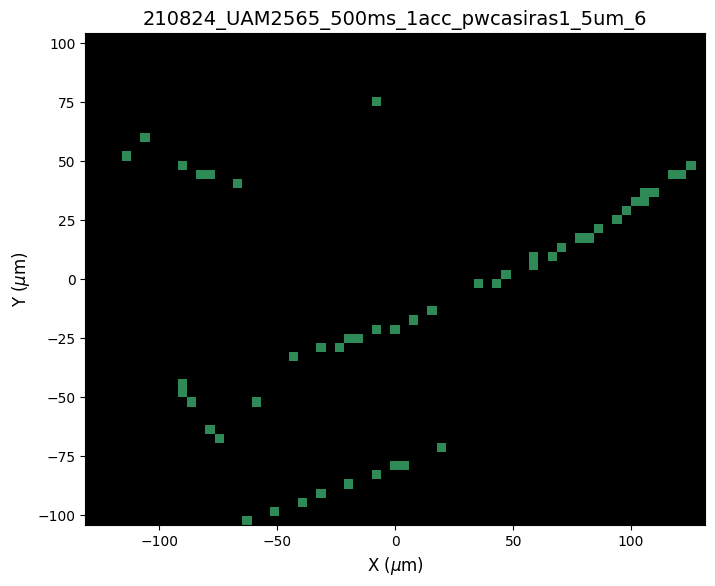


Processing file: 210824_UAM2565_500ms_1acc_pwcasiras1_5um_7
Valid: 28, Outliers: 0


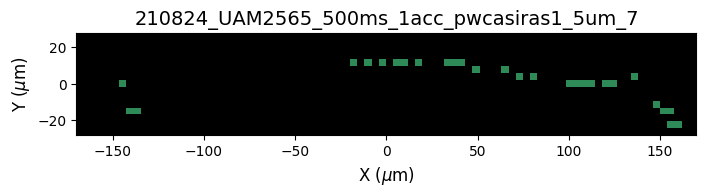


Processing file: 210824_UAM2565_500ms_1acc_pwcasiras1_5um_8
Valid: 6, Outliers: 0


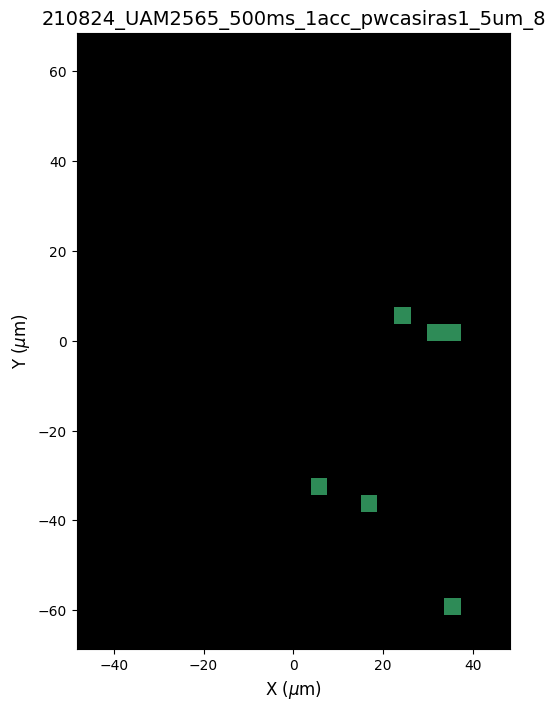


Processing file: 210824_UAM2565_500ms_1acc_pwcasiras1_5um_9
Valid: 4, Outliers: 0


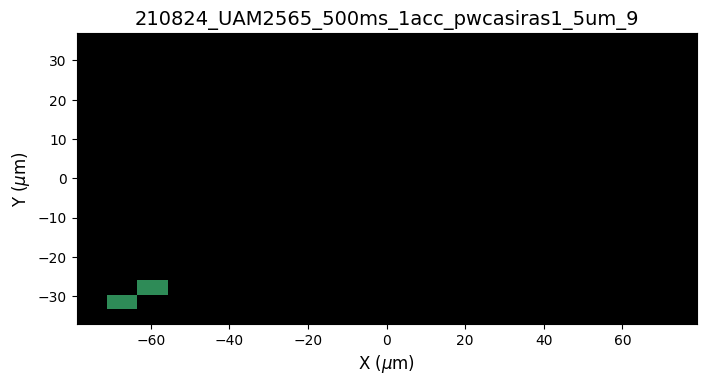


Processing file: 280824_UAM588_500ms_1acc_pwcasiras_5um_1
Valid: 275, Outliers: 0


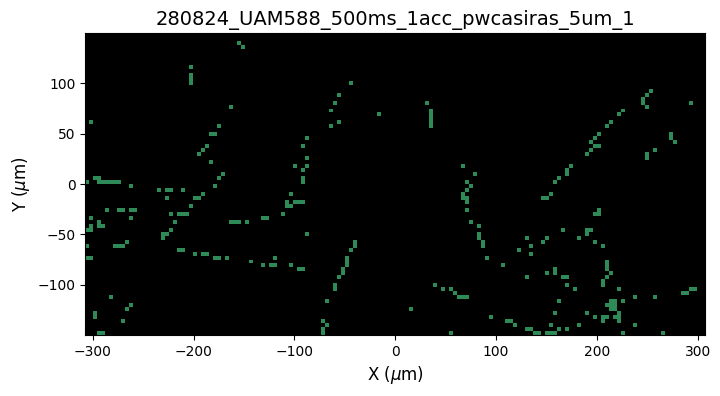


Processing file: 280824_UAM588_500ms_1acc_pwcasiras_5um_2
Valid: 61, Outliers: 0


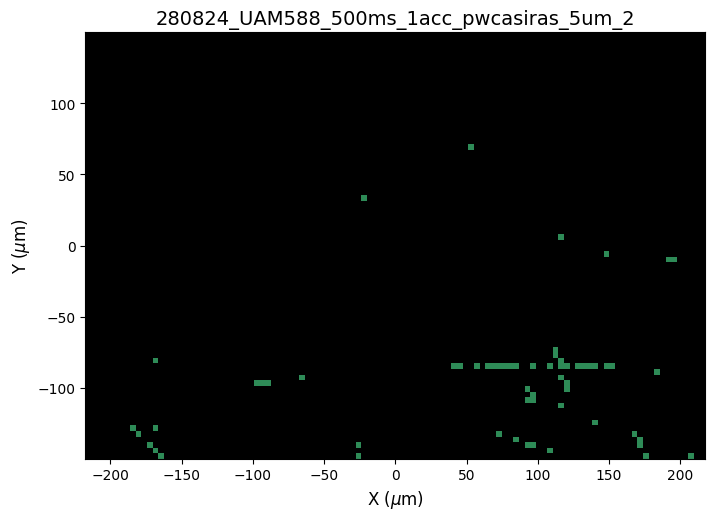


Processing file: 280824_UAM588_500ms_1acc_pwcasiras_5um_3
Valid: 105, Outliers: 0


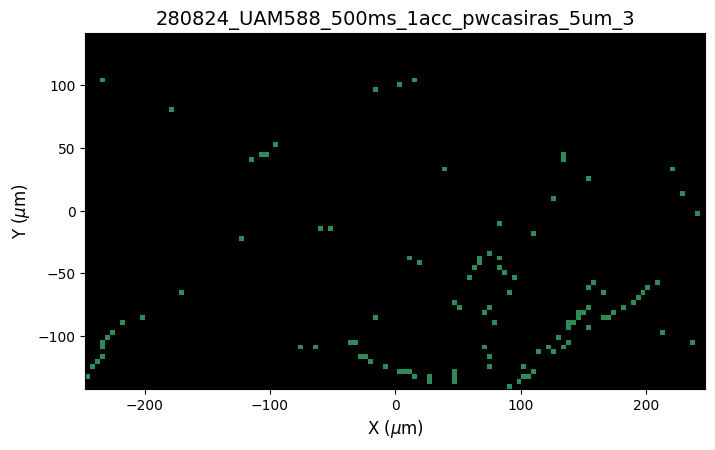


Processing file: 280824_UAM588_500ms_1acc_pwcasiras_5um_4_larga
Valid: 150, Outliers: 0


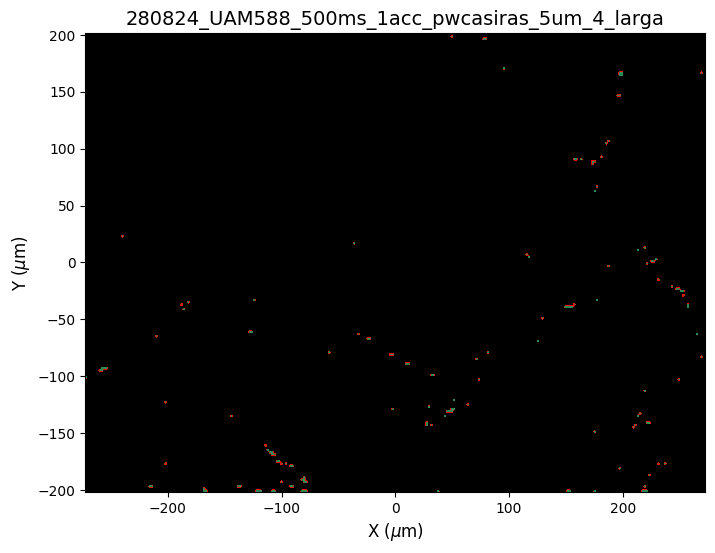


Processing file: 290824_UAM565_500ms_1acc_pwcasiras1_5um_1
Valid: 120, Outliers: 0


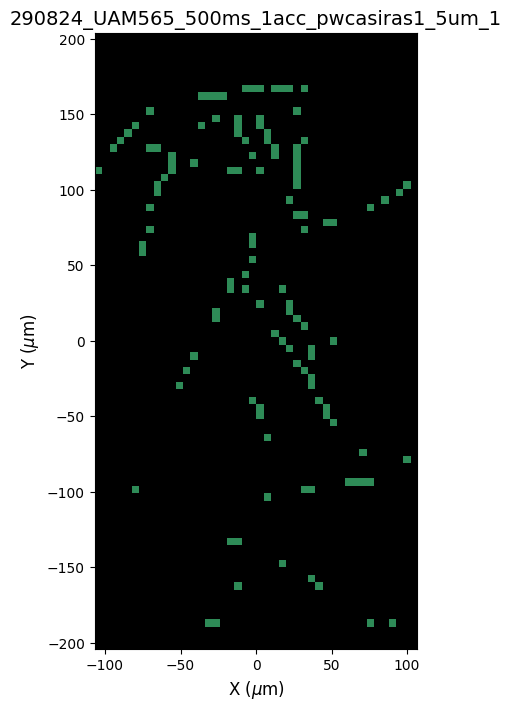


Processing file: 290824_UAM565_500ms_1acc_pwcasiras1_5um_2
Valid: 27, Outliers: 0


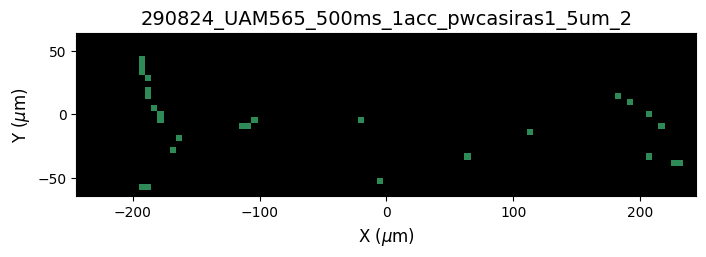


Processing file: 290824_UAM565_500ms_1acc_pwcasiras1_5um_3
Valid: 7, Outliers: 0


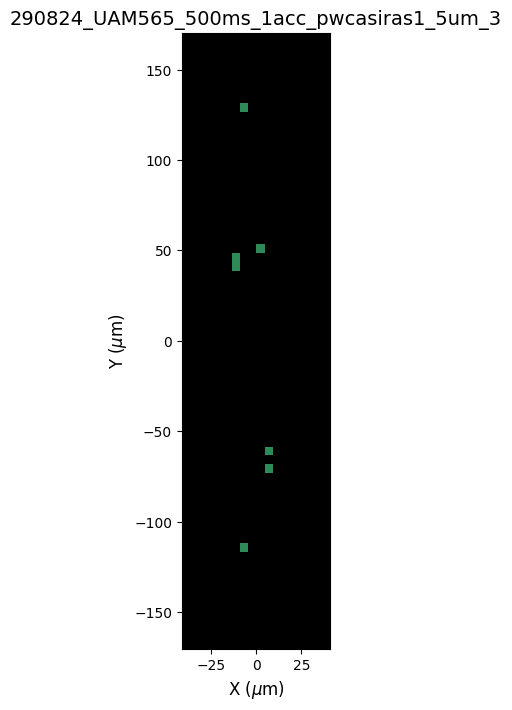


Processing file: 290824_UAM565_500ms_1acc_pwcasiras1_5um_4
Valid: 21, Outliers: 0


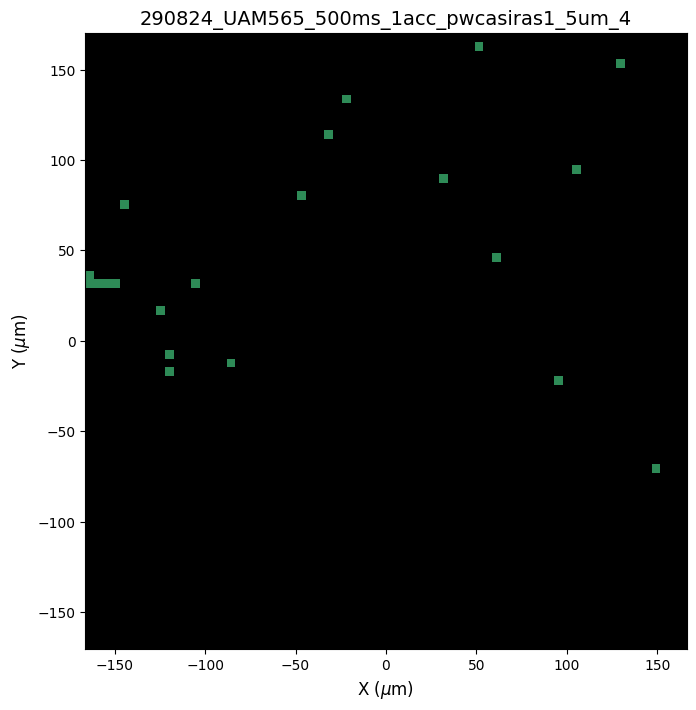


Processing file: 290824_UAM565_500ms_1acc_pwcasiras1_5um_5
Valid: 149, Outliers: 0


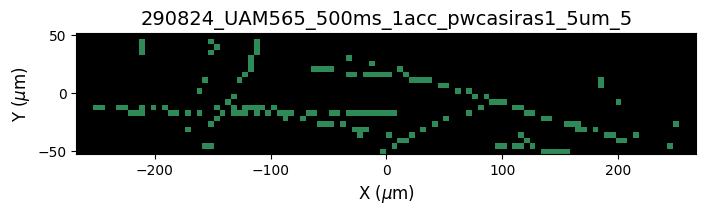


Processing file: 290824_UAM565_500ms_1acc_pwcasiras1_5um_6
Valid: 30, Outliers: 0


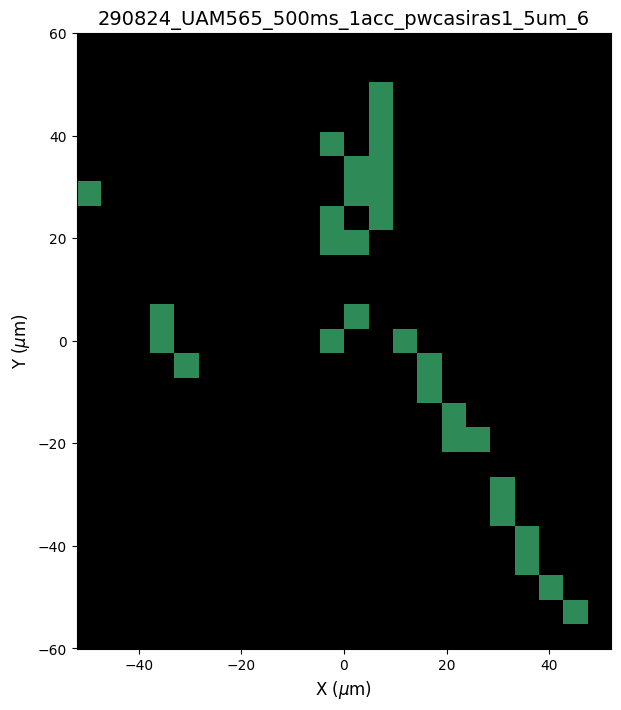


Processing file: 290824_UAM565_500ms_1acc_pwcasiras1_5um_7
Valid: 17, Outliers: 0


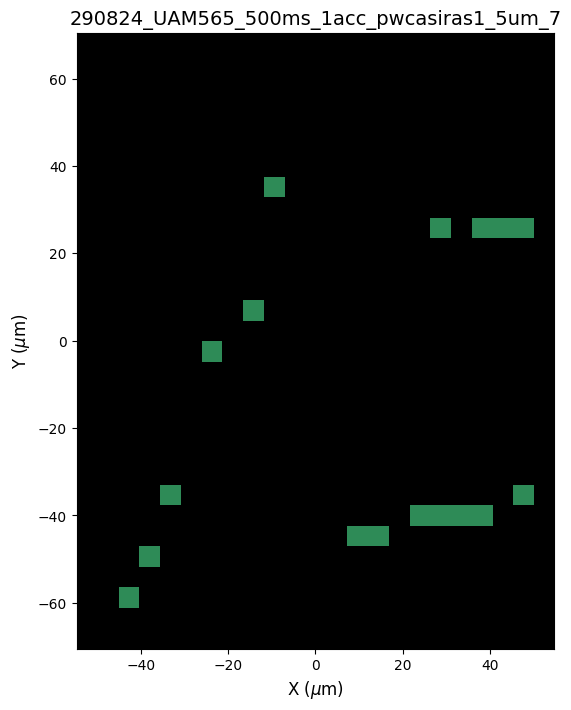


Processing file: 290824_UAM565_500ms_1acc_pwcasiras1_5um_8
Valid: 12, Outliers: 0


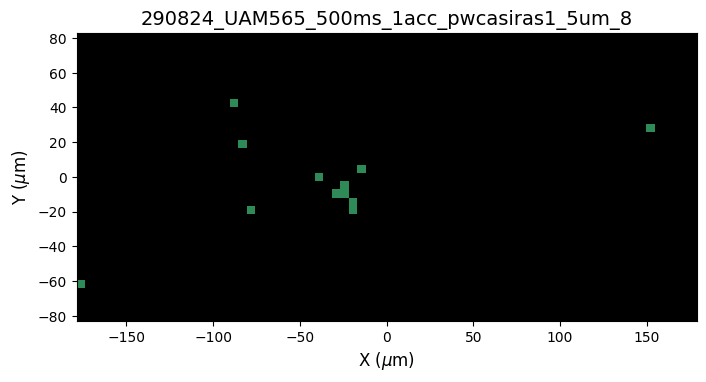


Processing file: 290824_UAM588_500ms_1acc_pwcasiras_5um_1
Valid: 177, Outliers: 0


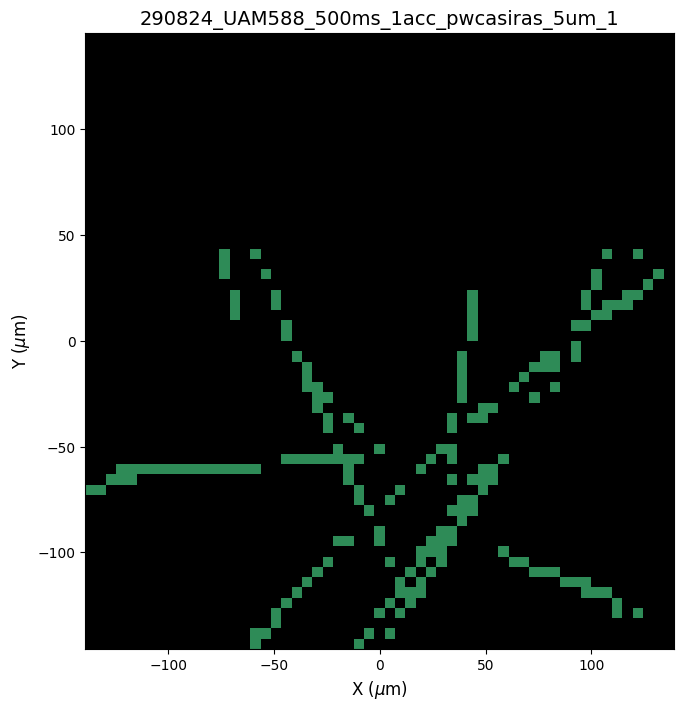


Processing file: 290824_UAM588_500ms_1acc_pwcasiras_5um_2
Valid: 110, Outliers: 0


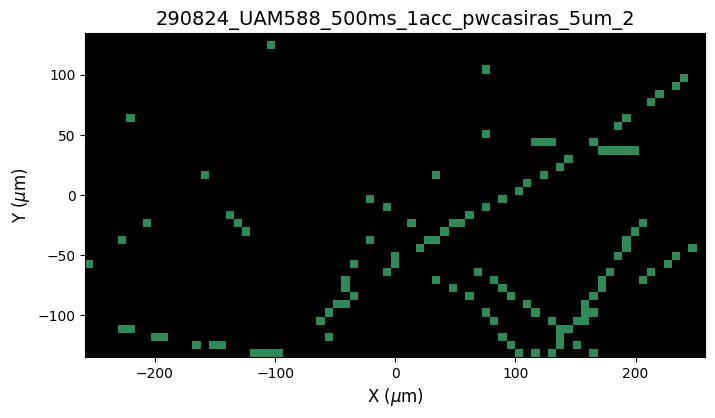


Processing file: 290824_UAM588_500ms_1acc_pwcasiras_5um_3
Valid: 115, Outliers: 0


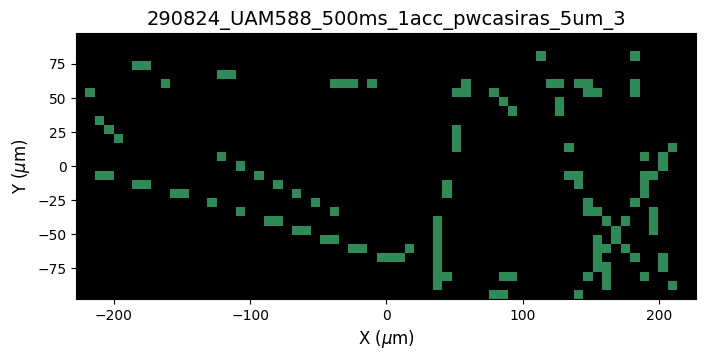


Processing file: 290824_UAM588_500ms_1acc_pwcasiras_5um_4
Valid: 354, Outliers: 0


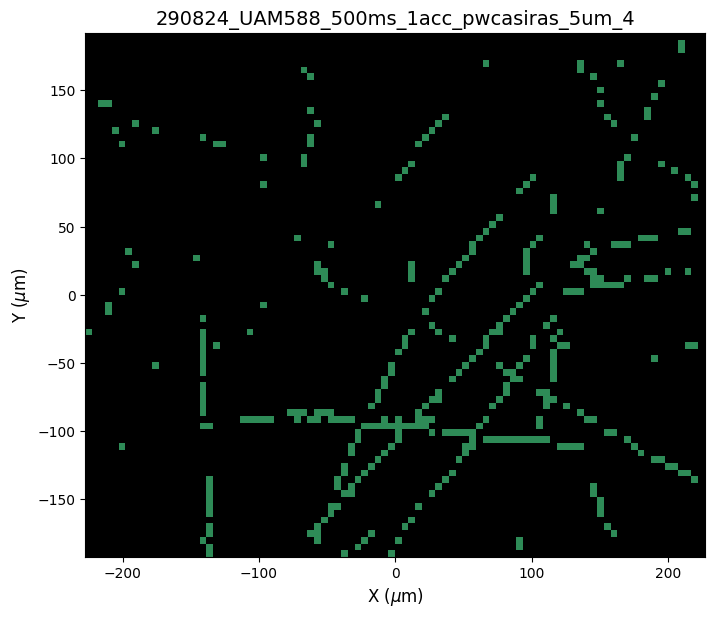

In [7]:

def plot_coordinate_map(group, outliers_indices, df_infomapas, name, custom_cmap):
    """
    Plot a coordinate map based on X and Y values, highlighting outliers.

    Args:
        group (DataFrame): DataFrame containing the group of spectra to plot.
        outliers_indices (list or array): Indices of rows considered as outliers.
        df_infomapas (DataFrame): DataFrame with mapping information including coordinate limits and step sizes.
        name (str): The name or identifier of the file being processed.
        custom_cmap (ListedColormap): Custom colormap for visualizing valid points and outliers.

    Returns:
        None
    """
    # Coordinate map based on the `infomapas` file
    group_infomapas = df_infomapas[df_infomapas['filename'] == name]

    if group_infomapas.empty:
        print(f"No data found in `infomapas` for the file: {name}")
        return

    # Retrieve coordinate limits and step sizes
    X_min = group_infomapas['X_min'].values[0]
    X_max = group_infomapas['X_max'].values[0]
    Y_min = group_infomapas['Y_min'].values[0]
    Y_max = group_infomapas['Y_max'].values[0]
    X_step = group_infomapas['X_step'].values[0]
    Y_step = group_infomapas['Y_step'].values[0]

    # Create a map matrix with known limits and steps
    x_range = np.arange(X_min, X_max + X_step, X_step)
    y_range = np.arange(Y_min, Y_max + Y_step, Y_step)
    mapa = np.full((len(y_range), len(x_range)), -1)  # Initialize the map with black (-1 for missing)

    # Plot the group coordinates on the map
    for index, row in group.iterrows():
        x_coord = row['X']
        y_coord = row['Y']

        # Determine if the index is an outlier
        is_outlier = index in outliers_indices

        # Find positions in the map
        x_idx = np.argmin(np.abs(x_range - x_coord))
        y_idx = np.argmin(np.abs(y_range - y_coord))

        # Assign color: 1 for green (valid), 0 for red (outlier)
        mapa[y_idx, x_idx] = 0 if is_outlier else 1  # Red for outlier, green for valid

    # Plot the map
    plt.figure(figsize=(8, 8))
    plt.imshow(mapa, cmap=custom_cmap, origin='lower', extent=[X_min, X_max, Y_min, Y_max])
    plt.title(f"{name}", fontsize=14)
    plt.xlabel("X ($\\mu$m)", fontsize=12)
    plt.ylabel("Y ($\\mu$m)", fontsize=12)
    plt.show()

# Load the infomapas file
ruta_infomapas = r'C:\Users\fmantecam\OneDrive - UNICAN\RamanNanoBase\FITOPLANCTON_ESPECIES_UAM\TFMjorge\df_filtrados\infomapas.CSV'
df_infomapas = pd.read_csv(ruta_infomapas)

# Custom colormap: black (-1), green (1), red (0)
custom_cmap = ListedColormap(['black', 'red', 'seagreen'])

def process_spectra_and_plot_maps(df_corrected, outliers_indices, df_infomapas, process_title):
    """
    Process a dataset of Raman spectra and plot coordinate maps for each file.

    Args:
        df_corrected (DataFrame): DataFrame containing corrected spectra data.
        outliers_indices (list or array): Indices of rows considered as outliers.
        df_infomapas (DataFrame): DataFrame with mapping information including coordinate limits and step sizes.
        process_title (str): Title describing the dataset being processed (e.g., "Trainval", "Test").

    Returns:
        None
    """
    # Group by 'name' to generate plots and calculate averages per file
    grouped_by_name = df_corrected.groupby('name')

    for name, group in grouped_by_name:
        # Count valid and discarded spectra
        valid_spectra_count = len(group) - sum(group.index.isin(outliers_indices))
        outliers_count = sum(group.index.isin(outliers_indices))

        # Print processing information
        print(f"\nProcessing file: {name}")
        print(f"Valid: {valid_spectra_count}, Outliers: {outliers_count}")
        
        # Generate the coordinate map
        plot_coordinate_map(group, outliers_indices, df_infomapas, name, custom_cmap)

# Call the processing function for trainval and test datasets
process_spectra_and_plot_maps(df, outliers_indices_trainval, df_infomapas, "Trainval")
process_spectra_and_plot_maps(df_test_corrected, outliers_indices_test, df_infomapas, "Test")


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

def plot_coordinate_map_subplots(df_corrected, outliers_indices, df_infomapas, names, custom_cmap):
    # Configuración de subplots 4x4
    fig, axes = plt.subplots(4, 4, figsize=(20, 20))
    axes = axes.flatten()  # Convertir a una lista para iterar fácilmente
    
    # Iterar sobre los nombres proporcionados
    for i, name in enumerate(names):
        if i >= 16:  # Limitar a 4x4 subplots
            break
        
        # Filtrar el DataFrame por el nombre actual
        group = df_corrected[df_corrected['name'] == name]
        group_infomapas = df_infomapas[df_infomapas['filename'] == name]

        if group.empty or group_infomapas.empty:
            print(f"No hay datos para el archivo: {name}")
            axes[i].set_title(f"{name} (No data)")
            axes[i].axis('off')
            continue

        # Extraer límites y pasos del archivo infomapas
        X_min = group_infomapas['X_min'].values[0]
        X_max = group_infomapas['X_max'].values[0]
        Y_min = group_infomapas['Y_min'].values[0]
        Y_max = group_infomapas['Y_max'].values[0]
        X_step = group_infomapas['X_step'].values[0]
        Y_step = group_infomapas['Y_step'].values[0]

        # Crear matriz para el mapa
        x_range = np.arange(X_min, X_max + X_step, X_step)
        y_range = np.arange(Y_min, Y_max + Y_step, Y_step)
        mapa = np.full((len(y_range), len(x_range)), -1)  # Inicializar el mapa

        # Rellenar el mapa con los valores
        for index, row in group.iterrows():
            x_coord = row['X']
            y_coord = row['Y']
            is_outlier = index in outliers_indices

            # Coordenadas en el mapa
            x_idx = np.argmin(np.abs(x_range - x_coord))
            y_idx = np.argmin(np.abs(y_range - y_coord))

            # Asignar valores: 0 (outlier), 1 (válido)
            mapa[y_idx, x_idx] = 0 if is_outlier else 1

        # Graficar en el subplot correspondiente
        ax = axes[i]
        ax.imshow(mapa, cmap=custom_cmap, origin='lower', extent=[X_min, X_max, Y_min, Y_max])
        ax.set_title(f"{name}", fontsize=12)
        ax.set_xlabel("X ($\\mu$m)")
        ax.set_ylabel("Y ($\\mu$m)")

    # Desactivar subplots vacíos
    for j in range(len(names), 16):
        axes[j].axis('off')
    
    plt.tight_layout()
    plt.show()

# Configuración del colormap personalizado
custom_cmap = ListedColormap(['black', 'red', 'seagreen'])

# Lista de nombres de infomapas a graficar

names_to_plot = ['130824_UAM502_500ms_1acc_pwcasi1_6um_7',  '091024_UAM588_500ms_1acc_pwras_1','090824_UAM565_700ms_1acc_pwmuescacasi1_5um_2', '110624_UAM253_1s_1acc_pwmuesca1_5um_1']


names_to_plot = ['130824_UAM502_500ms_1acc_pwcasi1_6um_7', '091024_UAM588_500ms_1acc_pwras_1', '100724_UAM502_500ms_1acc_pwmuesca1',  '220724_UAM588_500ms_pwras_2um_5','090824_UAM565_700ms_1acc_pwmuescacasi1_5um_2', '110624_UAM253_1s_1acc_pwmuesca1_5um_1']

# Llamada a la función
plot_coordinate_map_subplots(df_corrected, outliers_indices_trainval, df_infomapas, names_to_plot, custom_cmap)


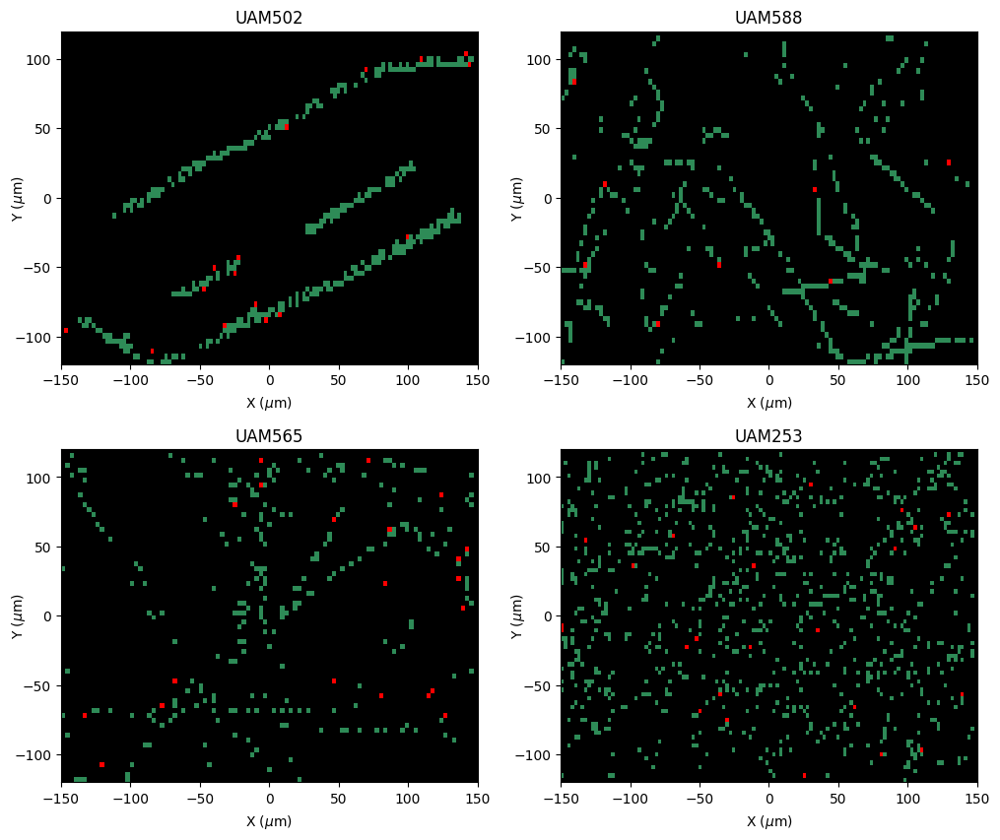

In [52]:

def plot_coordinate_map_subplots_2x2(df_corrected, outliers_indices, df_infomapas, names, custom_cmap):
    # Configuración de subplots 2x2 con espaciado personalizado
    fig, axes = plt.subplots(2, 2, figsize=(12, 12), gridspec_kw={'wspace': 0.2, 'hspace': -0.15})
    axes = axes.flatten()  # Convertir en lista para iterar

    # Iterar sobre los nombres proporcionados
    for i, name in enumerate(names):
        # Filtrar el DataFrame por el nombre actual

        titles = ['UAM502', 'UAM588', 'UAM565', 'UAM253']
        group = df_corrected[df_corrected['name'] == name]
        group_infomapas = df_infomapas[df_infomapas['filename'] == name]

        if group.empty or group_infomapas.empty:
            print(f"No hay datos para el archivo: {name}")
            axes[i].set_title(f"{name} (No data)")
            axes[i].axis('off')
            continue

        # Extraer límites y pasos del archivo infomapas
        X_min = group_infomapas['X_min'].values[0]
        X_max = group_infomapas['X_max'].values[0]
        Y_min = group_infomapas['Y_min'].values[0]
        Y_max = group_infomapas['Y_max'].values[0]
        X_step = group_infomapas['X_step'].values[0]
        Y_step = group_infomapas['Y_step'].values[0]

        # Crear matriz para el mapa
        x_range = np.arange(X_min, X_max + X_step, X_step)
        y_range = np.arange(Y_min, Y_max + Y_step, Y_step)
        mapa = np.full((len(y_range), len(x_range)), -1)  # Inicializar el mapa

        # Rellenar el mapa con los valores
        for index, row in group.iterrows():
            x_coord = row['X']
            y_coord = row['Y']
            is_outlier = index in outliers_indices

            # Coordenadas en el mapa
            x_idx = np.argmin(np.abs(x_range - x_coord))
            y_idx = np.argmin(np.abs(y_range - y_coord))

            # Asignar valores: 0 (outlier), 1 (válido)
            mapa[y_idx, x_idx] = 0 if is_outlier else 1

        # Graficar en el subplot correspondiente
        ax = axes[i]
        im = ax.imshow(mapa, cmap=custom_cmap, origin='lower', extent=[-150, 150, -120, 120])
        ax.set_title(f"{titles[i]}", fontsize=12)
        ax.set_xlabel("X ($\\mu$m)", labelpad=5)
        ax.set_ylabel("Y ($\\mu$m)",    labelpad=-10)

    # Desactivar subplots vacíos si hay menos de 4 nombres
    for j in range(len(names), len(axes)):
        axes[j].axis('off')


    fig.savefig(
    'C:\\Users\\fmantecam\\OneDrive - UNICAN\\Figuraspapercianos\\2Dmaps_outliers.svg',
    format='svg', bbox_inches='tight'
    )
    plt.show()

# Configuración del colormap personalizado
custom_cmap = ListedColormap(['black', 'red', 'seagreen'])

# Lista de nombres de infomapas a graficar
names_to_plot = [
    '100724_UAM502_500ms_1acc_pwmuesca1',
    '091024_UAM588_500ms_1acc_pwras_1',
    '090824_UAM565_700ms_1acc_pwmuescacasi1_5um_2',
    '110624_UAM253_1s_1acc_pwmuesca1_5um_1'
]

# Llamada a la función
plot_coordinate_map_subplots_2x2(df, outliers_indices_trainval, df_infomapas, names_to_plot, custom_cmap)
